In [1]:
from aquacrop.classes import *
from aquacrop.core import *
 
import gym
from gym import spaces
import numpy as np

import pandas as pd
import matplotlib.pyplot as plt
from aquacrop.lars import *

In [2]:
gendf =prepare_lars_weather('CPWG.dat',2018,True,["simyear","jday","minTemp","maxTemp","precip","rad"],wind_speed=7.5)

In [3]:
np.random.randint(1,4)

1

In [3]:
def return_cropenv(chosen_year=0,evaluate=False):
    
    
    class CropEnv(gym.Env):
 
        def __init__(self,wdf=gendf,year1=1,year2=71,crop='Maize',days_to_irr=7,randomize=False,
                     soil='ClayLoam',max_irr=25,eval=evaluate,
                     init_wc=InitWCClass(wc_type='Pct',value=[70]),best=np.ones(1000)*-1000,
                     **kwargs):
            super(CropEnv, self).__init__()    # Define action and observation space

            self.chosen_year=chosen_year
            self.wdf = wdf
            self.days_to_irr=days_to_irr
            self.max_days_to_irr=days_to_irr
            self.randomize = randomize
            self.eval=eval
            self.year1=year1
            self.year2=year2
            if self.eval:
                self.chosen=self.year1
            else:
                self.chosen = np.random.choice([i for i in range(year1,year2+1)])

            self.max_irr=max_irr
            self.init_wc = init_wc
            self.CROP_PRICE=180 # $/TONNE
            self.IRRIGATION_COST=1 # $/HA-MM

            if isinstance(crop,str):
                self.crop = CropClass(crop,PlantingDate='05/01')
            else:
                assert isinstance(crop,CropClass), "crop needs to be 'str' or 'CropClass'"
                self.crop=crop

            if isinstance(soil,str):
                self.soil = SoilClass(soil)
            else:
                assert isinstance(soil,SoilClass), "soil needs to be 'str' or 'SoilClass'"
                self.soil=soil



            self.mean=np.array([2.39125660e-01, 7.73957327e+01, 2.12565152e+02, 5.92577141e-01,
            1.15847432e+03, 2.49335749e+00, 2.05935739e+00, 5.46993889e+00,
            2.04641774e+00, 5.48865204e+00])[:8]


            self.std= np.array([2.07694450e-01, 4.36831569e+01, 1.50945297e+02, 4.04527139e-01,
            1.06115776e+03, 1.06867459e+00, 2.67730881e+00, 1.23278868e+00,
            3.83699245e+00, 1.45402607e+00])[:8]

    #         self.mean=np.array([2.88539428e-01, 7.94580224e+01, 1.99206368e+02, 5.89218420e-01,
    #        1.26751463e+03, 2.55643657e+00]+ [1.92517324e+00, 5.40536026e+00]*8)
    #        1.82798507e+00, 5.46559928e+00, 2.17355410e+00, 5.34665700e+00,
    #        1.87728545e+00, 5.45378290e+00, 1.89319030e+00, 5.50719589e+00,
    #        1.60970149e+00, 5.50599431e+00, 1.77416045e+00, 5.48449029e+00,
    #        1.83791978e+00, 5.42449038e+00])

    #         self.std=np.array([1.97801153e-01, 4.31487806e+01, 1.44570925e+02, 4.06974695e-01,
    #        1.11321328e+03, 1.06618023e+00]+[2.43988832e+00, 1.00537749e+00]*8)
    #        5.89831120e+00, 2.18128617e+00, 6.61706757e+00, 2.11699912e+00,
    #        5.88681346e+00, 2.17194213e+00, 6.06085281e+00, 2.20863742e+00,
    #        4.97025566e+00, 2.14190642e+00, 5.93659944e+00, 2.13049379e+00,
    #        5.51276365e+00, 2.18128858e+00])

    #         self.mean=0
    #         self.std=0
            self.mean=np.array([1.66183527e+01, 7.08764791e+00, 2.69036723e-01, 7.97511342e+01,
           2.00489325e+02, 5.91997656e-01, 1.27211045e+03, 2.55979608e+00,
           2.05846579e+00, 5.41833295e+00])

            self.std = np.array([8.57350394e+00, 1.41681966e+00, 2.05257633e-01, 4.30512092e+01,
           1.49464010e+02, 4.06480036e-01, 1.11386471e+03, 1.06499859e+00,
           2.56973883e+00, 1.02598043e+00])
    
             


            self.best=best*1
            self.total_best=best*1
            self.tsteps=0

    #         self.action_space = spaces.Discrete(3)    
            self.action_space = spaces.Box(low=-1., high=1., shape=(1,), dtype=float)
            self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(10,), dtype=float)

        def states(self):
            return dict(type='float', shape=(10,))

        def actions(self):
            return dict(type='float', num_values=1)

        def reset(self):
            """
            re/initialize model and return first observation
            """
            if not self.eval:

                self.chosen = np.random.choice([i for i in range(self.year1,self.year2+1)])
                self.init_wc=InitWCClass(wc_type='Pct',value=[70])

                self.crop = CropClass('Maize',PlantingDate='05/01')
                month = 5
                day=1

            else:
                self.crop = CropClass('Maize',PlantingDate='05/01')
                self.init_wc=InitWCClass(wc_type='Pct',value=[70])
                month = 5
                day=1

            if not self.eval:
    #             sim_year=int(np.random.choice(np.arange(1,71)))
                sim_year=self.chosen_year

                self.wdf = gendf[gendf.simyear==sim_year].drop('simyear',axis=1)

    #             self.model.weather=gen_weather[sim_year]

            else:
#                 self.wdf = gendf[gendf.simyear==self.year1].drop('simyear',axis=1)
                self.wdf = gendf[gendf.simyear==self.chosen_year].drop('simyear',axis=1)



            self.model = AquaCropModel(f'{2018}/{month}/{day}',f'{2018}/12/31',
                                    self.wdf,self.soil,self.crop,
                                    IrrMngt=IrrMngtClass(IrrMethod=5),
                                    InitWC=self.init_wc,)
            self.model.initialize()

    #         self.model.weather[:,2]=0

            # take 1 step to get us in the season
            dayshift=np.random.randint(1,3)
            self.model.step(dayshift)

            return self.get_obs(self.model.InitCond)

        def get_obs(self,InitCond):
            """
            package the desired variables from InitCond into a numpy array
            and return as observation
            """

            if InitCond.TAW>0:
                dep = InitCond.Depletion/InitCond.TAW
            else:
                dep=0


            start = max(0,self.model.ClockStruct.TimeStepCounter -7)
            end = self.model.ClockStruct.TimeStepCounter
            forecast1 = self.model.weather[start:end,2:4].mean(axis=0).flatten()
            start = self.model.ClockStruct.TimeStepCounter
            end = start+7
            forecast2 = self.model.weather[start:end,2:4].mean(axis=0).flatten()
      
            month = (self.model.ClockStruct.TimeSpan[self.model.ClockStruct.TimeStepCounter]).month
            day = (self.model.ClockStruct.TimeSpan[self.model.ClockStruct.TimeStepCounter]).day

         
            forecast = np.concatenate([forecast1,forecast2]).flatten()
            obs=np.array([day,month,

                          dep,# root-zone depletion
                        #   InitCond.Depletion,# root-zone depletion
                          InitCond.DAP,#days after planting
                          InitCond.IrrCum,
                          InitCond.CC,
                          InitCond.B,
                          InitCond.GrowthStage,

                          ]
                         +[f for f in forecast1]
                         )


            return (obs-self.mean)/self.std


        def step(self,action):
            """
            take in binary action [   irrigation yes (1) or no (0)  ]
            and irrigate to field capacity or max irrigation
            """



    #         if action == 1:
    # #             depth=np.clip(self.model.InitCond.Depletion,0,25)
    #             depth=25
    #         elif action==2:
    #             depth=50
    #         # # elif action==1:
    #         #     depth=9
    #         elif action==0:
    #             depth=0

    #         else:
    #             assert 1==2, "action needs to be 1 or 0"

    #         self.model.ParamStruct.IrrMngt.depth = np.clip(depth*1,0,25)
    #         depth-=25



            # depth = (action)*25
            # if depth<5:
            #     depth=0



            new_smt=np.ones(4)*(action+1)*50

            # total_depth+=depth
            start_day = self.model.InitCond.DAP

            for i in range(self.days_to_irr):

    #             self.model.step()
    #             self.model.ParamStruct.IrrMngt.depth = np.clip(depth*1,0,25)
    #             depth-=25

                if self.model.InitCond.TAW>0:
                    dep = self.model.InitCond.Depletion/self.model.InitCond.TAW
                else:
                    dep=0

                gs = int(self.model.InitCond.GrowthStage)-1
                if gs<0 or gs>3:
                    depth=0
                else:
    #                 if 1-dep< self.av2smt[gs]/100:
                    if 1-dep< (new_smt[gs])/100:
    #                 if 1-dep<smt/100:
                        depth = np.clip(self.model.InitCond.Depletion,0,25)
                    else:
                        depth=0

    #             dep_list.append(dep)
    #             irr_list.append(depth)
    #             rain_list.append(self.model.InitCond.P)
    #             opt_smt_list.append([47.6,61.2,36.15,0][gs])

                self.model.ParamStruct.IrrMngt.depth = depth

                self.model.step()



                if self.model.ClockStruct.ModelTermination:
                    break

                now_day = self.model.InitCond.DAP
                if (now_day >0) and (now_day<start_day):
                    break


            done = self.model.ClockStruct.ModelTermination

            reward = 0

            next_obs = self.get_obs(self.model.InitCond)

            if done:
                self.tsteps+=1

                # calculate profit 
                end_reward = self.CROP_PRICE*self.model.Outputs.Final['Yield (tonne/ha)'].mean() \
                - self.IRRIGATION_COST*self.model.Outputs.Final['Seasonal irrigation (mm)'].mean() -1728

                self.reward=end_reward

                rew = end_reward - self.total_best[self.chosen-1] 
                if rew>0:
                    self.best[self.chosen-1]=end_reward
                if self.tsteps%100==0:
                    self.total_best=self.best*1
                    print(self.tsteps,self.best[:70].mean())
                    # print(self.model.Outputs.Final)

    #             if self.tsteps%1000==0:

    #                 result_df = pd.DataFrame([proftrain,proftest]).T
    #                 result_df.to_csv('ppo_70_smtscale_day1.csv')
    #                 result_df.rolling(10).mean().plot()
    #                 plt.show()

                if self.eval:
                    reward=end_reward*1000

                else:
    #                 reward=rew
                    reward=end_reward


            return next_obs,reward/1000,done,dict()



        def get_mean_std(self,num_reps):
            """
            Function to get the mean and std of observations in an environment

            *Arguments:*

            `env`: `Env` : chosen environment
            `num_reps`: `int` : number of repetitions

            *Returns:*

            `mean`: `float` : mean of observations
            `std`: `float` : std of observations

            """
            self.mean=0
            self.std=1
            obs=[]
            for i in range(num_reps):
                self.reset()

                d=False
                while not d:

                    ob,r,d,_=self.step(np.random.choice([0,1],p=[0.9,0.1]))
                    # ob,r,d,_=self.step(-0.5)
                    # ob,r,d,_=self.step(np.random.choice([-1.,0.],p=[0.9,0.1]))
                    obs.append(ob)

            obs=np.vstack(obs)

            mean=obs.mean(axis=0)

            std=obs.std(axis=0)
            std[std==0]=1

            self.mean=mean
            self.std=std

    return CropEnv

In [5]:
# class CropEnv(gym.Env):
 
#     def __init__(self,wdf=gendf,year1=1,year2=71,crop='Maize',days_to_irr=7,randomize=False,
#                  soil='ClayLoam',max_irr=25,eval=False,
#                  init_wc=InitWCClass(wc_type='Pct',value=[70]),best=np.ones(1000)*-1000,chosen_year=0,
#                  **kwargs):
#         super(CropEnv, self).__init__()    # Define action and observation space
        
#         self.chosen_year=chosen_year
#         self.wdf = wdf
#         self.days_to_irr=days_to_irr
#         self.max_days_to_irr=days_to_irr
#         self.randomize = randomize
#         self.eval=eval
#         self.year1=year1
#         self.year2=year2
#         if self.eval:
#             self.chosen=self.year1
#         else:
#             self.chosen = np.random.choice([i for i in range(year1,year2+1)])
 
#         self.max_irr=max_irr
#         self.init_wc = init_wc
#         self.CROP_PRICE=180 # $/TONNE
#         self.IRRIGATION_COST=1 # $/HA-MM
 
#         if isinstance(crop,str):
#             self.crop = CropClass(crop,PlantingDate='05/01')
#         else:
#             assert isinstance(crop,CropClass), "crop needs to be 'str' or 'CropClass'"
#             self.crop=crop
            
#         if isinstance(soil,str):
#             self.soil = SoilClass(soil)
#         else:
#             assert isinstance(soil,SoilClass), "soil needs to be 'str' or 'SoilClass'"
#             self.soil=soil
     
    
 
#         self.mean=np.array([2.39125660e-01, 7.73957327e+01, 2.12565152e+02, 5.92577141e-01,
#         1.15847432e+03, 2.49335749e+00, 2.05935739e+00, 5.46993889e+00,
#         2.04641774e+00, 5.48865204e+00])[:8]

        
#         self.std= np.array([2.07694450e-01, 4.36831569e+01, 1.50945297e+02, 4.04527139e-01,
#         1.06115776e+03, 1.06867459e+00, 2.67730881e+00, 1.23278868e+00,
#         3.83699245e+00, 1.45402607e+00])[:8]
        
# #         self.mean=np.array([2.88539428e-01, 7.94580224e+01, 1.99206368e+02, 5.89218420e-01,
# #        1.26751463e+03, 2.55643657e+00]+ [1.92517324e+00, 5.40536026e+00]*8)
# #        1.82798507e+00, 5.46559928e+00, 2.17355410e+00, 5.34665700e+00,
# #        1.87728545e+00, 5.45378290e+00, 1.89319030e+00, 5.50719589e+00,
# #        1.60970149e+00, 5.50599431e+00, 1.77416045e+00, 5.48449029e+00,
# #        1.83791978e+00, 5.42449038e+00])
        
# #         self.std=np.array([1.97801153e-01, 4.31487806e+01, 1.44570925e+02, 4.06974695e-01,
# #        1.11321328e+03, 1.06618023e+00]+[2.43988832e+00, 1.00537749e+00]*8)
# #        5.89831120e+00, 2.18128617e+00, 6.61706757e+00, 2.11699912e+00,
# #        5.88681346e+00, 2.17194213e+00, 6.06085281e+00, 2.20863742e+00,
# #        4.97025566e+00, 2.14190642e+00, 5.93659944e+00, 2.13049379e+00,
# #        5.51276365e+00, 2.18128858e+00])
        
# #         self.mean=0
# #         self.std=0
 

#         self.best=best*1
#         self.total_best=best*1
#         self.tsteps=0
        
# #         self.action_space = spaces.Discrete(3)    
#         self.action_space = spaces.Box(low=-1., high=1., shape=(1,), dtype=float)
#         self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(8,), dtype=float)
        
#     def states(self):
#         return dict(type='float', shape=(8,))
 
#     def actions(self):
#         return dict(type='float', num_values=1)
        
#     def reset(self):
#         """
#         re/initialize model and return first observation
#         """
#         if not self.eval:

#             self.chosen = np.random.choice([i for i in range(self.year1,self.year2+1)])
#             self.init_wc=InitWCClass(wc_type='Pct',value=[70])
 
#             self.crop = CropClass('Maize',PlantingDate='05/01')
#             month = 5
#             day=1

#         else:
#             self.crop = CropClass('Maize',PlantingDate='05/01')
#             self.init_wc=InitWCClass(wc_type='Pct',value=[70])
#             month = 5
#             day=1

#         if not self.eval:
# #             sim_year=int(np.random.choice(np.arange(1,71)))
#             sim_year=self.chosen_year
            
#             self.wdf = gendf[gendf.simyear==sim_year].drop('simyear',axis=1)

# #             self.model.weather=gen_weather[sim_year]

#         else:
#             self.wdf = gendf[gendf.simyear==self.year1].drop('simyear',axis=1)
# #             self.wdf = gendf[gendf.simyear==71].drop('simyear',axis=1)

            
            
#         self.model = AquaCropModel(f'{2018}/{month}/{day}',f'{2018}/12/31',
#                                 self.wdf,self.soil,self.crop,
#                                 IrrMngt=IrrMngtClass(IrrMethod=5),
#                                 InitWC=self.init_wc,)
#         self.model.initialize()

# #         self.model.weather[:,2]=0

#         # take 1 step to get us in the season
#         dayshift=np.random.randint(1,3)
#         self.model.step(dayshift)
 
#         return self.get_obs(self.model.InitCond)
 
#     def get_obs(self,InitCond):
#         """
#         package the desired variables from InitCond into a numpy array
#         and return as observation
#         """
 
#         if InitCond.TAW>0:
#             dep = InitCond.Depletion/InitCond.TAW
#         else:
#             dep=0


#         start = max(0,self.model.ClockStruct.TimeStepCounter -7)
#         end = self.model.ClockStruct.TimeStepCounter
#         forecast1 = self.model.weather[start:end,2:4].mean(axis=0).flatten()
#         start = self.model.ClockStruct.TimeStepCounter
#         end = start+7
#         forecast2 = self.model.weather[start:end,2:4].mean(axis=0).flatten()
 
#         forecast = np.concatenate([forecast1,forecast2]).flatten()
#         obs=np.array([
                      
#                       dep,# root-zone depletion
#                     #   InitCond.Depletion,# root-zone depletion
#                       InitCond.DAP,#days after planting
#                       InitCond.IrrCum,
#                       InitCond.CC,
#                       InitCond.B,
#                       InitCond.GrowthStage,
                      
#                       ]
#                      +[f for f in forecast1]
#                      )
        
 
#         return (obs-self.mean)/self.std
        
        
#     def step(self,action):
#         """
#         take in binary action [   irrigation yes (1) or no (0)  ]
#         and irrigate to field capacity or max irrigation
#         """

 
 
# #         if action == 1:
# # #             depth=np.clip(self.model.InitCond.Depletion,0,25)
# #             depth=25
# #         elif action==2:
# #             depth=50
# #         # # elif action==1:
# #         #     depth=9
# #         elif action==0:
# #             depth=0

# #         else:
# #             assert 1==2, "action needs to be 1 or 0"
 
# #         self.model.ParamStruct.IrrMngt.depth = np.clip(depth*1,0,25)
# #         depth-=25



#         # depth = (action)*25
#         # if depth<5:
#         #     depth=0



#         new_smt=np.ones(4)*(action+1)*50

#         # total_depth+=depth
#         start_day = self.model.InitCond.DAP
 
#         for i in range(self.days_to_irr):
 
# #             self.model.step()
# #             self.model.ParamStruct.IrrMngt.depth = np.clip(depth*1,0,25)
# #             depth-=25

#             if self.model.InitCond.TAW>0:
#                 dep = self.model.InitCond.Depletion/self.model.InitCond.TAW
#             else:
#                 dep=0

#             gs = int(self.model.InitCond.GrowthStage)-1
#             if gs<0 or gs>3:
#                 depth=0
#             else:
# #                 if 1-dep< self.av2smt[gs]/100:
#                 if 1-dep< (new_smt[gs])/100:
# #                 if 1-dep<smt/100:
#                     depth = np.clip(self.model.InitCond.Depletion,0,25)
#                 else:
#                     depth=0

# #             dep_list.append(dep)
# #             irr_list.append(depth)
# #             rain_list.append(self.model.InitCond.P)
# #             opt_smt_list.append([47.6,61.2,36.15,0][gs])
 
#             self.model.ParamStruct.IrrMngt.depth = depth
 
#             self.model.step()
 
  
 
#             if self.model.ClockStruct.ModelTermination:
#                 break

#             now_day = self.model.InitCond.DAP
#             if (now_day >0) and (now_day<start_day):
#                 break
 
 
#         done = self.model.ClockStruct.ModelTermination
        
#         reward = 0
 
#         next_obs = self.get_obs(self.model.InitCond)
 
#         if done:
#             self.tsteps+=1

#             # calculate profit 
#             end_reward = self.CROP_PRICE*self.model.Outputs.Final['Yield (tonne/ha)'].mean() \
#             - self.IRRIGATION_COST*self.model.Outputs.Final['Seasonal irrigation (mm)'].mean() -1728
            
#             self.reward=end_reward
 
#             rew = end_reward - self.total_best[self.chosen-1] 
#             if rew>0:
#                 self.best[self.chosen-1]=end_reward
#             if self.tsteps%100==0:
#                 self.total_best=self.best*1
#                 print(self.tsteps,self.best[:70].mean())
#                 # print(self.model.Outputs.Final)
            
# #             if self.tsteps%1000==0:

# #                 result_df = pd.DataFrame([proftrain,proftest]).T
# #                 result_df.to_csv('ppo_70_smtscale_day1.csv')
# #                 result_df.rolling(10).mean().plot()
# #                 plt.show()

#             if self.eval:
#                 reward=end_reward*1000

#             else:
# #                 reward=rew
#                 reward=end_reward
 
 
#         return next_obs,reward/1000,done,dict()
 
 
    
#     def get_mean_std(self,num_reps):
#         """
#         Function to get the mean and std of observations in an environment
 
#         *Arguments:*
 
#         `env`: `Env` : chosen environment
#         `num_reps`: `int` : number of repetitions
 
#         *Returns:*
 
#         `mean`: `float` : mean of observations
#         `std`: `float` : std of observations
 
#         """
#         self.mean=0
#         self.std=1
#         obs=[]
#         for i in range(num_reps):
#             self.reset()
 
#             d=False
#             while not d:
 
#                 ob,r,d,_=self.step(np.random.choice([0,1],p=[0.9,0.1]))
#                 # ob,r,d,_=self.step(-0.5)
#                 # ob,r,d,_=self.step(np.random.choice([-1.,0.],p=[0.9,0.1]))
#                 obs.append(ob)
 
#         obs=np.vstack(obs)
 
#         mean=obs.mean(axis=0)
 
#         std=obs.std(axis=0)
#         std[std==0]=1
 
#         self.mean=mean
#         self.std=std

In [ ]:
env=CropEnv()
env.get_mean_std(100)

In [ ]:
env.mean

In [ ]:
env.std

In [4]:
import ray
# from ray.rllib.agents.ppo import PPOTrainer, DEFAULT_CONFIG
from ray.tune.logger import pretty_print

/home/mbyx3tk2/anaconda3/envs/paper2ray/lib/python3.7/site-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
  "update your install command.", FutureWarning)


In [5]:
ray.init(num_cpus=8, ignore_reinit_error=True, log_to_driver=False)

2021-10-19 14:25:32,611	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265


{'node_ip_address': '192.168.1.128',
 'raylet_ip_address': '192.168.1.128',
 'redis_address': '192.168.1.128:6379',
 'object_store_address': '/tmp/ray/session_2021-10-19_14-25-31_707184_5721/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2021-10-19_14-25-31_707184_5721/sockets/raylet',
 'webui_url': '127.0.0.1:8265',
 'session_dir': '/tmp/ray/session_2021-10-19_14-25-31_707184_5721',
 'metrics_export_port': 63284,
 'node_id': '07f86daa8bb11163d652d9857c37bcca0337db739aa26c2c86535443'}

In [6]:
# from ray.rllib.agents.impala import ImpalaTrainer, DEFAULT_CONFIG
# from ray.rllib.agents.sac import SACTrainer, DEFAULT_CONFIG
from ray.rllib.agents.ppo import PPOTrainer, DEFAULT_CONFIG


In [7]:
config = DEFAULT_CONFIG.copy()
config['num_workers'] = 16
# config['num_envs_per_worker'] = 8
# config['num_sgd_iter'] = 30
# config['lr'] = 3e-5
# config['sgd_minibatch_size'] = 1028
config['train_batch_size'] = 1028
config['model']['fcnet_hiddens'] = [128]*4
config['num_cpus_per_worker'] = 0  # This avoids running out of resources in the notebook environment when this cell is re-executed
config['framework'] = 'torch'
config['gamma'] = 0.99999
# config['model']['use_lstm'] = True
# config['model']['lstm_cell_size'] = 64
# config['model']['max_seq_len'] = 40

In [ ]:
config = DEFAULT_CONFIG.copy()
config['num_workers'] = 8
# config['num_envs_per_worker'] = 8
# config['num_sgd_iter'] = 30
config['lr'] = 3e-5
# config['sgd_minibatch_size'] = 1028
config['train_batch_size'] = 1028
config['Q_model']['fcnet_hiddens'] = [128]*4
config['policy_model']['fcnet_hiddens'] = [128]*4
config['num_cpus_per_worker'] = 0  # This avoids running out of resources in the notebook environment when this cell is re-executed
config['framework'] = 'torch'
config['gamma'] = 0.99999
config['target_network_update_freq'] = 1

# config['model']['use_lstm'] = True
# config['model']['lstm_cell_size'] = 64
# config['model']['max_seq_len'] = 17

In [8]:
from functools import partial

In [ ]:
agent.compute_action??

In [ ]:

# proftrain=[]
# proftest=[]
# timesteps=[]

# def evaluate_crop(test_agent,ts):
    
#     global proftrain,proftest,timesteps
    
#     train_reward=0
#     test_reward=0
#     for i in range(100):

#         eval_env = CropEnv(year1=i+1,year2=i+1,eval=True)

#         state = eval_env.reset()

#         done = False
#         cumulative_reward = 0
#         hidden_state=[np.zeros(64, np.float32),
#                np.zeros(64, np.float32)]
#         while not done:
#             action,hidden_state,logits = test_agent.compute_action(state,hidden_state)
# #             action = test_agent.compute_action(state)
#             state, reward, done, _ = eval_env.step(action)
#             cumulative_reward += reward

        
#         if i<70:
#             train_reward+=cumulative_reward
#         else:
#             test_reward+=cumulative_reward

#     print(f'Train:{round(train_reward/70,3)}')
#     print(f'Test:{round(test_reward/30,3)}')
    
#     proftrain.append(train_reward/70)
#     proftest.append(test_reward/30)
#     timesteps.append(ts)
        


In [9]:

proftrain=[]
proftest=[]
timesteps=[]

def evaluate_crop_single(test_agent,ts,cyear):
    
    global proftrain,proftest,timesteps
    
    train_reward=0
    test_reward=0
    for i in range(5):

#         eval_env = CropEnv(year1=cyear,year2=cyear,eval=True)
        eval_env = return_cropenv(cyear,True)()

        state = eval_env.reset()

        done = False
        cumulative_reward = 0
        hidden_state=[np.zeros(64, np.float32),
               np.zeros(64, np.float32)]
        while not done:
#             action,hidden_state,logits = test_agent.compute_action(state,hidden_state)
            action = test_agent.compute_action(state)
            state, reward, done, _ = eval_env.step(action)
            cumulative_reward += reward

        
        train_reward+=cumulative_reward


    print(f'Train:{round(train_reward/5,3)}')
    
    proftrain.append(train_reward/5)
    timesteps.append(ts)
        


In [ ]:
# class SingleCropEnv(CropEnv):
 
#     def __init__(self,chosen_year=71):
#         super(CropEnv, self).__init__()    # Define action and observation space
 
#         self.chosen_year=chosen_year
    
# agent = PPOTrainer(config, SingleCropEnv)


In [ ]:
agent = PPOTrainer(config, CropEnv)
# agent = SACTrainer(config, CropEnv)


In [ ]:
checkpoint_path

In [ ]:
agent.restore(checkpoint_path)

In [ ]:
agent.__dict__

In [ ]:
result

In [12]:
ray.init(num_cpus=8, ignore_reinit_error=True, log_to_driver=False)    


2021-10-19 14:36:20,621	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265


{'node_ip_address': '192.168.1.128',
 'raylet_ip_address': '192.168.1.128',
 'redis_address': '192.168.1.128:6379',
 'object_store_address': '/tmp/ray/session_2021-10-19_14-36-19_829171_8896/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2021-10-19_14-36-19_829171_8896/sockets/raylet',
 'webui_url': '127.0.0.1:8265',
 'session_dir': '/tmp/ray/session_2021-10-19_14-36-19_829171_8896',
 'metrics_export_port': 56702,
 'node_id': '402ae5561b655481412bbc4a62dc76e0bfb3b56ae0f7d9d9631c9023'}

In [13]:
ray.shutdown()


2021-10-19 14:37:28,421	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 14:37:29,839	INFO trainer.py:696 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
2021-10-19 14:38:22,549	INFO trainable.py:104 -- Trainable.setup took 52.738 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 14:38:22,550	WARNING util.py:53 -- Install gputil for GPU system monitoring.
2021-10-19 14:38:24,636	WARNING deprecation.py:34 -- DeprecationWarning: `SampleBatch.data[..]` has been deprecated. Use `SampleBatch[..]` instead. This will raise an error in the future!


Train:299.731
Train:318.54
Train:322.123
Train:453.029
Train:448.602
Train:468.649
Train:455.58
Train:482.373
Train:475.172
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000010/checkpoint-10


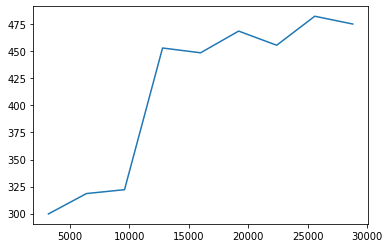

Train:469.864
Train:493.994
Train:485.802
Train:499.928
Train:515.395
Train:502.281
Train:510.608
Train:510.683
Train:523.323
Train:519.51
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000020/checkpoint-20


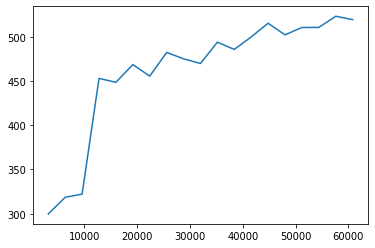

Train:522.771
Train:516.473
Train:520.912
Train:521.041
Train:513.501
Train:519.141
Train:523.988
Train:519.367
Train:524.001
Train:526.546
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000030/checkpoint-30


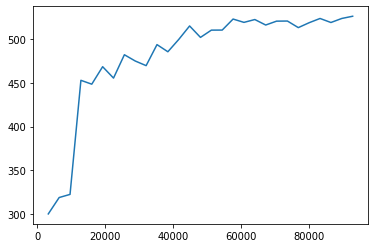

Train:522.867
Train:522.464
Train:523.665
Train:526.735
Train:526.525
Train:526.691
Train:524.99
Train:525.488
Train:523.423
Train:525.441
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000040/checkpoint-40


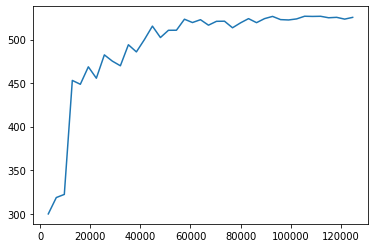

Train:523.41
Train:528.809
Train:528.225
Train:527.55
Train:517.635
Train:524.432
Train:526.712
Train:528.318
Train:525.638
Train:526.183
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000050/checkpoint-50


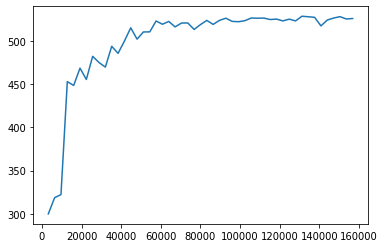

Train:530.914
Train:528.087
Train:526.229
Train:529.151
Train:524.886
Train:528.826
Train:526.326
Train:522.823
Train:528.295
Train:528.803
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000060/checkpoint-60


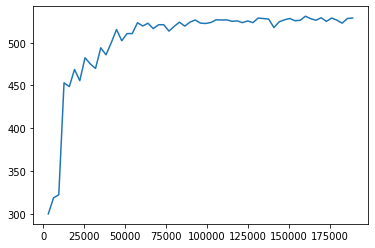

Train:528.295
Train:528.459
Train:524.285
Train:528.784
Train:536.494
Train:531.833
Train:533.53
Train:525.571
Train:530.656
Train:526.671
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000070/checkpoint-70


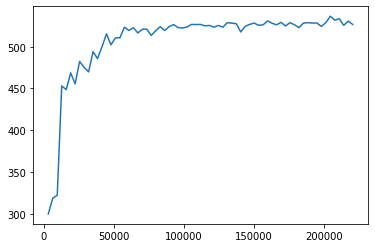

Train:532.898
Train:528.041
Train:526.778
Train:528.333
Train:528.214
Train:526.891
Train:529.38
Train:525.153
Train:524.809
Train:529.474
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000080/checkpoint-80


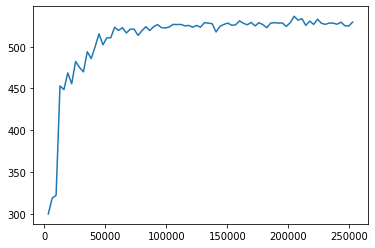

Train:527.126
Train:530.64
Train:526.896
Train:528.282
Train:529.281
Train:528.043
Train:526.0
Train:535.261
Train:525.899
Train:533.887
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000090/checkpoint-90


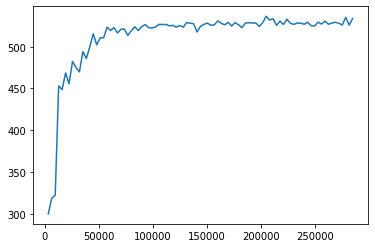

Train:522.725
Train:528.217
Train:532.759
Train:531.818
Train:534.171
Train:524.576
Train:529.454
Train:527.141
Train:524.327
Train:529.454
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000100/checkpoint-100


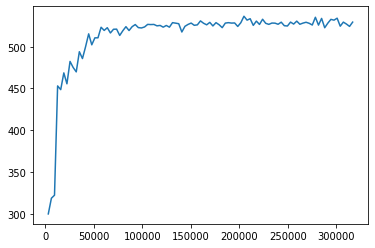

Train:531.818
Train:527.131
Train:531.818
Train:522.628
Train:532.984
Train:528.298
Train:529.495
Train:527.066
Train:525.38
Train:536.494
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000110/checkpoint-110


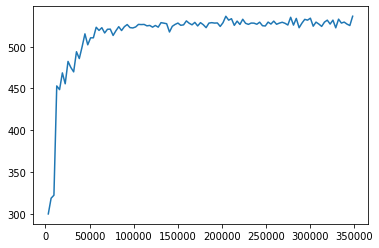

Train:529.407
Train:528.235
Train:529.479
Train:536.494
Train:534.156
Train:530.6
Train:529.51
Train:534.171
Train:531.833
Train:531.818
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000120/checkpoint-120


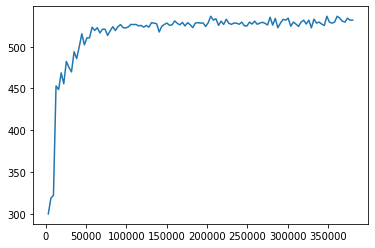

Train:530.521
Train:526.661
Train:527.468
Train:529.495
Train:529.526
Train:534.156
Train:527.141
Train:524.833
Train:524.818
Train:530.661
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000130/checkpoint-130


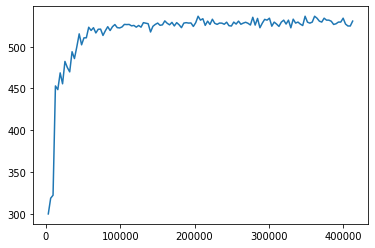

Train:527.135
Train:531.818
Train:529.51
Train:529.51
Train:530.6
Train:525.939
Train:527.156
Train:534.156
Train:526.54
Train:528.302
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000140/checkpoint-140


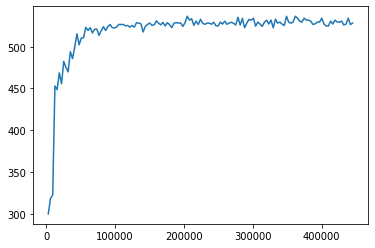

Train:530.635
Train:527.126
Train:525.358
Train:524.864
Train:531.812
Train:529.489
Train:529.449
Train:529.474
Train:529.468
Train:525.984
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000150/checkpoint-150


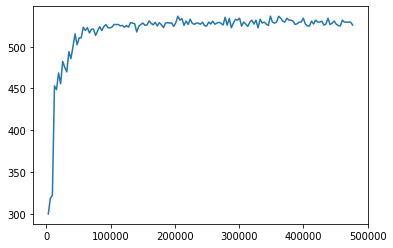

Train:529.474
Train:529.487
Train:527.175
Train:534.156
Train:527.166
Train:528.863
Train:530.635
Train:528.323
Train:529.464
Train:529.423
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000160/checkpoint-160


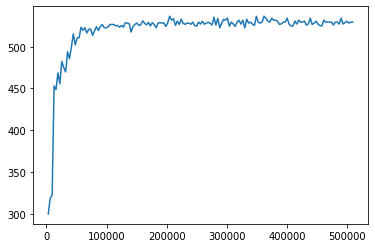

Train:528.293
Train:530.595
Train:528.333
Train:531.661
Train:527.172
Train:531.833
Train:531.705
Train:532.939
Train:529.479
Train:527.156
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000170/checkpoint-170


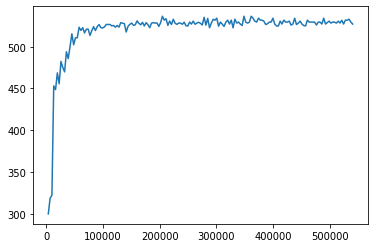

Train:534.156
Train:534.156
Train:532.252
Train:522.2
Train:527.498
Train:528.313
Train:531.833
Train:531.848
Train:533.802
Train:534.171
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000180/checkpoint-180


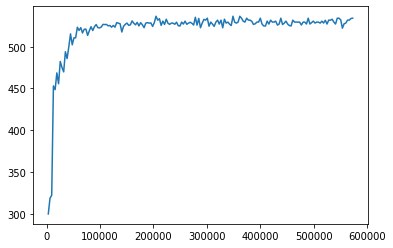

Train:527.141
Train:524.833
Train:529.495
Train:529.51
Train:529.51
Train:529.526
Train:529.479
Train:529.526
Train:529.51
Train:531.848
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000190/checkpoint-190


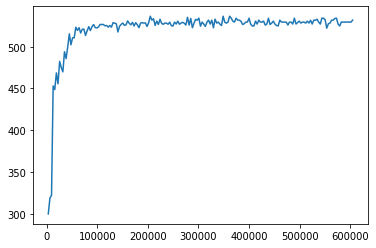

Train:527.156
Train:529.51
Train:527.172
Train:529.526
Train:527.156
Train:529.51
Train:527.156
Train:529.526
Train:531.833
Train:534.171
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000200/checkpoint-200


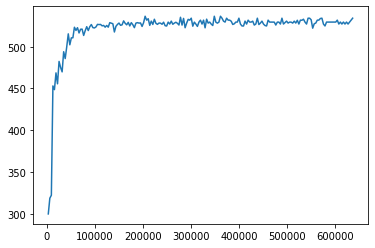

Train:527.203
Train:530.677
Train:534.171
Train:527.203
Train:529.526
Train:528.868
Train:534.171
Train:527.203
Train:529.526
Train:534.156
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000210/checkpoint-210


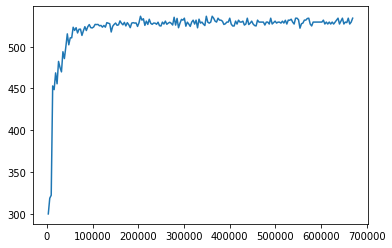

Train:535.626
Train:527.187
Train:528.218
Train:536.494
Train:529.51
Train:530.585
Train:531.833
Train:531.833
Train:531.848
Train:526.0
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000220/checkpoint-220


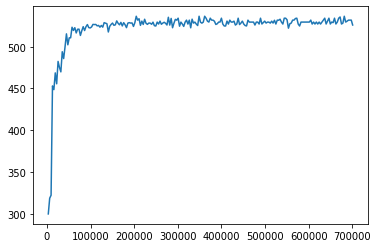

Train:534.171
Train:529.51
Train:529.495
Train:534.156
Train:531.833
Train:531.833
Train:524.864
Train:534.156
Train:527.203
Train:521.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000230/checkpoint-230


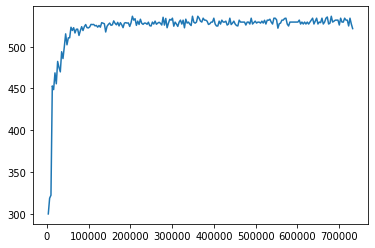

Train:530.661
Train:529.479
Train:529.51
Train:531.936
Train:529.51
Train:529.546
Train:531.833
Train:524.864
Train:531.818
Train:524.013
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000240/checkpoint-240


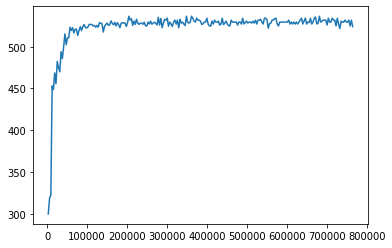

Train:531.833
Train:527.187
Train:529.51
Train:527.203
Train:530.616
Train:529.526
Train:527.203
Train:531.833
Train:531.848
Train:534.171
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000250/checkpoint-250


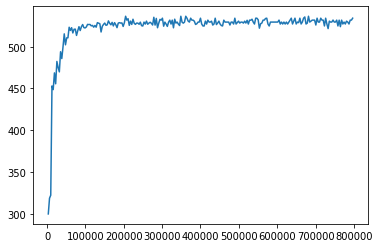

Train:527.187
Train:527.187
Train:534.171
Train:529.51
Train:534.171
Train:531.833
Train:529.526
Train:527.203
Train:527.203
Train:530.6
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000260/checkpoint-260


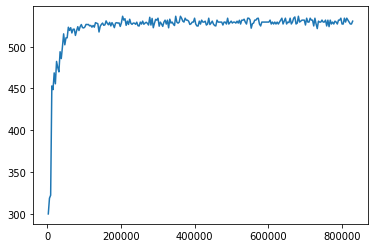

Train:529.526
Train:527.187
Train:531.848
Train:531.848
Train:530.616
Train:529.51
Train:529.526
Train:529.526
Train:534.171
Train:531.848
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000270/checkpoint-270


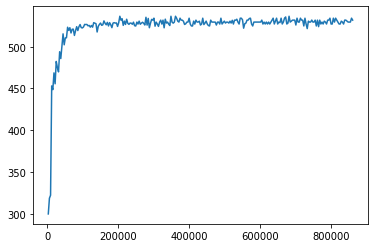

Train:527.187
Train:528.293
Train:534.171
Train:528.277
Train:528.719
Train:524.88
Train:529.24
Train:527.203
Train:531.833
Train:529.367
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000280/checkpoint-280


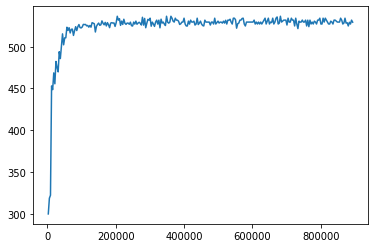

Train:528.293
Train:527.203
Train:529.809
Train:534.171
Train:531.848
Train:529.51
Train:534.171
Train:534.156
Train:529.51
Train:527.187
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000290/checkpoint-290


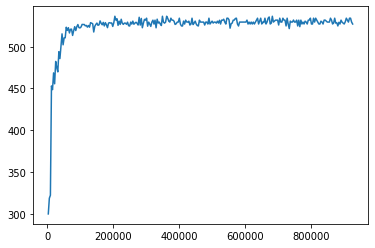

Train:534.156
Train:531.833
Train:530.616
Train:531.848
Train:531.848
Train:529.526
Train:531.848
Train:531.848
Train:534.171
Train:529.526
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000300/checkpoint-300


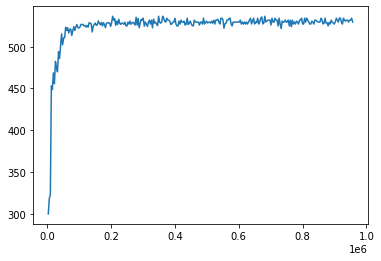

Train:531.848
Train:534.171
Train:531.833
Train:534.171
Train:529.526
Train:527.203
Train:526.015
Train:531.848
Train:529.526
Train:534.171
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000310/checkpoint-310


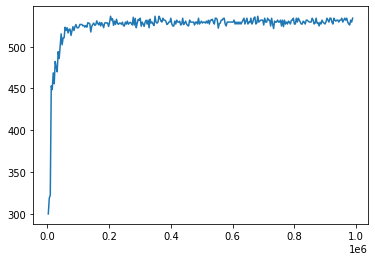

Train:527.203
Train:529.526
Train:527.187
Train:536.494
Train:529.526
Train:532.999
Train:531.848
Train:536.494
Train:527.203
Train:531.848
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_14-37-29yea6iatd/checkpoint_000320/checkpoint-320


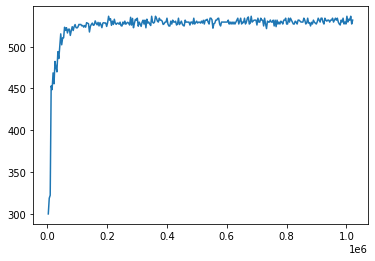

2021-10-19 15:11:00,403	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 15:11:53,841	INFO trainable.py:104 -- Trainable.setup took 53.018 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 15:11:53,842	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:237.393
Train:269.31
Train:245.044
Train:316.833
Train:319.189
Train:350.069
Train:361.492
Train:387.949
Train:393.125
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000010/checkpoint-10


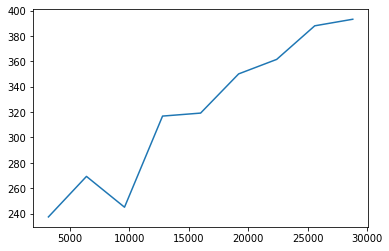

Train:397.396
Train:412.055
Train:407.876
Train:415.262
Train:403.438
Train:412.348
Train:406.485
Train:427.472
Train:425.215
Train:434.452
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000020/checkpoint-20


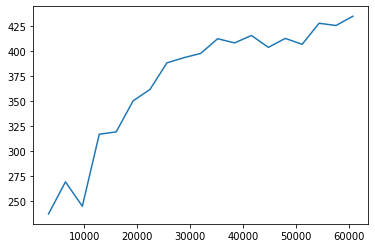

Train:425.073
Train:429.838
Train:439.789
Train:433.94
Train:444.153
Train:433.082
Train:435.465
Train:436.772
Train:437.78
Train:438.501
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000030/checkpoint-30


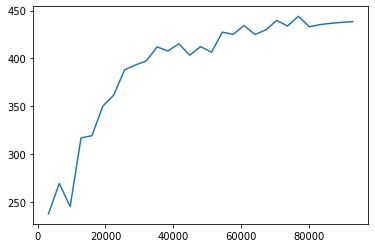

Train:445.376
Train:441.511
Train:439.984
Train:438.304
Train:440.746
Train:443.721
Train:447.126
Train:443.626
Train:443.569
Train:445.158
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000040/checkpoint-40


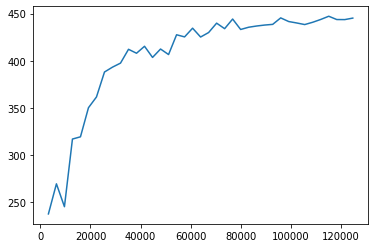

Train:441.902
Train:439.31
Train:445.273
Train:443.754
Train:444.427
Train:445.835
Train:450.14
Train:440.953
Train:448.053
Train:447.164
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000050/checkpoint-50


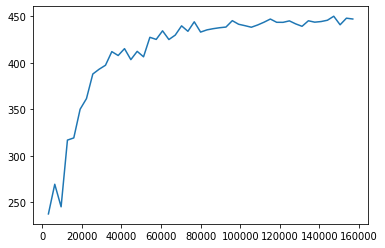

Train:442.047
Train:448.801
Train:442.336
Train:443.81
Train:447.973
Train:450.21
Train:446.965
Train:447.04
Train:445.057
Train:448.725
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000060/checkpoint-60


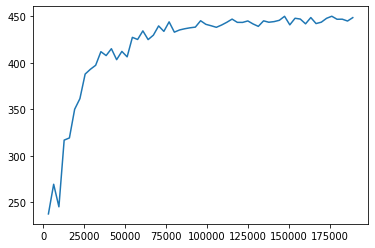

Train:449.63
Train:446.181
Train:449.215
Train:447.757
Train:448.863
Train:449.308
Train:448.209
Train:449.366
Train:448.849
Train:447.25
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000070/checkpoint-70


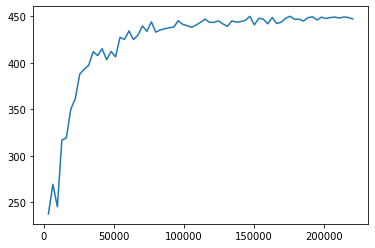

Train:451.124
Train:448.225
Train:449.365
Train:445.794
Train:447.705
Train:450.551
Train:449.194
Train:450.369
Train:448.044
Train:448.536
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000080/checkpoint-80


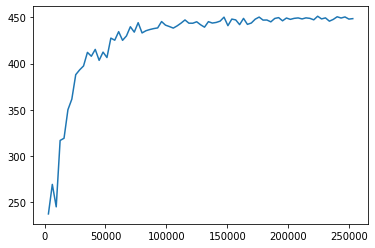

Train:450.823
Train:450.513
Train:450.272
Train:451.581
Train:452.864
Train:447.522
Train:451.581
Train:449.787
Train:452.521
Train:450.293
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000090/checkpoint-90


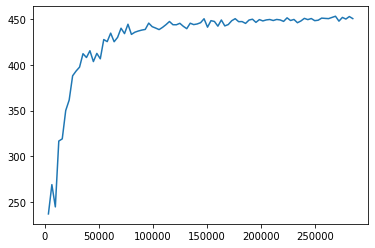

Train:452.309
Train:450.528
Train:452.414
Train:451.453
Train:451.81
Train:452.051
Train:451.574
Train:451.012
Train:451.02
Train:450.975
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000100/checkpoint-100


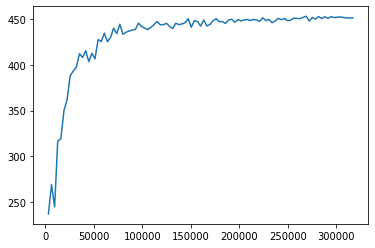

Train:452.417
Train:451.764
Train:452.199
Train:450.299
Train:450.191
Train:451.477
Train:451.038
Train:445.891
Train:451.405
Train:451.801
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000110/checkpoint-110


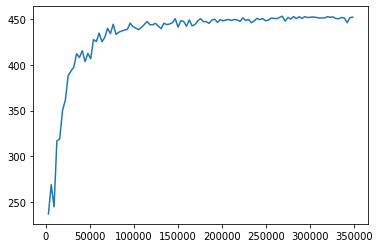

Train:452.269
Train:449.803
Train:448.926
Train:451.875
Train:451.703
Train:451.994
Train:450.747
Train:451.219
Train:451.8
Train:451.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000120/checkpoint-120


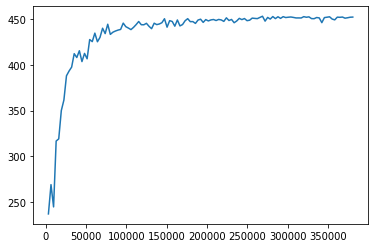

Train:450.191
Train:452.048
Train:451.258
Train:452.159
Train:451.845
Train:449.153
Train:452.03
Train:451.875
Train:449.61
Train:450.267
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000130/checkpoint-130


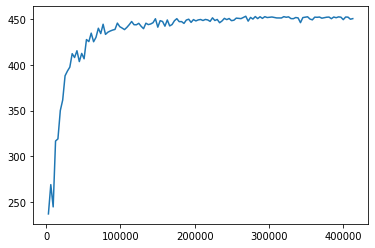

Train:451.767
Train:452.417
Train:451.595
Train:451.226
Train:448.827
Train:452.409
Train:451.864
Train:450.919
Train:452.882
Train:451.037
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000140/checkpoint-140


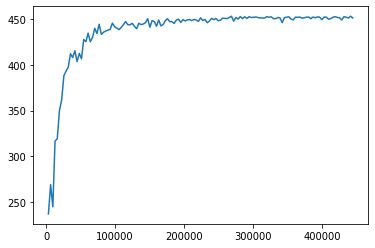

Train:451.699
Train:452.51
Train:452.048
Train:452.979
Train:449.47
Train:451.972
Train:452.803
Train:452.802
Train:451.697
Train:453.333
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000150/checkpoint-150


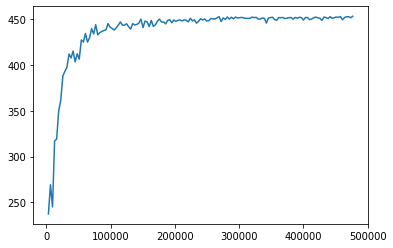

Train:452.614
Train:451.087
Train:452.024
Train:441.456
Train:451.681
Train:451.694
Train:451.304
Train:451.523
Train:452.166
Train:452.691
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000160/checkpoint-160


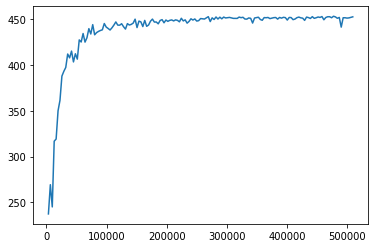

Train:451.875
Train:450.593
Train:452.347
Train:453.45
Train:450.478
Train:451.405
Train:449.192
Train:452.048
Train:452.508
Train:450.567
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000170/checkpoint-170


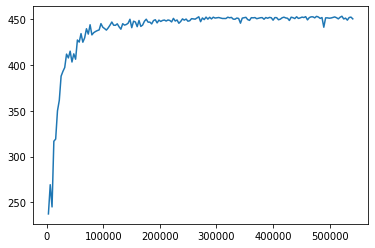

Train:451.405
Train:451.304
Train:452.518
Train:453.232
Train:452.518
Train:453.06
Train:452.691
Train:451.405
Train:450.568
Train:453.333
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000180/checkpoint-180


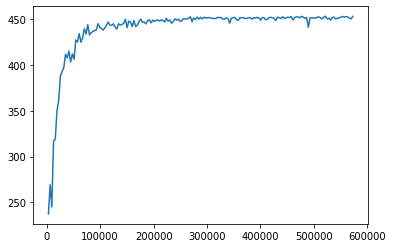

Train:452.691
Train:452.048
Train:452.003
Train:451.845
Train:452.929
Train:451.405
Train:452.589
Train:452.589
Train:451.845
Train:451.304
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000190/checkpoint-190


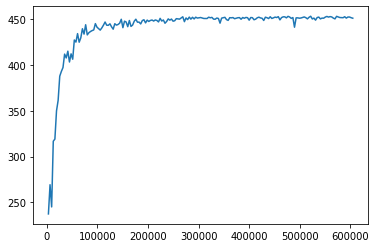

Train:451.946
Train:452.691
Train:451.946
Train:453.161
Train:452.691
Train:452.691
Train:452.048
Train:453.03
Train:450.787
Train:451.899
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000200/checkpoint-200


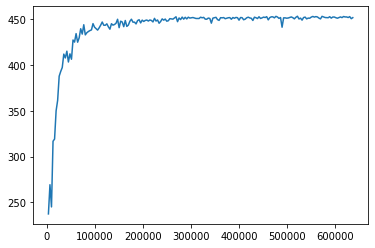

Train:451.946
Train:450.215
Train:452.589
Train:452.033
Train:452.048
Train:451.405
Train:452.048
Train:451.875
Train:453.131
Train:451.486
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000210/checkpoint-210


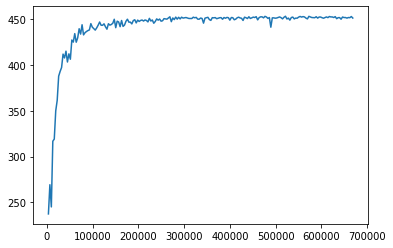

Train:452.691
Train:447.707
Train:453.045
Train:450.762
Train:453.232
Train:452.691
Train:452.073
Train:452.048
Train:451.405
Train:451.477
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000220/checkpoint-220


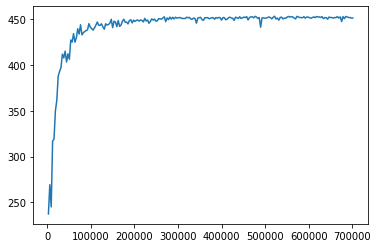

Train:452.048
Train:453.232
Train:451.8
Train:452.691
Train:452.691
Train:451.405
Train:451.405
Train:453.333
Train:452.033
Train:452.048
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000230/checkpoint-230


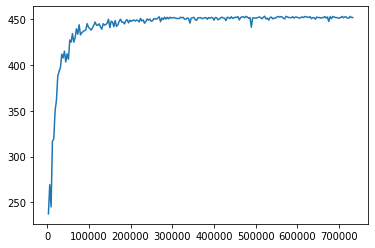

Train:451.699
Train:453.333
Train:452.048
Train:451.405
Train:451.405
Train:452.048
Train:452.048
Train:451.405
Train:452.12
Train:453.131
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000240/checkpoint-240


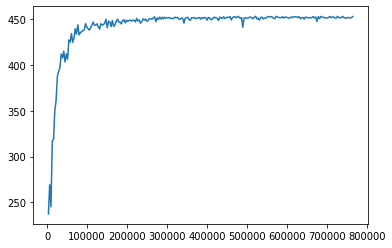

Train:452.048
Train:452.691
Train:452.048
Train:451.845
Train:452.048
Train:452.048
Train:452.048
Train:453.333
Train:452.589
Train:451.405
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000250/checkpoint-250


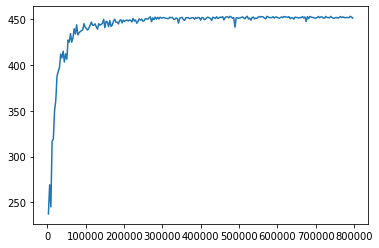

Train:452.048
Train:452.542
Train:451.875
Train:452.048
Train:453.333
Train:452.691
Train:453.333
Train:452.691
Train:452.589
Train:452.048
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000260/checkpoint-260


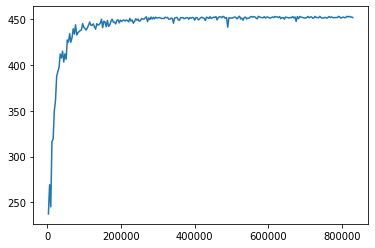

Train:451.946
Train:451.875
Train:452.691
Train:453.232
Train:452.488
Train:452.691
Train:453.232
Train:451.946
Train:453.333
Train:452.048
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000270/checkpoint-270


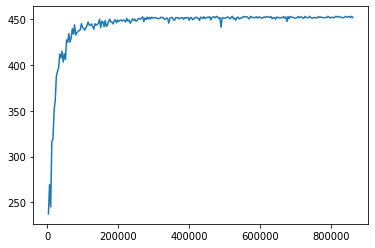

Train:452.691
Train:452.048
Train:453.263
Train:452.62
Train:452.387
Train:453.232
Train:452.589
Train:453.395
Train:452.078
Train:452.109
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000280/checkpoint-280


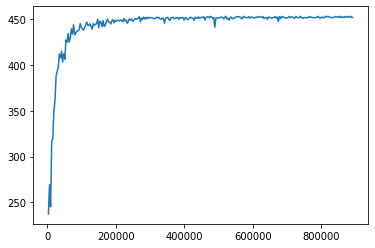

Train:452.691
Train:453.232
Train:453.364
Train:451.435
Train:451.405
Train:453.426
Train:452.048
Train:453.364
Train:451.946
Train:452.109
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000290/checkpoint-290


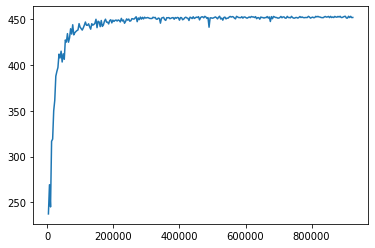

Train:451.405
Train:452.691
Train:452.691
Train:452.691
Train:452.721
Train:452.752
Train:453.232
Train:451.435
Train:451.435
Train:452.048
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000300/checkpoint-300


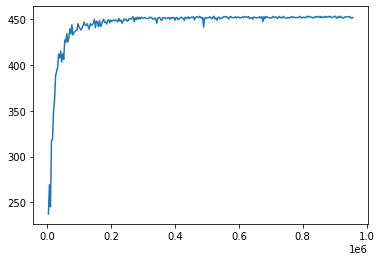

Train:453.805
Train:453.542
Train:453.193
Train:441.018
Train:452.109
Train:451.435
Train:453.395
Train:450.602
Train:450.762
Train:452.721
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000310/checkpoint-310


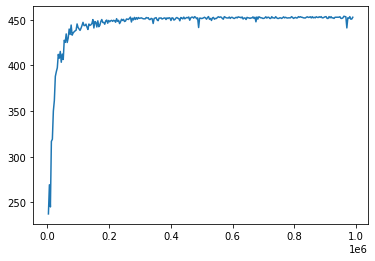

Train:452.752
Train:449.26
Train:452.411
Train:449.092
Train:451.435
Train:452.783
Train:449.403
Train:452.24
Train:453.364
Train:450.267
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-11-00xfhyefw2/checkpoint_000320/checkpoint-320


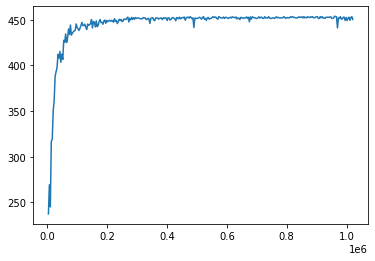

2021-10-19 15:44:38,255	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 15:45:30,216	INFO trainable.py:104 -- Trainable.setup took 51.552 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 15:45:30,218	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:373.6
Train:437.108
Train:383.46
Train:459.58
Train:474.357
Train:530.48
Train:528.109
Train:556.309
Train:535.347
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000010/checkpoint-10


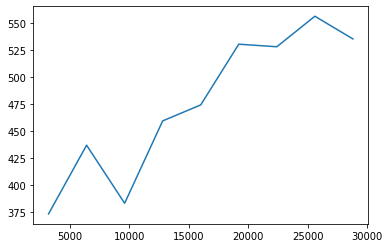

Train:556.817
Train:566.152
Train:567.755
Train:574.128
Train:578.132
Train:583.163
Train:587.131
Train:575.398
Train:593.941
Train:577.459
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000020/checkpoint-20


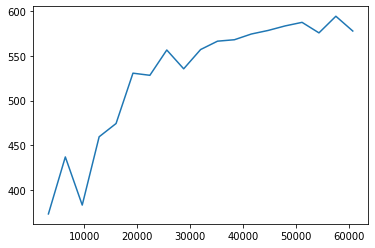

Train:588.307
Train:590.887
Train:590.447
Train:594.599
Train:594.582
Train:592.39
Train:586.613
Train:593.992
Train:593.688
Train:594.014
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000030/checkpoint-30


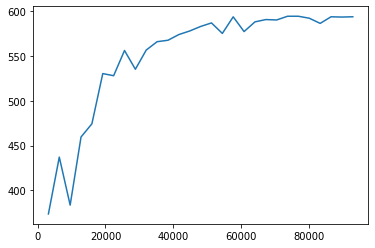

Train:590.84
Train:592.065
Train:590.904
Train:594.348
Train:595.599
Train:593.394
Train:594.845
Train:589.778
Train:594.543
Train:590.068
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000040/checkpoint-40


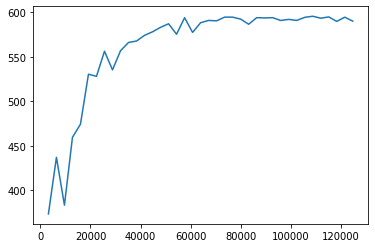

Train:595.521
Train:594.272
Train:595.426
Train:584.498
Train:596.186
Train:585.966
Train:593.848
Train:595.555
Train:595.365
Train:594.007
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000050/checkpoint-50


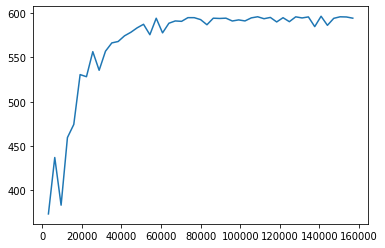

Train:596.028
Train:593.935
Train:593.557
Train:594.986
Train:598.398
Train:594.535
Train:597.787
Train:595.729
Train:596.404
Train:596.404
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000060/checkpoint-60


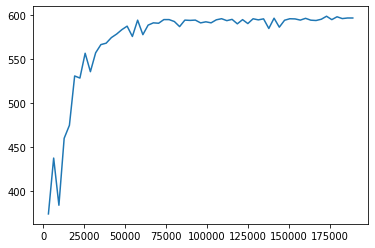

Train:596.254
Train:599.294
Train:598.385
Train:598.626
Train:596.293
Train:595.982
Train:596.616
Train:597.694
Train:597.004
Train:598.94
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000070/checkpoint-70


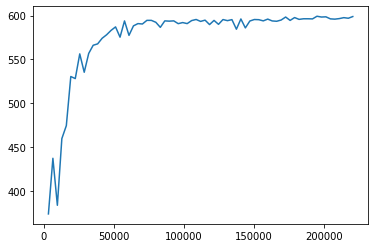

Train:600.589
Train:596.162
Train:599.376
Train:598.19
Train:600.998
Train:596.254
Train:599.4
Train:600.126
Train:599.812
Train:599.376
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000080/checkpoint-80


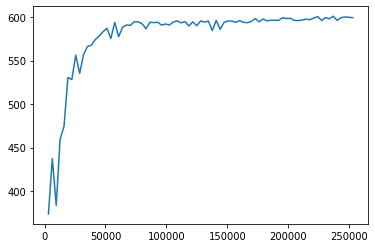

Train:600.586
Train:599.69
Train:598.618
Train:598.528
Train:600.998
Train:600.998
Train:599.69
Train:599.861
Train:599.69
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000090/checkpoint-90


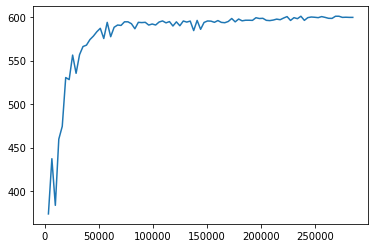

Train:599.254
Train:600.562
Train:599.714
Train:599.69
Train:595.069
Train:597.158
Train:594.557
Train:599.69
Train:600.171
Train:600.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000100/checkpoint-100


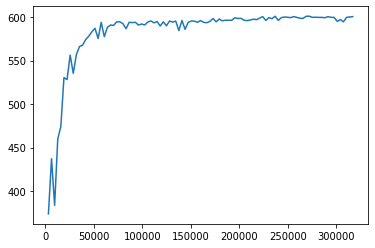

Train:599.69
Train:600.126
Train:598.829
Train:599.254
Train:600.562
Train:599.69
Train:600.607
Train:599.69
Train:591.476
Train:600.241
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000110/checkpoint-110


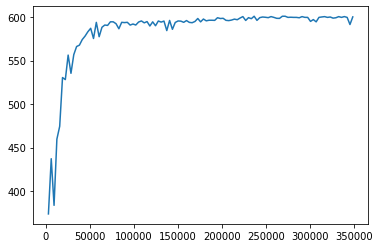

Train:600.126
Train:599.69
Train:598.817
Train:600.562
Train:598.817
Train:599.109
Train:599.368
Train:599.69
Train:601.043
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000120/checkpoint-120


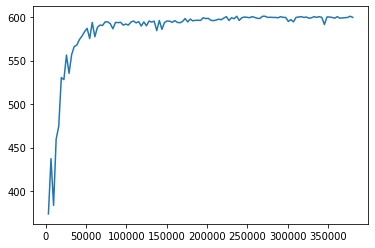

Train:600.126
Train:600.562
Train:600.562
Train:591.912
Train:600.126
Train:598.817
Train:599.254
Train:600.562
Train:599.254
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000130/checkpoint-130


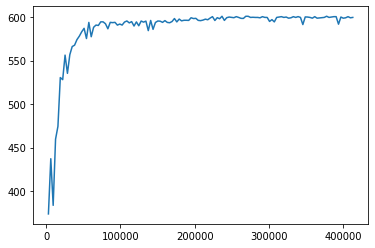

Train:598.658
Train:599.254
Train:600.562
Train:600.126
Train:596.485
Train:600.126
Train:599.69
Train:597.979
Train:599.254
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000140/checkpoint-140


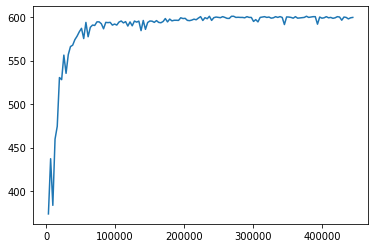

Train:597.853
Train:599.254
Train:600.126
Train:600.126
Train:597.463
Train:599.6
Train:600.562
Train:596.849
Train:599.254
Train:600.126
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000150/checkpoint-150


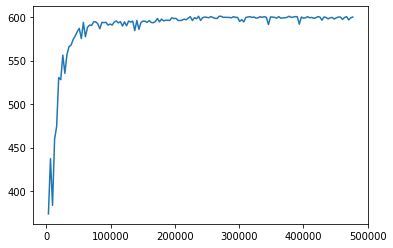

Train:599.69
Train:592.694
Train:596.475
Train:599.69
Train:599.254
Train:600.562
Train:599.69
Train:597.055
Train:600.589
Train:600.126
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000160/checkpoint-160


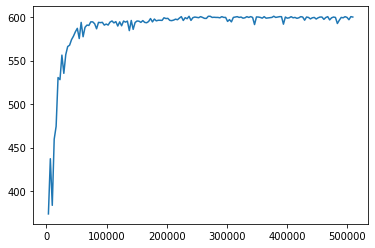

Train:600.126
Train:600.126
Train:599.254
Train:599.69
Train:599.69
Train:600.153
Train:595.426
Train:599.017
Train:599.127
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000170/checkpoint-170


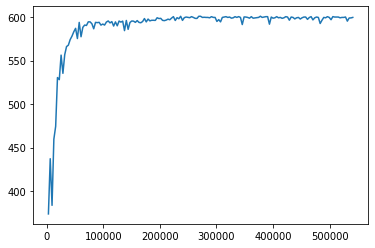

Train:600.126
Train:600.562
Train:598.272
Train:599.254
Train:599.69
Train:599.014
Train:600.126
Train:600.562
Train:599.69
Train:600.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000180/checkpoint-180


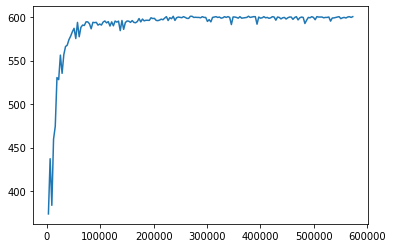

Train:599.69
Train:600.589
Train:600.562
Train:600.126
Train:600.562
Train:600.126
Train:599.254
Train:599.254
Train:593.13
Train:599.254
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000190/checkpoint-190


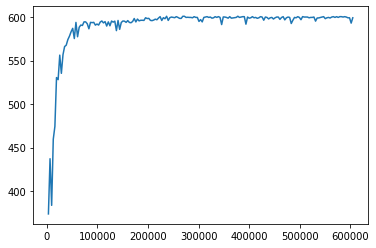

Train:599.254
Train:599.69
Train:599.511
Train:599.69
Train:600.126
Train:599.69
Train:598.708
Train:583.931
Train:586.15
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000200/checkpoint-200


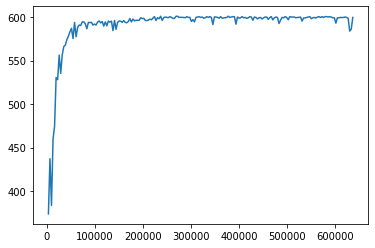

Train:599.254
Train:599.254
Train:600.126
Train:600.126
Train:598.817
Train:600.126
Train:600.126
Train:600.126
Train:600.153
Train:599.254
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000210/checkpoint-210


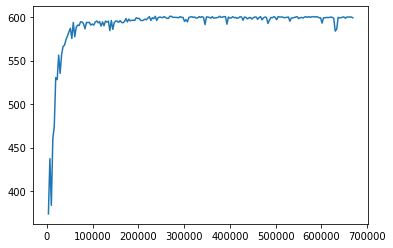

Train:600.126
Train:591.967
Train:600.126
Train:600.126
Train:599.69
Train:600.562
Train:600.126
Train:599.69
Train:596.086
Train:600.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000220/checkpoint-220


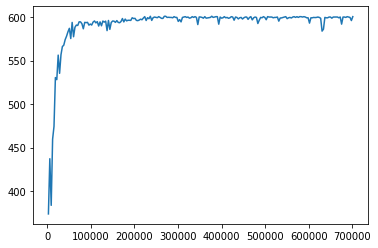

Train:599.254
Train:598.828
Train:599.69
Train:599.69
Train:600.126
Train:600.998
Train:597.216
Train:598.668
Train:599.69
Train:598.888
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000230/checkpoint-230


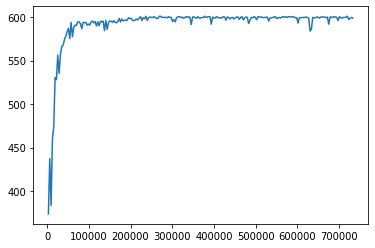

Train:600.126
Train:598.167
Train:599.69
Train:599.69
Train:599.69
Train:599.014
Train:599.281
Train:599.254
Train:600.562
Train:600.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000240/checkpoint-240


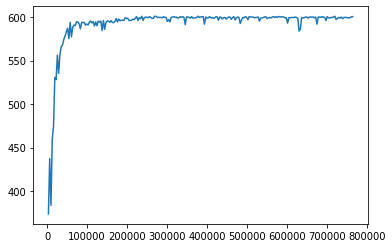

Train:600.126
Train:594.252
Train:600.562
Train:599.254
Train:599.69
Train:593.758
Train:600.153
Train:599.254
Train:599.69
Train:589.391
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000250/checkpoint-250


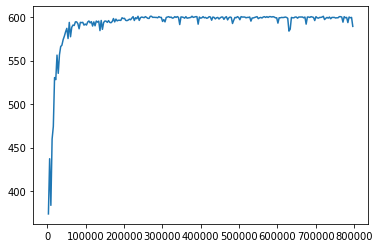

Train:600.126
Train:600.126
Train:600.589
Train:598.817
Train:599.69
Train:600.963
Train:600.126
Train:599.69
Train:600.998
Train:598.486
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000260/checkpoint-260


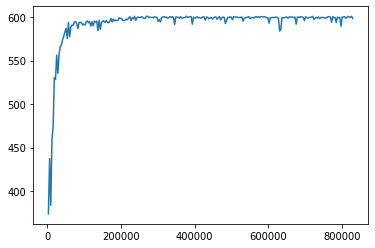

Train:600.126
Train:600.126
Train:597.796
Train:600.126
Train:600.562
Train:599.69
Train:600.562
Train:600.562
Train:598.668
Train:599.254
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000270/checkpoint-270


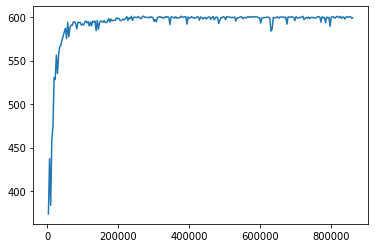

Train:599.254
Train:600.126
Train:598.61
Train:600.562
Train:600.126
Train:600.589
Train:600.126
Train:600.126
Train:600.562
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000280/checkpoint-280


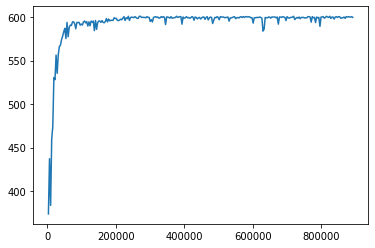

Train:600.126
Train:600.562
Train:600.126
Train:599.69
Train:599.69
Train:599.69
Train:600.126
Train:599.254
Train:600.998
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000290/checkpoint-290


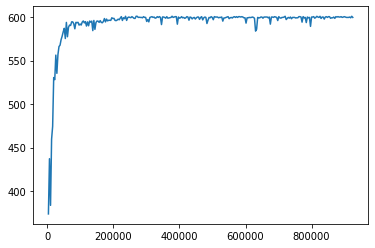

Train:600.562
Train:600.126
Train:599.69
Train:599.717
Train:598.668
Train:598.563
Train:600.126
Train:599.254
Train:599.69
Train:600.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000300/checkpoint-300


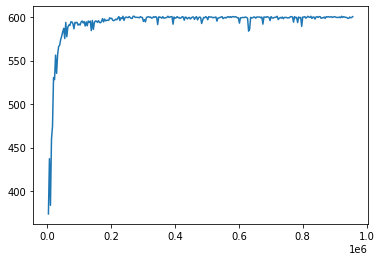

Train:599.254
Train:600.126
Train:599.254
Train:599.69
Train:600.562
Train:599.69
Train:600.126
Train:600.126
Train:600.562
Train:599.69
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000310/checkpoint-310


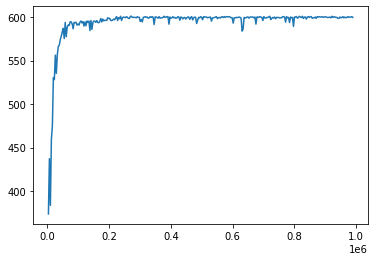

Train:600.126
Train:599.254
Train:600.126
Train:600.126
Train:599.69
Train:600.126
Train:600.126
Train:600.126
Train:600.562
Train:600.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_15-44-380mh_nv2u/checkpoint_000320/checkpoint-320


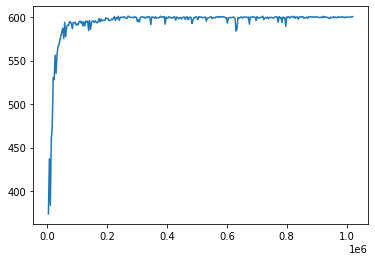

2021-10-19 16:18:10,269	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 16:19:02,339	INFO trainable.py:104 -- Trainable.setup took 51.654 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 16:19:02,343	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:399.269
Train:418.961
Train:471.572
Train:539.284
Train:505.927
Train:536.314
Train:521.027
Train:571.323
Train:566.641
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000010/checkpoint-10


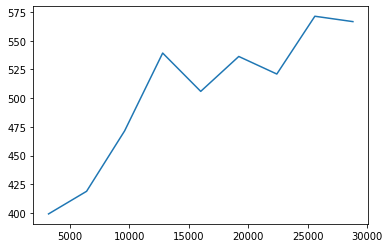

Train:572.041
Train:558.686
Train:580.961
Train:593.267
Train:598.552
Train:609.078
Train:603.7
Train:606.594
Train:625.752
Train:617.79
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000020/checkpoint-20


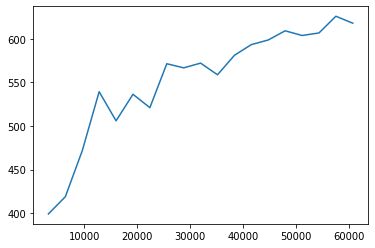

Train:623.885
Train:629.804
Train:625.528
Train:633.442
Train:615.629
Train:628.69
Train:629.849
Train:634.143
Train:636.456
Train:632.896
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000030/checkpoint-30


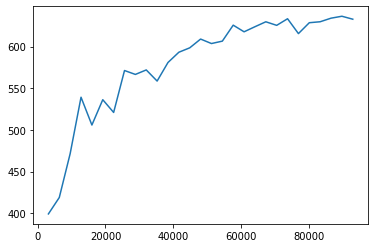

Train:622.631
Train:639.033
Train:640.115
Train:640.805
Train:632.054
Train:632.315
Train:640.948
Train:639.188
Train:641.348
Train:638.947
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000040/checkpoint-40


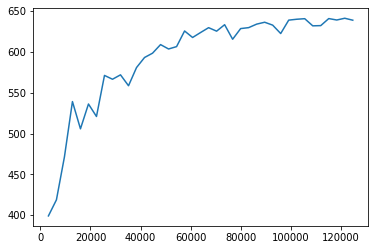

Train:640.331
Train:639.548
Train:641.313
Train:640.537
Train:643.116
Train:644.186
Train:643.812
Train:636.702
Train:643.958
Train:641.377
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000050/checkpoint-50


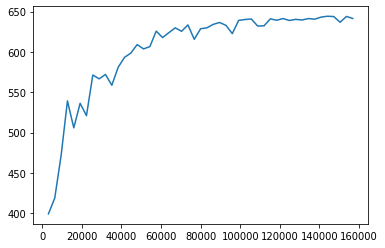

Train:639.936
Train:642.481
Train:644.466
Train:645.181
Train:643.482
Train:644.573
Train:644.577
Train:643.718
Train:644.12
Train:644.829
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000060/checkpoint-60


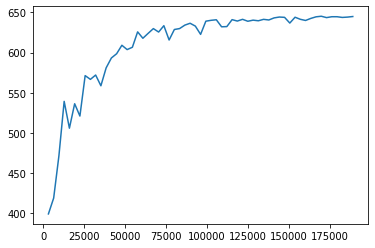

Train:644.127
Train:644.847
Train:643.067
Train:644.376
Train:643.092
Train:644.984
Train:644.037
Train:642.212
Train:644.451
Train:641.933
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000070/checkpoint-70


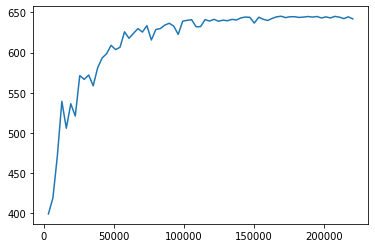

Train:638.108
Train:639.697
Train:643.693
Train:644.045
Train:643.176
Train:645.288
Train:644.713
Train:644.585
Train:644.619
Train:643.607
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000080/checkpoint-80


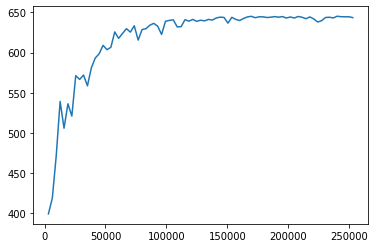

Train:645.073
Train:643.47
Train:643.607
Train:643.032
Train:643.35
Train:644.181
Train:637.908
Train:645.647
Train:644.409
Train:645.073
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000090/checkpoint-90


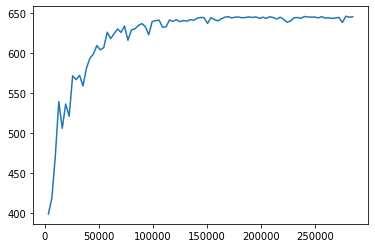

Train:645.647
Train:645.647
Train:644.409
Train:645.073
Train:645.073
Train:644.498
Train:643.745
Train:643.89
Train:645.647
Train:646.222
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000100/checkpoint-100


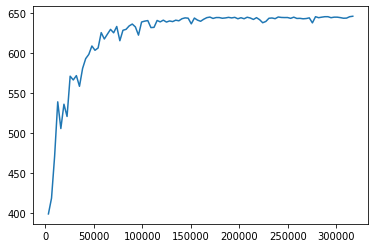

Train:642.916
Train:646.222
Train:646.797
Train:646.222
Train:645.073
Train:643.909
Train:636.445
Train:643.315
Train:645.647
Train:645.058
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000110/checkpoint-110


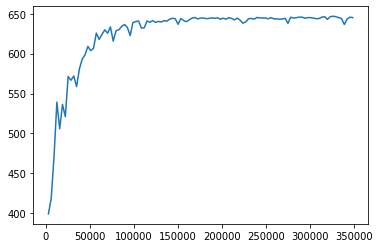

Train:645.745
Train:645.073
Train:645.647
Train:645.647
Train:646.222
Train:646.797
Train:645.558
Train:646.01
Train:646.797
Train:645.647
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000120/checkpoint-120


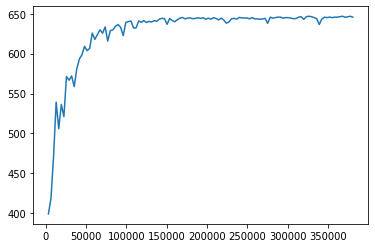

Train:639.94
Train:645.647
Train:646.585
Train:645.647
Train:644.271
Train:645.647
Train:646.222
Train:646.797
Train:645.647
Train:645.058
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000130/checkpoint-130


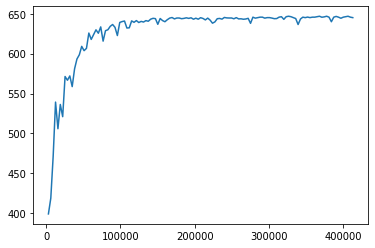

Train:645.073
Train:646.01
Train:645.01
Train:646.222
Train:645.647
Train:646.797
Train:645.647
Train:645.694
Train:645.073
Train:641.646
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000140/checkpoint-140


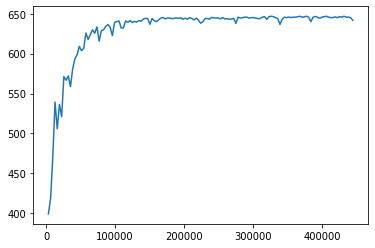

Train:645.073
Train:645.647
Train:646.222
Train:645.647
Train:645.647
Train:645.647
Train:642.533
Train:644.871
Train:646.01
Train:645.647
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000150/checkpoint-150


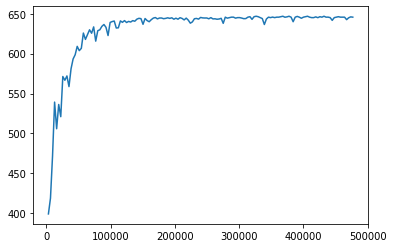

Train:646.222
Train:645.436
Train:646.373
Train:644.908
Train:646.01
Train:637.334
Train:634.733
Train:645.798
Train:645.798
Train:645.558
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000160/checkpoint-160


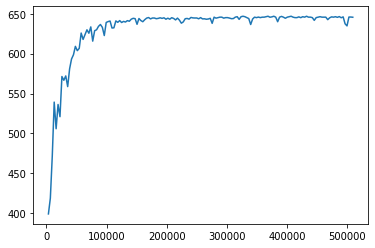

Train:644.596
Train:645.921
Train:645.647
Train:643.834
Train:646.222
Train:645.073
Train:645.647
Train:646.222
Train:644.026
Train:634.323
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000170/checkpoint-170


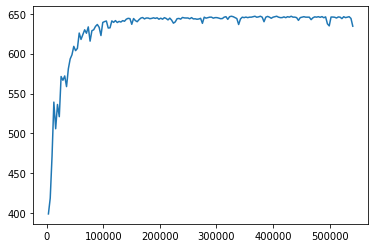

Train:645.647
Train:646.797
Train:645.647
Train:643.909
Train:645.073
Train:646.01
Train:647.371
Train:645.647
Train:645.694
Train:644.545
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000180/checkpoint-180


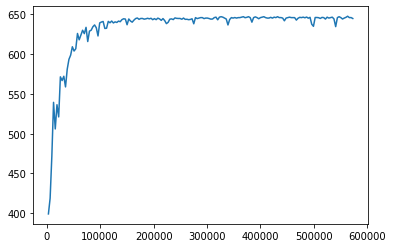

Train:646.222
Train:646.01
Train:645.647
Train:646.222
Train:644.619
Train:646.222
Train:645.647
Train:646.222
Train:645.647
Train:646.222
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000190/checkpoint-190


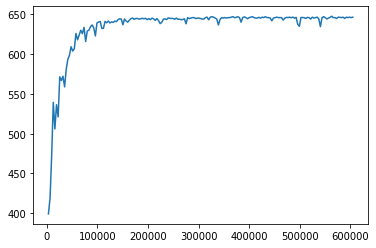

Train:646.797
Train:646.222
Train:641.98
Train:646.222
Train:645.647
Train:645.647
Train:646.797
Train:645.647
Train:644.984
Train:644.409
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000200/checkpoint-200


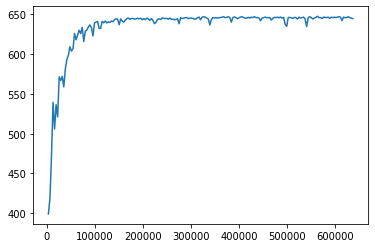

Train:642.895
Train:646.797
Train:645.647
Train:645.073
Train:645.647
Train:646.797
Train:644.498
Train:645.647
Train:645.647
Train:645.073
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000210/checkpoint-210


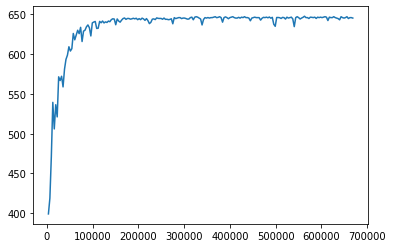

Train:646.222
Train:645.928
Train:645.073
Train:643.223
Train:645.073
Train:646.222
Train:645.073
Train:646.222
Train:644.498
Train:645.647
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000220/checkpoint-220


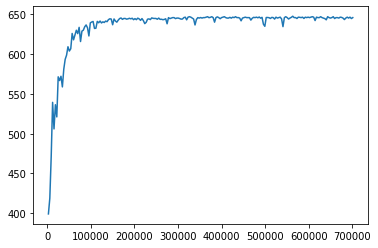

Train:645.647
Train:646.222
Train:645.647
Train:645.647
Train:646.797
Train:645.694
Train:646.222
Train:646.222
Train:645.647
Train:645.647
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000230/checkpoint-230


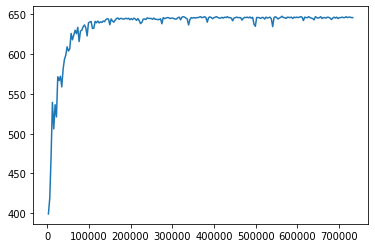

Train:646.222
Train:646.222
Train:642.082
Train:644.709
Train:645.647
Train:645.647
Train:646.222
Train:646.222
Train:645.647
Train:645.073
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000240/checkpoint-240


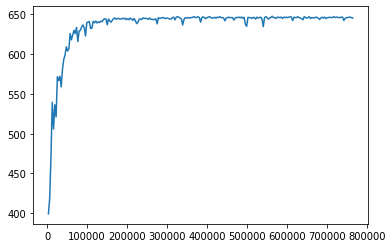

Train:646.222
Train:646.222
Train:641.075
Train:644.861
Train:645.073
Train:646.222
Train:646.797
Train:645.647
Train:645.073
Train:646.797
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000250/checkpoint-250


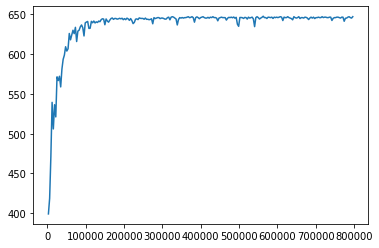

Train:645.073
Train:645.647
Train:646.222
Train:645.647
Train:645.647
Train:645.647
Train:646.222
Train:646.797
Train:644.498
Train:646.222
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000260/checkpoint-260


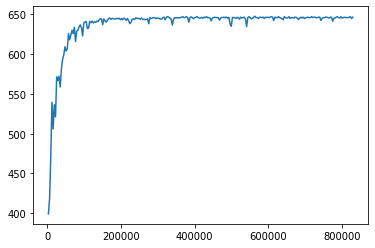

Train:645.073
Train:646.159
Train:646.797
Train:645.073
Train:646.222
Train:646.797
Train:646.222
Train:645.647
Train:645.647
Train:638.461
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000270/checkpoint-270


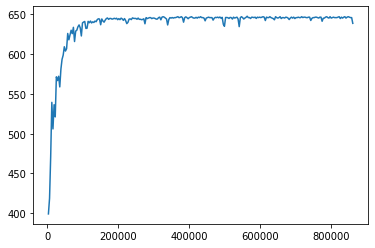

Train:645.647
Train:642.742
Train:627.16
Train:636.526
Train:642.26
Train:645.073
Train:637.523
Train:642.834
Train:643.409
Train:645.073
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000280/checkpoint-280


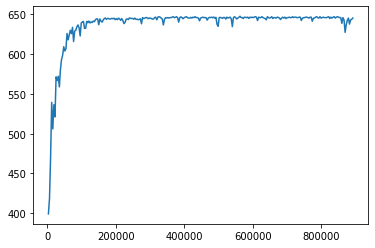

Train:645.647
Train:645.073
Train:646.797
Train:646.222
Train:642.21
Train:645.073
Train:646.222
Train:645.073
Train:646.797
Train:645.647
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000290/checkpoint-290


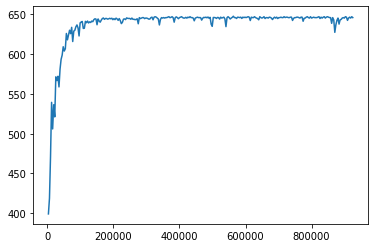

Train:645.647
Train:645.647
Train:647.371
Train:646.222
Train:646.222
Train:646.797
Train:645.647
Train:644.498
Train:641.521
Train:646.797
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000300/checkpoint-300


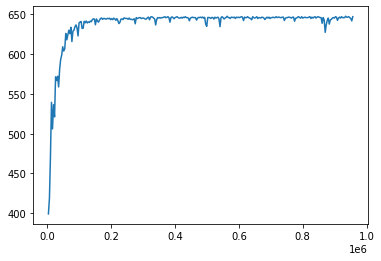

Train:645.073
Train:643.409
Train:646.797
Train:645.647
Train:644.417
Train:645.073
Train:645.647
Train:645.073
Train:646.797
Train:645.647
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000310/checkpoint-310


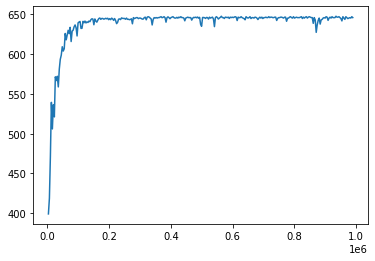

Train:645.647
Train:644.498
Train:646.797
Train:646.222
Train:645.073
Train:645.073
Train:646.222
Train:646.222
Train:646.222
Train:646.222
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-18-10nbisconw/checkpoint_000320/checkpoint-320


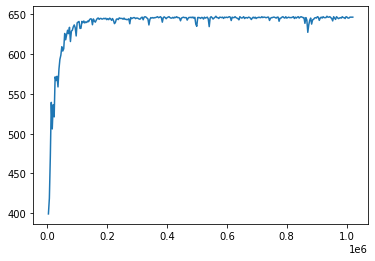

2021-10-19 16:51:44,528	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 16:52:37,073	INFO trainable.py:104 -- Trainable.setup took 51.139 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 16:52:37,076	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:362.219
Train:416.936
Train:411.349
Train:438.382
Train:443.763
Train:521.88
Train:489.739
Train:503.936
Train:490.932
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000010/checkpoint-10


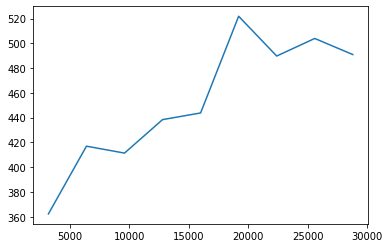

Train:538.321
Train:557.837
Train:555.956
Train:561.981
Train:567.819
Train:574.706
Train:568.592
Train:569.017
Train:567.149
Train:570.249
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000020/checkpoint-20


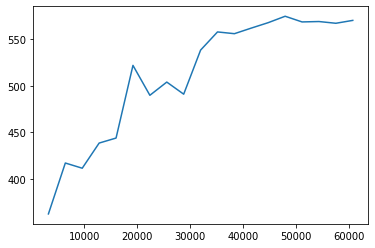

Train:564.384
Train:573.495
Train:583.211
Train:582.944
Train:585.986
Train:580.571
Train:584.358
Train:573.566
Train:589.948
Train:584.073
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000030/checkpoint-30


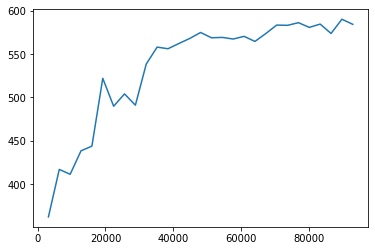

Train:586.966
Train:579.471
Train:590.403
Train:585.64
Train:589.464
Train:593.936
Train:591.016
Train:594.565
Train:593.529
Train:592.343
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000040/checkpoint-40


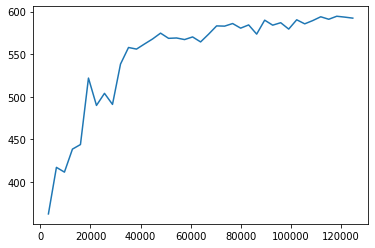

Train:590.355
Train:594.659
Train:594.169
Train:595.596
Train:592.632
Train:596.15
Train:595.668
Train:596.157
Train:596.182
Train:595.3
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000050/checkpoint-50


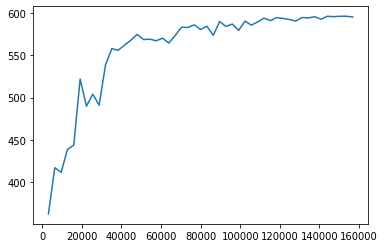

Train:596.901
Train:597.053
Train:596.846
Train:597.117
Train:596.942
Train:596.081
Train:596.92
Train:596.865
Train:596.907
Train:596.822
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000060/checkpoint-60


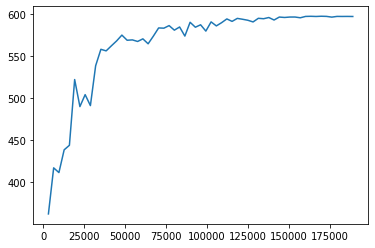

Train:597.027
Train:596.888
Train:595.359
Train:596.908
Train:597.0
Train:597.135
Train:589.926
Train:596.92
Train:587.722
Train:596.881
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000070/checkpoint-70


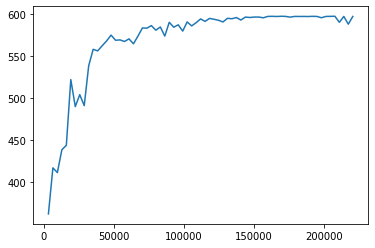

Train:596.886
Train:597.142
Train:597.023
Train:596.91
Train:597.018
Train:597.163
Train:596.997
Train:597.075
Train:597.196
Train:597.068
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000080/checkpoint-80


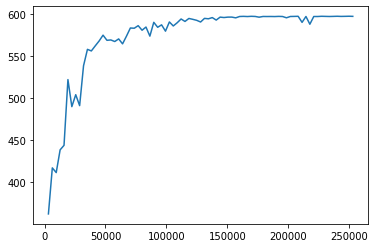

Train:596.929
Train:597.152
Train:597.075
Train:597.103
Train:589.103
Train:597.084
Train:597.132
Train:590.512
Train:596.305
Train:597.034
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000090/checkpoint-90


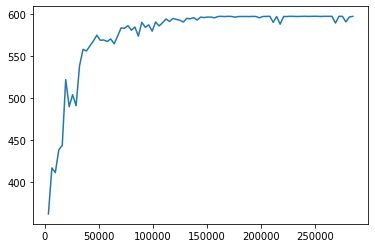

Train:595.107
Train:596.97
Train:597.133
Train:596.978
Train:597.049
Train:597.005
Train:596.929
Train:595.961
Train:597.008
Train:597.02
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000100/checkpoint-100


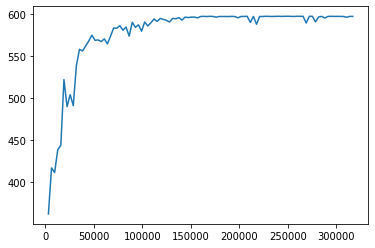

Train:593.752
Train:597.114
Train:596.212
Train:597.073
Train:597.044
Train:596.853
Train:593.627
Train:597.2
Train:596.978
Train:597.124
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000110/checkpoint-110


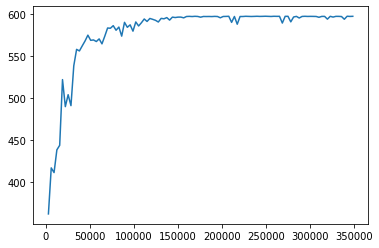

Train:597.082
Train:597.038
Train:597.027
Train:597.029
Train:597.104
Train:597.029
Train:592.298
Train:596.978
Train:595.187
Train:597.038
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000120/checkpoint-120


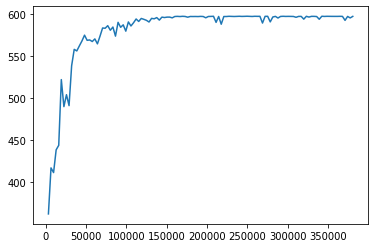

Train:597.028
Train:597.088
Train:585.3
Train:597.103
Train:597.13
Train:597.159
Train:591.712
Train:597.129
Train:597.151
Train:597.088
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000130/checkpoint-130


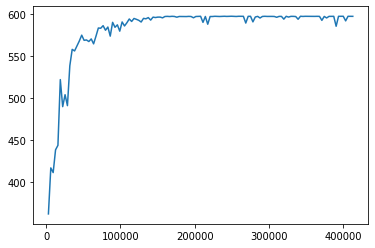

Train:597.117
Train:596.979
Train:597.293
Train:597.037
Train:597.152
Train:597.105
Train:597.053
Train:591.696
Train:597.139
Train:595.749
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000140/checkpoint-140


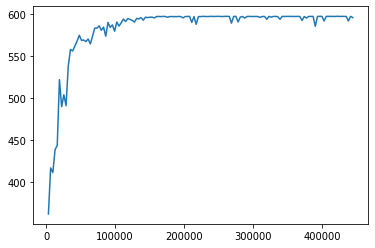

Train:597.201
Train:597.198
Train:597.045
Train:597.139
Train:596.981
Train:597.032
Train:596.928
Train:597.103
Train:597.077
Train:597.056
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000150/checkpoint-150


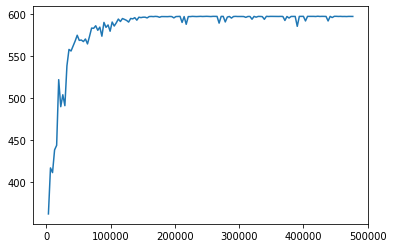

Train:596.346
Train:597.202
Train:592.63
Train:597.11
Train:594.701
Train:596.993
Train:597.201
Train:584.867
Train:596.906
Train:597.046
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000160/checkpoint-160


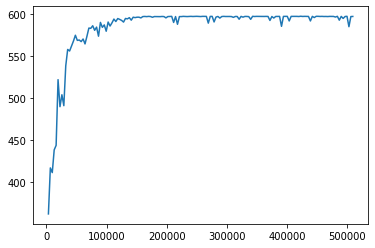

Train:597.087
Train:597.09
Train:596.941
Train:597.174
Train:596.953
Train:597.04
Train:596.015
Train:597.037
Train:590.639
Train:597.034
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000170/checkpoint-170


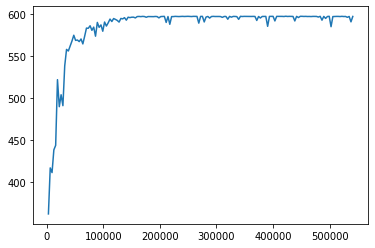

Train:594.04
Train:597.051
Train:597.14
Train:596.831
Train:596.844
Train:596.929
Train:597.04
Train:596.981
Train:596.991
Train:597.091
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000180/checkpoint-180


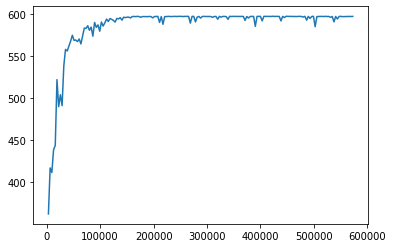

Train:596.802
Train:597.053
Train:597.1
Train:597.054
Train:587.837
Train:597.077
Train:597.136
Train:597.223
Train:597.135
Train:597.006
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000190/checkpoint-190


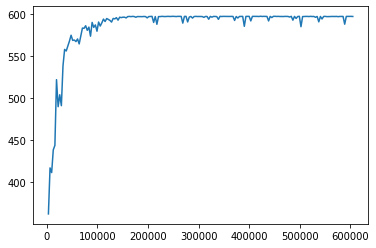

Train:596.956
Train:597.129
Train:596.966
Train:596.989
Train:596.879
Train:597.173
Train:597.151
Train:592.543
Train:596.96
Train:596.894
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000200/checkpoint-200


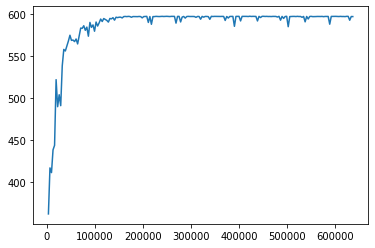

Train:597.126
Train:596.993
Train:597.034
Train:595.061
Train:597.129
Train:597.027
Train:597.034
Train:596.942
Train:597.096
Train:589.241
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000210/checkpoint-210


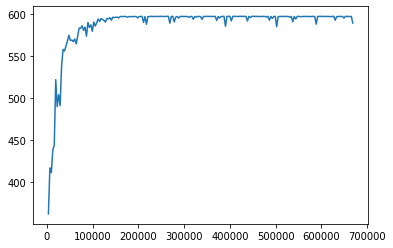

Train:597.037
Train:597.027
Train:597.282
Train:597.148
Train:597.086
Train:597.079
Train:572.979
Train:597.133
Train:589.754
Train:594.072
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000220/checkpoint-220


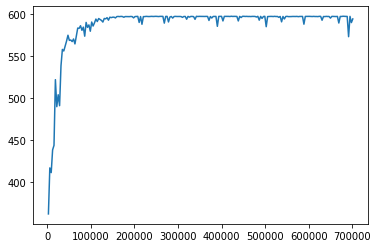

Train:597.079
Train:597.105
Train:596.955
Train:597.126
Train:596.986
Train:594.332
Train:597.059
Train:597.103
Train:591.847
Train:593.33
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000230/checkpoint-230


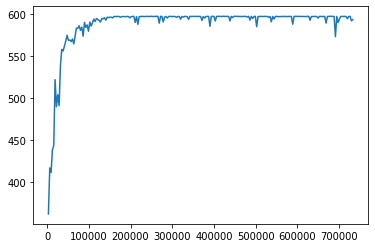

Train:597.175
Train:597.191
Train:597.142
Train:593.754
Train:597.125
Train:597.142
Train:597.141
Train:597.053
Train:597.246
Train:597.084
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000240/checkpoint-240


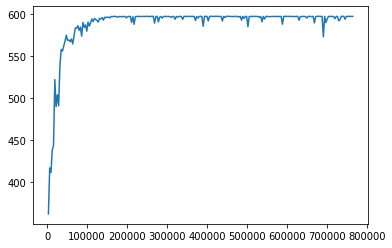

Train:597.126
Train:597.006
Train:597.082
Train:597.052
Train:597.03
Train:597.16
Train:597.126
Train:597.003
Train:597.035
Train:597.148
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000250/checkpoint-250


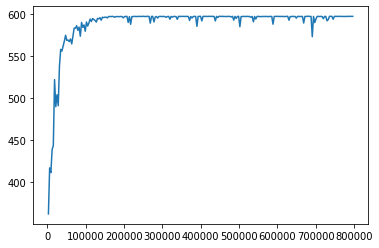

Train:597.17
Train:597.043
Train:597.11
Train:597.125
Train:597.089
Train:597.097
Train:596.906
Train:597.092
Train:596.218
Train:596.055
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000260/checkpoint-260


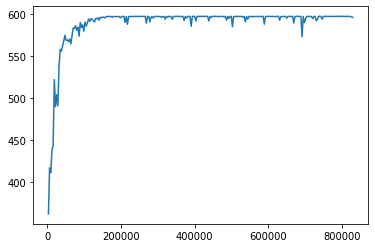

Train:597.213
Train:597.184
Train:597.028
Train:590.867
Train:590.919
Train:597.127
Train:597.104
Train:596.993
Train:597.028
Train:596.985
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000270/checkpoint-270


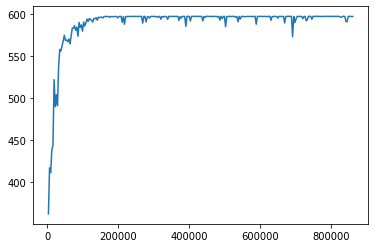

Train:597.202
Train:597.056
Train:597.126
Train:597.153
Train:597.055
Train:597.201
Train:597.152
Train:597.209
Train:597.107
Train:597.127
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000280/checkpoint-280


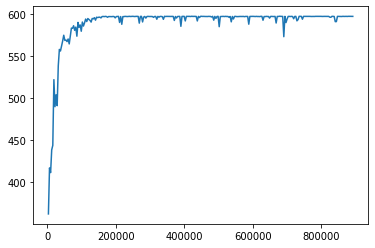

Train:597.082
Train:597.128
Train:597.212
Train:597.104
Train:597.126
Train:597.174
Train:597.116
Train:587.287
Train:597.127
Train:597.186
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000290/checkpoint-290


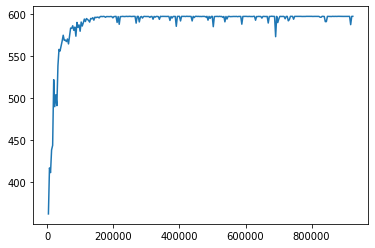

Train:597.125
Train:597.26
Train:597.127
Train:597.175
Train:597.176
Train:597.11
Train:597.153
Train:597.176
Train:597.11
Train:597.076
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000300/checkpoint-300


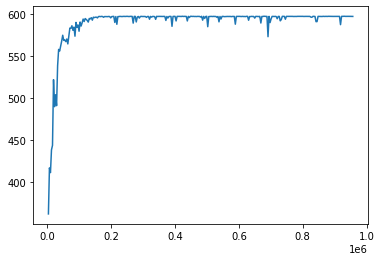

Train:597.106
Train:597.107
Train:597.105
Train:597.107
Train:597.235
Train:597.083
Train:597.081
Train:597.081
Train:597.128
Train:581.419
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000310/checkpoint-310


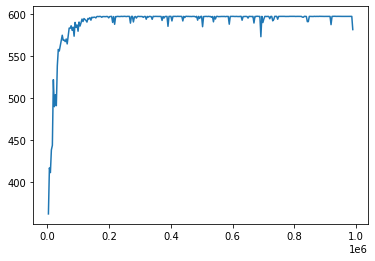

Train:597.154
Train:597.107
Train:597.081
Train:581.492
Train:597.106
Train:597.202
Train:597.085
Train:597.176
Train:589.28
Train:597.006
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_16-51-451x20pg70/checkpoint_000320/checkpoint-320


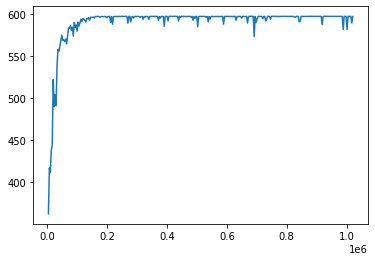

2021-10-19 17:25:14,940	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 17:26:08,013	INFO trainable.py:104 -- Trainable.setup took 52.659 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 17:26:08,016	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:343.12
Train:355.865
Train:419.924
Train:413.083
Train:409.189
Train:437.136
Train:466.524
Train:454.989
Train:464.111
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000010/checkpoint-10


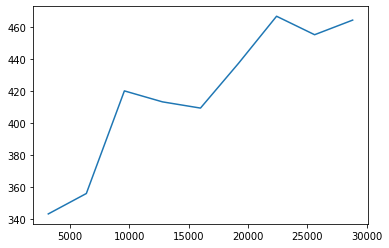

Train:458.453
Train:501.334
Train:490.86
Train:499.533
Train:495.24
Train:495.436
Train:499.744
Train:499.425
Train:516.389
Train:515.007
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000020/checkpoint-20


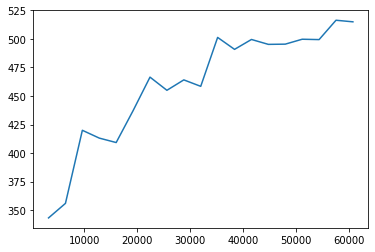

Train:521.212
Train:516.395
Train:509.111
Train:520.197
Train:521.67
Train:522.386
Train:527.012
Train:527.012
Train:527.012
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000030/checkpoint-30


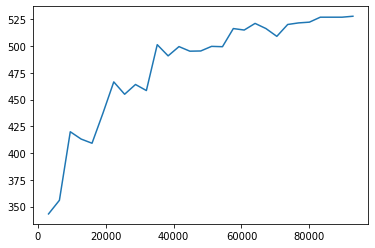

Train:528.795
Train:528.795
Train:527.876
Train:526.121
Train:524.923
Train:519.151
Train:516.906
Train:523.066
Train:526.121
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000040/checkpoint-40


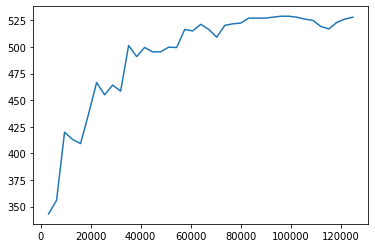

Train:520.814
Train:525.72
Train:526.121
Train:527.903
Train:528.795
Train:528.795
Train:528.795
Train:527.012
Train:526.121
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000050/checkpoint-50


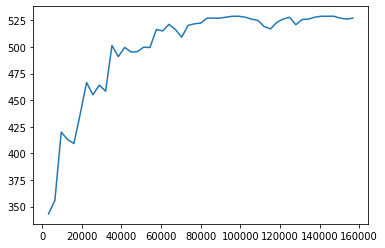

Train:527.903
Train:526.789
Train:528.795
Train:527.012
Train:527.903
Train:527.903
Train:527.903
Train:528.698
Train:525.997
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000060/checkpoint-60


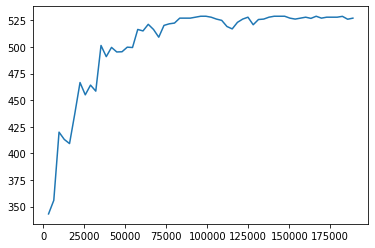

Train:528.795
Train:528.795
Train:528.795
Train:527.903
Train:526.121
Train:527.903
Train:528.795
Train:529.686
Train:527.903
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000070/checkpoint-70


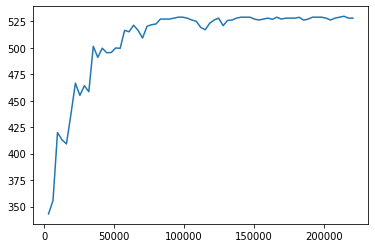

Train:527.012
Train:521.543
Train:525.23
Train:527.012
Train:525.23
Train:527.012
Train:527.903
Train:527.012
Train:527.903
Train:527.636
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000080/checkpoint-80


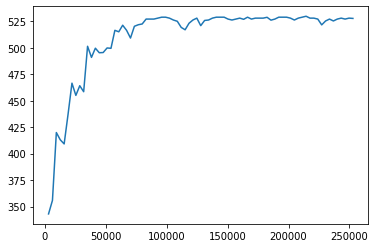

Train:527.903
Train:527.012
Train:527.012
Train:526.121
Train:527.903
Train:526.121
Train:526.121
Train:527.711
Train:528.795
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000090/checkpoint-90


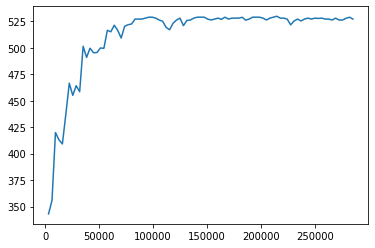

Train:525.23
Train:528.795
Train:526.121
Train:528.795
Train:527.903
Train:527.903
Train:527.903
Train:528.795
Train:526.121
Train:529.686
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000100/checkpoint-100


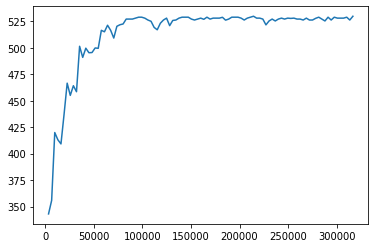

Train:527.903
Train:527.903
Train:527.903
Train:528.795
Train:527.012
Train:527.903
Train:526.121
Train:523.966
Train:527.903
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000110/checkpoint-110


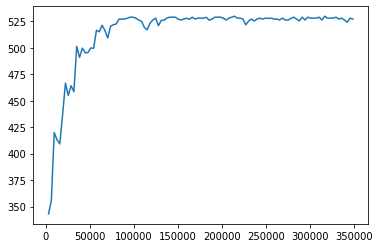

Train:527.012
Train:527.903
Train:527.012
Train:527.903
Train:528.795
Train:527.012
Train:528.795
Train:528.795
Train:527.903
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000120/checkpoint-120


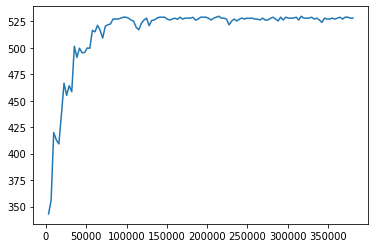

Train:527.903
Train:528.795
Train:525.23
Train:527.012
Train:527.903
Train:526.121
Train:527.903
Train:527.903
Train:528.795
Train:522.68
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000130/checkpoint-130


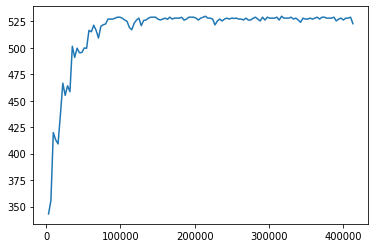

Train:527.903
Train:527.903
Train:527.903
Train:523.571
Train:526.121
Train:527.903
Train:526.121
Train:527.903
Train:527.212
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000140/checkpoint-140


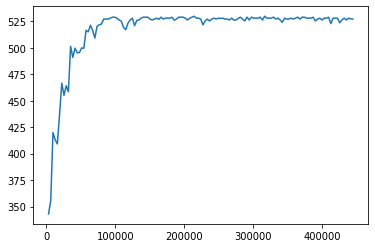

Train:526.121
Train:526.121
Train:528.795
Train:527.012
Train:527.903
Train:526.194
Train:527.012
Train:527.012
Train:528.795
Train:528.795
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000150/checkpoint-150


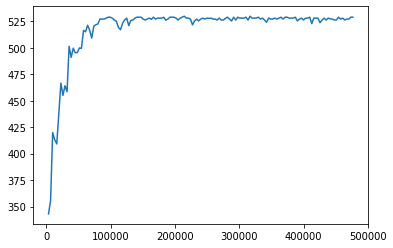

Train:527.012
Train:527.903
Train:527.903
Train:527.903
Train:527.903
Train:527.012
Train:528.795
Train:527.012
Train:526.121
Train:528.795
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000160/checkpoint-160


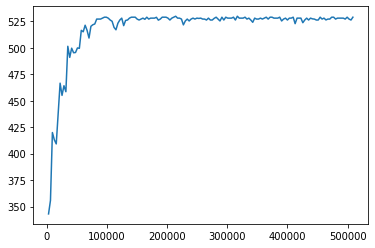

Train:526.121
Train:527.012
Train:527.012
Train:528.795
Train:528.795
Train:527.903
Train:527.903
Train:527.903
Train:526.121
Train:526.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000170/checkpoint-170


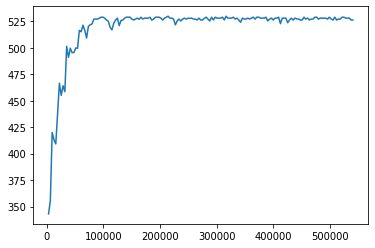

Train:528.795
Train:527.903
Train:528.795
Train:527.903
Train:527.012
Train:527.903
Train:528.795
Train:526.121
Train:528.795
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000180/checkpoint-180


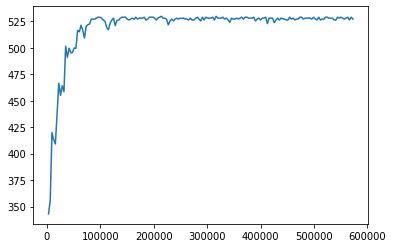

Train:525.022
Train:526.121
Train:527.012
Train:528.795
Train:527.012
Train:527.903
Train:527.903
Train:528.795
Train:527.903
Train:526.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000190/checkpoint-190


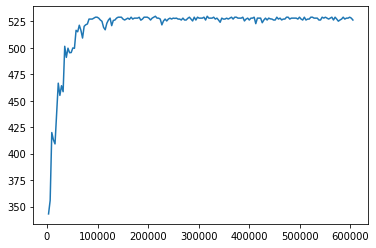

Train:528.795
Train:526.121
Train:527.903
Train:527.903
Train:528.795
Train:527.012
Train:523.018
Train:527.012
Train:526.121
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000200/checkpoint-200


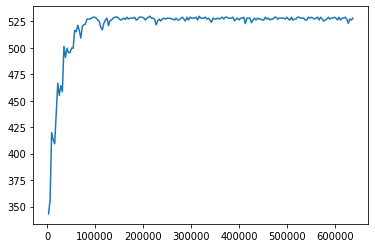

Train:526.121
Train:527.903
Train:527.012
Train:527.903
Train:527.903
Train:527.012
Train:527.903
Train:527.012
Train:527.012
Train:528.795
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000210/checkpoint-210


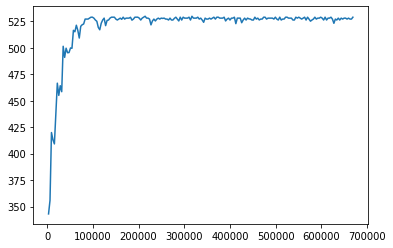

Train:527.903
Train:527.012
Train:528.795
Train:527.012
Train:526.121
Train:527.903
Train:526.121
Train:527.744
Train:525.999
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000220/checkpoint-220


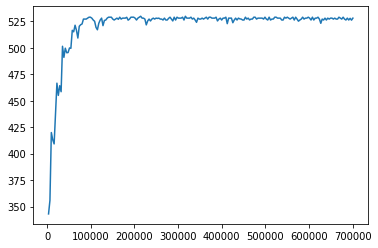

Train:527.012
Train:525.23
Train:527.903
Train:524.795
Train:528.795
Train:528.795
Train:526.608
Train:528.01
Train:527.903
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000230/checkpoint-230


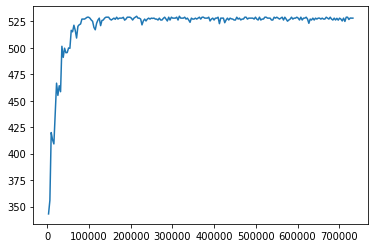

Train:527.903
Train:529.686
Train:527.012
Train:526.121
Train:525.23
Train:527.012
Train:527.903
Train:527.903
Train:528.795
Train:526.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000240/checkpoint-240


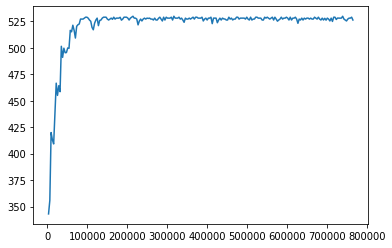

Train:528.795
Train:528.795
Train:527.012
Train:527.903
Train:526.121
Train:527.012
Train:526.121
Train:527.012
Train:527.012
Train:528.795
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000250/checkpoint-250


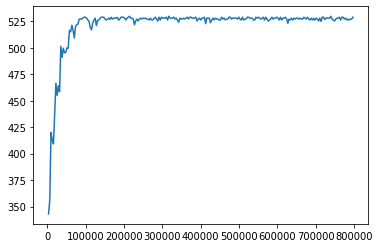

Train:528.795
Train:526.121
Train:527.012
Train:528.795
Train:527.903
Train:528.795
Train:527.012
Train:528.795
Train:526.121
Train:528.795
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000260/checkpoint-260


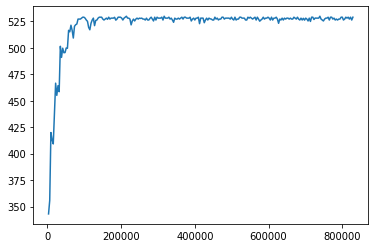

Train:524.055
Train:524.404
Train:527.012
Train:527.012
Train:526.121
Train:524.408
Train:528.795
Train:527.903
Train:527.903
Train:526.888
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000270/checkpoint-270


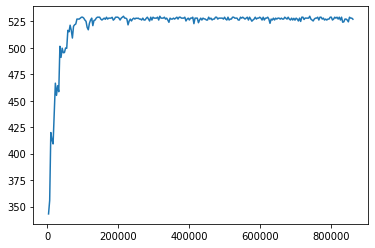

Train:527.903
Train:526.121
Train:529.686
Train:527.012
Train:525.23
Train:528.795
Train:527.012
Train:527.012
Train:528.795
Train:521.836
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000280/checkpoint-280


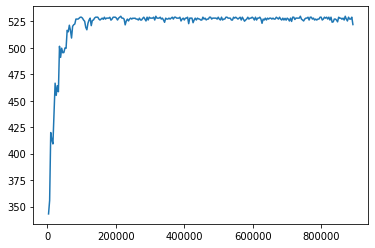

Train:527.903
Train:527.903
Train:528.0
Train:527.903
Train:527.012
Train:526.722
Train:527.012
Train:527.012
Train:528.795
Train:526.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000290/checkpoint-290


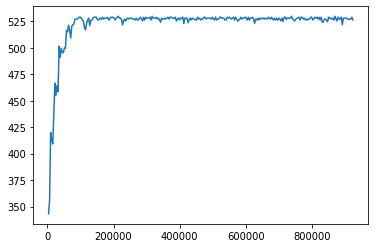

Train:528.795
Train:527.417
Train:525.415
Train:527.012
Train:527.012
Train:528.795
Train:506.676
Train:518.414
Train:529.686
Train:527.012
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000300/checkpoint-300


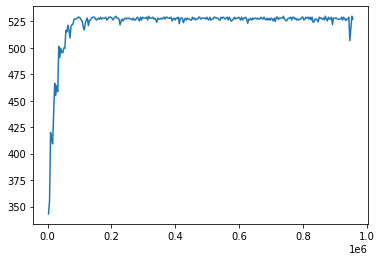

Train:527.012
Train:523.706
Train:527.012
Train:528.795
Train:527.903
Train:528.795
Train:523.935
Train:527.012
Train:527.012
Train:527.903
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000310/checkpoint-310


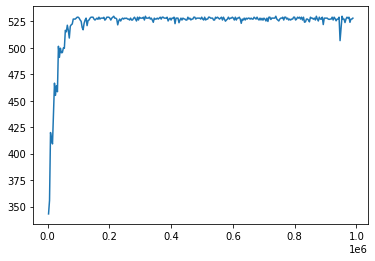

Train:527.903
Train:525.23
Train:528.795
Train:529.686
Train:527.903
Train:527.903
Train:526.121
Train:528.795
Train:527.903
Train:526.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-25-1570w7gnip/checkpoint_000320/checkpoint-320


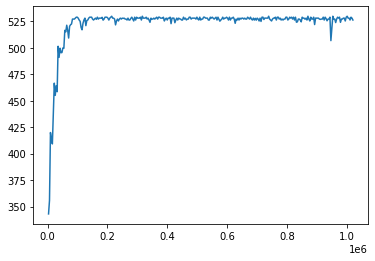

2021-10-19 17:58:52,900	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 17:59:46,283	INFO trainable.py:104 -- Trainable.setup took 52.956 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 17:59:46,288	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:388.941
Train:399.809
Train:446.635
Train:469.142
Train:496.211
Train:524.466
Train:529.627
Train:533.648
Train:528.651
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000010/checkpoint-10


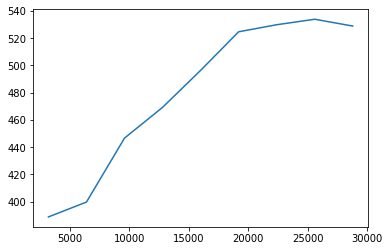

Train:537.942
Train:569.312
Train:558.208
Train:571.86
Train:567.813
Train:569.65
Train:580.581
Train:575.614
Train:585.842
Train:575.923
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000020/checkpoint-20


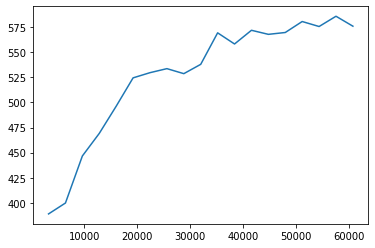

Train:589.027
Train:594.702
Train:589.277
Train:587.957
Train:589.828
Train:594.523
Train:593.137
Train:598.323
Train:600.17
Train:597.321
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000030/checkpoint-30


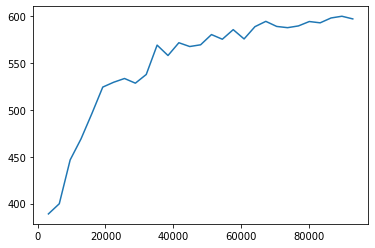

Train:599.415
Train:591.329
Train:600.503
Train:599.751
Train:599.582
Train:600.182
Train:602.553
Train:603.049
Train:598.047
Train:593.329
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000040/checkpoint-40


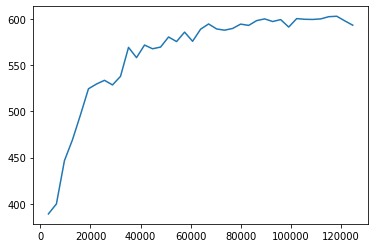

Train:603.306
Train:602.254
Train:602.388
Train:601.378
Train:603.73
Train:602.03
Train:600.809
Train:605.053
Train:604.157
Train:603.368
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000050/checkpoint-50


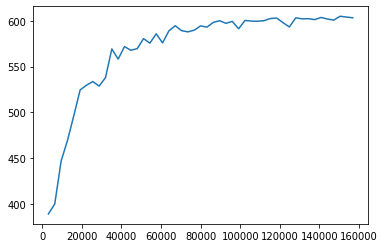

Train:602.567
Train:602.782
Train:605.053
Train:603.344
Train:601.607
Train:602.927
Train:603.621
Train:603.354
Train:605.029
Train:603.368
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000060/checkpoint-60


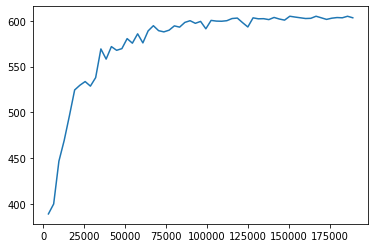

Train:605.139
Train:606.106
Train:602.611
Train:598.199
Train:603.963
Train:603.404
Train:604.24
Train:605.865
Train:604.24
Train:600.879
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000070/checkpoint-70


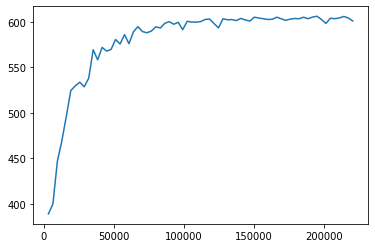

Train:605.024
Train:605.053
Train:605.865
Train:602.985
Train:605.053
Train:604.24
Train:604.24
Train:605.053
Train:604.24
Train:603.427
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000080/checkpoint-80


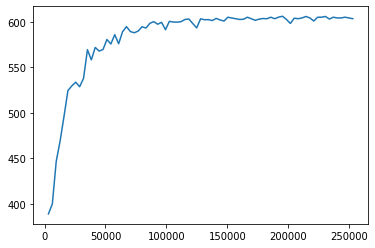

Train:604.24
Train:596.02
Train:605.293
Train:589.118
Train:605.865
Train:603.368
Train:604.481
Train:602.207
Train:604.24
Train:602.378
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000090/checkpoint-90


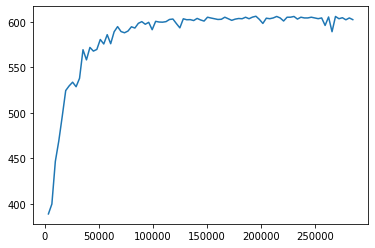

Train:605.053
Train:603.15
Train:604.481
Train:603.427
Train:604.326
Train:604.24
Train:605.865
Train:604.24
Train:606.678
Train:605.053
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000100/checkpoint-100


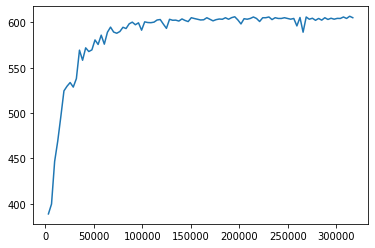

Train:605.865
Train:600.217
Train:604.24
Train:604.24
Train:604.24
Train:604.24
Train:605.865
Train:603.963
Train:603.797
Train:605.053
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000110/checkpoint-110


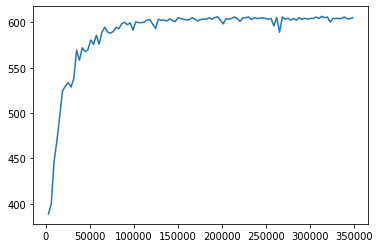

Train:605.796
Train:604.326
Train:605.053
Train:603.427
Train:604.24
Train:603.358
Train:606.678
Train:604.24
Train:605.053
Train:600.612
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000120/checkpoint-120


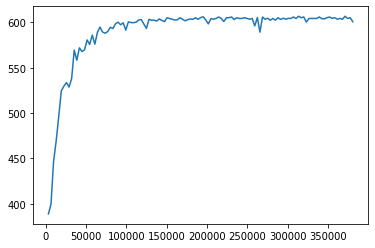

Train:605.865
Train:605.865
Train:604.24
Train:605.053
Train:602.615
Train:605.053
Train:604.24
Train:605.053
Train:605.865
Train:604.24
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000130/checkpoint-130


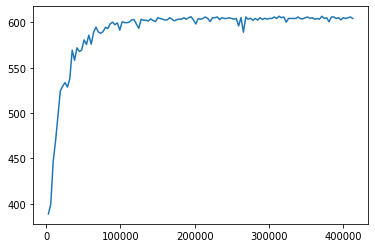

Train:605.031
Train:604.24
Train:606.678
Train:601.122
Train:605.865
Train:602.719
Train:605.053
Train:605.053
Train:604.24
Train:600.027
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000140/checkpoint-140


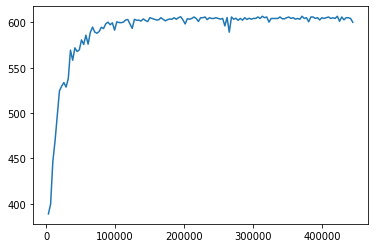

Train:603.28
Train:602.589
Train:603.354
Train:603.354
Train:605.115
Train:605.053
Train:603.532
Train:605.865
Train:605.865
Train:602.555
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000150/checkpoint-150


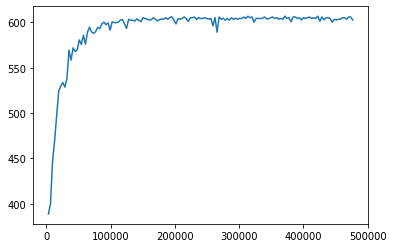

Train:605.053
Train:602.555
Train:604.481
Train:604.24
Train:603.475
Train:603.668
Train:604.24
Train:604.481
Train:603.427
Train:605.865
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000160/checkpoint-160


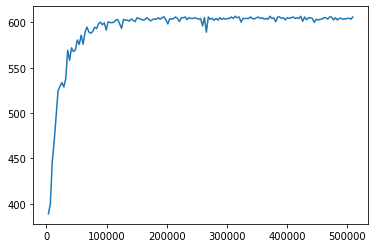

Train:605.865
Train:605.053
Train:603.909
Train:603.668
Train:604.481
Train:605.293
Train:603.096
Train:604.481
Train:604.39
Train:606.106
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000170/checkpoint-170


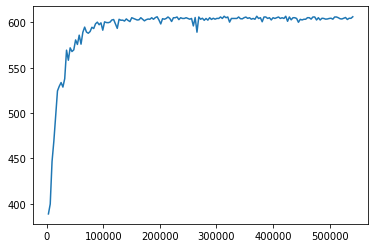

Train:606.106
Train:603.644
Train:605.534
Train:605.27
Train:605.534
Train:604.39
Train:604.39
Train:604.721
Train:604.962
Train:604.962
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000180/checkpoint-180


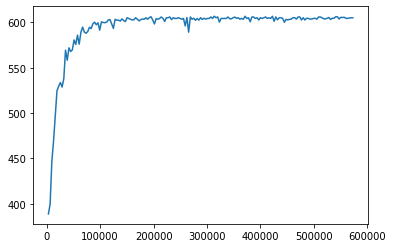

Train:603.577
Train:605.534
Train:599.582
Train:604.39
Train:604.962
Train:605.534
Train:605.534
Train:604.721
Train:606.106
Train:604.39
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000190/checkpoint-190


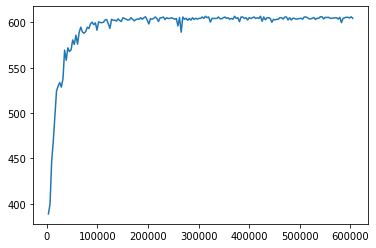

Train:605.534
Train:604.39
Train:605.534
Train:605.534
Train:604.962
Train:604.962
Train:606.106
Train:604.698
Train:604.962
Train:604.962
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000200/checkpoint-200


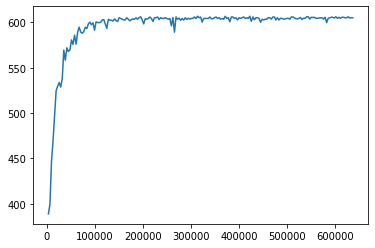

Train:604.962
Train:601.512
Train:604.962
Train:605.534
Train:606.106
Train:604.962
Train:605.534
Train:605.534
Train:605.293
Train:604.39
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000210/checkpoint-210


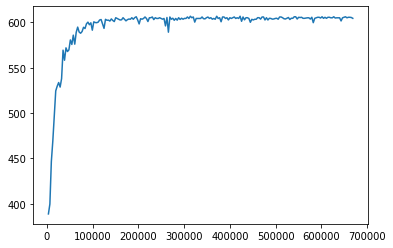

Train:606.678
Train:604.39
Train:604.962
Train:605.534
Train:605.534
Train:605.534
Train:605.534
Train:601.015
Train:605.293
Train:597.314
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000220/checkpoint-220


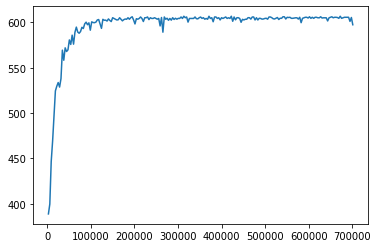

Train:604.962
Train:599.407
Train:606.106
Train:605.534
Train:605.865
Train:606.106
Train:603.818
Train:605.439
Train:603.818
Train:605.534
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000230/checkpoint-230


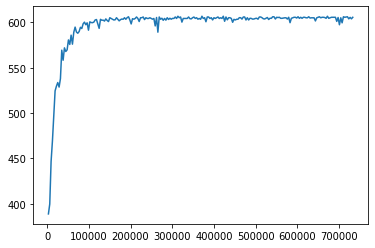

Train:601.603
Train:604.962
Train:604.39
Train:600.253
Train:604.962
Train:606.106
Train:605.534
Train:604.962
Train:606.106
Train:604.962
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000240/checkpoint-240


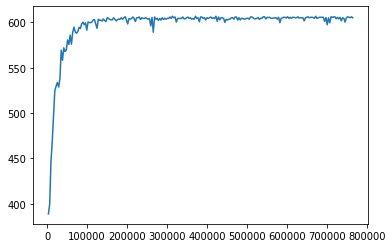

Train:606.678
Train:604.962
Train:605.534
Train:604.962
Train:604.962
Train:604.962
Train:606.106
Train:604.39
Train:597.964
Train:605.534
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000250/checkpoint-250


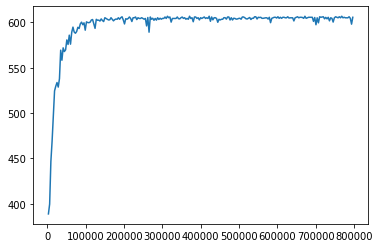

Train:600.273
Train:604.962
Train:605.534
Train:605.534
Train:605.534
Train:604.962
Train:605.534
Train:604.962
Train:604.39
Train:605.534
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000260/checkpoint-260


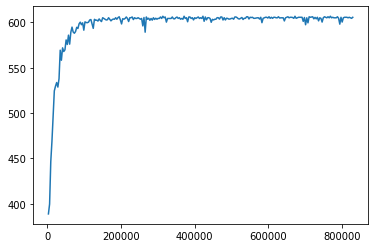

Train:606.678
Train:605.534
Train:605.534
Train:605.534
Train:599.69
Train:603.818
Train:605.534
Train:604.962
Train:604.39
Train:604.962
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000270/checkpoint-270


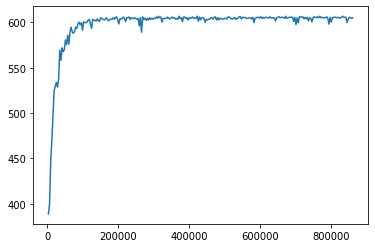

Train:601.536
Train:603.741
Train:606.106
Train:605.534
Train:606.106
Train:596.315
Train:605.534
Train:606.106
Train:604.39
Train:602.409
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000280/checkpoint-280


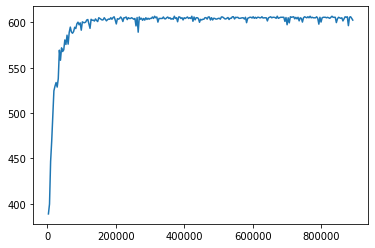

Train:604.962
Train:603.546
Train:605.534
Train:605.293
Train:604.962
Train:605.534
Train:606.106
Train:604.962
Train:604.39
Train:606.106
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000290/checkpoint-290


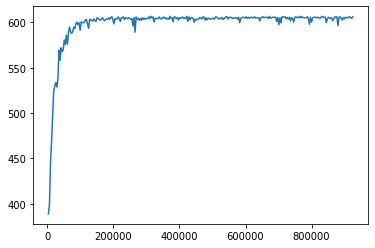

Train:604.39
Train:604.962
Train:604.962
Train:605.534
Train:606.678
Train:605.534
Train:604.962
Train:604.962
Train:606.106
Train:605.534
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000300/checkpoint-300


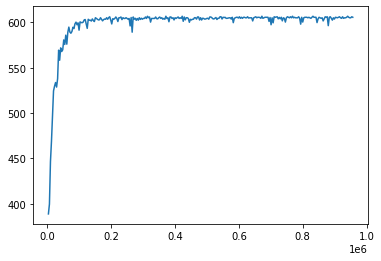

Train:598.456
Train:606.106
Train:598.879
Train:605.534
Train:605.534
Train:598.592
Train:606.678
Train:605.534
Train:604.962
Train:604.39
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000310/checkpoint-310


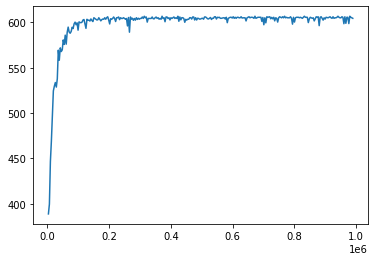

Train:606.678
Train:606.106
Train:604.39
Train:605.534
Train:604.962
Train:605.534
Train:606.106
Train:604.39
Train:606.106
Train:600.06
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_17-58-53s0vcum3y/checkpoint_000320/checkpoint-320


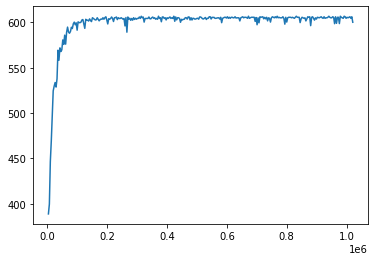

2021-10-19 18:32:26,842	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 18:33:20,047	INFO trainable.py:104 -- Trainable.setup took 52.791 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 18:33:20,051	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:268.057
Train:332.384
Train:395.551
Train:428.51
Train:359.108
Train:466.676
Train:477.314
Train:472.643
Train:495.47
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000010/checkpoint-10


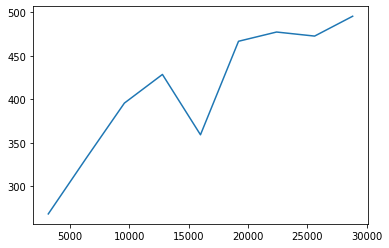

Train:491.907
Train:498.066
Train:498.495
Train:492.648
Train:513.804
Train:503.008
Train:494.82
Train:516.491
Train:516.108
Train:522.725
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000020/checkpoint-20


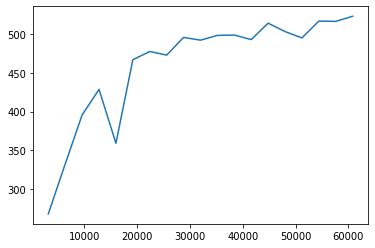

Train:520.414
Train:526.847
Train:526.474
Train:515.818
Train:521.891
Train:525.129
Train:523.991
Train:518.969
Train:524.721
Train:523.639
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000030/checkpoint-30


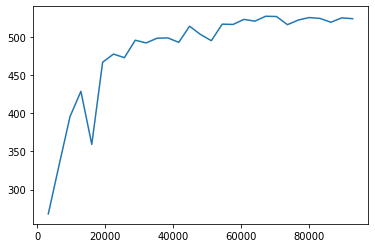

Train:520.275
Train:529.499
Train:525.83
Train:527.556
Train:530.274
Train:527.983
Train:523.539
Train:527.953
Train:526.633
Train:526.735
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000040/checkpoint-40


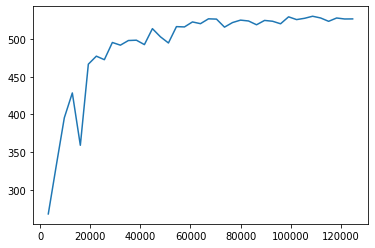

Train:530.561
Train:535.153
Train:532.0
Train:530.536
Train:530.757
Train:529.087
Train:528.718
Train:528.535
Train:532.411
Train:532.08
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000050/checkpoint-50


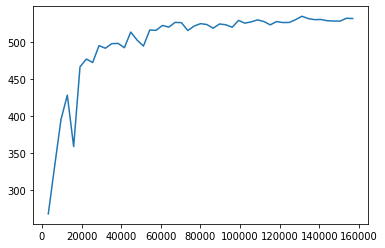

Train:527.246
Train:532.367
Train:529.415
Train:532.322
Train:530.491
Train:535.52
Train:533.71
Train:528.503
Train:532.136
Train:530.842
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000060/checkpoint-60


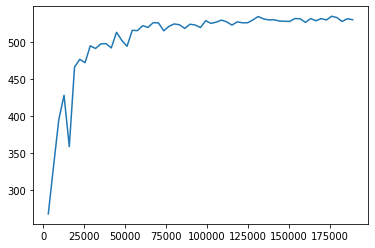

Train:533.651
Train:532.448
Train:529.353
Train:527.8
Train:529.28
Train:532.286
Train:532.483
Train:530.866
Train:529.244
Train:530.944
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000070/checkpoint-70


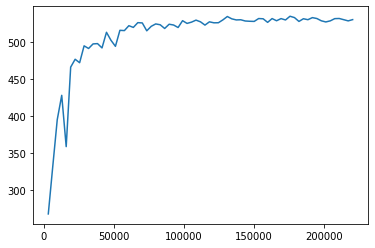

Train:527.559
Train:535.594
Train:530.777
Train:531.243
Train:534.028
Train:530.892
Train:531.025
Train:530.626
Train:530.898
Train:534.049
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000080/checkpoint-80


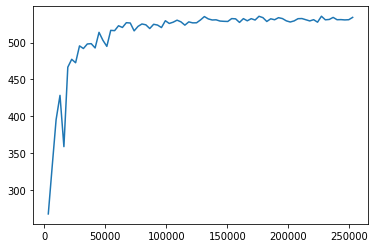

Train:529.422
Train:529.26
Train:534.175
Train:534.049
Train:529.213
Train:529.392
Train:532.405
Train:530.88
Train:534.175
Train:534.138
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000090/checkpoint-90


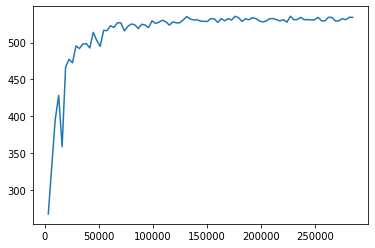

Train:527.597
Train:532.702
Train:532.426
Train:532.53
Train:530.892
Train:530.886
Train:529.235
Train:534.169
Train:529.242
Train:534.018
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000100/checkpoint-100


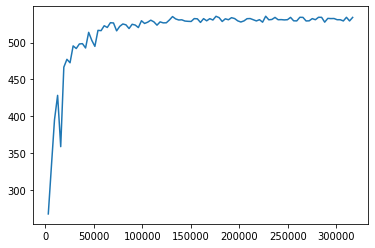

Train:530.776
Train:534.132
Train:530.236
Train:530.807
Train:529.248
Train:534.132
Train:530.88
Train:532.374
Train:530.886
Train:530.892
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000110/checkpoint-110


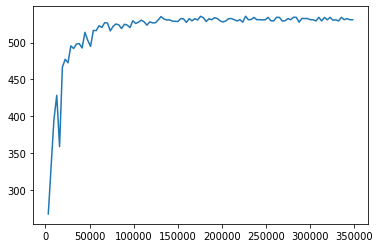

Train:536.245
Train:530.892
Train:530.886
Train:529.254
Train:532.537
Train:534.138
Train:530.892
Train:530.932
Train:531.552
Train:532.696
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000120/checkpoint-120


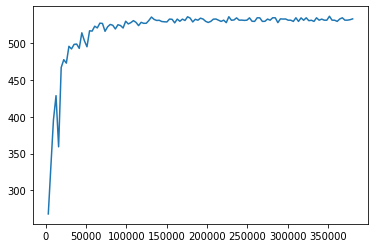

Train:525.874
Train:532.704
Train:532.457
Train:530.803
Train:534.138
Train:535.776
Train:530.891
Train:531.029
Train:532.86
Train:531.196
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000130/checkpoint-130


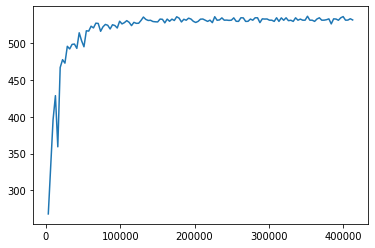

Train:532.524
Train:530.843
Train:526.082
Train:531.058
Train:533.162
Train:532.53
Train:533.17
Train:531.224
Train:529.391
Train:531.379
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000140/checkpoint-140


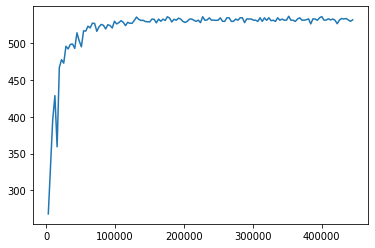

Train:534.829
Train:527.578
Train:534.457
Train:533.19
Train:530.625
Train:534.42
Train:533.637
Train:533.145
Train:531.09
Train:536.273
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000150/checkpoint-150


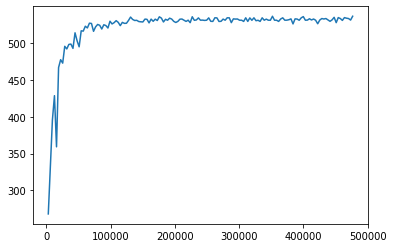

Train:527.609
Train:534.922
Train:532.9
Train:534.782
Train:531.288
Train:531.217
Train:532.788
Train:533.151
Train:532.674
Train:535.169
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000160/checkpoint-160


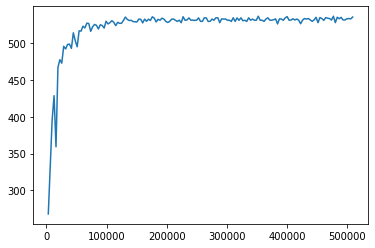

Train:531.55
Train:531.383
Train:531.549
Train:533.53
Train:531.549
Train:529.579
Train:529.576
Train:533.465
Train:531.526
Train:535.475
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000170/checkpoint-170


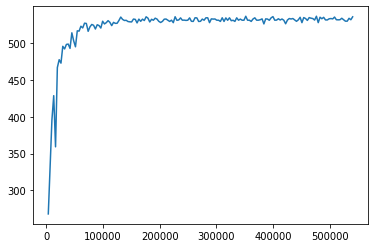

Train:531.464
Train:531.483
Train:533.376
Train:532.115
Train:533.525
Train:531.543
Train:533.459
Train:531.489
Train:529.235
Train:531.543
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000180/checkpoint-180


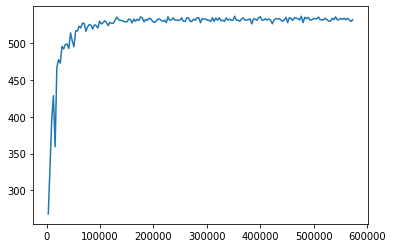

Train:527.76
Train:529.579
Train:529.579
Train:527.597
Train:529.557
Train:533.219
Train:531.741
Train:535.501
Train:530.162
Train:533.202
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000190/checkpoint-190


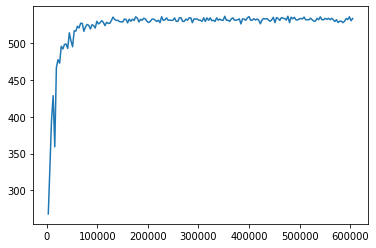

Train:535.329
Train:533.531
Train:535.501
Train:533.473
Train:531.555
Train:529.585
Train:537.406
Train:534.042
Train:531.526
Train:533.427
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000200/checkpoint-200


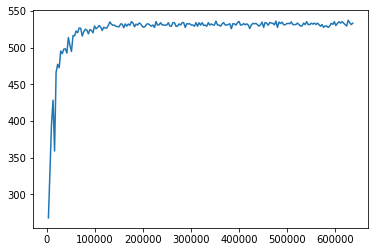

Train:535.322
Train:535.485
Train:529.544
Train:535.397
Train:533.491
Train:533.5
Train:533.515
Train:535.451
Train:531.546
Train:533.531
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000210/checkpoint-210


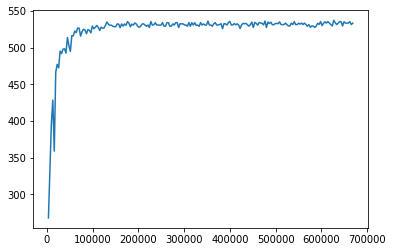

Train:528.032
Train:533.531
Train:533.502
Train:531.555
Train:531.546
Train:535.501
Train:535.501
Train:529.576
Train:527.753
Train:533.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000220/checkpoint-220


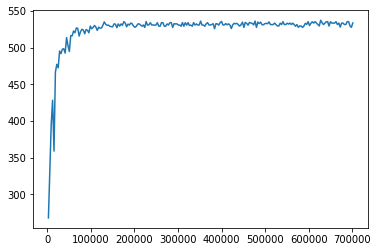

Train:533.531
Train:533.515
Train:531.324
Train:527.615
Train:530.332
Train:526.901
Train:533.531
Train:533.531
Train:527.529
Train:535.499
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000230/checkpoint-230


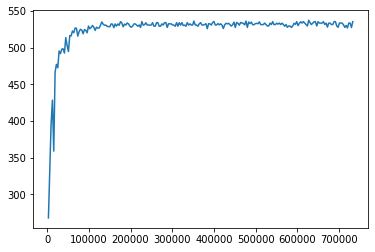

Train:530.319
Train:531.546
Train:527.877
Train:531.548
Train:531.546
Train:533.526
Train:533.51
Train:531.53
Train:533.441
Train:535.501
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000240/checkpoint-240


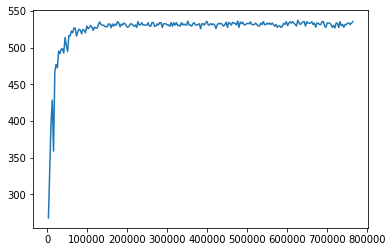

Train:527.962
Train:531.734
Train:533.515
Train:533.515
Train:527.762
Train:531.275
Train:535.48
Train:533.515
Train:535.457
Train:533.531
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000250/checkpoint-250


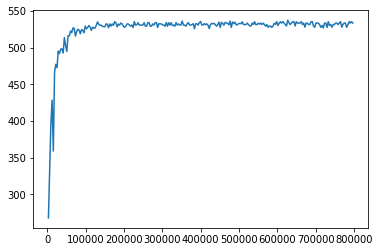

Train:531.53
Train:531.561
Train:535.485
Train:531.53
Train:531.561
Train:533.531
Train:535.485
Train:533.657
Train:531.524
Train:531.539
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000260/checkpoint-260


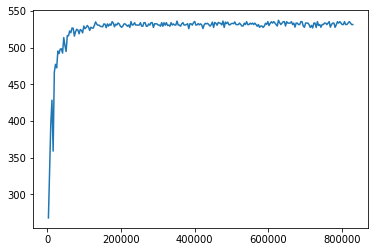

Train:535.472
Train:529.732
Train:533.5
Train:527.753
Train:533.471
Train:533.613
Train:531.596
Train:531.691
Train:529.57
Train:533.259
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000270/checkpoint-270


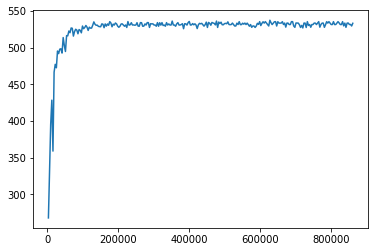

Train:533.534
Train:529.706
Train:535.673
Train:535.668
Train:535.501
Train:537.471
Train:533.729
Train:531.53
Train:533.659
Train:531.475
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000280/checkpoint-280


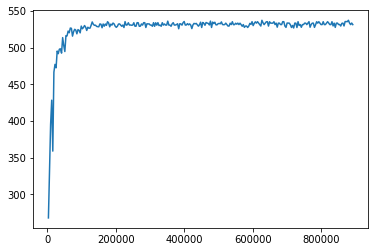

Train:529.823
Train:527.745
Train:529.449
Train:529.603
Train:531.718
Train:531.718
Train:531.949
Train:533.832
Train:529.67
Train:529.415
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000290/checkpoint-290


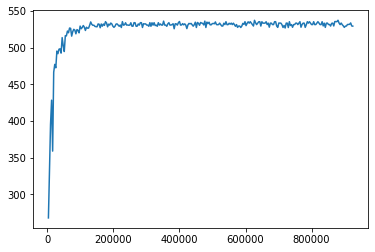

Train:533.515
Train:535.629
Train:535.575
Train:531.705
Train:533.531
Train:533.656
Train:529.209
Train:535.766
Train:533.709
Train:533.8
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000300/checkpoint-300


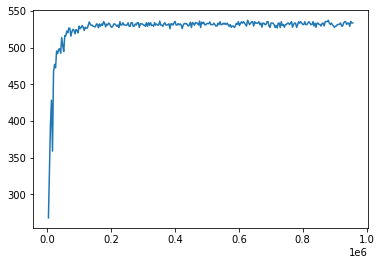

Train:522.168
Train:533.877
Train:535.627
Train:532.031
Train:533.644
Train:531.361
Train:530.234
Train:537.471
Train:526.214
Train:533.391
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000310/checkpoint-310


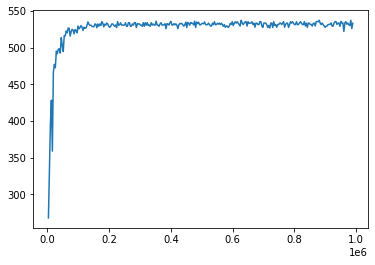

Train:533.966
Train:527.464
Train:529.493
Train:531.282
Train:535.23
Train:533.177
Train:529.207
Train:535.501
Train:535.48
Train:533.966
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_18-32-271qx_7z3z/checkpoint_000320/checkpoint-320


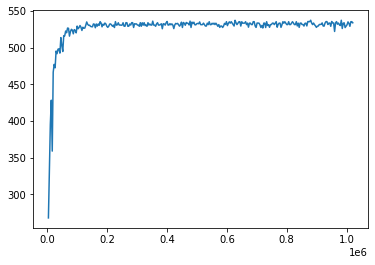

2021-10-19 19:06:04,754	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 19:06:57,261	INFO trainable.py:104 -- Trainable.setup took 52.083 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 19:06:57,263	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:248.391
Train:285.482
Train:254.295
Train:303.752
Train:362.725
Train:387.372
Train:380.82
Train:385.425
Train:422.065
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000010/checkpoint-10


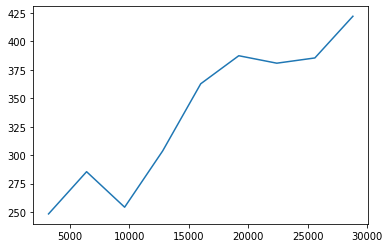

Train:420.581
Train:423.968
Train:416.69
Train:441.063
Train:442.059
Train:442.891
Train:446.329
Train:461.577
Train:435.92
Train:448.251
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000020/checkpoint-20


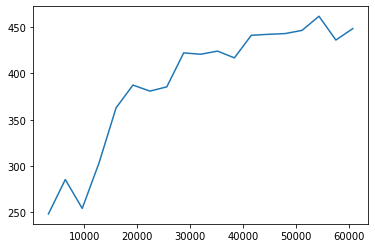

Train:445.965
Train:461.214
Train:454.982
Train:459.236
Train:455.251
Train:449.929
Train:448.443
Train:474.372
Train:474.725
Train:470.865
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000030/checkpoint-30


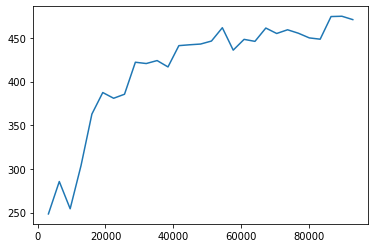

Train:476.491
Train:480.204
Train:469.655
Train:474.142
Train:480.323
Train:472.586
Train:481.161
Train:477.188
Train:485.678
Train:485.791
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000040/checkpoint-40


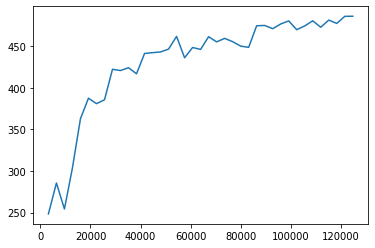

Train:483.324
Train:478.835
Train:487.593
Train:484.737
Train:486.27
Train:485.214
Train:479.674
Train:465.597
Train:483.064
Train:479.969
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000050/checkpoint-50


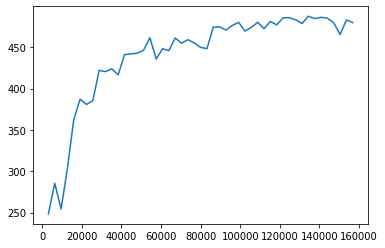

Train:476.751
Train:472.969
Train:484.089
Train:484.606
Train:485.908
Train:485.487
Train:482.456
Train:489.617
Train:476.475
Train:485.412
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000060/checkpoint-60


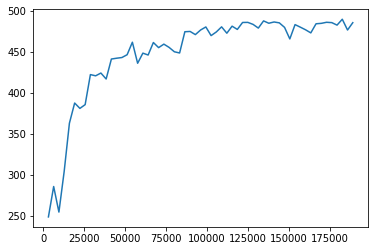

Train:486.778
Train:491.211
Train:490.791
Train:479.637
Train:488.746
Train:490.993
Train:485.571
Train:490.314
Train:490.782
Train:486.481
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000070/checkpoint-70


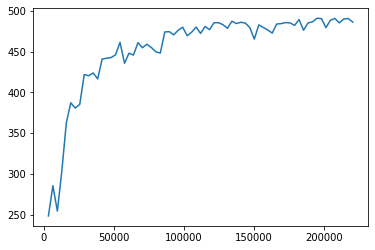

Train:489.762
Train:488.372
Train:491.854
Train:482.845
Train:482.293
Train:490.562
Train:490.982
Train:491.713
Train:491.693
Train:491.922
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000080/checkpoint-80


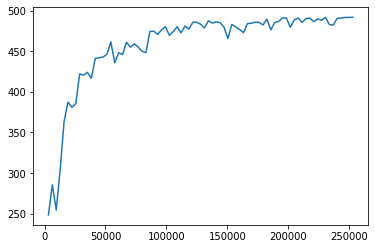

Train:491.44
Train:491.539
Train:491.605
Train:491.506
Train:491.43
Train:491.051
Train:479.455
Train:491.319
Train:492.102
Train:490.131
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000090/checkpoint-90


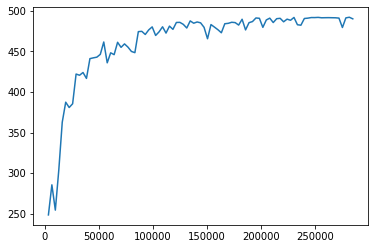

Train:491.675
Train:492.158
Train:491.757
Train:491.974
Train:487.262
Train:491.378
Train:490.281
Train:491.846
Train:491.782
Train:492.466
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000100/checkpoint-100


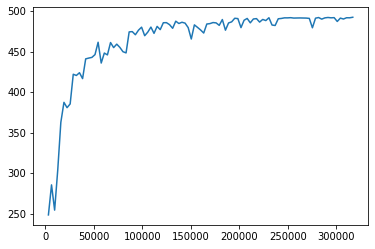

Train:489.541
Train:492.22
Train:491.906
Train:492.02
Train:491.223
Train:491.042
Train:483.497
Train:490.282
Train:491.544
Train:491.743
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000110/checkpoint-110


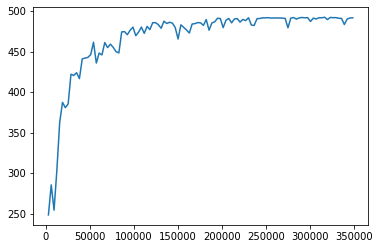

Train:491.909
Train:491.463
Train:491.666
Train:491.715
Train:491.588
Train:490.076
Train:491.96
Train:491.911
Train:492.016
Train:491.062
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000120/checkpoint-120


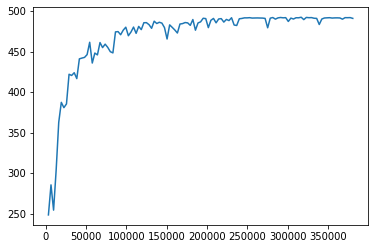

Train:492.219
Train:492.403
Train:491.559
Train:492.662
Train:491.971
Train:491.437
Train:492.878
Train:490.848
Train:491.29
Train:493.063
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000130/checkpoint-130


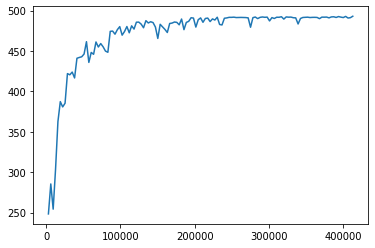

Train:492.715
Train:493.747
Train:490.104
Train:493.25
Train:490.535
Train:494.019
Train:493.119
Train:491.862
Train:493.362
Train:494.421
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000140/checkpoint-140


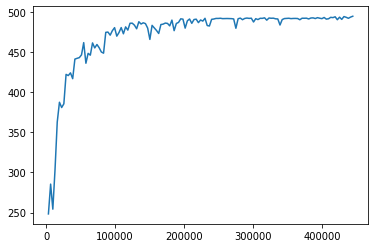

Train:490.662
Train:493.139
Train:493.978
Train:491.244
Train:492.345
Train:491.455
Train:492.757
Train:490.482
Train:495.793
Train:494.734
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000150/checkpoint-150


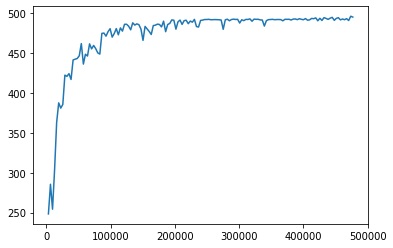

Train:491.549
Train:492.219
Train:494.737
Train:493.006
Train:495.498
Train:493.065
Train:493.557
Train:493.775
Train:492.654
Train:493.195
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000160/checkpoint-160


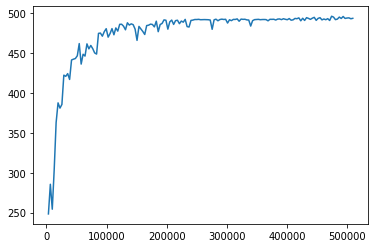

Train:494.018
Train:493.975
Train:493.866
Train:493.214
Train:492.248
Train:494.134
Train:494.128
Train:494.115
Train:493.896
Train:494.027
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000170/checkpoint-170


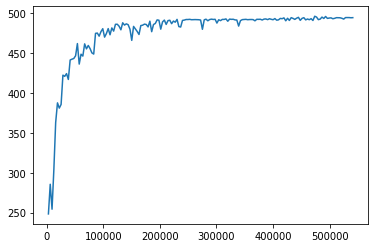

Train:493.118
Train:493.964
Train:492.335
Train:493.154
Train:492.298
Train:493.859
Train:492.275
Train:494.089
Train:493.18
Train:491.353
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000180/checkpoint-180


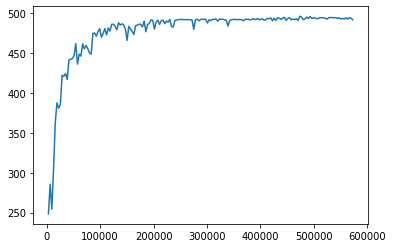

Train:494.92
Train:454.129
Train:493.15
Train:493.204
Train:494.186
Train:488.42
Train:493.072
Train:491.392
Train:487.472
Train:492.236
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000190/checkpoint-190


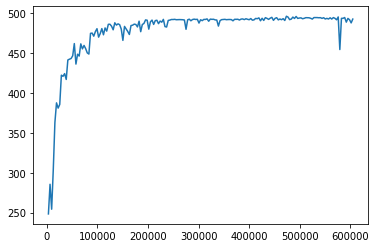

Train:493.754
Train:488.537
Train:493.968
Train:492.318
Train:493.146
Train:493.974
Train:494.201
Train:495.726
Train:491.94
Train:493.924
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000200/checkpoint-200


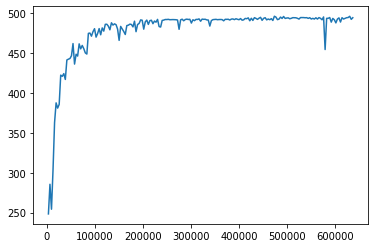

Train:494.067
Train:493.183
Train:494.86
Train:494.198
Train:492.306
Train:493.143
Train:494.424
Train:493.196
Train:494.035
Train:492.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000210/checkpoint-210


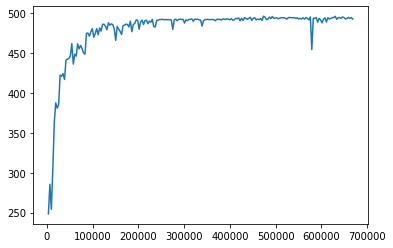

Train:492.839
Train:494.919
Train:495.118
Train:494.101
Train:490.479
Train:492.676
Train:494.915
Train:494.119
Train:493.964
Train:493.945
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000220/checkpoint-220


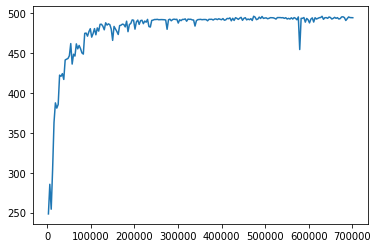

Train:490.885
Train:494.996
Train:493.232
Train:494.177
Train:495.009
Train:492.388
Train:493.209
Train:495.02
Train:494.125
Train:493.272
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000230/checkpoint-230


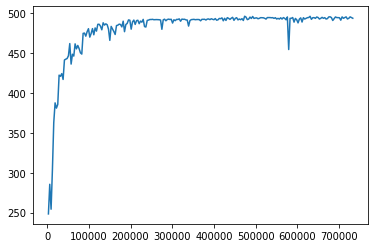

Train:489.133
Train:492.361
Train:492.366
Train:493.245
Train:491.438
Train:493.14
Train:494.196
Train:492.315
Train:493.282
Train:491.428
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000240/checkpoint-240


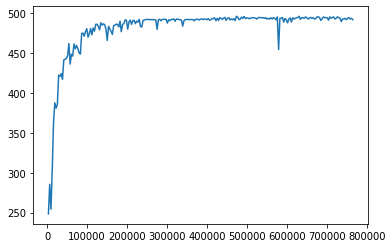

Train:490.58
Train:493.297
Train:494.138
Train:494.087
Train:495.04
Train:494.056
Train:494.198
Train:495.002
Train:494.025
Train:492.341
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000250/checkpoint-250


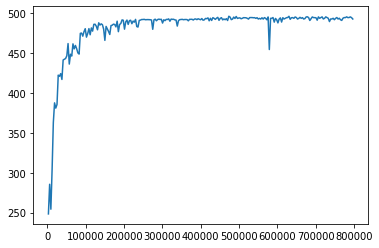

Train:494.96
Train:492.439
Train:493.277
Train:492.379
Train:490.274
Train:493.25
Train:494.999
Train:492.321
Train:494.069
Train:494.951
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000260/checkpoint-260


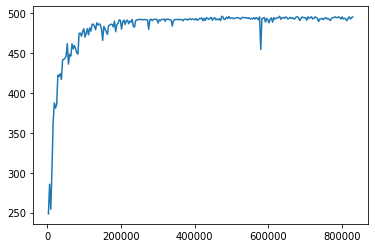

Train:494.872
Train:493.161
Train:493.57
Train:494.073
Train:493.276
Train:493.165
Train:492.419
Train:490.022
Train:493.237
Train:491.689
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000270/checkpoint-270


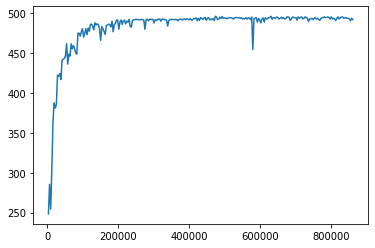

Train:491.409
Train:493.134
Train:494.122
Train:494.15
Train:494.179
Train:493.256
Train:493.215
Train:492.338
Train:493.127
Train:494.827
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000280/checkpoint-280


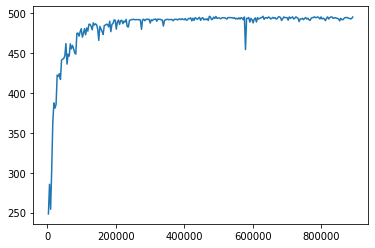

Train:494.129
Train:489.389
Train:487.914
Train:493.188
Train:492.969
Train:492.364
Train:495.088
Train:495.004
Train:494.095
Train:492.353
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000290/checkpoint-290


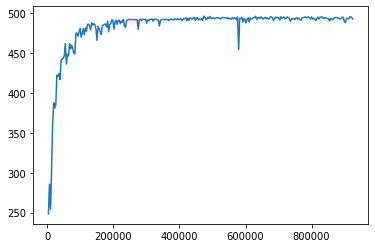

Train:493.249
Train:495.009
Train:493.048
Train:492.442
Train:493.164
Train:493.152
Train:490.772
Train:486.608
Train:493.31
Train:495.847
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000300/checkpoint-300


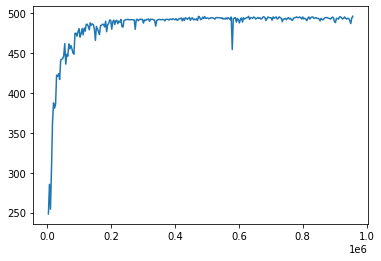

Train:494.934
Train:494.242
Train:493.271
Train:495.821
Train:494.128
Train:491.01
Train:493.392
Train:491.434
Train:492.544
Train:494.115
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000310/checkpoint-310


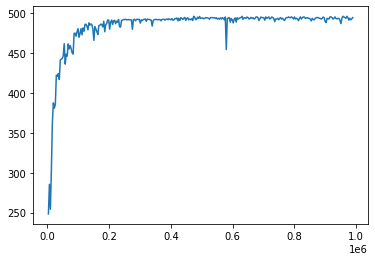

Train:492.38
Train:493.235
Train:491.442
Train:494.169
Train:492.193
Train:492.44
Train:492.362
Train:491.684
Train:494.072
Train:491.743
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-06-05xzr2k3ot/checkpoint_000320/checkpoint-320


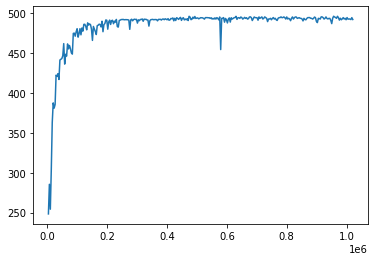

2021-10-19 19:39:38,951	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 19:40:31,365	INFO trainable.py:104 -- Trainable.setup took 51.983 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 19:40:31,367	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:402.555
Train:347.851
Train:397.255
Train:414.991
Train:448.663
Train:471.366
Train:486.361
Train:499.914
Train:505.506
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000010/checkpoint-10


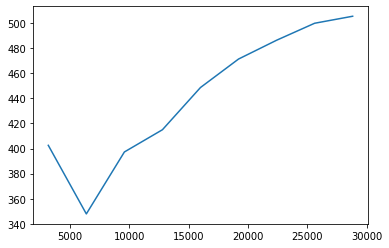

Train:536.375
Train:522.107
Train:543.58
Train:554.79
Train:551.049
Train:558.874
Train:568.26
Train:569.112
Train:576.354
Train:569.324
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000020/checkpoint-20


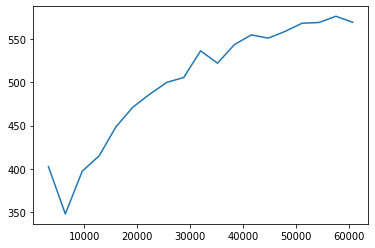

Train:577.915
Train:582.508
Train:580.303
Train:582.42
Train:584.894
Train:590.205
Train:589.143
Train:591.449
Train:591.443
Train:596.271
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000030/checkpoint-30


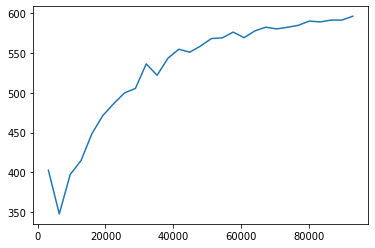

Train:596.828
Train:596.919
Train:599.539
Train:598.167
Train:596.839
Train:592.713
Train:598.749
Train:590.189
Train:598.946
Train:597.615
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000040/checkpoint-40


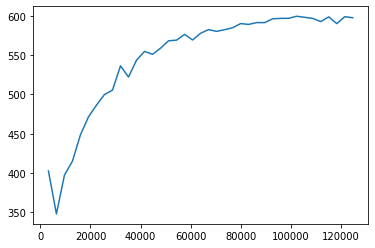

Train:599.391
Train:599.159
Train:598.073
Train:599.623
Train:597.854
Train:599.217
Train:599.553
Train:599.251
Train:597.917
Train:590.836
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000050/checkpoint-50


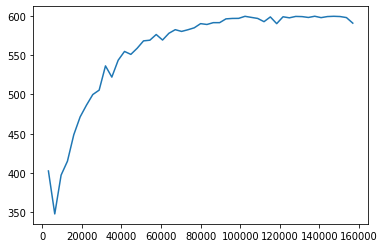

Train:599.693
Train:597.685
Train:599.412
Train:599.623
Train:599.553
Train:599.623
Train:599.483
Train:599.763
Train:599.319
Train:595.664
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000060/checkpoint-60


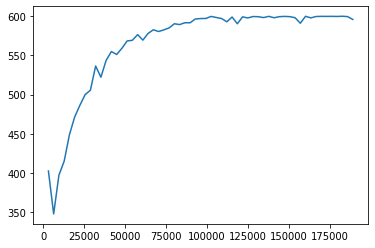

Train:599.623
Train:591.089
Train:599.412
Train:599.553
Train:597.072
Train:599.693
Train:599.623
Train:599.483
Train:597.847
Train:599.553
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000070/checkpoint-70


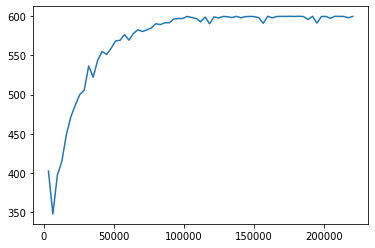

Train:599.623
Train:599.693
Train:599.623
Train:599.623
Train:599.693
Train:599.321
Train:599.623
Train:599.623
Train:599.483
Train:599.553
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000080/checkpoint-80


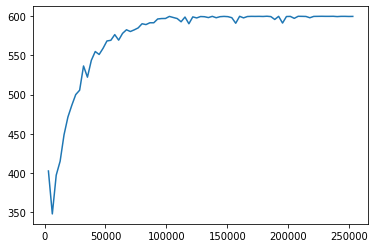

Train:599.321
Train:599.483
Train:599.453
Train:599.693
Train:599.693
Train:599.251
Train:599.017
Train:599.693
Train:599.623
Train:599.483
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000090/checkpoint-90


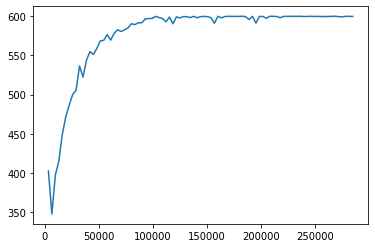

Train:599.553
Train:599.623
Train:599.623
Train:596.979
Train:599.693
Train:599.693
Train:599.553
Train:599.483
Train:599.483
Train:599.693
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000100/checkpoint-100


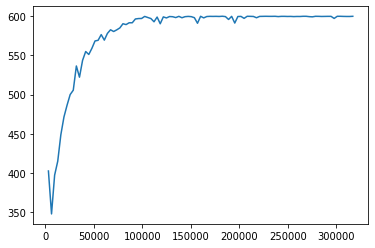

Train:597.405
Train:599.693
Train:599.412
Train:599.483
Train:599.553
Train:599.693
Train:599.693
Train:599.553
Train:599.693
Train:599.483
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000110/checkpoint-110


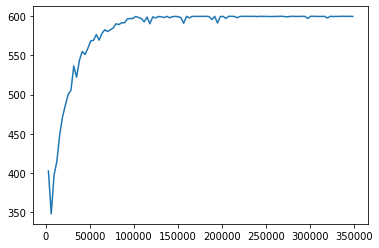

Train:599.693
Train:589.898
Train:591.161
Train:596.21
Train:592.969
Train:595.053
Train:597.917
Train:599.693
Train:599.483
Train:598.629
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000120/checkpoint-120


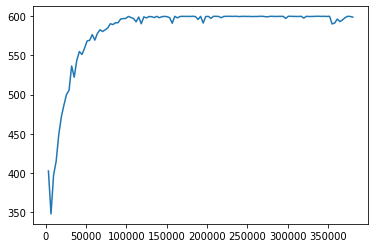

Train:588.975
Train:599.693
Train:597.776
Train:599.553
Train:599.623
Train:599.553
Train:596.491
Train:599.623
Train:599.553
Train:599.389
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000130/checkpoint-130


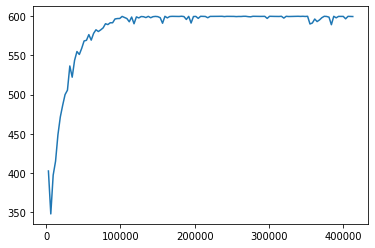

Train:599.693
Train:599.693
Train:599.553
Train:599.701
Train:588.424
Train:599.553
Train:599.623
Train:599.623
Train:599.693
Train:599.623
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000140/checkpoint-140


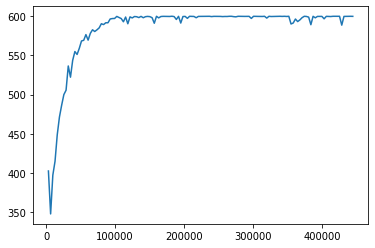

Train:599.483
Train:599.553
Train:599.763
Train:599.763
Train:599.42
Train:599.553
Train:599.553
Train:599.553
Train:599.42
Train:599.693
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000150/checkpoint-150


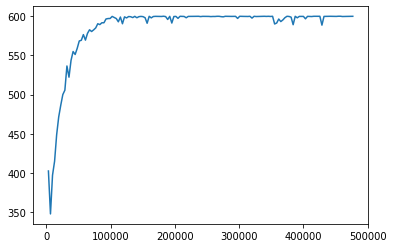

Train:599.623
Train:599.623
Train:599.623
Train:599.623
Train:599.483
Train:599.623
Train:599.483
Train:599.623
Train:599.553
Train:595.118
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000160/checkpoint-160


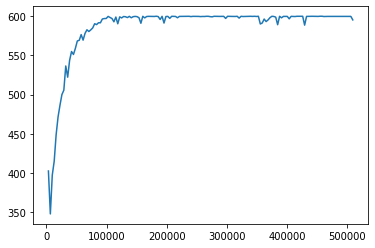

Train:599.483
Train:599.693
Train:599.483
Train:599.623
Train:598.308
Train:599.623
Train:599.553
Train:599.553
Train:599.483
Train:599.693
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000170/checkpoint-170


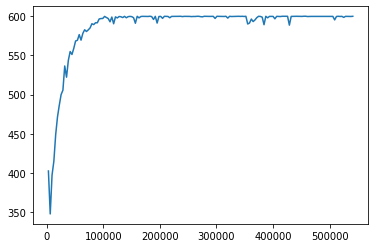

Train:599.118
Train:599.701
Train:596.709
Train:599.553
Train:599.693
Train:599.772
Train:599.623
Train:599.693
Train:599.553
Train:599.483
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000180/checkpoint-180


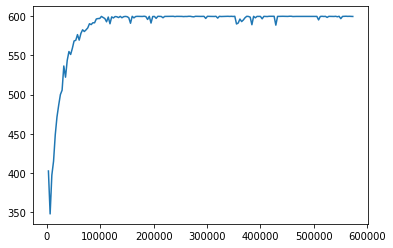

Train:599.623
Train:599.623
Train:599.412
Train:599.553
Train:599.693
Train:599.693
Train:599.623
Train:599.623
Train:599.483
Train:599.623
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000190/checkpoint-190


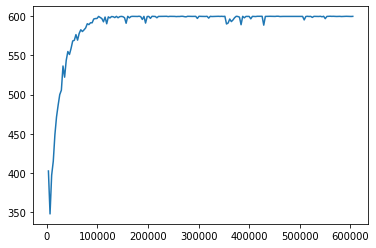

Train:599.553
Train:599.623
Train:599.553
Train:599.483
Train:598.308
Train:599.282
Train:599.553
Train:599.623
Train:599.693
Train:599.693
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000200/checkpoint-200


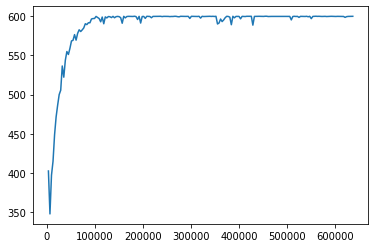

Train:599.693
Train:599.701
Train:599.623
Train:599.693
Train:599.693
Train:599.623
Train:599.553
Train:599.553
Train:599.553
Train:599.553
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000210/checkpoint-210


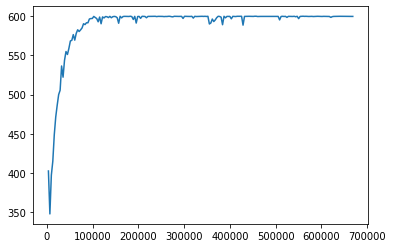

Train:597.002
Train:599.553
Train:599.483
Train:599.623
Train:599.483
Train:599.397
Train:597.917
Train:599.553
Train:599.553
Train:597.917
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000220/checkpoint-220


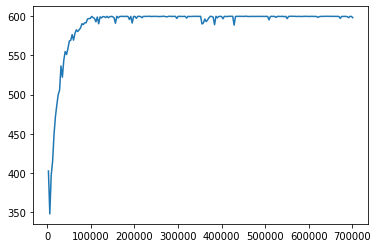

Train:598.594
Train:599.483
Train:599.483
Train:599.483
Train:599.623
Train:599.763
Train:599.623
Train:599.623
Train:599.483
Train:599.623
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000230/checkpoint-230


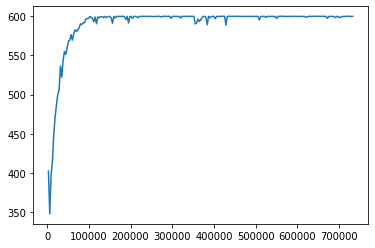

Train:599.693
Train:599.693
Train:599.693
Train:599.623
Train:599.631
Train:599.553
Train:599.42
Train:599.85
Train:599.631
Train:599.693
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000240/checkpoint-240


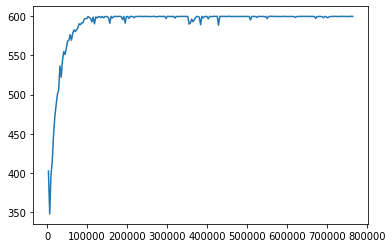

Train:599.483
Train:599.623
Train:595.289
Train:599.096
Train:599.483
Train:599.483
Train:599.693
Train:599.483
Train:599.693
Train:599.693
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000250/checkpoint-250


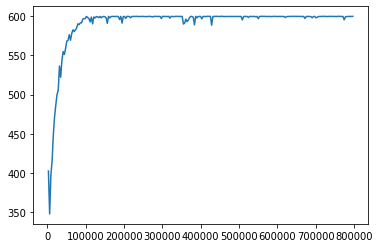

Train:599.763
Train:599.623
Train:598.558
Train:599.623
Train:599.412
Train:599.623
Train:599.553
Train:599.553
Train:599.763
Train:599.096
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000260/checkpoint-260


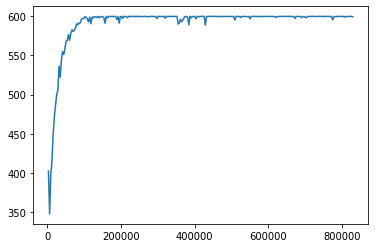

Train:599.026
Train:598.418
Train:599.693
Train:599.623
Train:598.774
Train:599.623
Train:599.623
Train:599.693
Train:599.631
Train:594.504
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000270/checkpoint-270


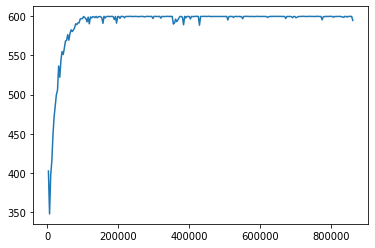

Train:592.657
Train:596.21
Train:597.847
Train:596.21
Train:599.623
Train:599.623
Train:599.623
Train:599.693
Train:599.483
Train:599.623
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000280/checkpoint-280


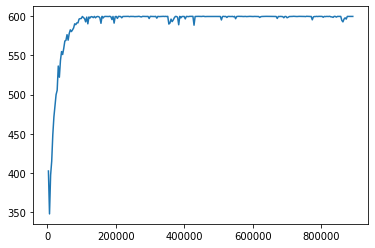

Train:599.623
Train:599.623
Train:590.949
Train:597.917
Train:599.623
Train:599.553
Train:599.623
Train:599.623
Train:599.553
Train:599.763
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000290/checkpoint-290


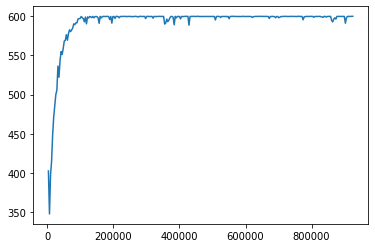

Train:599.096
Train:599.553
Train:599.553
Train:599.553
Train:599.623
Train:599.412
Train:599.483
Train:599.483
Train:599.623
Train:599.623
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000300/checkpoint-300


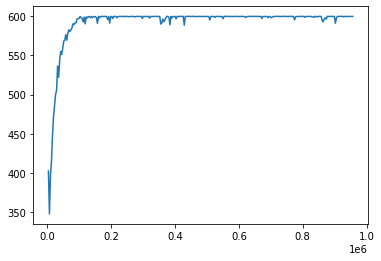

Train:592.713
Train:594.15
Train:591.447
Train:596.336
Train:595.535
Train:599.693
Train:598.308
Train:599.553
Train:591.089
Train:599.483
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000310/checkpoint-310


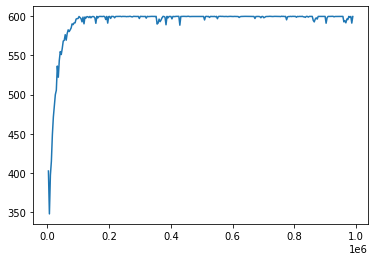

Train:599.701
Train:599.693
Train:584.411
Train:595.633
Train:599.623
Train:598.845
Train:599.553
Train:596.21
Train:599.631
Train:585.048
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_19-39-393hzaid3o/checkpoint_000320/checkpoint-320


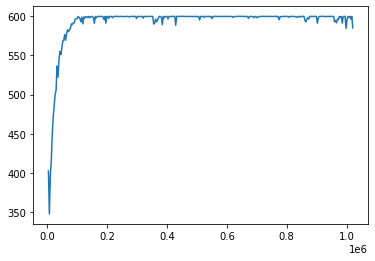

2021-10-19 20:13:18,629	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 20:14:10,527	INFO trainable.py:104 -- Trainable.setup took 51.479 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 20:14:10,529	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:384.207
Train:472.036
Train:513.433
Train:530.809
Train:518.832
Train:526.286
Train:581.504
Train:588.628
Train:614.09
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000010/checkpoint-10


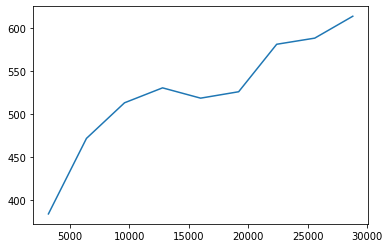

Train:618.586
Train:612.562
Train:632.36
Train:626.468
Train:630.162
Train:617.998
Train:634.996
Train:611.817
Train:632.414
Train:628.202
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000020/checkpoint-20


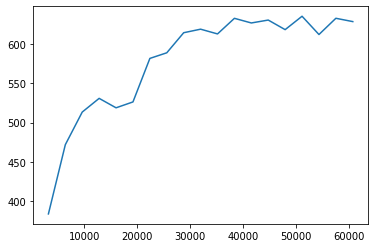

Train:637.593
Train:635.845
Train:638.538
Train:637.626
Train:634.156
Train:637.516
Train:637.446
Train:640.399
Train:639.509
Train:634.289
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000030/checkpoint-30


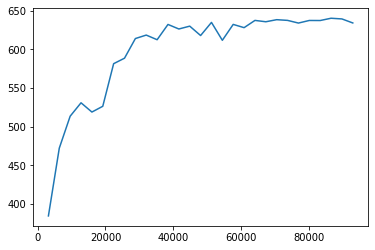

Train:635.523
Train:633.468
Train:637.455
Train:639.068
Train:639.967
Train:639.207
Train:640.78
Train:639.603
Train:639.348
Train:639.826
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000040/checkpoint-40


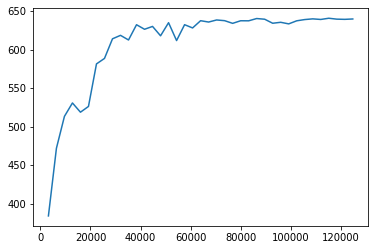

Train:638.649
Train:640.85
Train:640.901
Train:639.19
Train:640.846
Train:637.11
Train:639.124
Train:641.101
Train:640.294
Train:640.596
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000050/checkpoint-50


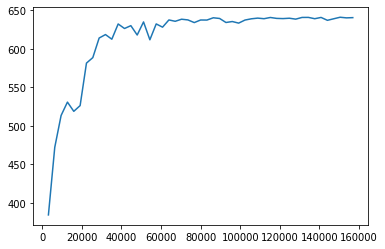

Train:640.273
Train:640.305
Train:639.629
Train:641.51
Train:641.402
Train:639.741
Train:640.142
Train:640.057
Train:640.997
Train:640.423
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000060/checkpoint-60


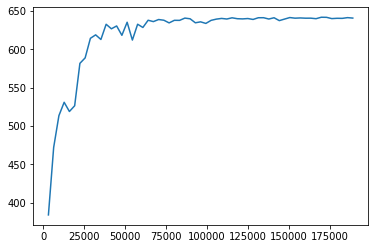

Train:640.19
Train:640.479
Train:641.337
Train:640.978
Train:640.211
Train:641.266
Train:640.267
Train:640.639
Train:642.145
Train:641.385
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000070/checkpoint-70


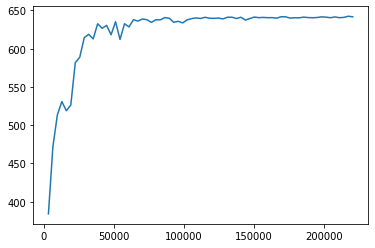

Train:641.349
Train:640.601
Train:640.54
Train:641.946
Train:640.239
Train:640.148
Train:640.575
Train:641.439
Train:642.097
Train:641.551
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000080/checkpoint-80


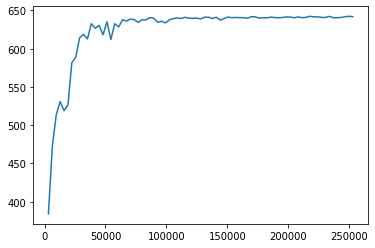

Train:640.809
Train:640.967
Train:643.138
Train:643.275
Train:642.58
Train:643.186
Train:643.169
Train:643.068
Train:641.576
Train:643.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000090/checkpoint-90


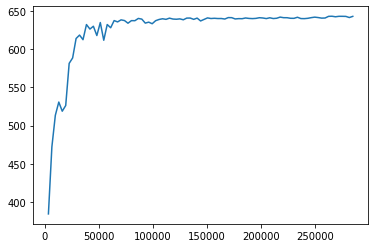

Train:636.141
Train:643.124
Train:642.92
Train:642.986
Train:643.033
Train:643.087
Train:642.896
Train:642.986
Train:643.033
Train:643.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000100/checkpoint-100


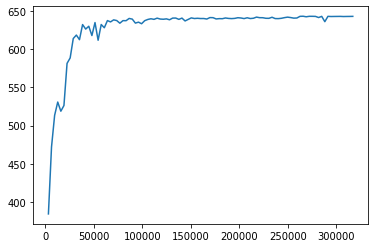

Train:642.749
Train:643.033
Train:642.498
Train:643.124
Train:643.5
Train:643.347
Train:642.751
Train:643.033
Train:643.141
Train:643.091
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000110/checkpoint-110


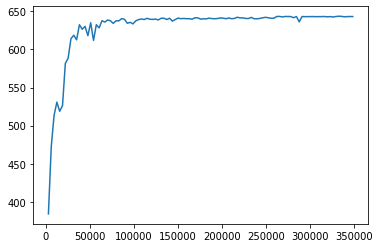

Train:642.66
Train:643.518
Train:643.033
Train:643.033
Train:643.464
Train:642.879
Train:643.029
Train:643.248
Train:642.879
Train:643.436
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000120/checkpoint-120


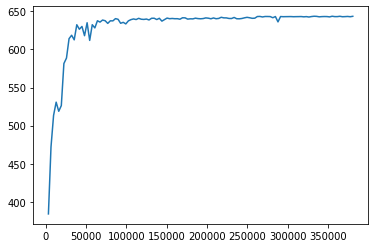

Train:642.875
Train:642.979
Train:642.879
Train:642.62
Train:643.339
Train:643.85
Train:642.551
Train:643.522
Train:643.48
Train:642.879
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000130/checkpoint-130


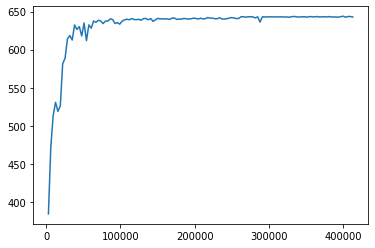

Train:643.562
Train:643.522
Train:642.912
Train:643.526
Train:643.311
Train:643.339
Train:643.127
Train:643.347
Train:643.131
Train:643.379
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000140/checkpoint-140


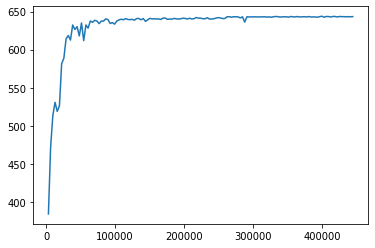

Train:642.879
Train:643.256
Train:642.663
Train:643.802
Train:643.587
Train:642.879
Train:642.422
Train:642.973
Train:642.575
Train:640.968
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000150/checkpoint-150


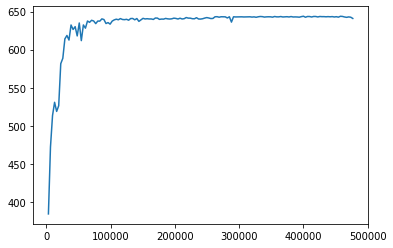

Train:637.464
Train:643.516
Train:643.167
Train:643.595
Train:643.379
Train:643.044
Train:643.335
Train:640.176
Train:640.118
Train:643.518
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000160/checkpoint-160


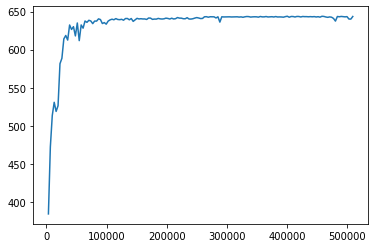

Train:643.091
Train:643.595
Train:643.16
Train:643.091
Train:643.383
Train:643.544
Train:643.095
Train:641.181
Train:642.875
Train:642.879
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000170/checkpoint-170


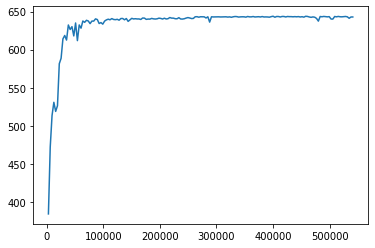

Train:642.943
Train:642.917
Train:642.915
Train:642.875
Train:643.095
Train:643.245
Train:642.943
Train:642.879
Train:643.248
Train:643.68
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000180/checkpoint-180


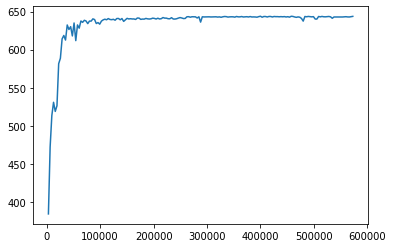

Train:643.494
Train:643.522
Train:643.095
Train:643.311
Train:643.095
Train:643.526
Train:643.278
Train:643.131
Train:643.131
Train:643.306
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000190/checkpoint-190


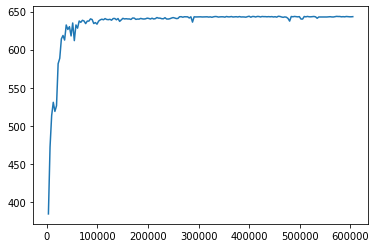

Train:643.284
Train:643.095
Train:643.284
Train:643.131
Train:643.167
Train:643.148
Train:643.095
Train:643.095
Train:643.594
Train:643.278
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000200/checkpoint-200


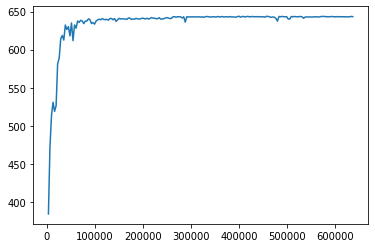

Train:642.915
Train:643.559
Train:643.095
Train:643.174
Train:642.915
Train:643.131
Train:643.379
Train:643.342
Train:643.562
Train:642.879
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000210/checkpoint-210


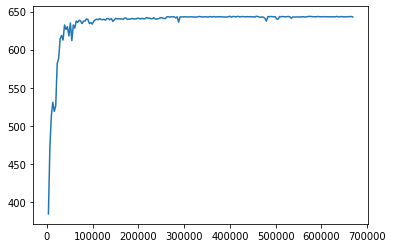

Train:643.562
Train:642.394
Train:642.663
Train:643.218
Train:643.169
Train:642.967
Train:642.979
Train:643.131
Train:640.865
Train:643.494
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000220/checkpoint-220


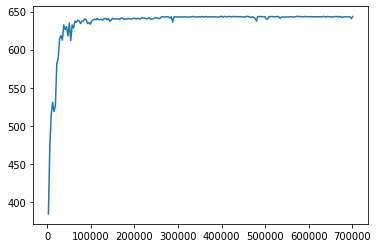

Train:643.383
Train:643.095
Train:642.915
Train:643.131
Train:642.681
Train:642.663
Train:642.663
Train:643.148
Train:643.311
Train:643.558
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000230/checkpoint-230


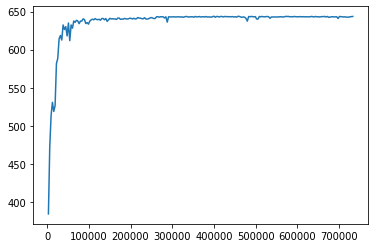

Train:643.302
Train:643.182
Train:642.643
Train:640.79
Train:642.879
Train:642.967
Train:643.342
Train:641.564
Train:643.494
Train:643.083
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000240/checkpoint-240


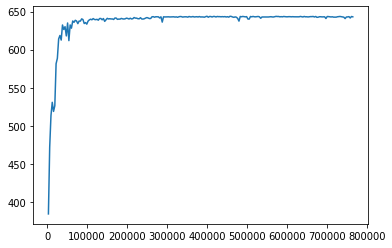

Train:640.322
Train:642.599
Train:643.311
Train:643.095
Train:643.095
Train:642.971
Train:643.131
Train:643.095
Train:639.183
Train:643.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000250/checkpoint-250


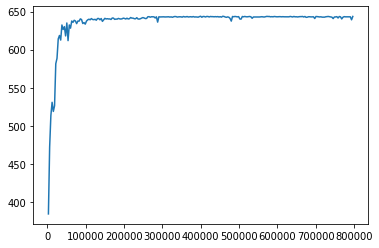

Train:643.033
Train:643.095
Train:643.347
Train:643.383
Train:643.383
Train:643.595
Train:643.184
Train:643.163
Train:643.526
Train:642.915
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000260/checkpoint-260


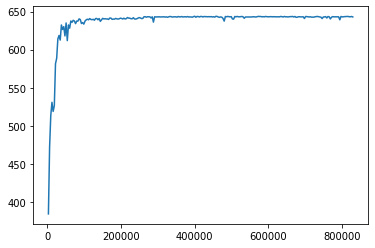

Train:643.383
Train:643.167
Train:642.535
Train:643.062
Train:643.131
Train:643.375
Train:642.879
Train:643.105
Train:643.347
Train:643.85
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000270/checkpoint-270


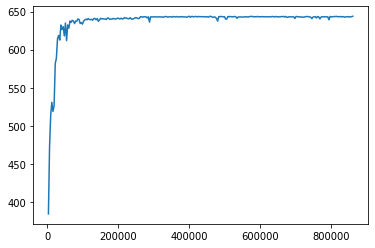

Train:643.167
Train:643.383
Train:642.915
Train:642.915
Train:642.915
Train:643.127
Train:643.562
Train:642.879
Train:643.017
Train:643.627
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000280/checkpoint-280


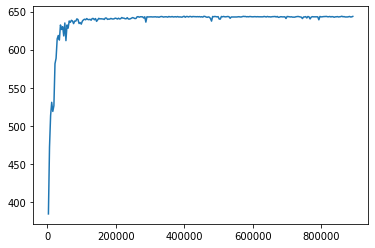

Train:640.402
Train:643.634
Train:643.376
Train:643.127
Train:643.095
Train:643.562
Train:642.915
Train:643.311
Train:643.131
Train:643.347
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000290/checkpoint-290


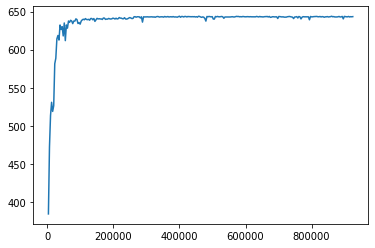

Train:642.879
Train:643.347
Train:643.347
Train:643.131
Train:642.353
Train:643.131
Train:643.634
Train:643.558
Train:643.127
Train:643.383
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000300/checkpoint-300


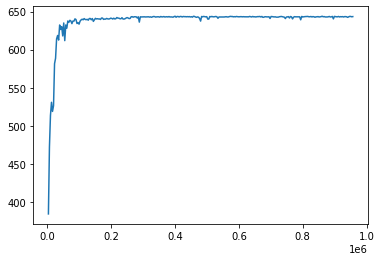

Train:642.915
Train:642.943
Train:643.389
Train:643.095
Train:643.096
Train:642.879
Train:642.915
Train:643.167
Train:643.311
Train:643.347
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000310/checkpoint-310


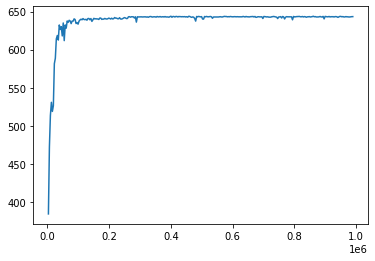

Train:643.182
Train:643.131
Train:643.131
Train:643.347
Train:643.131
Train:643.35
Train:642.879
Train:642.915
Train:642.879
Train:643.598
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-13-19enwv0739/checkpoint_000320/checkpoint-320


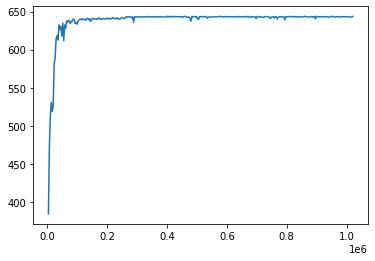

2021-10-19 20:47:01,341	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 20:47:02,471	WARNING worker.py:1115 -- WARNING: 24 PYTHON workers have been started on a node of the id: a38878e37d26c1e099032506cda7a8bda178e33f8578dfa9937eea86 and address: 192.168.1.128. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.
2021-10-19 20:47:53,920	INFO trainable.py:104 -- Trainable.setup took 52.158 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 20:47:53,931	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:383.113
Train:426.214
Train:446.045
Train:462.123
Train:441.553
Train:495.098
Train:503.105
Train:533.377
Train:572.03
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000010/checkpoint-10


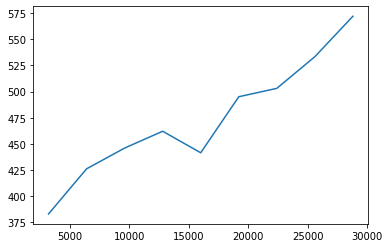

Train:580.9
Train:595.808
Train:612.0
Train:587.909
Train:597.97
Train:616.833
Train:605.983
Train:616.428
Train:619.56
Train:612.725
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000020/checkpoint-20


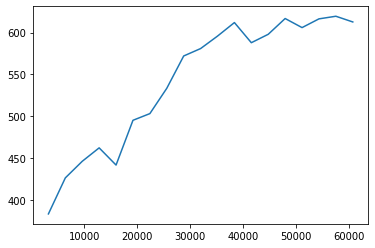

Train:622.537
Train:623.341
Train:613.776
Train:625.319
Train:617.298
Train:611.294
Train:626.406
Train:623.063
Train:629.883
Train:622.928
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000030/checkpoint-30


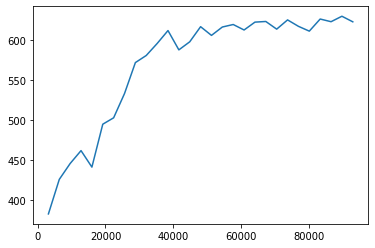

Train:627.791
Train:623.203
Train:630.022
Train:615.308
Train:615.913
Train:620.139
Train:613.275
Train:619.416
Train:625.962
Train:619.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000040/checkpoint-40


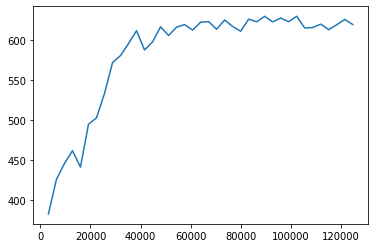

Train:621.531
Train:621.186
Train:625.484
Train:625.811
Train:629.546
Train:624.164
Train:627.765
Train:617.234
Train:625.506
Train:625.825
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000050/checkpoint-50


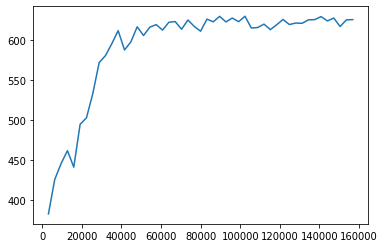

Train:631.04
Train:628.412
Train:626.559
Train:629.05
Train:624.204
Train:626.193
Train:630.567
Train:628.406
Train:629.443
Train:627.481
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000060/checkpoint-60


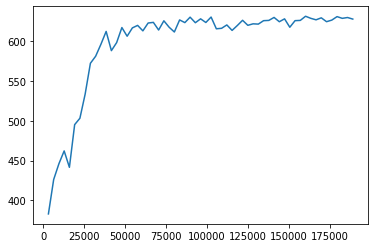

Train:631.854
Train:629.352
Train:632.967
Train:630.922
Train:627.456
Train:631.037
Train:632.729
Train:633.809
Train:630.296
Train:633.649
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000070/checkpoint-70


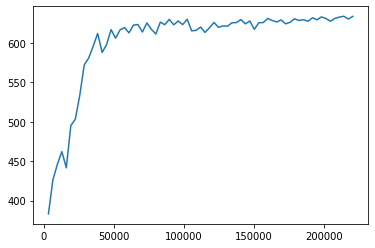

Train:637.347
Train:638.035
Train:636.886
Train:637.054
Train:637.072
Train:637.024
Train:637.747
Train:634.195
Train:635.932
Train:633.83
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000080/checkpoint-80


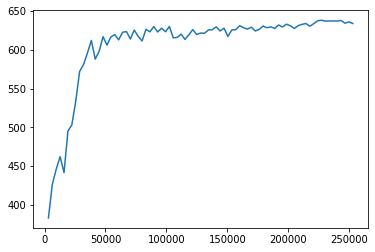

Train:628.403
Train:635.978
Train:637.029
Train:638.052
Train:632.449
Train:635.015
Train:635.503
Train:635.934
Train:635.97
Train:636.925
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000090/checkpoint-90


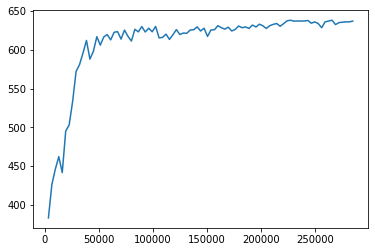

Train:636.075
Train:637.972
Train:635.936
Train:637.949
Train:637.054
Train:637.117
Train:636.888
Train:634.949
Train:637.86
Train:636.242
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000100/checkpoint-100


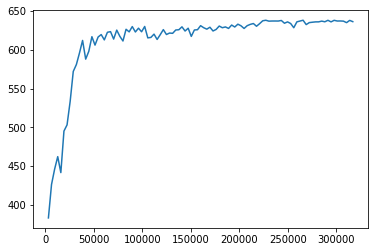

Train:637.112
Train:636.161
Train:636.913
Train:636.094
Train:637.224
Train:638.089
Train:636.131
Train:636.093
Train:638.912
Train:638.196
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000110/checkpoint-110


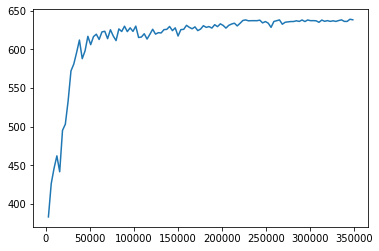

Train:637.078
Train:636.094
Train:635.813
Train:635.205
Train:636.127
Train:635.125
Train:634.181
Train:636.166
Train:635.155
Train:635.758
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000120/checkpoint-120


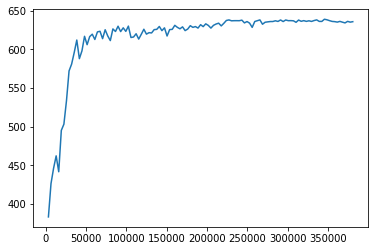

Train:637.208
Train:637.292
Train:636.262
Train:635.298
Train:636.324
Train:637.135
Train:637.208
Train:635.3
Train:635.746
Train:634.261
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000130/checkpoint-130


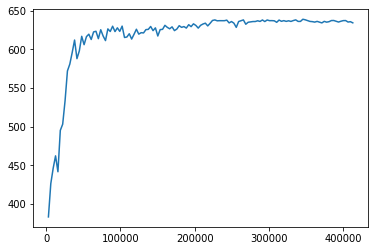

Train:637.208
Train:637.115
Train:635.762
Train:637.206
Train:638.167
Train:635.285
Train:638.983
Train:636.244
Train:638.065
Train:637.153
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000140/checkpoint-140


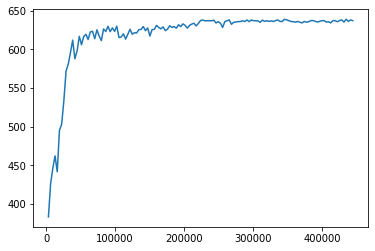

Train:637.287
Train:635.316
Train:636.236
Train:637.136
Train:637.085
Train:634.127
Train:636.695
Train:637.242
Train:637.103
Train:636.71
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000150/checkpoint-150


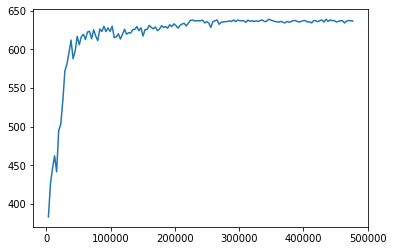

Train:636.136
Train:636.123
Train:637.114
Train:637.132
Train:637.22
Train:636.117
Train:634.959
Train:637.124
Train:638.088
Train:635.543
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000160/checkpoint-160


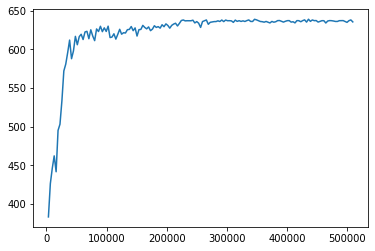

Train:635.149
Train:638.163
Train:637.138
Train:636.098
Train:638.092
Train:637.042
Train:636.256
Train:635.995
Train:636.078
Train:635.591
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000170/checkpoint-170


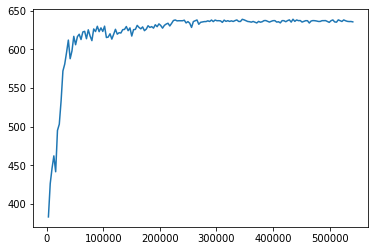

Train:631.465
Train:634.957
Train:636.184
Train:635.137
Train:635.133
Train:636.094
Train:635.936
Train:636.095
Train:635.052
Train:636.729
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000180/checkpoint-180


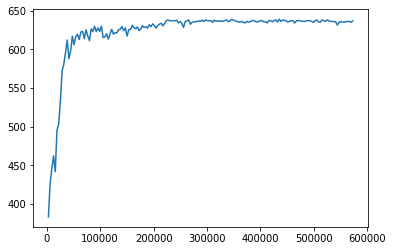

Train:633.907
Train:637.051
Train:636.071
Train:635.073
Train:635.143
Train:634.84
Train:635.871
Train:636.594
Train:637.208
Train:636.148
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000190/checkpoint-190


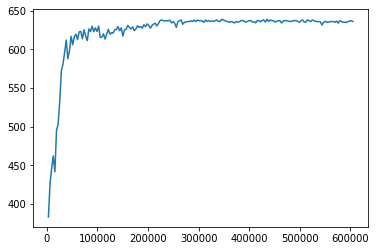

Train:638.246
Train:636.176
Train:635.138
Train:636.236
Train:633.576
Train:635.136
Train:636.248
Train:636.333
Train:636.184
Train:637.283
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000200/checkpoint-200


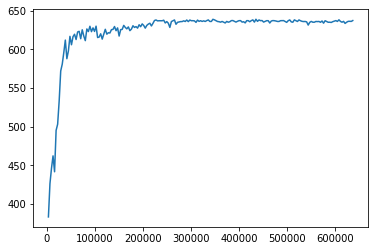

Train:634.359
Train:635.222
Train:635.307
Train:635.223
Train:636.218
Train:639.5
Train:636.322
Train:636.203
Train:637.09
Train:636.132
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000210/checkpoint-210


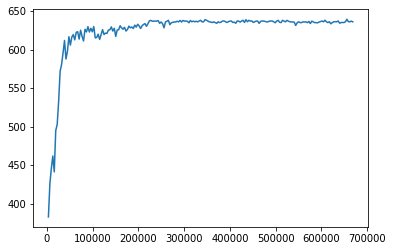

Train:636.139
Train:636.255
Train:634.817
Train:638.192
Train:637.296
Train:634.179
Train:637.208
Train:635.948
Train:636.341
Train:635.779
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000220/checkpoint-220


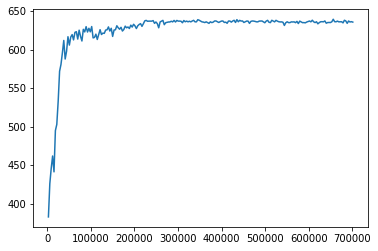

Train:634.294
Train:636.266
Train:636.944
Train:636.203
Train:636.327
Train:637.112
Train:636.212
Train:639.302
Train:635.001
Train:636.257
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000230/checkpoint-230


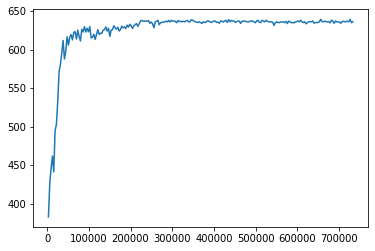

Train:637.242
Train:637.372
Train:637.372
Train:636.346
Train:638.242
Train:636.333
Train:637.292
Train:638.272
Train:636.342
Train:636.132
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000240/checkpoint-240


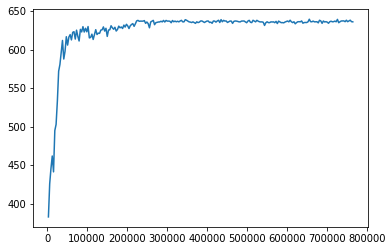

Train:638.322
Train:637.296
Train:635.316
Train:635.24
Train:629.37
Train:629.37
Train:635.236
Train:635.312
Train:637.357
Train:639.758
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000250/checkpoint-250


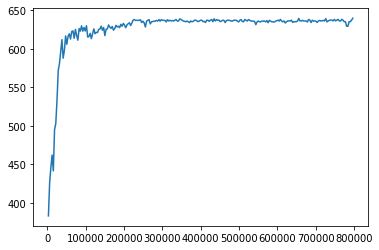

Train:636.342
Train:637.372
Train:636.27
Train:637.376
Train:637.518
Train:634.277
Train:636.073
Train:635.478
Train:636.426
Train:638.322
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000260/checkpoint-260


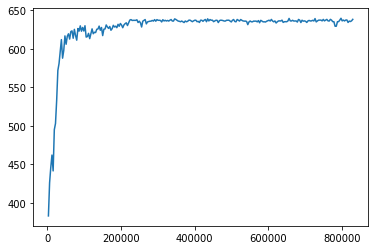

Train:637.212
Train:636.499
Train:638.571
Train:638.116
Train:638.307
Train:635.478
Train:635.236
Train:638.436
Train:635.475
Train:637.406
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000270/checkpoint-270


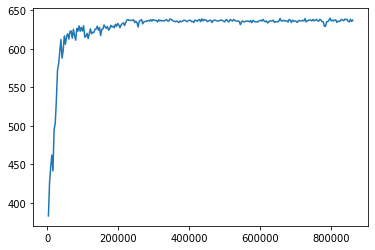

Train:635.312
Train:638.567
Train:638.572
Train:637.206
Train:638.813
Train:636.182
Train:635.211
Train:636.654
Train:637.141
Train:637.805
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000280/checkpoint-280


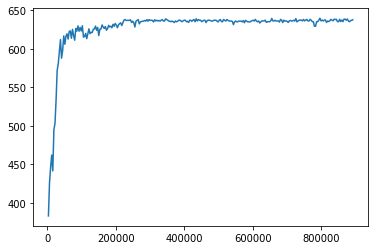

Train:637.859
Train:636.641
Train:636.627
Train:636.666
Train:636.641
Train:638.899
Train:636.652
Train:638.71
Train:637.844
Train:634.99
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000290/checkpoint-290


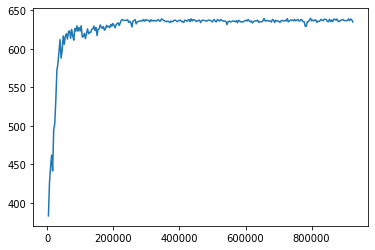

Train:637.565
Train:637.103
Train:636.644
Train:635.445
Train:636.952
Train:634.213
Train:635.316
Train:638.768
Train:635.445
Train:636.668
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000300/checkpoint-300


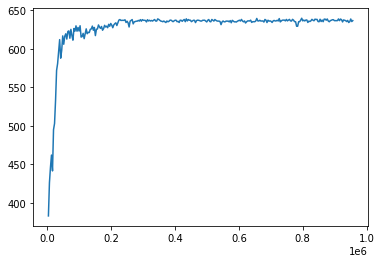

Train:635.474
Train:636.574
Train:635.459
Train:635.448
Train:637.865
Train:640.256
Train:634.27
Train:636.959
Train:635.459
Train:637.374
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000310/checkpoint-310


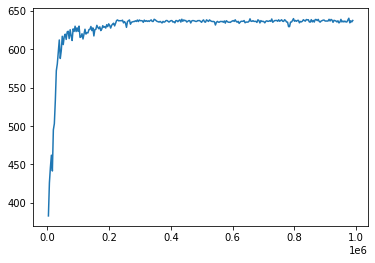

Train:636.262
Train:637.844
Train:636.666
Train:637.852
Train:637.781
Train:636.652
Train:636.653
Train:635.478
Train:636.642
Train:639.056
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_20-47-01emp5dn7t/checkpoint_000320/checkpoint-320


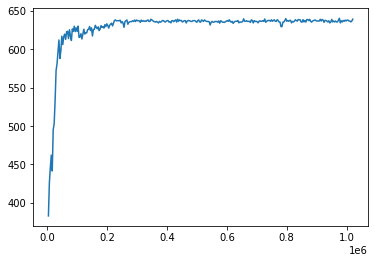

2021-10-19 21:20:43,726	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 21:21:37,576	INFO trainable.py:104 -- Trainable.setup took 53.431 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 21:21:37,580	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:567.703
Train:607.237
Train:637.272
Train:622.554
Train:615.893
Train:705.157
Train:719.255
Train:737.138
Train:755.932
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000010/checkpoint-10


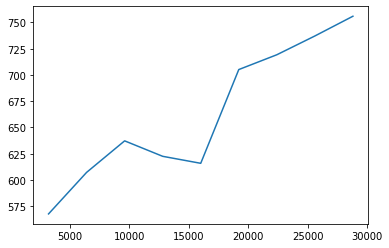

Train:773.983
Train:771.705
Train:778.963
Train:787.249
Train:792.233
Train:786.937
Train:791.56
Train:795.134
Train:797.398
Train:795.256
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000020/checkpoint-20


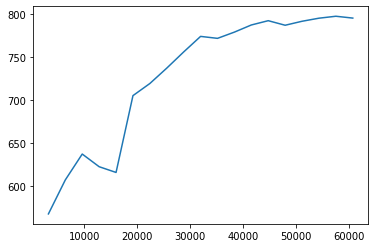

Train:791.131
Train:794.524
Train:796.453
Train:794.811
Train:791.414
Train:795.865
Train:797.223
Train:792.118
Train:798.635
Train:796.097
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000030/checkpoint-30


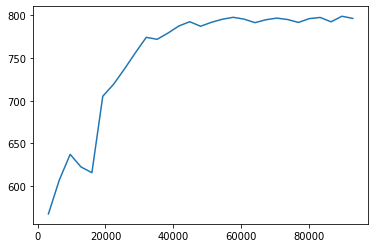

Train:796.853
Train:796.303
Train:799.185
Train:796.102
Train:794.116
Train:796.303
Train:793.425
Train:797.33
Train:796.853
Train:797.885
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000040/checkpoint-40


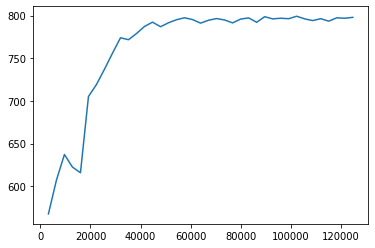

Train:793.554
Train:802.066
Train:793.902
Train:797.2
Train:797.513
Train:799.734
Train:798.1
Train:798.849
Train:797.572
Train:797.513
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000050/checkpoint-50


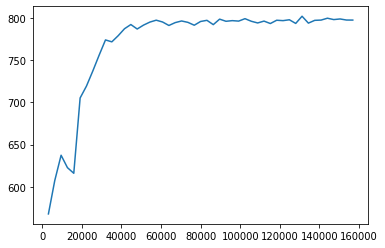

Train:802.654
Train:799.734
Train:804.398
Train:802.066
Train:797.402
Train:802.105
Train:801.994
Train:802.066
Train:804.398
Train:802.684
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000060/checkpoint-60


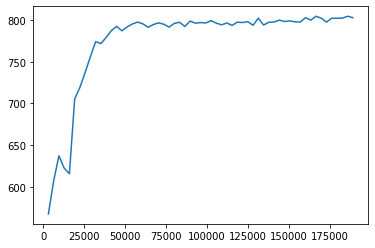

Train:804.398
Train:799.734
Train:804.437
Train:806.73
Train:799.734
Train:806.73
Train:802.066
Train:804.398
Train:797.088
Train:793.062
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000070/checkpoint-70


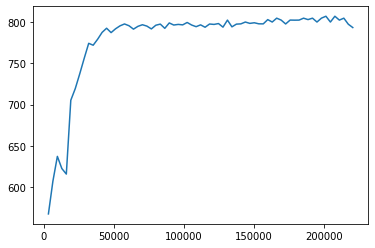

Train:796.802
Train:799.206
Train:802.066
Train:806.73
Train:802.066
Train:804.771
Train:804.398
Train:799.734
Train:806.8
Train:806.73
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000080/checkpoint-80


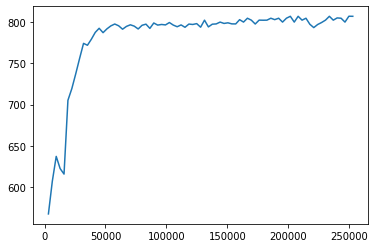

Train:802.066
Train:791.119
Train:804.398
Train:802.066
Train:804.398
Train:804.398
Train:806.73
Train:807.103
Train:799.734
Train:802.066
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000090/checkpoint-90


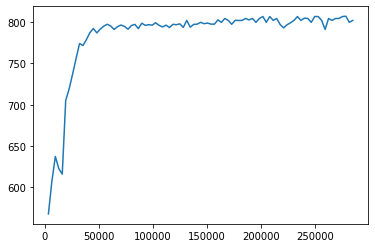

Train:806.73
Train:809.062
Train:799.734
Train:802.066
Train:802.066
Train:796.338
Train:802.066
Train:802.066
Train:802.136
Train:802.066
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000100/checkpoint-100


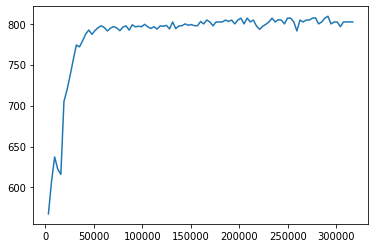

Train:793.892
Train:804.398
Train:802.066
Train:799.874
Train:804.948
Train:804.398
Train:802.066
Train:799.734
Train:802.066
Train:806.8
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000110/checkpoint-110


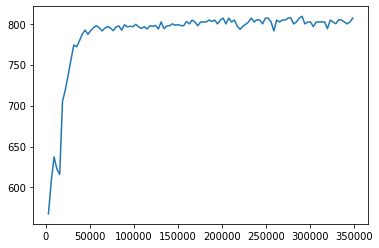

Train:801.945
Train:806.73
Train:806.73
Train:802.066
Train:802.066
Train:798.307
Train:804.398
Train:801.062
Train:802.066
Train:806.73
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000120/checkpoint-120


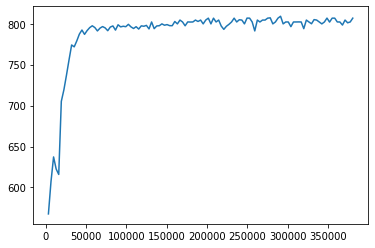

Train:802.177
Train:804.398
Train:802.066
Train:806.73
Train:804.398
Train:799.734
Train:799.734
Train:799.734
Train:806.73
Train:807.28
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000130/checkpoint-130


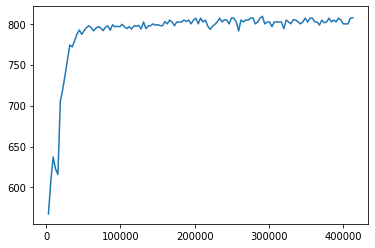

Train:802.066
Train:801.945
Train:799.734
Train:804.398
Train:802.066
Train:801.994
Train:795.6
Train:802.066
Train:799.874
Train:802.136
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000140/checkpoint-140


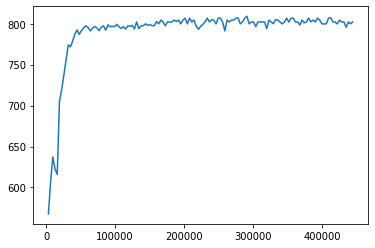

Train:799.734
Train:799.734
Train:804.468
Train:802.066
Train:797.472
Train:804.398
Train:802.015
Train:802.066
Train:806.8
Train:799.734
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000150/checkpoint-150


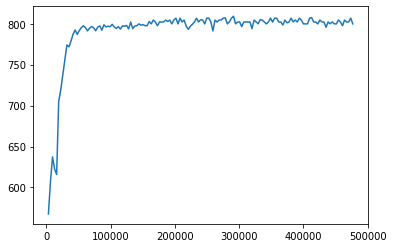

Train:804.398
Train:804.468
Train:802.066
Train:801.945
Train:806.8
Train:802.066
Train:806.73
Train:806.8
Train:797.653
Train:802.136
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000160/checkpoint-160


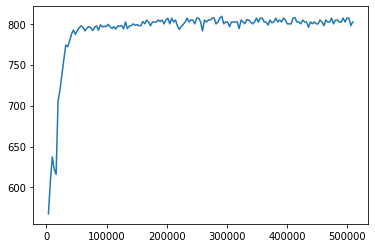

Train:804.398
Train:800.281
Train:797.488
Train:803.823
Train:804.468
Train:805.398
Train:802.136
Train:799.683
Train:799.804
Train:799.485
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000170/checkpoint-170


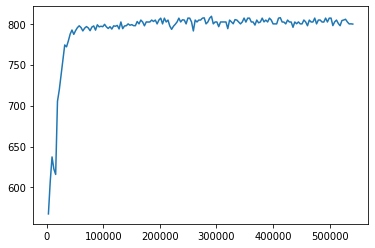

Train:802.066
Train:802.136
Train:802.066
Train:802.066
Train:809.062
Train:804.398
Train:806.73
Train:799.804
Train:802.066
Train:806.052
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000180/checkpoint-180


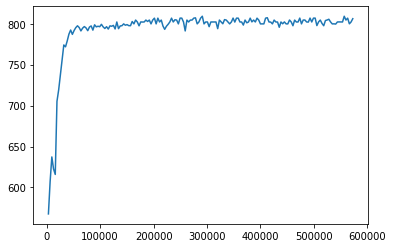

Train:804.468
Train:802.276
Train:802.066
Train:804.579
Train:799.804
Train:802.136
Train:797.998
Train:804.398
Train:793.779
Train:799.592
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000190/checkpoint-190


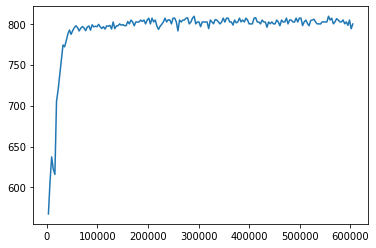

Train:803.65
Train:802.136
Train:799.804
Train:804.841
Train:804.468
Train:804.398
Train:806.73
Train:802.066
Train:804.398
Train:804.509
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000200/checkpoint-200


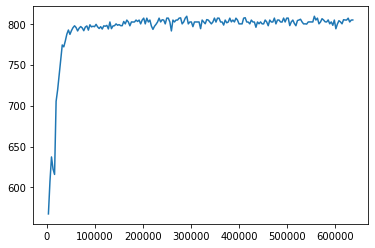

Train:802.015
Train:804.468
Train:799.683
Train:800.142
Train:806.73
Train:804.468
Train:799.632
Train:802.136
Train:801.945
Train:802.085
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000210/checkpoint-210


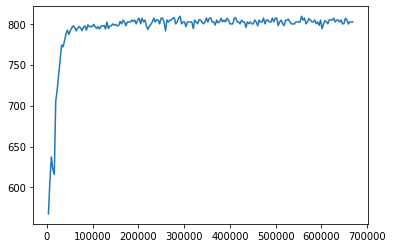

Train:804.468
Train:804.347
Train:806.73
Train:809.062
Train:801.894
Train:806.73
Train:804.468
Train:806.73
Train:804.398
Train:799.613
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000220/checkpoint-220


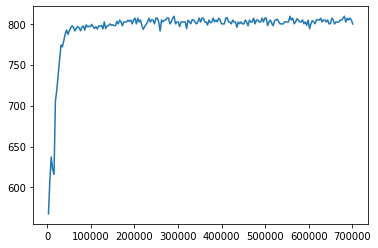

Train:806.73
Train:804.468
Train:804.398
Train:802.066
Train:806.73
Train:802.136
Train:802.066
Train:804.398
Train:806.8
Train:801.747
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000230/checkpoint-230


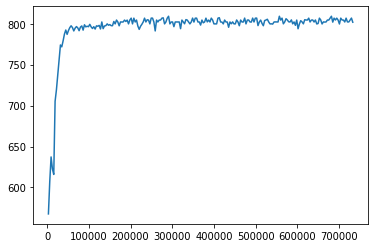

Train:804.806
Train:799.611
Train:799.804
Train:802.136
Train:804.398
Train:797.169
Train:804.398
Train:802.136
Train:804.398
Train:806.73
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000240/checkpoint-240


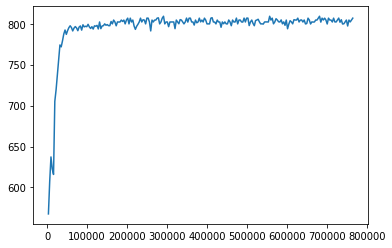

Train:804.538
Train:804.876
Train:806.73
Train:802.206
Train:806.73
Train:806.8
Train:804.538
Train:804.538
Train:802.276
Train:804.468
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000250/checkpoint-250


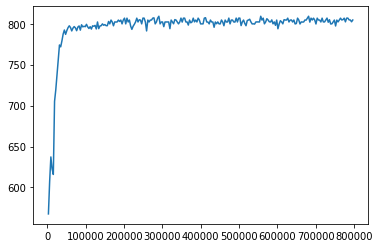

Train:809.062
Train:804.247
Train:804.468
Train:804.468
Train:802.177
Train:799.915
Train:799.915
Train:802.136
Train:804.468
Train:800.795
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000260/checkpoint-260


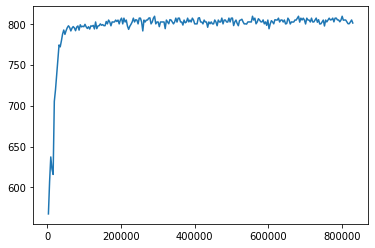

Train:801.747
Train:802.247
Train:802.276
Train:804.509
Train:797.793
Train:804.538
Train:797.868
Train:806.73
Train:804.538
Train:802.276
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000270/checkpoint-270


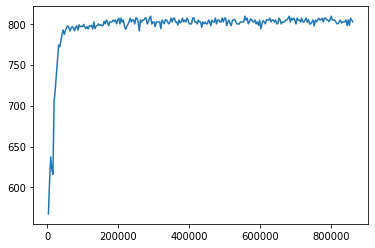

Train:804.538
Train:799.915
Train:799.656
Train:799.273
Train:802.206
Train:804.398
Train:804.468
Train:806.73
Train:802.066
Train:804.398
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000280/checkpoint-280


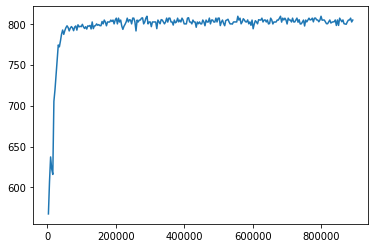

Train:791.421
Train:804.398
Train:806.841
Train:800.212
Train:802.136
Train:798.495
Train:809.062
Train:804.347
Train:804.538
Train:800.502
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000290/checkpoint-290


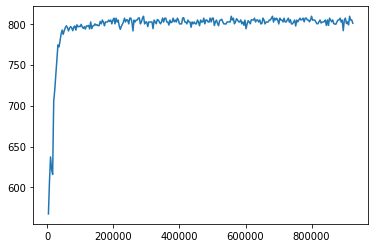

Train:802.206
Train:804.398
Train:802.136
Train:802.136
Train:804.398
Train:802.478
Train:803.72
Train:804.221
Train:799.944
Train:799.349
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000300/checkpoint-300


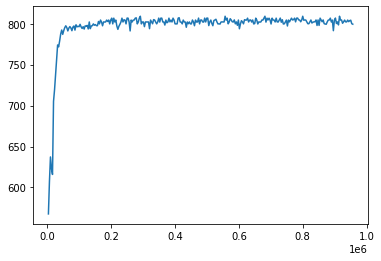

Train:806.8
Train:798.964
Train:802.206
Train:800.795
Train:804.538
Train:809.062
Train:804.538
Train:804.538
Train:806.8
Train:804.468
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000310/checkpoint-310


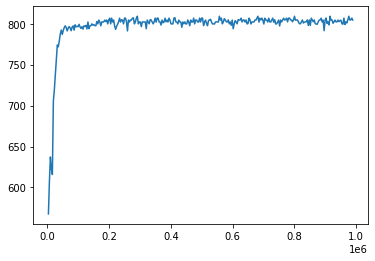

Train:804.468
Train:807.289
Train:802.136
Train:806.8
Train:806.139
Train:800.014
Train:803.359
Train:802.066
Train:799.874
Train:800.177
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-20-44ewjhl8fh/checkpoint_000320/checkpoint-320


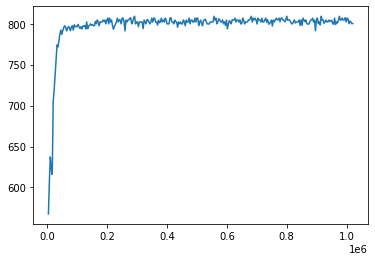

2021-10-19 21:54:20,714	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 21:55:13,761	INFO trainable.py:104 -- Trainable.setup took 52.626 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 21:55:13,766	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:377.192
Train:363.405
Train:439.461
Train:497.647
Train:485.711
Train:546.288
Train:580.16
Train:585.742
Train:576.881
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000010/checkpoint-10


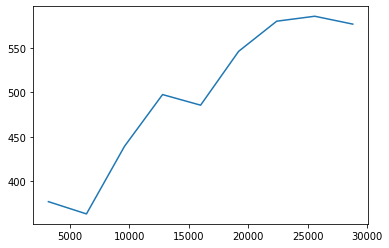

Train:612.967
Train:607.753
Train:615.188
Train:618.603
Train:615.05
Train:621.462
Train:625.985
Train:629.748
Train:622.382
Train:629.091
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000020/checkpoint-20


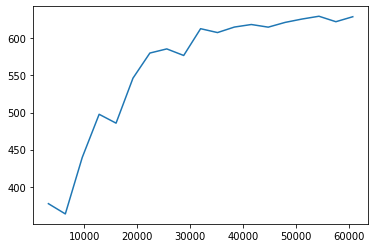

Train:629.575
Train:628.728
Train:625.761
Train:628.119
Train:624.181
Train:631.116
Train:635.773
Train:633.168
Train:640.746
Train:637.054
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000030/checkpoint-30


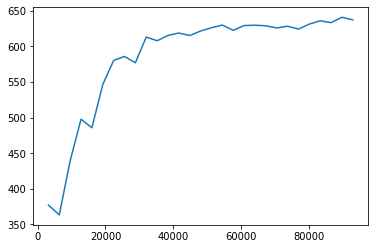

Train:631.536
Train:645.901
Train:647.689
Train:643.378
Train:645.682
Train:644.562
Train:646.428
Train:651.141
Train:651.162
Train:647.516
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000040/checkpoint-40


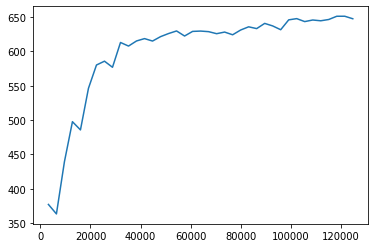

Train:651.218
Train:647.108
Train:654.377
Train:654.841
Train:653.665
Train:654.467
Train:656.237
Train:650.078
Train:656.18
Train:656.18
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000050/checkpoint-50


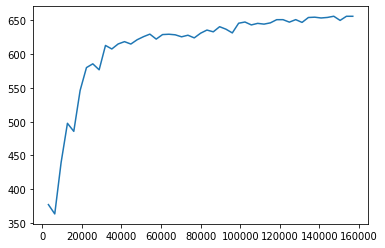

Train:652.699
Train:658.97
Train:658.57
Train:658.45
Train:655.797
Train:656.267
Train:658.28
Train:662.419
Train:660.313
Train:661.774
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000060/checkpoint-60


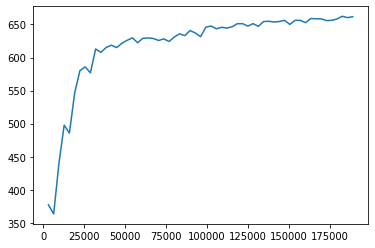

Train:661.129
Train:661.774
Train:661.774
Train:661.209
Train:659.998
Train:661.774
Train:662.419
Train:661.774
Train:661.027
Train:663.065
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000070/checkpoint-70


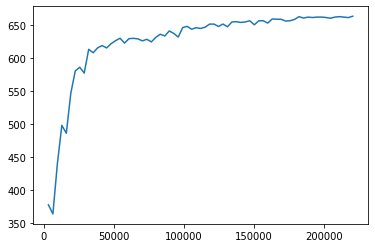

Train:662.419
Train:662.419
Train:661.774
Train:663.065
Train:662.419
Train:663.065
Train:663.065
Train:660.677
Train:661.774
Train:661.322
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000080/checkpoint-80


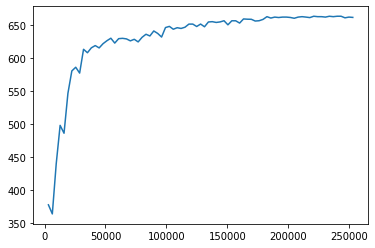

Train:661.774
Train:662.419
Train:661.322
Train:662.419
Train:661.774
Train:661.774
Train:661.774
Train:661.774
Train:661.774
Train:663.71
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000090/checkpoint-90


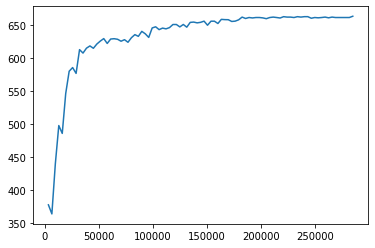

Train:662.419
Train:661.129
Train:657.556
Train:661.774
Train:661.129
Train:661.774
Train:658.275
Train:661.774
Train:661.774
Train:661.129
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000100/checkpoint-100


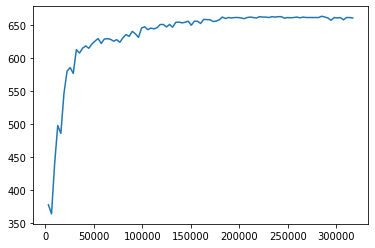

Train:658.835
Train:628.716
Train:644.458
Train:636.98
Train:647.534
Train:649.148
Train:655.38
Train:659.609
Train:661.774
Train:655.895
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000110/checkpoint-110


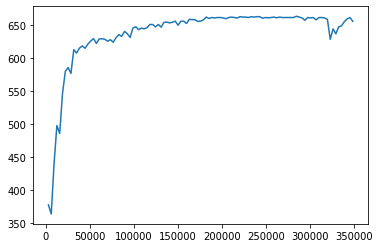

Train:661.322
Train:661.774
Train:661.129
Train:662.419
Train:661.774
Train:663.065
Train:663.065
Train:659.838
Train:660.484
Train:662.419
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000120/checkpoint-120


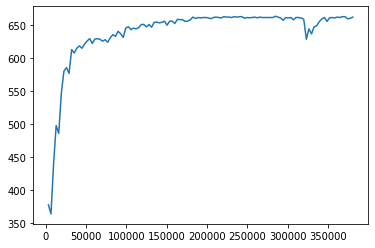

Train:659.323
Train:661.774
Train:663.065
Train:661.129
Train:661.129
Train:661.129
Train:661.129
Train:662.419
Train:661.774
Train:662.419
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000130/checkpoint-130


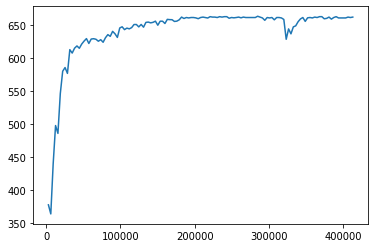

Train:661.774
Train:663.065
Train:661.774
Train:661.774
Train:662.419
Train:662.419
Train:661.209
Train:662.419
Train:661.129
Train:663.065
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000140/checkpoint-140


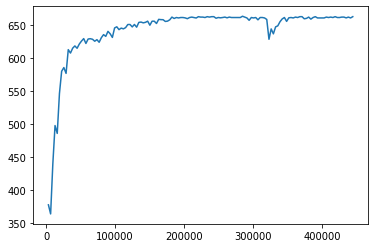

Train:661.774
Train:662.419
Train:663.065
Train:658.202
Train:662.419
Train:659.611
Train:663.065
Train:660.483
Train:662.419
Train:661.774
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000150/checkpoint-150


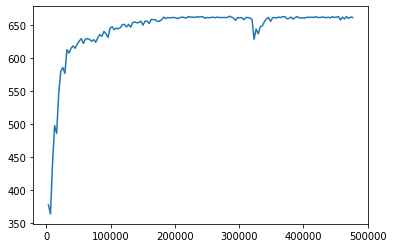

Train:662.419
Train:661.774
Train:661.774
Train:661.129
Train:661.774
Train:661.129
Train:662.419
Train:662.419
Train:661.774
Train:661.774
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000160/checkpoint-160


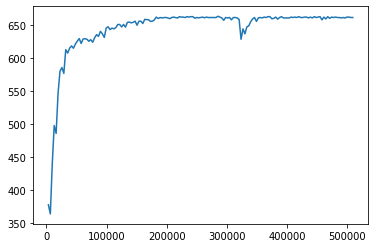

Train:654.791
Train:658.861
Train:662.419
Train:655.821
Train:661.377
Train:661.129
Train:661.774
Train:661.129
Train:662.419
Train:663.238
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000170/checkpoint-170


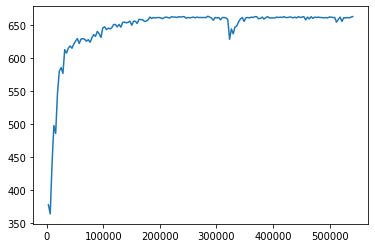

Train:662.419
Train:661.774
Train:663.065
Train:661.774
Train:663.065
Train:661.129
Train:661.774
Train:661.129
Train:660.483
Train:661.687
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000180/checkpoint-180


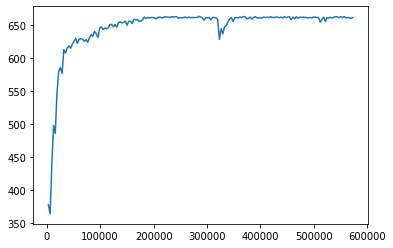

Train:661.774
Train:663.71
Train:661.774
Train:663.065
Train:663.065
Train:661.209
Train:661.794
Train:661.774
Train:662.419
Train:661.774
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000190/checkpoint-190


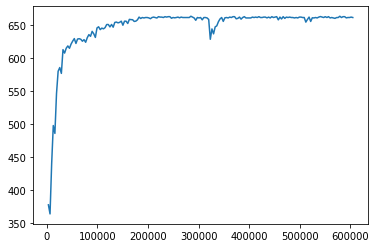

Train:663.065
Train:662.419
Train:661.129
Train:661.774
Train:662.419
Train:652.089
Train:661.774
Train:660.53
Train:661.129
Train:661.209
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000200/checkpoint-200


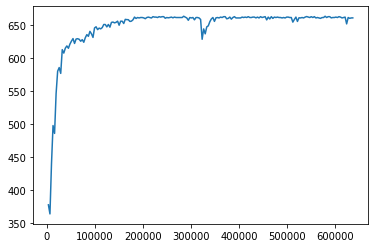

Train:662.419
Train:659.541
Train:661.854
Train:662.506
Train:660.47
Train:662.419
Train:661.209
Train:663.065
Train:661.948
Train:661.234
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000210/checkpoint-210


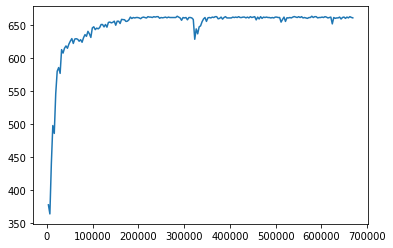

Train:659.013
Train:655.256
Train:662.419
Train:662.419
Train:661.774
Train:653.623
Train:659.918
Train:660.484
Train:662.419
Train:659.998
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000220/checkpoint-220


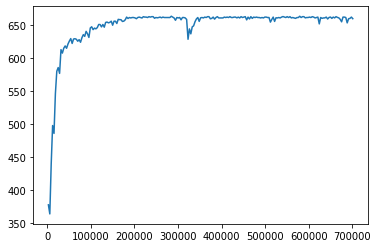

Train:660.092
Train:661.774
Train:660.563
Train:661.774
Train:659.918
Train:661.129
Train:661.129
Train:662.419
Train:661.774
Train:659.262
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000230/checkpoint-230


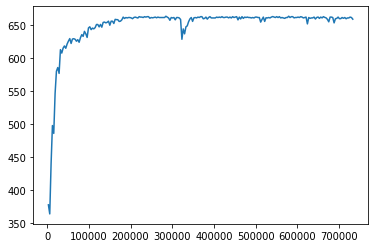

Train:660.396
Train:661.774
Train:662.977
Train:661.774
Train:661.621
Train:662.419
Train:662.419
Train:663.065
Train:662.419
Train:662.593
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000240/checkpoint-240


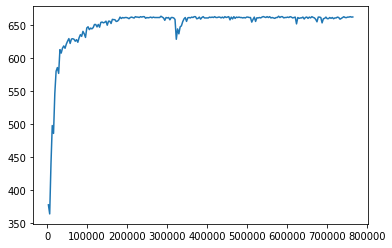

Train:662.419
Train:662.977
Train:663.065
Train:661.129
Train:662.109
Train:662.349
Train:661.599
Train:663.065
Train:662.593
Train:662.998
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000250/checkpoint-250


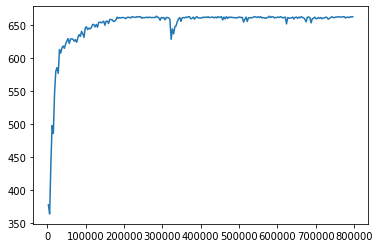

Train:661.948
Train:663.71
Train:661.073
Train:662.977
Train:654.715
Train:662.53
Train:663.216
Train:663.238
Train:663.151
Train:661.651
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000260/checkpoint-260


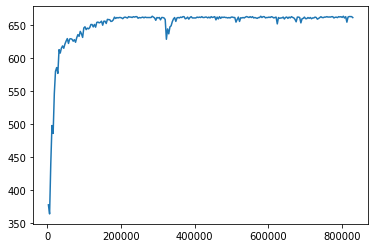

Train:658.806
Train:663.47
Train:664.805
Train:664.045
Train:664.112
Train:664.159
Train:664.045
Train:665.369
Train:665.059
Train:664.495
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000270/checkpoint-270


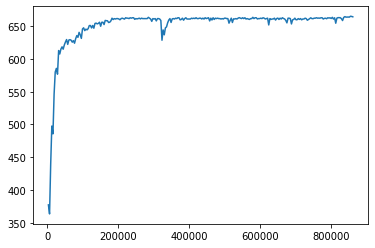

Train:664.045
Train:663.487
Train:663.428
Train:665.508
Train:665.033
Train:665.059
Train:664.584
Train:664.609
Train:665.458
Train:665.033
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000280/checkpoint-280


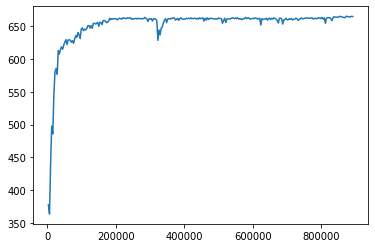

Train:663.848
Train:664.559
Train:665.483
Train:658.162
Train:665.508
Train:665.279
Train:664.159
Train:664.609
Train:665.483
Train:665.059
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000290/checkpoint-290


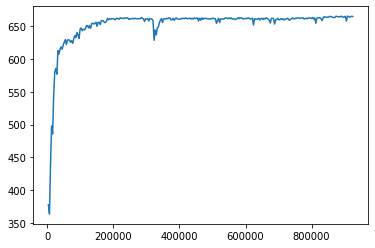

Train:665.078
Train:665.059
Train:665.008
Train:664.609
Train:665.008
Train:663.71
Train:664.559
Train:664.609
Train:662.943
Train:665.059
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000300/checkpoint-300


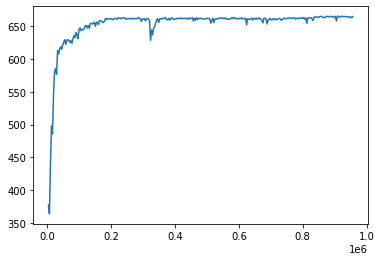

Train:664.584
Train:664.584
Train:665.033
Train:661.652
Train:659.437
Train:664.159
Train:664.609
Train:664.159
Train:665.059
Train:664.609
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000310/checkpoint-310


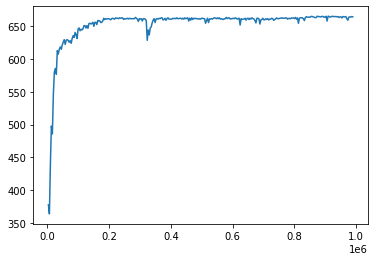

Train:664.609
Train:664.609
Train:656.444
Train:665.059
Train:665.033
Train:665.059
Train:659.488
Train:665.059
Train:665.508
Train:664.495
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_21-54-21o_05smua/checkpoint_000320/checkpoint-320


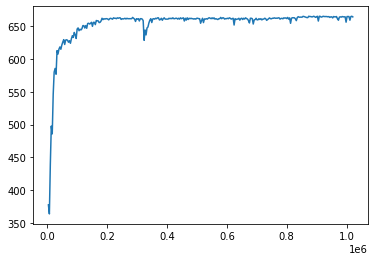

2021-10-19 22:28:05,293	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 22:28:58,780	INFO trainable.py:104 -- Trainable.setup took 53.061 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 22:28:58,783	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:321.448
Train:351.292
Train:403.861
Train:400.616
Train:434.457
Train:462.336
Train:416.487
Train:463.153
Train:452.277
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000010/checkpoint-10


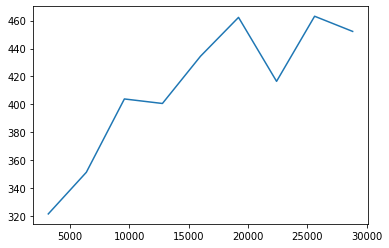

Train:482.819
Train:469.044
Train:489.715
Train:505.467
Train:506.688
Train:501.251
Train:501.604
Train:503.919
Train:515.519
Train:510.774
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000020/checkpoint-20


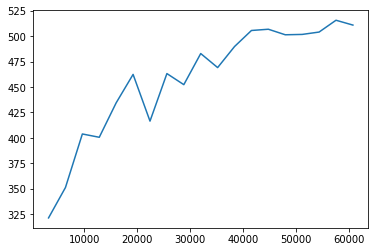

Train:510.214
Train:506.02
Train:514.48
Train:519.089
Train:520.628
Train:519.367
Train:524.28
Train:520.787
Train:522.642
Train:520.914
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000030/checkpoint-30


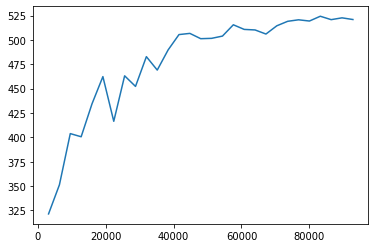

Train:516.853
Train:520.919
Train:521.06
Train:522.031
Train:514.902
Train:519.858
Train:516.397
Train:527.24
Train:509.579
Train:524.612
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000040/checkpoint-40


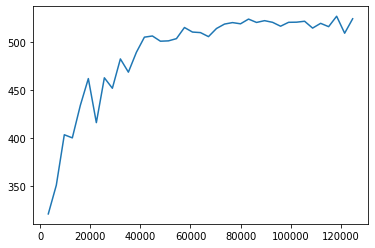

Train:525.975
Train:524.103
Train:524.995
Train:523.406
Train:525.647
Train:528.208
Train:524.962
Train:526.096
Train:532.376
Train:529.842
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000050/checkpoint-50


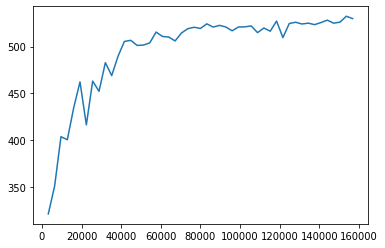

Train:527.946
Train:530.034
Train:527.973
Train:530.552
Train:531.364
Train:532.629
Train:528.091
Train:530.783
Train:533.648
Train:530.31
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000060/checkpoint-60


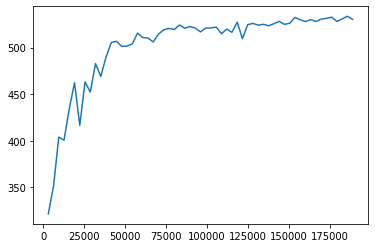

Train:534.277
Train:535.019
Train:531.466
Train:533.405
Train:535.834
Train:531.946
Train:528.302
Train:533.265
Train:524.438
Train:533.198
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000070/checkpoint-70


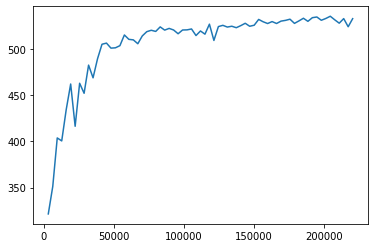

Train:529.451
Train:522.118
Train:537.802
Train:532.647
Train:526.634
Train:532.446
Train:526.478
Train:532.681
Train:536.412
Train:533.611
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000080/checkpoint-80


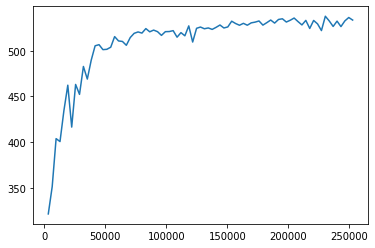

Train:530.974
Train:534.586
Train:535.109
Train:535.71
Train:538.784
Train:533.251
Train:534.213
Train:540.525
Train:536.818
Train:536.028
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000090/checkpoint-90


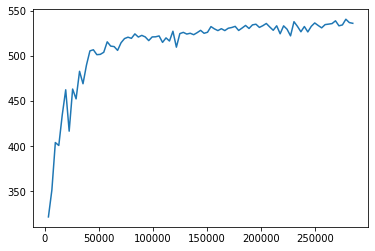

Train:535.165
Train:535.56
Train:533.8
Train:535.231
Train:537.205
Train:535.782
Train:533.0
Train:535.828
Train:529.347
Train:535.37
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000100/checkpoint-100


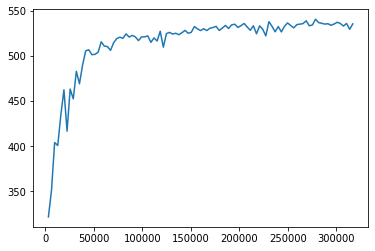

Train:530.536
Train:535.286
Train:532.993
Train:535.839
Train:535.299
Train:538.266
Train:533.311
Train:536.101
Train:529.294
Train:537.122
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000110/checkpoint-110


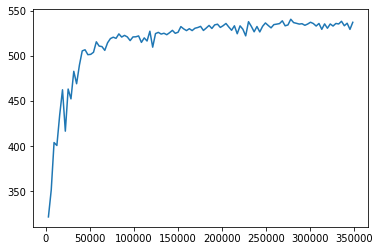

Train:534.694
Train:530.408
Train:537.128
Train:533.137
Train:533.344
Train:536.104
Train:534.227
Train:533.489
Train:537.782
Train:536.46
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000120/checkpoint-120


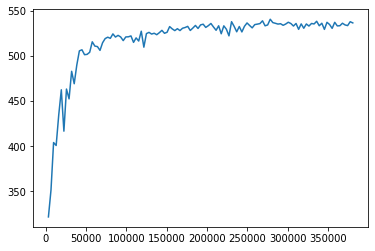

Train:536.559
Train:533.946
Train:533.761
Train:535.41
Train:537.956
Train:536.383
Train:537.442
Train:533.063
Train:533.16
Train:535.208
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000130/checkpoint-130


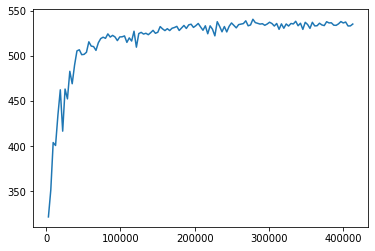

Train:536.885
Train:537.036
Train:539.864
Train:537.731
Train:534.582
Train:534.031
Train:531.742
Train:536.763
Train:534.12
Train:540.374
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000140/checkpoint-140


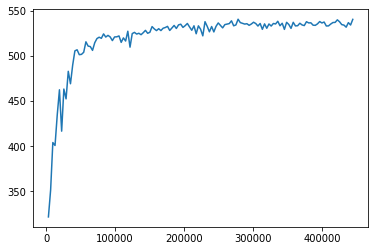

Train:539.99
Train:538.372
Train:537.176
Train:541.009
Train:535.94
Train:535.209
Train:535.854
Train:538.467
Train:535.721
Train:532.603
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000150/checkpoint-150


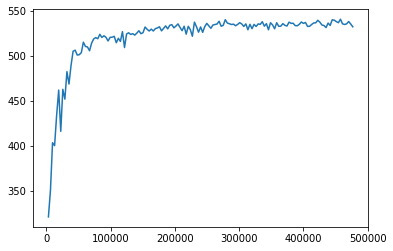

Train:539.111
Train:536.145
Train:537.106
Train:537.58
Train:536.491
Train:536.742
Train:539.074
Train:540.344
Train:532.087
Train:541.68
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000160/checkpoint-160


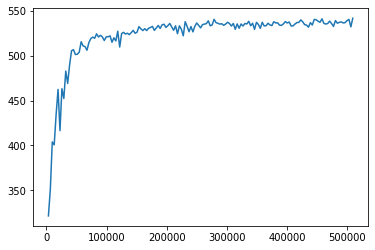

Train:541.68
Train:540.123
Train:541.646
Train:541.663
Train:539.437
Train:539.557
Train:534.249
Train:541.663
Train:541.68
Train:541.714
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000170/checkpoint-170


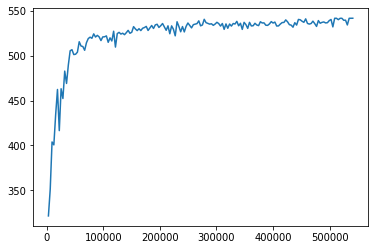

Train:541.646
Train:540.331
Train:541.697
Train:541.629
Train:541.68
Train:541.663
Train:541.68
Train:541.697
Train:541.697
Train:541.663
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000180/checkpoint-180


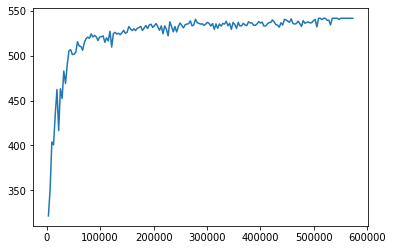

Train:541.628
Train:541.714
Train:540.165
Train:541.68
Train:541.68
Train:541.663
Train:541.663
Train:541.714
Train:541.663
Train:541.646
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000190/checkpoint-190


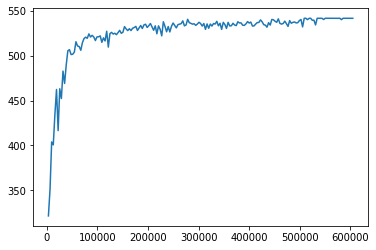

Train:541.697
Train:541.697
Train:541.646
Train:540.25
Train:541.68
Train:541.663
Train:541.697
Train:541.663
Train:541.663
Train:541.68
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000200/checkpoint-200


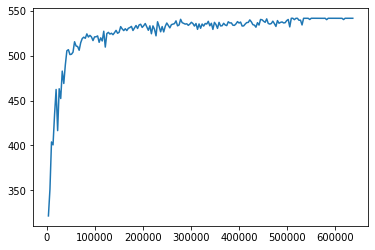

Train:541.697
Train:541.663
Train:541.68
Train:541.68
Train:538.892
Train:541.68
Train:541.68
Train:541.663
Train:541.663
Train:541.663
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000210/checkpoint-210


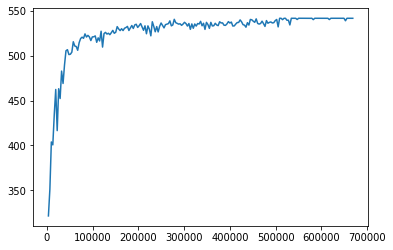

Train:541.646
Train:541.681
Train:541.663
Train:541.646
Train:541.663
Train:539.153
Train:541.68
Train:541.646
Train:541.697
Train:541.68
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000220/checkpoint-220


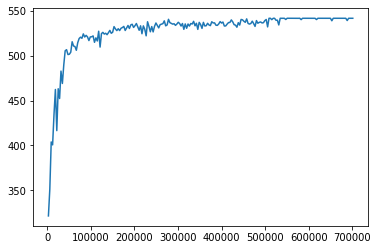

Train:541.663
Train:543.464
Train:543.447
Train:543.464
Train:541.646
Train:541.608
Train:545.23
Train:547.031
Train:548.832
Train:543.478
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000230/checkpoint-230


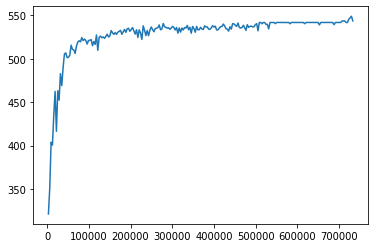

Train:547.015
Train:548.832
Train:541.628
Train:548.832
Train:548.832
Train:547.015
Train:548.832
Train:545.23
Train:547.031
Train:547.031
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000240/checkpoint-240


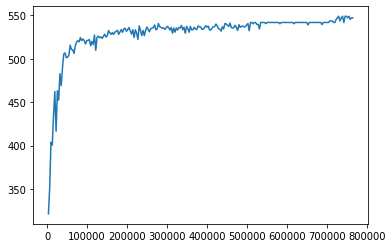

Train:545.23
Train:545.23
Train:545.23
Train:545.23
Train:545.23
Train:545.23
Train:543.429
Train:543.429
Train:548.832
Train:545.23
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000250/checkpoint-250


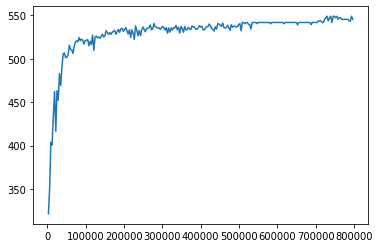

Train:548.832
Train:547.031
Train:548.832
Train:547.031
Train:545.23
Train:545.23
Train:548.832
Train:550.633
Train:547.031
Train:548.832
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000260/checkpoint-260


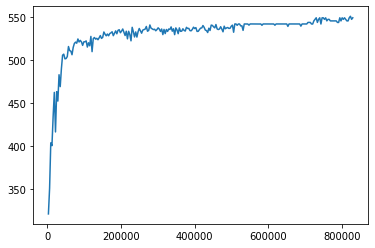

Train:547.031
Train:545.23
Train:541.612
Train:545.214
Train:543.429
Train:548.832
Train:547.031
Train:543.413
Train:545.23
Train:547.031
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000270/checkpoint-270


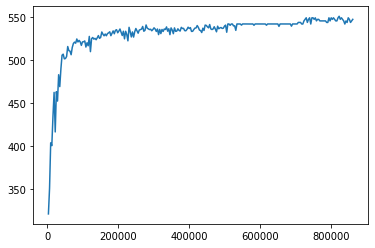

Train:547.015
Train:542.572
Train:545.23
Train:547.031
Train:544.647
Train:547.031
Train:541.628
Train:533.862
Train:543.429
Train:545.23
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000280/checkpoint-280


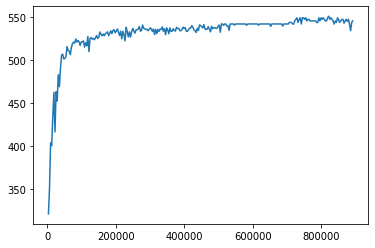

Train:550.633
Train:545.23
Train:547.031
Train:547.015
Train:547.031
Train:547.031
Train:538.069
Train:541.628
Train:547.031
Train:547.031
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000290/checkpoint-290


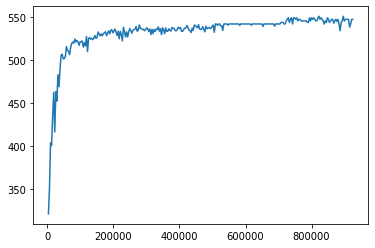

Train:545.23
Train:540.469
Train:547.031
Train:543.429
Train:545.23
Train:544.962
Train:545.23
Train:547.031
Train:545.23
Train:543.429
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000300/checkpoint-300


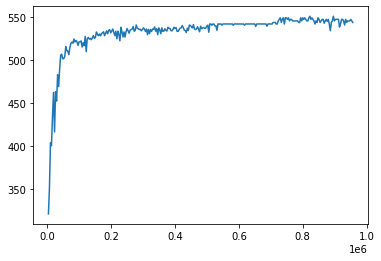

Train:541.628
Train:545.23
Train:543.429
Train:545.23
Train:547.015
Train:543.429
Train:543.447
Train:543.429
Train:545.23
Train:543.429
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000310/checkpoint-310


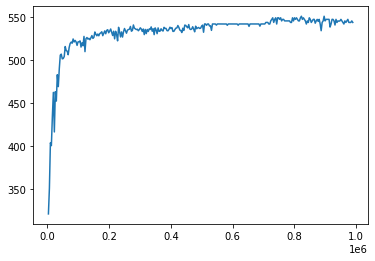

Train:545.23
Train:545.23
Train:545.23
Train:545.23
Train:545.23
Train:548.832
Train:545.23
Train:547.031
Train:545.23
Train:544.437
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_22-28-05oelvezr6/checkpoint_000320/checkpoint-320


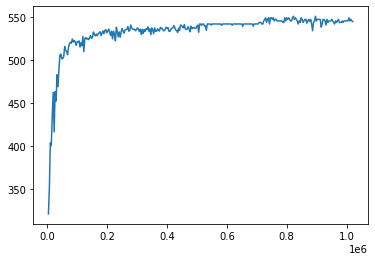

2021-10-19 23:01:46,638	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 23:01:47,804	WARNING worker.py:1115 -- WARNING: 24 PYTHON workers have been started on a node of the id: e21dbee78c9740c3638953a3214e3c0ce966c56f323b1cbf69ad59dc and address: 192.168.1.128. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.
2021-10-19 23:02:40,064	INFO trainable.py:104 -- Trainable.setup took 53.000 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 23:02:40,066	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:514.433
Train:514.227
Train:555.742
Train:572.192
Train:645.184
Train:616.193
Train:626.645
Train:665.202
Train:683.209
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000010/checkpoint-10


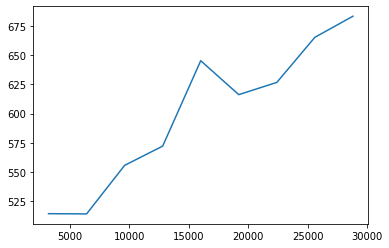

Train:673.059
Train:693.888
Train:710.34
Train:669.068
Train:705.411
Train:691.224
Train:709.695
Train:707.593
Train:706.869
Train:706.05
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000020/checkpoint-20


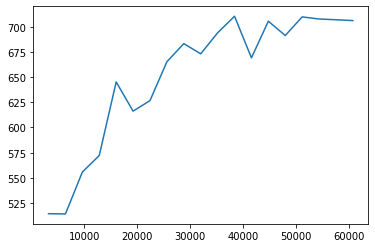

Train:712.699
Train:716.669
Train:722.074
Train:716.701
Train:717.469
Train:715.717
Train:718.601
Train:719.996
Train:711.489
Train:721.702
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000030/checkpoint-30


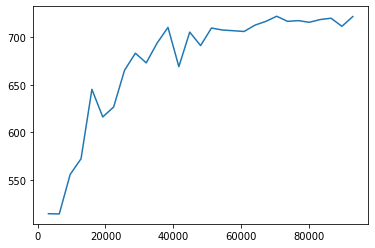

Train:715.549
Train:722.286
Train:717.73
Train:718.841
Train:723.554
Train:720.178
Train:723.855
Train:721.894
Train:721.804
Train:721.894
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000040/checkpoint-40


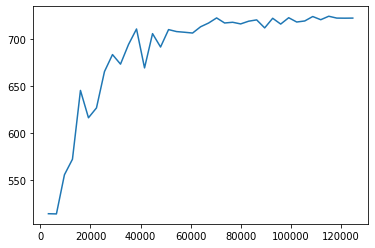

Train:724.558
Train:723.721
Train:720.911
Train:723.976
Train:724.064
Train:724.946
Train:725.154
Train:724.146
Train:725.534
Train:725.519
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000050/checkpoint-50


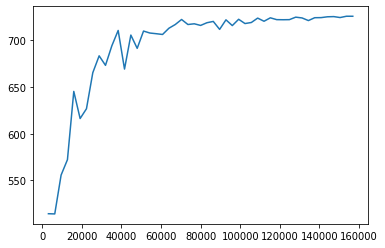

Train:724.94
Train:724.533
Train:725.404
Train:725.121
Train:725.631
Train:726.038
Train:725.598
Train:725.625
Train:725.154
Train:726.161
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000060/checkpoint-60


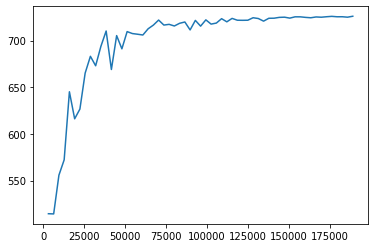

Train:725.26
Train:725.625
Train:725.507
Train:725.48
Train:720.424
Train:724.494
Train:725.064
Train:720.926
Train:725.027
Train:725.625
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000070/checkpoint-70


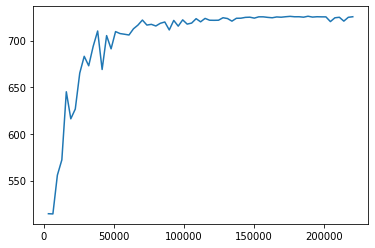

Train:718.798
Train:722.774
Train:725.657
Train:724.938
Train:725.154
Train:724.113
Train:725.625
Train:726.665
Train:725.029
Train:726.161
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000080/checkpoint-80


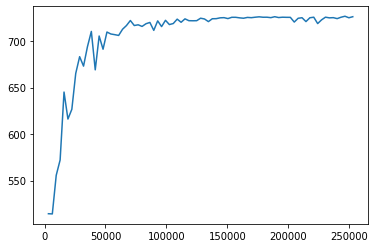

Train:725.534
Train:725.004
Train:725.076
Train:724.081
Train:726.483
Train:724.493
Train:724.205
Train:725.533
Train:725.593
Train:725.154
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000090/checkpoint-90


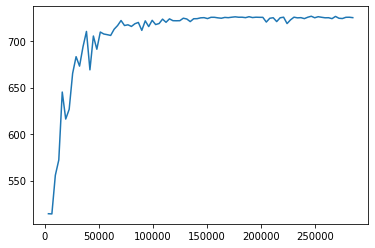

Train:724.564
Train:725.565
Train:726.161
Train:721.096
Train:725.031
Train:726.665
Train:725.084
Train:726.129
Train:725.06
Train:724.4
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000100/checkpoint-100


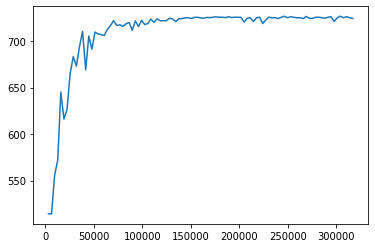

Train:725.031
Train:724.782
Train:721.065
Train:725.506
Train:712.051
Train:724.29
Train:726.134
Train:724.751
Train:726.07
Train:725.498
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000110/checkpoint-110


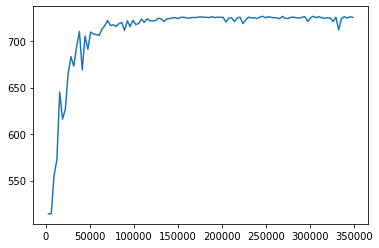

Train:724.558
Train:726.161
Train:724.469
Train:722.802
Train:725.522
Train:726.129
Train:724.528
Train:725.603
Train:725.111
Train:725.567
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000120/checkpoint-120


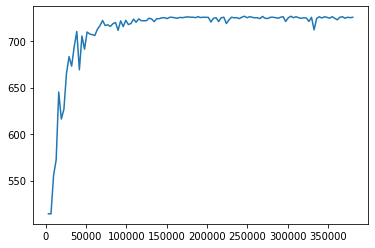

Train:715.269
Train:725.4
Train:724.564
Train:719.58
Train:725.449
Train:724.741
Train:725.111
Train:725.588
Train:726.038
Train:726.106
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000130/checkpoint-130


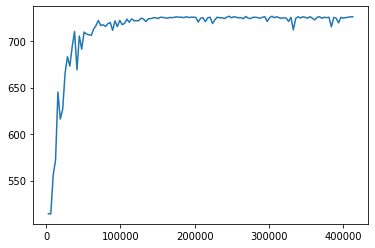

Train:726.028
Train:724.014
Train:725.112
Train:725.111
Train:724.644
Train:726.274
Train:724.608
Train:724.062
Train:724.847
Train:726.028
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000140/checkpoint-140


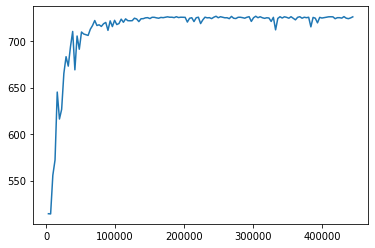

Train:724.533
Train:724.752
Train:724.906
Train:724.027
Train:725.918
Train:725.539
Train:725.111
Train:719.74
Train:725.63
Train:724.559
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000150/checkpoint-150


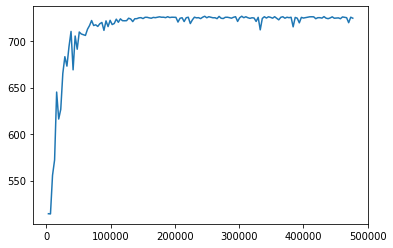

Train:725.089
Train:725.593
Train:725.631
Train:725.095
Train:722.414
Train:725.089
Train:724.597
Train:724.559
Train:723.236
Train:724.526
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000160/checkpoint-160


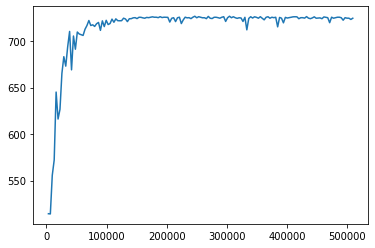

Train:724.52
Train:725.062
Train:725.631
Train:725.589
Train:726.665
Train:724.559
Train:726.574
Train:716.326
Train:726.161
Train:725.593
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000170/checkpoint-170


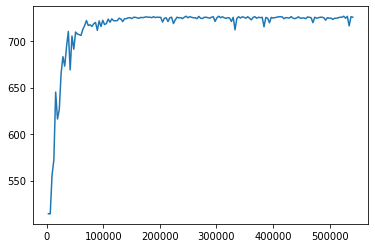

Train:722.17
Train:724.591
Train:724.585
Train:725.657
Train:724.52
Train:726.134
Train:725.625
Train:725.089
Train:725.625
Train:724.104
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000180/checkpoint-180


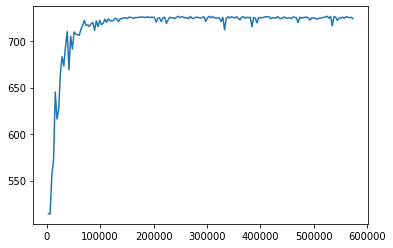

Train:725.583
Train:725.03
Train:725.117
Train:724.585
Train:726.161
Train:724.65
Train:725.657
Train:724.65
Train:726.028
Train:725.154
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000190/checkpoint-190


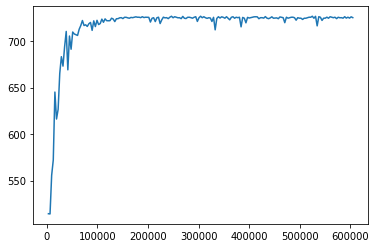

Train:724.65
Train:725.111
Train:725.085
Train:725.593
Train:726.07
Train:725.111
Train:724.585
Train:725.625
Train:725.625
Train:725.625
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000200/checkpoint-200


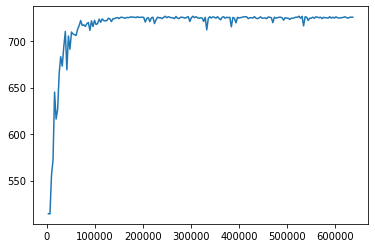

Train:725.089
Train:725.625
Train:726.161
Train:721.908
Train:725.587
Train:714.853
Train:725.127
Train:725.631
Train:725.037
Train:726.161
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000210/checkpoint-210


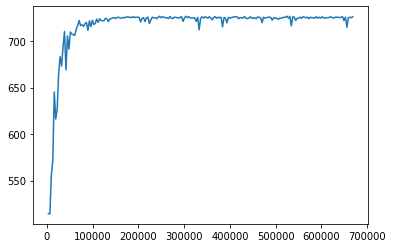

Train:726.665
Train:724.65
Train:725.126
Train:726.161
Train:725.63
Train:725.625
Train:724.608
Train:725.63
Train:726.665
Train:725.54
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000220/checkpoint-220


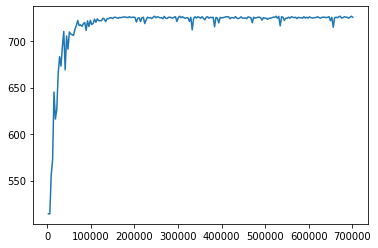

Train:725.127
Train:725.657
Train:725.062
Train:725.625
Train:725.056
Train:724.65
Train:725.095
Train:724.585
Train:726.665
Train:725.593
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000230/checkpoint-230


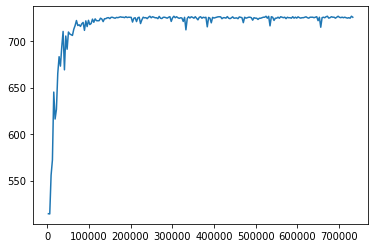

Train:724.585
Train:725.121
Train:726.161
Train:726.101
Train:725.121
Train:722.197
Train:726.134
Train:725.095
Train:726.161
Train:724.618
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000240/checkpoint-240


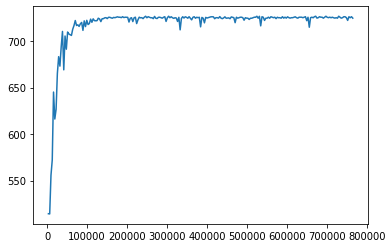

Train:724.061
Train:725.625
Train:725.657
Train:724.763
Train:725.593
Train:726.129
Train:725.727
Train:724.559
Train:726.134
Train:726.161
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000250/checkpoint-250


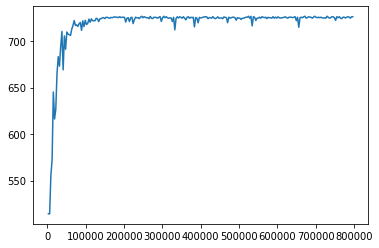

Train:724.585
Train:724.966
Train:726.129
Train:725.565
Train:725.534
Train:725.121
Train:725.03
Train:724.65
Train:725.154
Train:725.063
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000260/checkpoint-260


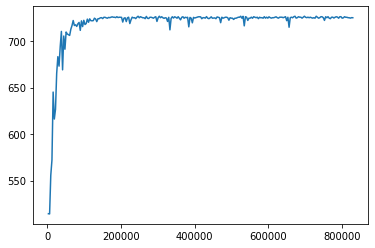

Train:725.63
Train:724.998
Train:726.574
Train:724.114
Train:724.559
Train:725.63
Train:724.59
Train:726.161
Train:726.161
Train:724.585
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000270/checkpoint-270


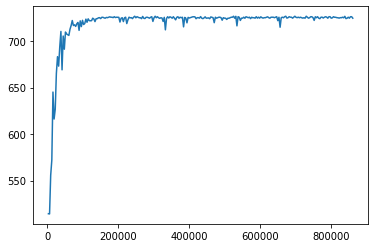

Train:726.038
Train:721.237
Train:726.161
Train:725.121
Train:715.341
Train:725.625
Train:725.625
Train:725.154
Train:724.65
Train:724.441
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000280/checkpoint-280


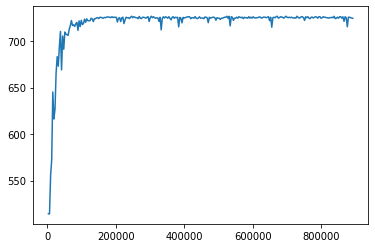

Train:724.65
Train:725.154
Train:725.657
Train:724.65
Train:725.154
Train:725.615
Train:725.154
Train:725.615
Train:725.154
Train:725.567
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000290/checkpoint-290


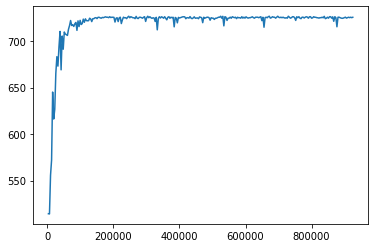

Train:722.542
Train:724.114
Train:721.878
Train:725.154
Train:725.657
Train:724.972
Train:726.07
Train:724.559
Train:726.07
Train:725.432
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000300/checkpoint-300


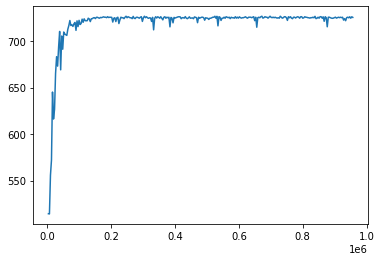

Train:724.618
Train:726.161
Train:724.92
Train:725.625
Train:726.161
Train:725.625
Train:725.154
Train:726.665
Train:725.154
Train:725.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000310/checkpoint-310


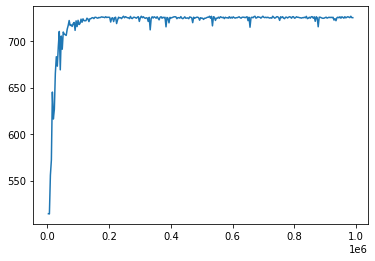

Train:725.625
Train:725.657
Train:725.615
Train:726.637
Train:725.534
Train:724.517
Train:726.161
Train:725.126
Train:725.154
Train:724.608
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-01-47pxpjo45a/checkpoint_000320/checkpoint-320


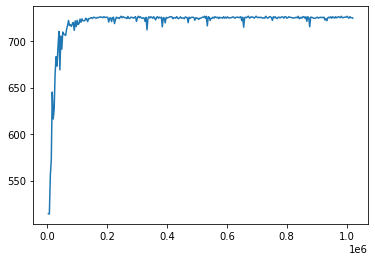

2021-10-19 23:35:27,034	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-19 23:36:19,609	INFO trainable.py:104 -- Trainable.setup took 52.154 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-19 23:36:19,614	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:483.741
Train:541.808
Train:503.271
Train:612.822
Train:635.481
Train:633.597
Train:640.263
Train:638.082
Train:678.256
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000010/checkpoint-10


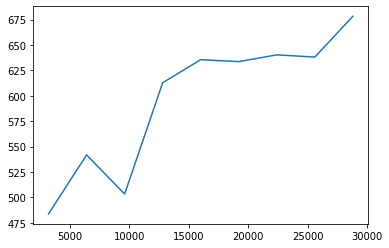

Train:673.023
Train:683.356
Train:691.529
Train:663.857
Train:694.02
Train:691.268
Train:688.62
Train:705.482
Train:703.371
Train:679.063
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000020/checkpoint-20


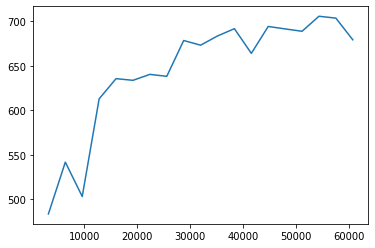

Train:703.352
Train:708.629
Train:693.614
Train:703.218
Train:705.761
Train:703.834
Train:701.314
Train:701.897
Train:694.182
Train:708.364
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000030/checkpoint-30


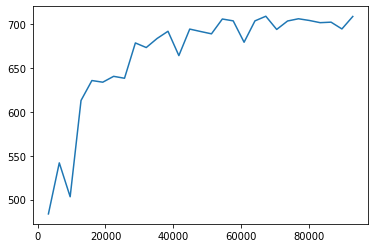

Train:705.88
Train:706.467
Train:706.005
Train:709.824
Train:695.234
Train:707.681
Train:703.786
Train:707.838
Train:707.297
Train:705.291
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000040/checkpoint-40


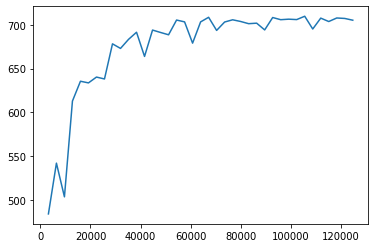

Train:707.464
Train:703.71
Train:709.628
Train:705.774
Train:714.428
Train:709.903
Train:702.482
Train:705.108
Train:707.106
Train:712.904
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000050/checkpoint-50


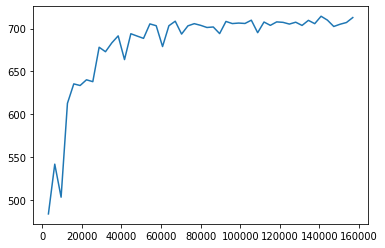

Train:710.126
Train:705.496
Train:710.816
Train:707.741
Train:711.861
Train:701.522
Train:710.722
Train:709.094
Train:710.56
Train:707.244
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000060/checkpoint-60


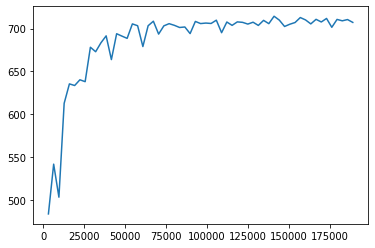

Train:709.731
Train:706.714
Train:706.796
Train:709.161
Train:710.629
Train:709.441
Train:710.653
Train:710.653
Train:706.923
Train:711.893
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000070/checkpoint-70


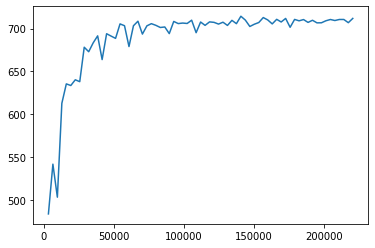

Train:711.761
Train:712.388
Train:707.136
Train:712.956
Train:711.114
Train:710.587
Train:710.262
Train:708.627
Train:701.928
Train:705.829
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000080/checkpoint-80


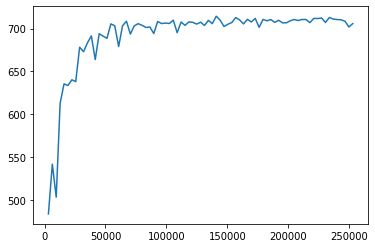

Train:709.281
Train:710.086
Train:710.725
Train:712.937
Train:710.265
Train:710.273
Train:711.319
Train:710.734
Train:710.273
Train:711.006
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000090/checkpoint-90


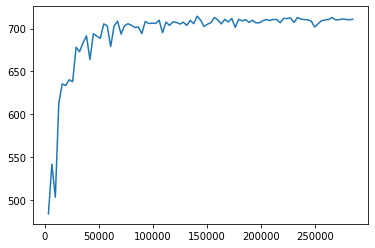

Train:710.192
Train:711.397
Train:710.262
Train:710.653
Train:711.467
Train:711.927
Train:711.018
Train:711.183
Train:707.688
Train:711.183
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000100/checkpoint-100


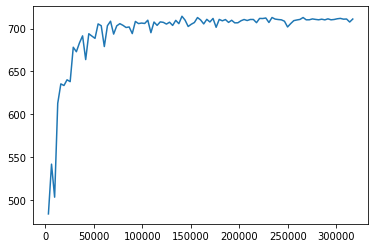

Train:711.006
Train:710.722
Train:709.34
Train:710.262
Train:711.218
Train:710.262
Train:710.262
Train:708.771
Train:707.968
Train:708.532
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000110/checkpoint-110


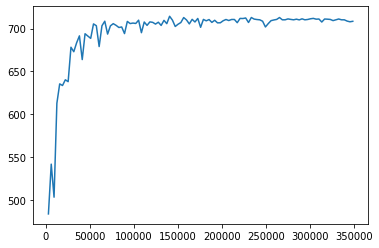

Train:710.757
Train:712.445
Train:710.122
Train:711.399
Train:712.754
Train:711.01
Train:710.487
Train:713.891
Train:710.478
Train:715.024
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000120/checkpoint-120


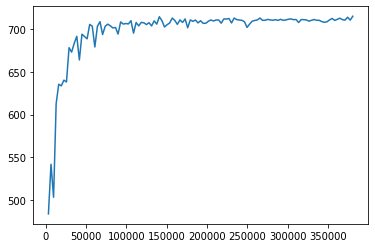

Train:711.431
Train:709.883
Train:713.889
Train:710.475
Train:709.352
Train:712.595
Train:710.108
Train:712.754
Train:710.478
Train:707.43
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000130/checkpoint-130


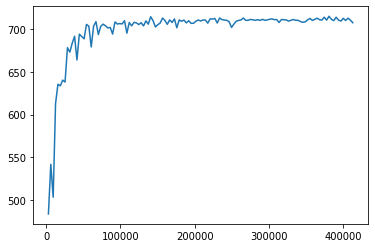

Train:710.478
Train:710.475
Train:713.886
Train:711.61
Train:713.886
Train:704.876
Train:713.883
Train:713.886
Train:712.748
Train:708.596
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000140/checkpoint-140


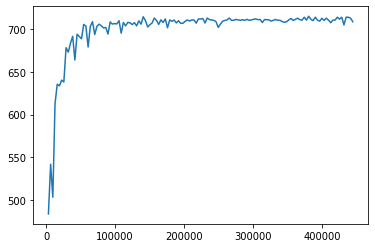

Train:711.61
Train:712.751
Train:710.979
Train:713.88
Train:713.88
Train:710.475
Train:714.202
Train:711.61
Train:712.748
Train:710.475
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000150/checkpoint-150


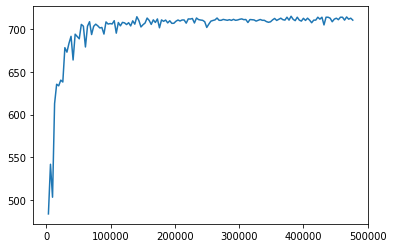

Train:712.754
Train:712.748
Train:712.748
Train:712.751
Train:711.61
Train:711.613
Train:711.61
Train:710.475
Train:710.296
Train:713.883
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000160/checkpoint-160


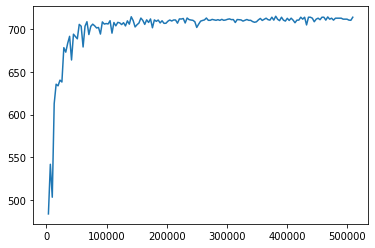

Train:712.745
Train:715.018
Train:710.475
Train:711.61
Train:710.475
Train:710.475
Train:712.745
Train:710.475
Train:707.973
Train:712.592
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000170/checkpoint-170


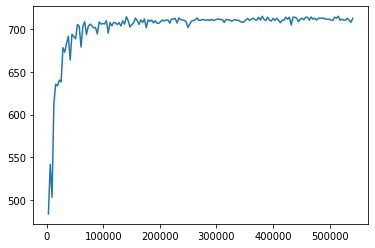

Train:711.61
Train:712.745
Train:712.745
Train:713.883
Train:710.475
Train:710.475
Train:713.883
Train:715.015
Train:711.61
Train:712.745
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000180/checkpoint-180


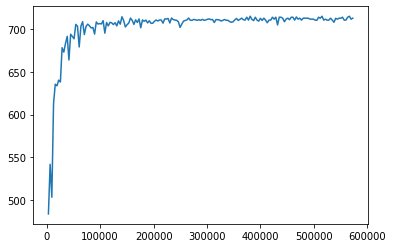

Train:712.745
Train:710.475
Train:713.88
Train:712.656
Train:711.457
Train:713.88
Train:711.61
Train:710.475
Train:713.88
Train:713.513
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000190/checkpoint-190


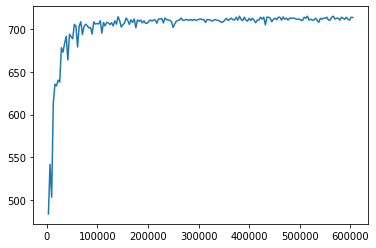

Train:713.88
Train:711.613
Train:711.855
Train:711.613
Train:713.883
Train:709.34
Train:710.475
Train:713.88
Train:707.726
Train:707.615
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000200/checkpoint-200


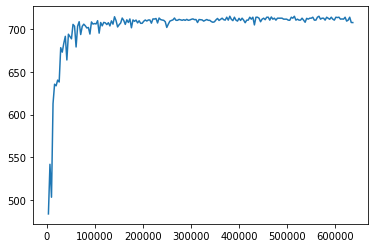

Train:713.713
Train:711.61
Train:711.705
Train:711.613
Train:712.751
Train:711.61
Train:711.632
Train:707.637
Train:713.177
Train:707.61
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000210/checkpoint-210


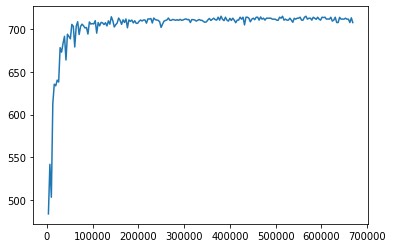

Train:711.61
Train:711.61
Train:712.303
Train:712.748
Train:712.754
Train:712.745
Train:710.659
Train:711.797
Train:712.112
Train:712.929
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000220/checkpoint-220


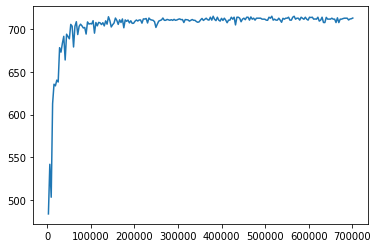

Train:708.864
Train:711.8
Train:711.816
Train:712.745
Train:711.03
Train:712.931
Train:709.892
Train:714.07
Train:713.116
Train:712.935
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000230/checkpoint-230


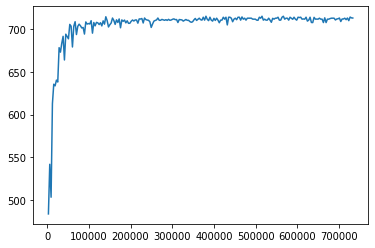

Train:711.978
Train:713.116
Train:713.118
Train:712.167
Train:712.164
Train:712.167
Train:714.069
Train:712.165
Train:711.214
Train:710.067
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000240/checkpoint-240


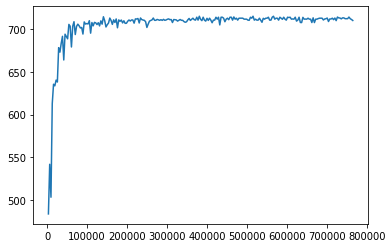

Train:712.165
Train:712.165
Train:711.21
Train:711.21
Train:712.162
Train:711.21
Train:712.162
Train:714.067
Train:712.164
Train:713.118
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000250/checkpoint-250


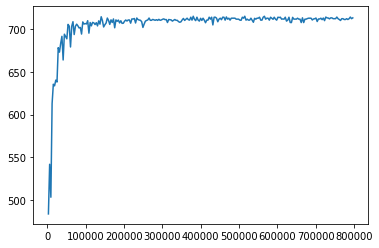

Train:712.162
Train:711.213
Train:713.119
Train:712.165
Train:708.188
Train:711.213
Train:714.069
Train:713.119
Train:710.259
Train:713.434
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000260/checkpoint-260


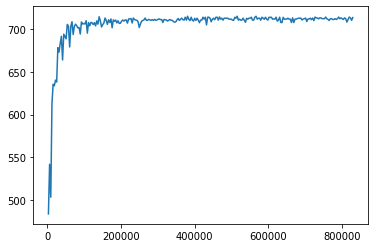

Train:713.118
Train:711.21
Train:703.17
Train:712.167
Train:703.295
Train:712.229
Train:715.026
Train:714.385
Train:709.836
Train:711.214
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000270/checkpoint-270


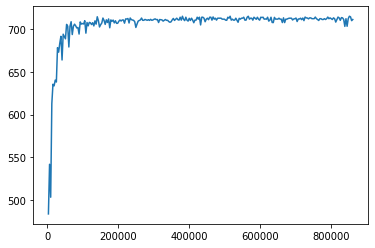

Train:713.121
Train:711.214
Train:712.167
Train:712.168
Train:713.115
Train:712.817
Train:711.213
Train:713.115
Train:711.213
Train:713.121
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000280/checkpoint-280


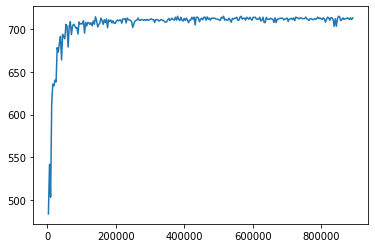

Train:713.118
Train:712.167
Train:708.934
Train:714.938
Train:714.075
Train:712.167
Train:714.073
Train:713.121
Train:712.167
Train:711.862
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000290/checkpoint-290


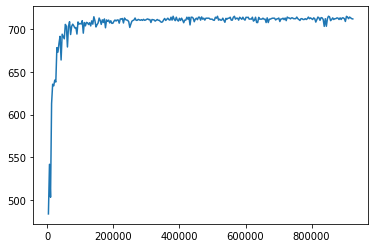

Train:713.121
Train:713.121
Train:712.168
Train:714.076
Train:712.165
Train:713.121
Train:712.165
Train:714.075
Train:709.053
Train:712.162
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000300/checkpoint-300


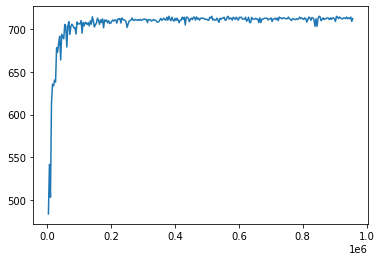

Train:712.164
Train:712.167
Train:713.119
Train:711.052
Train:715.029
Train:711.946
Train:713.118
Train:713.118
Train:713.118
Train:712.167
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000310/checkpoint-310


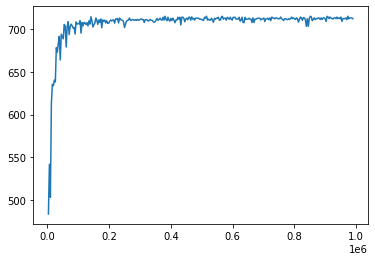

Train:712.167
Train:714.075
Train:713.118
Train:709.837
Train:710.259
Train:713.113
Train:708.097
Train:712.167
Train:707.746
Train:713.113
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-19_23-35-27nm60qp8z/checkpoint_000320/checkpoint-320


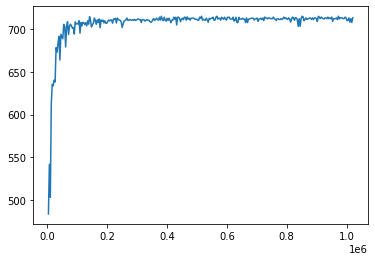

2021-10-20 00:09:11,058	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 00:09:12,210	WARNING worker.py:1115 -- WARNING: 24 PYTHON workers have been started on a node of the id: 0537abcfd851c6989e93f0ff97f1ca18688a772f959ba8a1337efdcd and address: 192.168.1.128. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.
2021-10-20 00:10:03,737	INFO trainable.py:104 -- Trainable.setup took 52.246 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 00:10:03,741	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:433.9
Train:458.695
Train:503.744
Train:568.2
Train:518.26
Train:612.392
Train:630.023
Train:587.966
Train:549.014
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000010/checkpoint-10


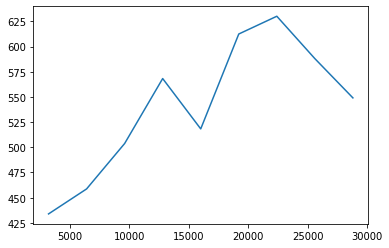

Train:646.681
Train:654.977
Train:637.843
Train:621.415
Train:665.529
Train:669.282
Train:653.594
Train:678.249
Train:676.644
Train:669.844
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000020/checkpoint-20


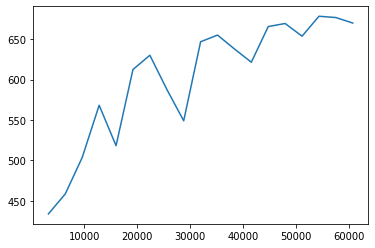

Train:661.832
Train:681.29
Train:675.373
Train:667.99
Train:666.819
Train:673.071
Train:666.269
Train:680.031
Train:679.78
Train:681.313
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000030/checkpoint-30


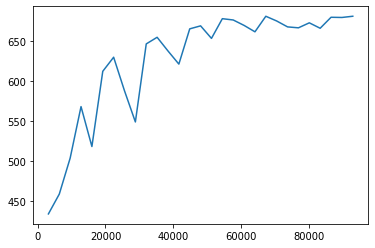

Train:676.668
Train:680.254
Train:675.837
Train:679.146
Train:679.681
Train:683.136
Train:679.348
Train:675.175
Train:683.286
Train:680.599
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000040/checkpoint-40


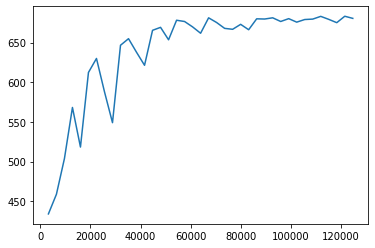

Train:682.776
Train:682.044
Train:682.939
Train:682.528
Train:686.219
Train:685.044
Train:687.373
Train:688.269
Train:685.995
Train:687.36
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000050/checkpoint-50


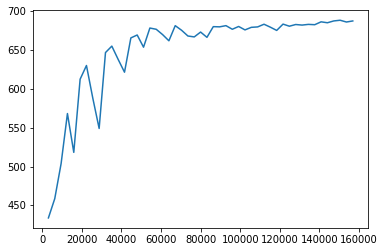

Train:687.605
Train:687.702
Train:687.532
Train:686.126
Train:688.037
Train:687.197
Train:687.605
Train:687.785
Train:687.675
Train:687.321
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000060/checkpoint-60


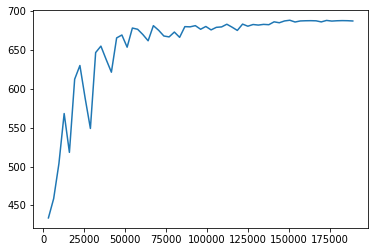

Train:686.447
Train:687.764
Train:688.016
Train:687.321
Train:687.77
Train:687.733
Train:687.986
Train:687.754
Train:683.316
Train:687.764
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000070/checkpoint-70


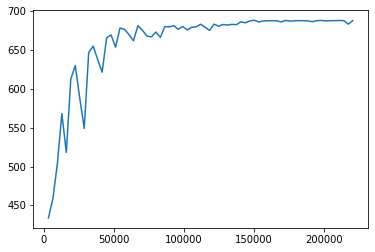

Train:687.764
Train:687.481
Train:678.742
Train:687.481
Train:688.016
Train:687.986
Train:686.061
Train:687.218
Train:686.983
Train:687.785
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000080/checkpoint-80


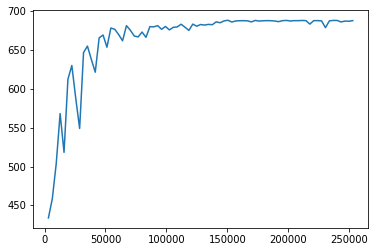

Train:687.839
Train:687.04
Train:687.808
Train:687.45
Train:683.954
Train:687.525
Train:688.037
Train:686.324
Train:687.481
Train:687.764
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000090/checkpoint-90


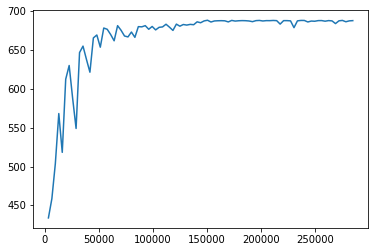

Train:687.197
Train:687.785
Train:687.986
Train:687.764
Train:688.016
Train:687.45
Train:687.764
Train:687.121
Train:687.445
Train:687.876
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000100/checkpoint-100


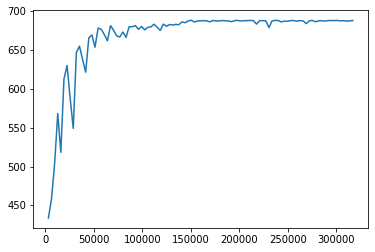

Train:687.228
Train:688.037
Train:686.824
Train:683.191
Train:686.996
Train:687.764
Train:685.902
Train:687.501
Train:687.785
Train:687.785
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000110/checkpoint-110


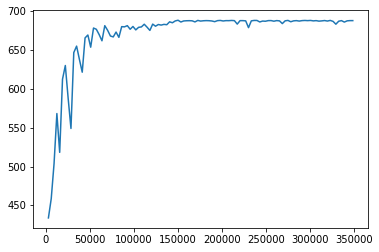

Train:687.986
Train:687.501
Train:687.481
Train:687.532
Train:687.501
Train:687.27
Train:687.532
Train:686.534
Train:687.523
Train:687.722
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000120/checkpoint-120


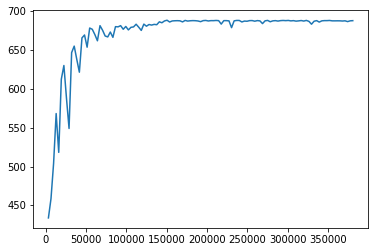

Train:687.764
Train:687.702
Train:686.954
Train:683.958
Train:687.197
Train:688.676
Train:687.754
Train:688.224
Train:687.419
Train:687.986
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000130/checkpoint-130


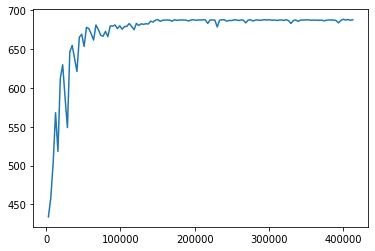

Train:688.016
Train:687.511
Train:687.365
Train:687.986
Train:687.141
Train:688.016
Train:688.222
Train:683.97
Train:687.764
Train:684.441
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000140/checkpoint-140


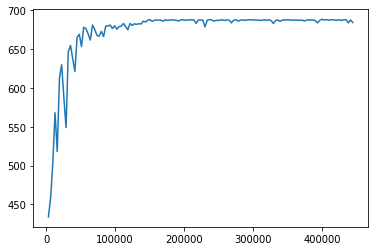

Train:687.878
Train:685.531
Train:687.785
Train:687.522
Train:684.245
Train:687.986
Train:688.016
Train:688.037
Train:687.204
Train:686.814
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000150/checkpoint-150


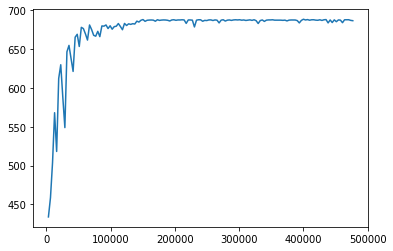

Train:687.986
Train:687.785
Train:687.466
Train:687.481
Train:688.016
Train:688.269
Train:687.135
Train:688.016
Train:684.898
Train:687.45
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000160/checkpoint-160


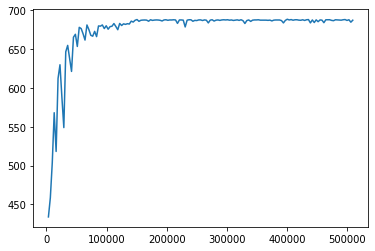

Train:687.785
Train:686.615
Train:687.361
Train:687.419
Train:687.702
Train:688.016
Train:687.733
Train:687.232
Train:687.375
Train:686.888
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000170/checkpoint-170


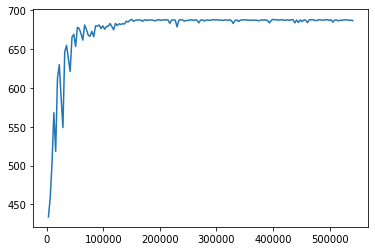

Train:687.511
Train:687.259
Train:687.702
Train:688.016
Train:684.096
Train:685.89
Train:688.016
Train:684.393
Train:686.945
Train:688.016
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000180/checkpoint-180


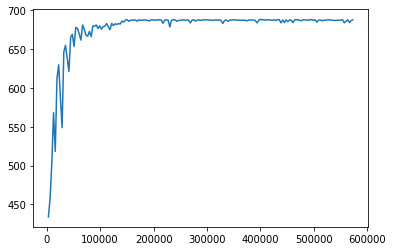

Train:677.356
Train:683.001
Train:687.45
Train:688.015
Train:687.702
Train:687.228
Train:679.371
Train:687.45
Train:687.733
Train:687.733
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000190/checkpoint-190


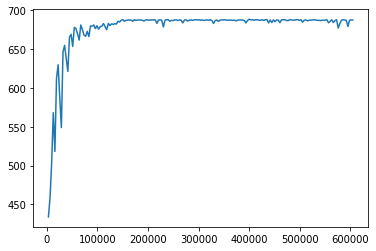

Train:686.195
Train:687.986
Train:688.037
Train:685.962
Train:687.197
Train:687.197
Train:687.764
Train:683.032
Train:687.764
Train:688.007
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000200/checkpoint-200


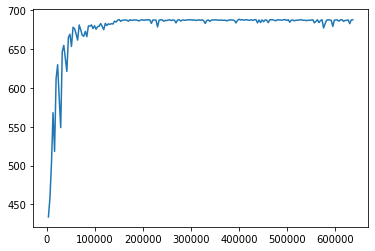

Train:687.45
Train:687.325
Train:687.805
Train:687.731
Train:687.553
Train:688.016
Train:687.532
Train:688.016
Train:687.532
Train:687.764
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000210/checkpoint-210


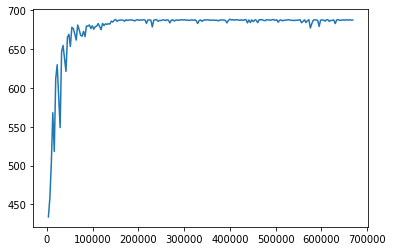

Train:687.764
Train:683.173
Train:687.122
Train:687.511
Train:687.511
Train:687.532
Train:687.805
Train:687.764
Train:687.532
Train:687.511
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000220/checkpoint-220


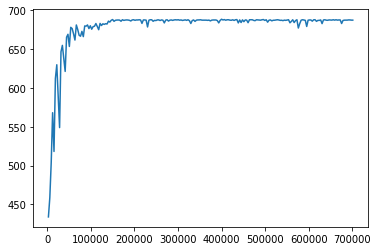

Train:687.532
Train:687.553
Train:687.532
Train:688.037
Train:687.764
Train:687.532
Train:688.016
Train:687.764
Train:684.481
Train:687.764
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000230/checkpoint-230


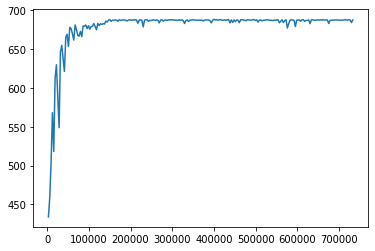

Train:688.037
Train:688.016
Train:687.785
Train:683.413
Train:687.805
Train:688.016
Train:687.511
Train:688.037
Train:687.764
Train:687.511
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000240/checkpoint-240


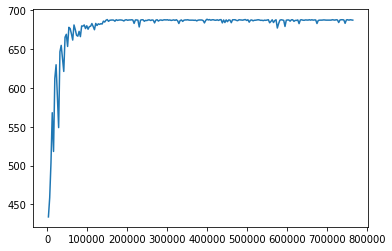

Train:687.77
Train:687.497
Train:687.785
Train:687.511
Train:687.764
Train:687.28
Train:687.511
Train:687.481
Train:687.28
Train:687.764
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000250/checkpoint-250


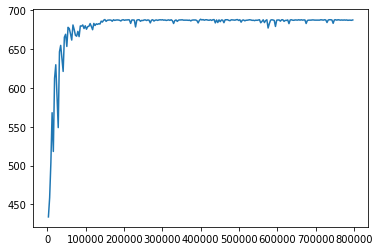

Train:688.016
Train:687.764
Train:687.511
Train:687.228
Train:687.259
Train:687.259
Train:687.764
Train:687.419
Train:687.764
Train:687.511
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000260/checkpoint-260


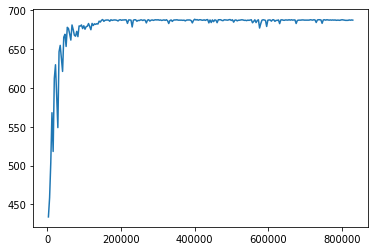

Train:688.269
Train:687.511
Train:687.259
Train:687.733
Train:687.764
Train:687.45
Train:685.868
Train:687.04
Train:687.511
Train:687.481
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000270/checkpoint-270


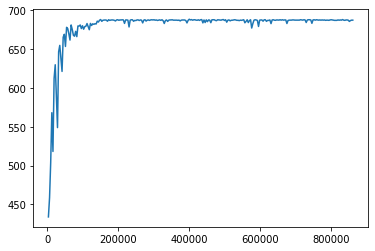

Train:686.519
Train:687.764
Train:686.796
Train:687.511
Train:687.511
Train:687.553
Train:682.558
Train:687.764
Train:687.764
Train:687.28
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000280/checkpoint-280


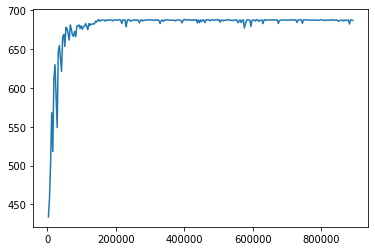

Train:687.785
Train:687.785
Train:687.481
Train:688.016
Train:687.574
Train:687.986
Train:687.511
Train:687.532
Train:687.764
Train:687.532
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000290/checkpoint-290


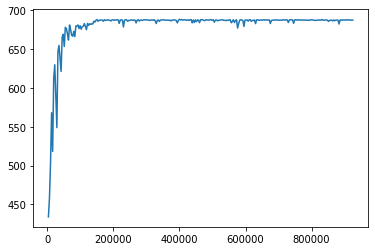

Train:687.27
Train:687.501
Train:687.532
Train:687.3
Train:687.532
Train:687.511
Train:687.501
Train:685.428
Train:687.532
Train:687.511
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000300/checkpoint-300


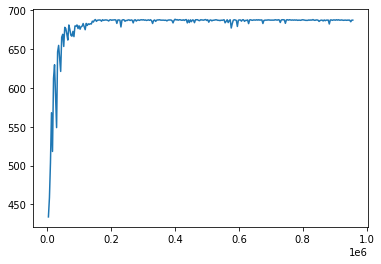

Train:687.785
Train:687.733
Train:688.016
Train:687.764
Train:687.511
Train:687.006
Train:687.764
Train:687.785
Train:687.481
Train:687.259
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000310/checkpoint-310


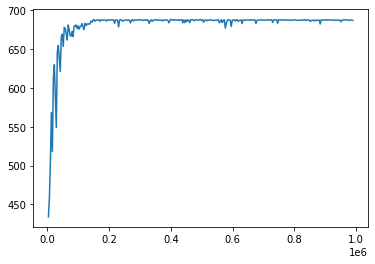

Train:678.023
Train:687.532
Train:687.28
Train:687.511
Train:688.269
Train:687.259
Train:688.037
Train:687.28
Train:687.553
Train:682.28
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-09-1122go8rhj/checkpoint_000320/checkpoint-320


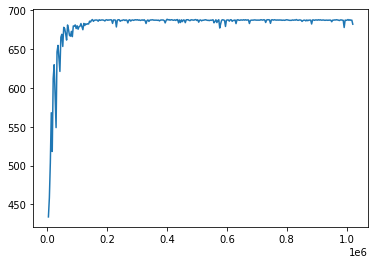

2021-10-20 00:42:56,792	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 00:43:49,653	INFO trainable.py:104 -- Trainable.setup took 52.429 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 00:43:49,656	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:414.371
Train:433.756
Train:474.059
Train:510.802
Train:507.936
Train:522.44
Train:548.828
Train:559.374
Train:548.722
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000010/checkpoint-10


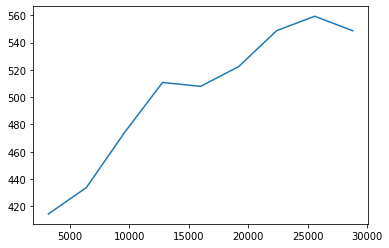

Train:579.449
Train:584.187
Train:588.301
Train:607.657
Train:596.464
Train:587.435
Train:606.331
Train:610.244
Train:611.688
Train:620.204
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000020/checkpoint-20


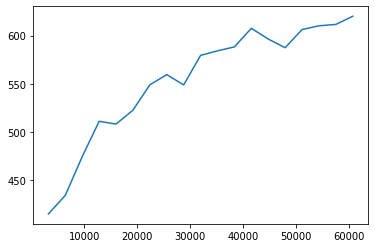

Train:613.834
Train:614.711
Train:608.404
Train:617.31
Train:618.892
Train:612.607
Train:621.306
Train:617.908
Train:618.835
Train:619.713
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000030/checkpoint-30


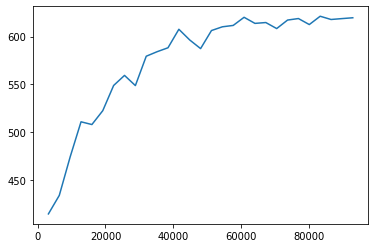

Train:621.231
Train:621.858
Train:629.959
Train:627.433
Train:628.196
Train:620.973
Train:628.184
Train:629.099
Train:629.851
Train:631.002
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000040/checkpoint-40


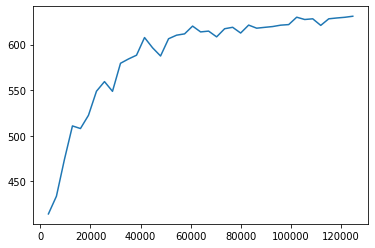

Train:628.894
Train:628.723
Train:631.271
Train:630.287
Train:633.796
Train:629.997
Train:630.577
Train:634.96
Train:633.99
Train:635.482
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000050/checkpoint-50


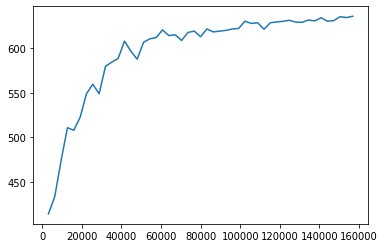

Train:636.718
Train:634.374
Train:635.998
Train:635.557
Train:624.304
Train:634.644
Train:635.941
Train:636.393
Train:636.516
Train:637.165
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000060/checkpoint-60


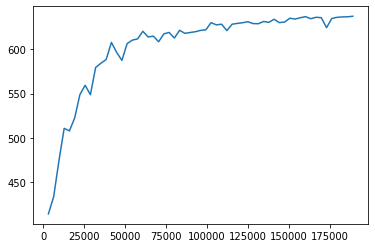

Train:635.218
Train:637.396
Train:635.387
Train:637.204
Train:636.578
Train:629.747
Train:636.841
Train:636.494
Train:636.851
Train:636.395
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000070/checkpoint-70


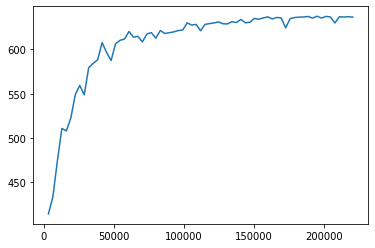

Train:637.098
Train:635.962
Train:635.901
Train:637.185
Train:636.444
Train:636.894
Train:637.348
Train:637.11
Train:637.301
Train:636.25
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000080/checkpoint-80


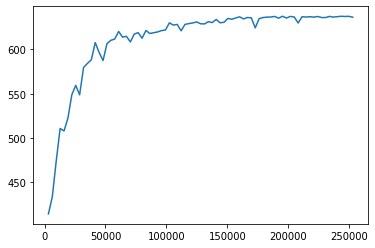

Train:637.378
Train:637.491
Train:637.565
Train:637.199
Train:637.477
Train:635.308
Train:637.394
Train:636.849
Train:637.29
Train:636.855
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000090/checkpoint-90


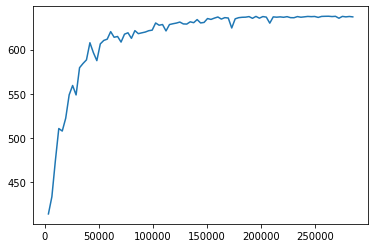

Train:637.295
Train:637.48
Train:635.32
Train:636.497
Train:637.575
Train:636.373
Train:636.855
Train:636.392
Train:636.557
Train:637.293
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000100/checkpoint-100


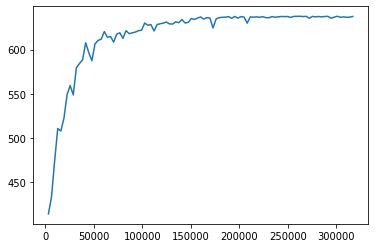

Train:637.479
Train:636.398
Train:637.291
Train:637.303
Train:637.293
Train:637.489
Train:637.301
Train:637.281
Train:637.392
Train:637.309
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000110/checkpoint-110


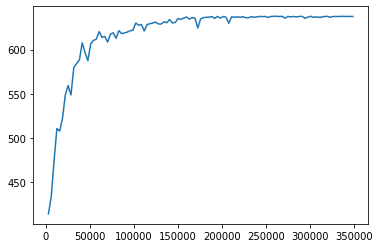

Train:637.303
Train:637.384
Train:631.773
Train:637.489
Train:637.387
Train:637.356
Train:637.3
Train:637.569
Train:637.573
Train:637.388
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000120/checkpoint-120


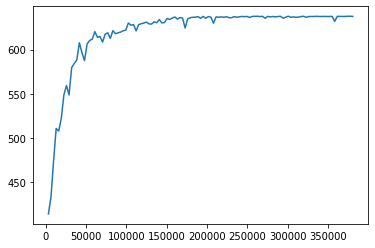

Train:633.085
Train:637.39
Train:636.918
Train:637.481
Train:637.295
Train:637.104
Train:637.199
Train:637.207
Train:637.219
Train:637.384
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000130/checkpoint-130


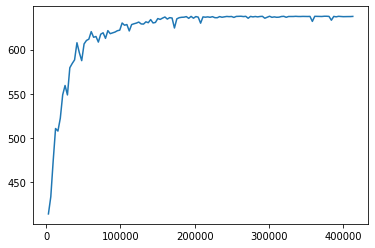

Train:637.099
Train:637.29
Train:637.271
Train:637.374
Train:637.38
Train:637.384
Train:637.289
Train:637.29
Train:637.293
Train:637.201
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000140/checkpoint-140


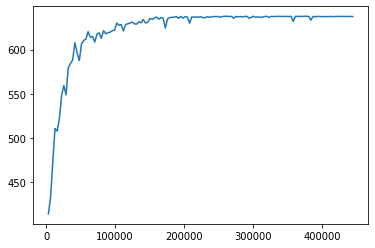

Train:632.485
Train:637.292
Train:637.298
Train:635.487
Train:637.279
Train:637.279
Train:635.987
Train:629.888
Train:637.384
Train:637.193
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000150/checkpoint-150


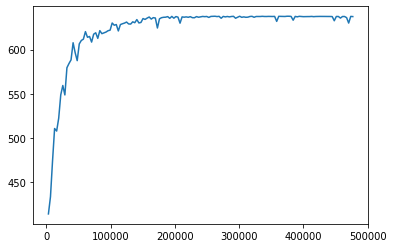

Train:637.577
Train:637.386
Train:637.29
Train:637.47
Train:637.292
Train:637.392
Train:637.362
Train:636.049
Train:637.293
Train:637.295
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000160/checkpoint-160


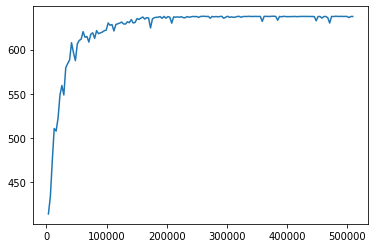

Train:637.185
Train:637.289
Train:637.308
Train:637.295
Train:637.195
Train:637.481
Train:630.695
Train:637.388
Train:637.388
Train:630.882
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000170/checkpoint-170


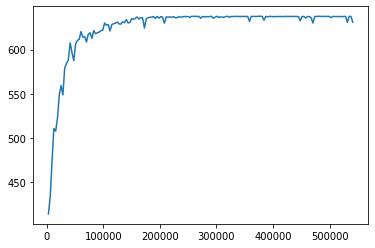

Train:637.199
Train:637.479
Train:637.392
Train:637.388
Train:637.481
Train:637.291
Train:637.297
Train:637.291
Train:637.392
Train:637.205
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000180/checkpoint-180


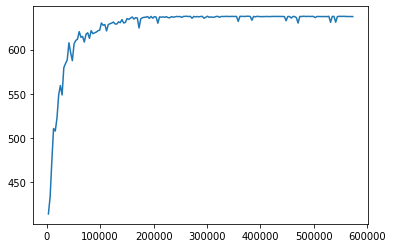

Train:637.482
Train:637.305
Train:637.479
Train:637.295
Train:637.386
Train:637.394
Train:637.388
Train:637.295
Train:637.479
Train:637.39
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000190/checkpoint-190


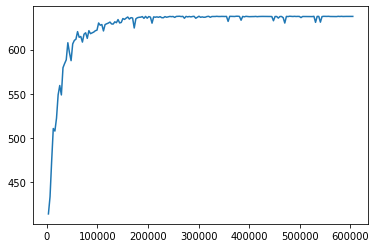

Train:633.895
Train:637.577
Train:637.382
Train:637.486
Train:637.307
Train:637.398
Train:637.293
Train:637.384
Train:637.205
Train:637.388
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000200/checkpoint-200


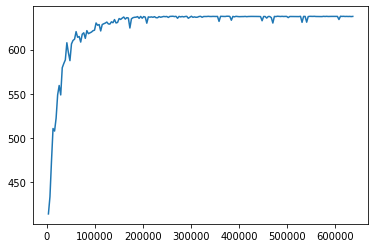

Train:637.204
Train:637.388
Train:637.196
Train:630.788
Train:637.479
Train:636.491
Train:637.102
Train:637.21
Train:636.47
Train:637.396
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000210/checkpoint-210


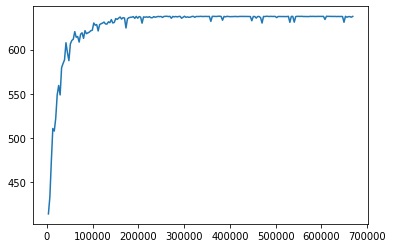

Train:637.384
Train:637.382
Train:637.216
Train:637.216
Train:637.388
Train:637.21
Train:637.39
Train:637.291
Train:637.285
Train:637.293
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000220/checkpoint-220


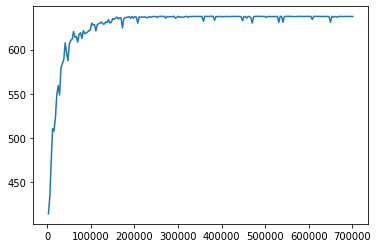

Train:637.39
Train:637.299
Train:636.853
Train:637.301
Train:637.119
Train:637.579
Train:636.857
Train:637.489
Train:637.173
Train:637.289
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000230/checkpoint-230


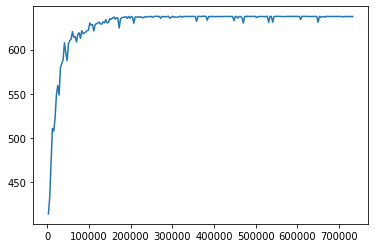

Train:637.307
Train:637.204
Train:637.316
Train:637.37
Train:637.398
Train:631.403
Train:631.405
Train:629.598
Train:630.627
Train:629.108
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000240/checkpoint-240


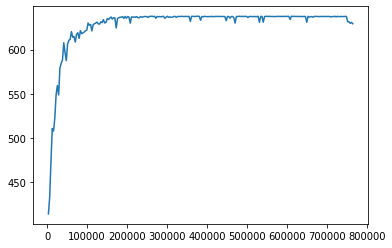

Train:635.487
Train:628.204
Train:633.64
Train:636.465
Train:637.58
Train:636.85
Train:636.486
Train:637.458
Train:637.293
Train:637.285
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000250/checkpoint-250


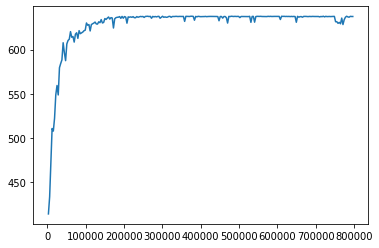

Train:637.483
Train:637.489
Train:635.574
Train:630.887
Train:637.207
Train:637.476
Train:633.356
Train:637.299
Train:637.49
Train:637.2
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000260/checkpoint-260


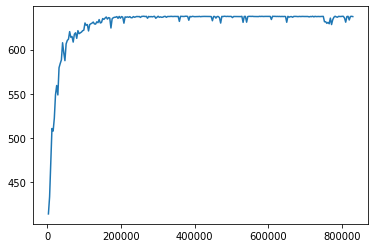

Train:637.479
Train:637.283
Train:636.845
Train:635.848
Train:637.386
Train:637.201
Train:637.298
Train:637.301
Train:637.299
Train:637.189
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000270/checkpoint-270


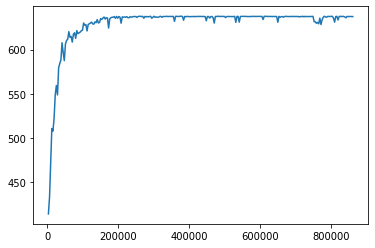

Train:637.39
Train:637.29
Train:637.391
Train:637.289
Train:637.29
Train:637.387
Train:637.382
Train:637.389
Train:637.39
Train:637.387
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000280/checkpoint-280


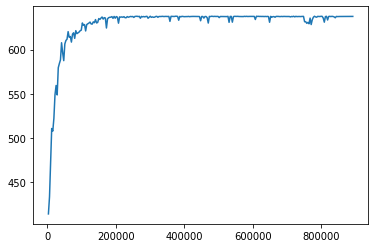

Train:637.281
Train:637.46
Train:636.747
Train:636.746
Train:636.99
Train:637.384
Train:637.293
Train:636.421
Train:637.47
Train:637.196
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000290/checkpoint-290


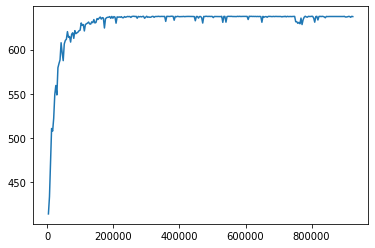

Train:637.483
Train:637.298
Train:637.371
Train:637.575
Train:637.388
Train:637.108
Train:637.393
Train:637.287
Train:637.19
Train:636.752
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000300/checkpoint-300


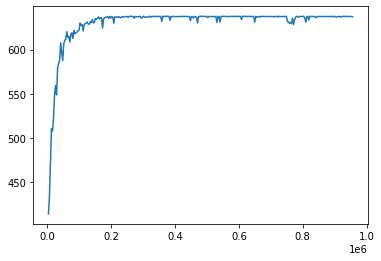

Train:637.391
Train:637.298
Train:637.445
Train:636.737
Train:637.182
Train:637.287
Train:637.094
Train:637.48
Train:637.356
Train:637.472
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000310/checkpoint-310


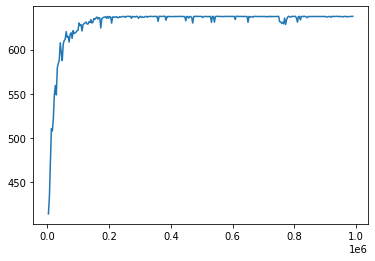

Train:637.384
Train:637.392
Train:637.204
Train:637.085
Train:637.299
Train:637.108
Train:637.287
Train:637.485
Train:633.974
Train:637.388
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_00-42-5754mnqtac/checkpoint_000320/checkpoint-320


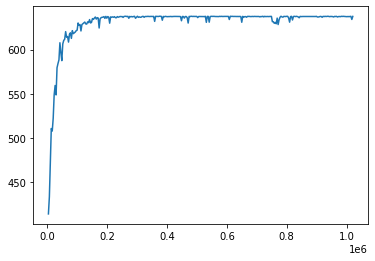

2021-10-20 01:16:44,506	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 01:17:37,976	INFO trainable.py:104 -- Trainable.setup took 53.015 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 01:17:37,980	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:182.394
Train:190.644
Train:276.523
Train:272.635
Train:314.623
Train:277.215
Train:302.713
Train:337.626
Train:343.96
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000010/checkpoint-10


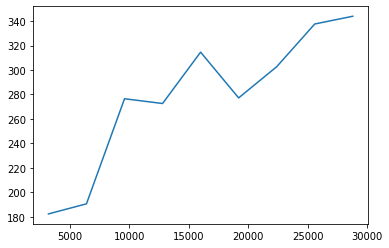

Train:320.683
Train:347.431
Train:350.907
Train:365.421
Train:371.21
Train:372.2
Train:373.205
Train:377.165
Train:368.245
Train:381.421
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000020/checkpoint-20


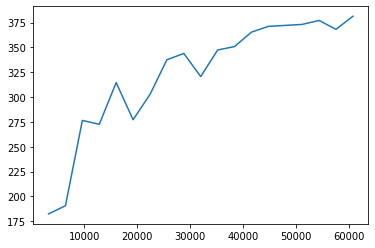

Train:387.495
Train:383.402
Train:383.988
Train:389.08
Train:390.272
Train:392.664
Train:396.398
Train:387.346
Train:394.667
Train:394.66
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000030/checkpoint-30


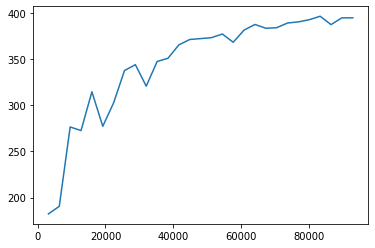

Train:393.23
Train:397.59
Train:398.032
Train:389.251
Train:403.216
Train:393.078
Train:399.398
Train:397.786
Train:389.153
Train:398.997
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000040/checkpoint-40


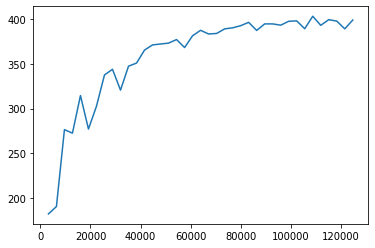

Train:399.217
Train:403.381
Train:400.806
Train:402.242
Train:398.949
Train:399.478
Train:398.255
Train:401.832
Train:402.837
Train:404.602
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000050/checkpoint-50


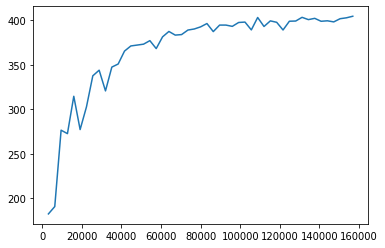

Train:402.837
Train:399.478
Train:401.845
Train:403.995
Train:400.799
Train:402.04
Train:395.865
Train:395.324
Train:403.635
Train:401.243
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000060/checkpoint-60


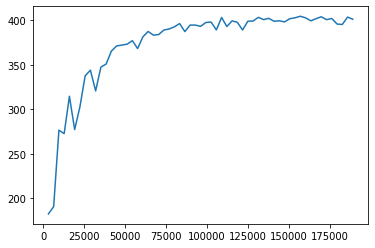

Train:401.243
Train:402.04
Train:402.837
Train:401.243
Train:402.04
Train:402.04
Train:401.243
Train:402.837
Train:402.04
Train:402.805
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000070/checkpoint-70


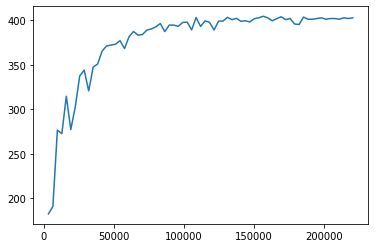

Train:402.04
Train:402.04
Train:402.609
Train:401.243
Train:402.04
Train:402.837
Train:402.04
Train:402.04
Train:402.04
Train:402.837
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000080/checkpoint-80


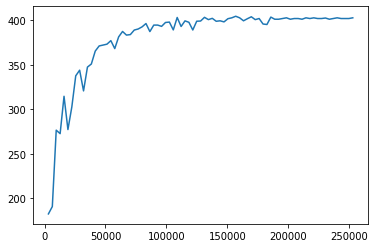

Train:402.04
Train:401.391
Train:402.04
Train:402.837
Train:402.04
Train:402.837
Train:404.432
Train:402.837
Train:402.04
Train:403.635
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000090/checkpoint-90


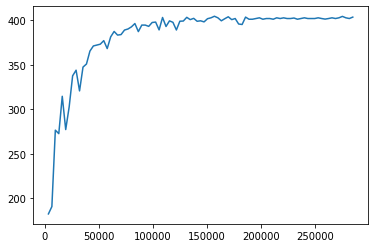

Train:401.119
Train:401.243
Train:402.837
Train:402.837
Train:401.243
Train:402.04
Train:401.243
Train:401.243
Train:401.243
Train:402.837
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000100/checkpoint-100


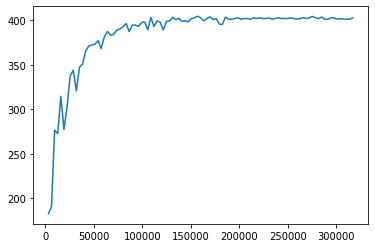

Train:402.04
Train:401.403
Train:403.635
Train:401.243
Train:402.04
Train:402.04
Train:402.04
Train:402.837
Train:402.837
Train:402.04
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000110/checkpoint-110


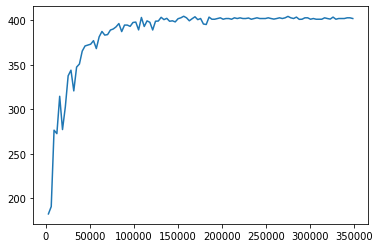

Train:400.445
Train:402.837
Train:402.837
Train:394.085
Train:402.837
Train:402.04
Train:401.243
Train:402.04
Train:401.243
Train:402.04
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000120/checkpoint-120


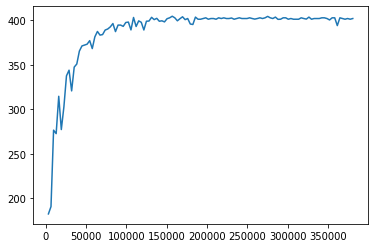

Train:402.826
Train:402.04
Train:402.837
Train:401.243
Train:402.04
Train:402.04
Train:403.635
Train:402.837
Train:402.837
Train:402.04
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000130/checkpoint-130


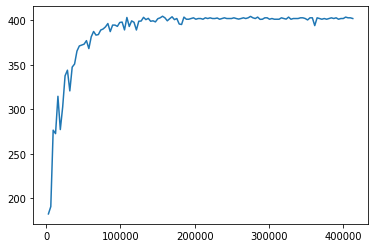

Train:402.837
Train:404.432
Train:402.837
Train:402.837
Train:400.445
Train:402.04
Train:402.04
Train:402.04
Train:402.837
Train:397.016
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000140/checkpoint-140


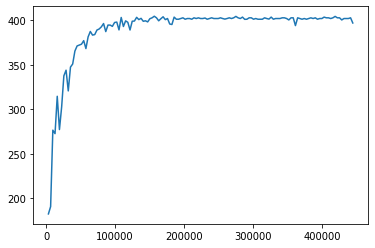

Train:402.837
Train:402.04
Train:402.04
Train:402.04
Train:400.445
Train:402.837
Train:402.04
Train:404.432
Train:402.837
Train:402.837
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000150/checkpoint-150


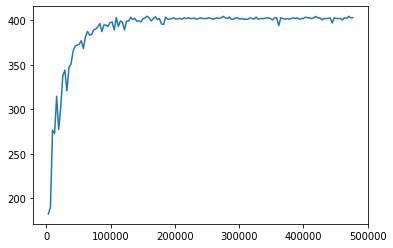

Train:401.243
Train:401.243
Train:404.432
Train:397.686
Train:403.635
Train:401.243
Train:402.837
Train:401.243
Train:401.243
Train:395.68
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000160/checkpoint-160


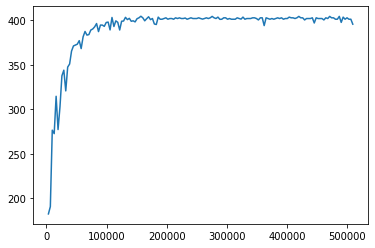

Train:404.432
Train:403.635
Train:403.635
Train:402.837
Train:401.067
Train:400.038
Train:401.243
Train:401.243
Train:403.635
Train:402.04
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000170/checkpoint-170


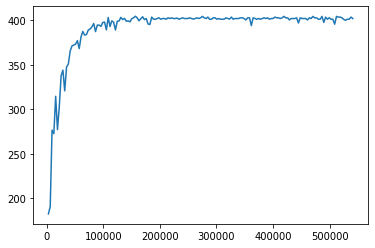

Train:404.432
Train:403.635
Train:402.04
Train:402.04
Train:401.243
Train:403.408
Train:403.635
Train:402.837
Train:396.52
Train:400.445
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000180/checkpoint-180


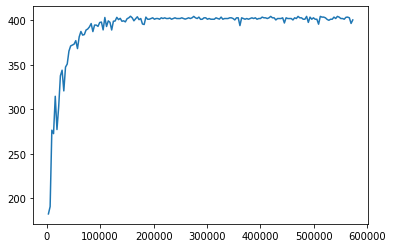

Train:402.837
Train:402.04
Train:401.243
Train:402.044
Train:403.635
Train:399.478
Train:400.275
Train:402.837
Train:402.04
Train:403.635
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000190/checkpoint-190


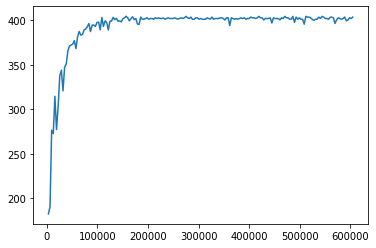

Train:402.837
Train:403.635
Train:402.076
Train:402.837
Train:402.837
Train:401.243
Train:402.837
Train:402.04
Train:402.04
Train:403.598
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000200/checkpoint-200


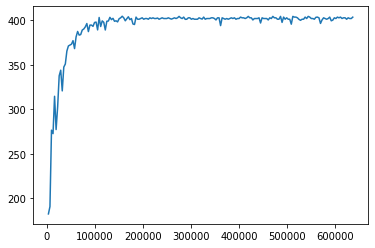

Train:399.856
Train:400.275
Train:402.859
Train:403.635
Train:400.445
Train:402.837
Train:402.837
Train:399.917
Train:402.04
Train:397.321
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000210/checkpoint-210


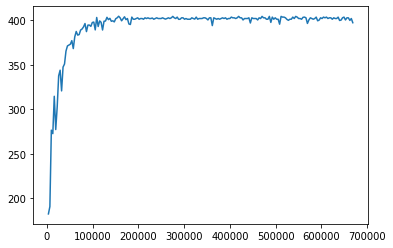

Train:402.04
Train:402.837
Train:401.87
Train:399.494
Train:402.04
Train:401.243
Train:402.56
Train:403.635
Train:404.602
Train:403.635
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000220/checkpoint-220


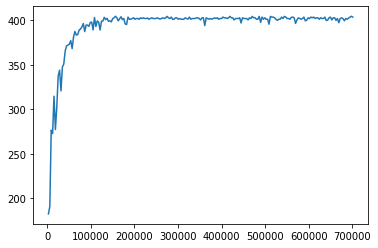

Train:401.243
Train:402.837
Train:402.04
Train:400.275
Train:403.635
Train:403.635
Train:403.635
Train:399.035
Train:402.04
Train:401.243
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000230/checkpoint-230


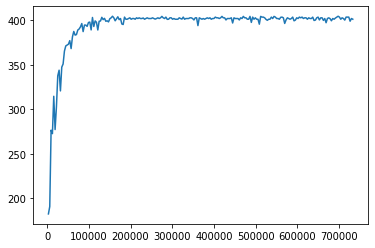

Train:402.837
Train:402.837
Train:401.243
Train:400.275
Train:402.04
Train:402.04
Train:402.04
Train:402.04
Train:401.779
Train:402.04
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000240/checkpoint-240


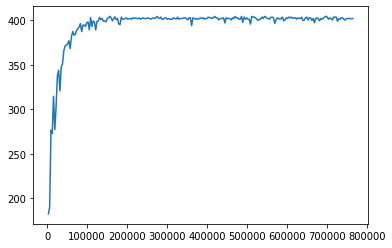

Train:399.94
Train:402.17
Train:403.635
Train:400.445
Train:401.243
Train:402.04
Train:401.243
Train:402.04
Train:402.837
Train:402.837
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000250/checkpoint-250


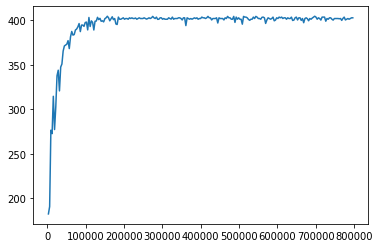

Train:402.837
Train:403.635
Train:402.837
Train:402.837
Train:403.635
Train:402.837
Train:402.04
Train:402.04
Train:402.837
Train:401.512
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000260/checkpoint-260


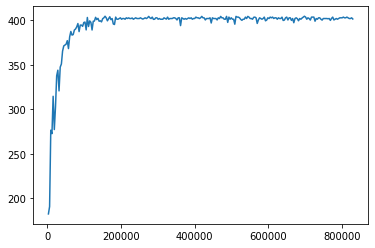

Train:402.837
Train:401.919
Train:402.837
Train:402.04
Train:402.837
Train:402.837
Train:402.837
Train:403.635
Train:402.837
Train:403.635
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000270/checkpoint-270


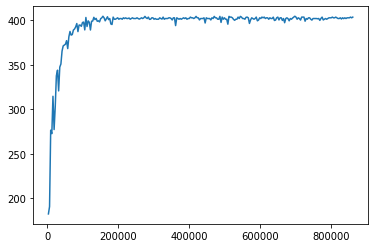

Train:404.432
Train:402.837
Train:401.243
Train:401.243
Train:402.56
Train:398.76
Train:402.837
Train:401.243
Train:402.837
Train:402.837
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000280/checkpoint-280


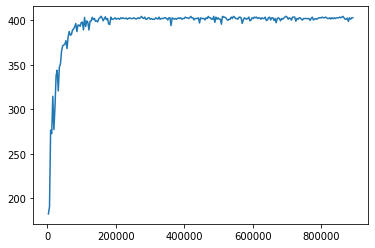

Train:395.829
Train:394.643
Train:396.926
Train:398.186
Train:401.185
Train:399.788
Train:401.697
Train:399.873
Train:403.01
Train:403.193
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000290/checkpoint-290


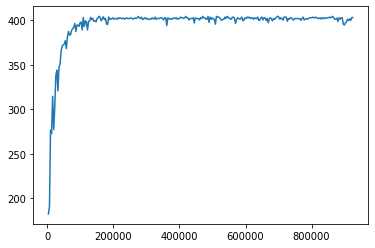

Train:403.986
Train:400.445
Train:403.253
Train:404.268
Train:403.312
Train:401.024
Train:403.312
Train:403.253
Train:402.563
Train:403.312
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000300/checkpoint-300


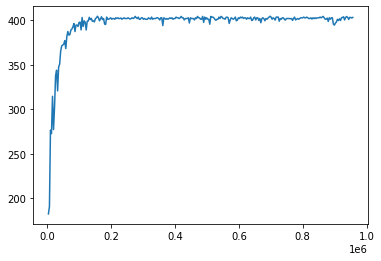

Train:401.141
Train:403.253
Train:404.268
Train:403.312
Train:403.25
Train:400.445
Train:402.356
Train:404.268
Train:402.356
Train:403.312
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000310/checkpoint-310


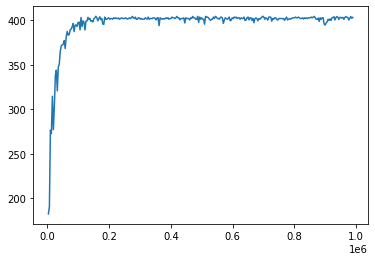

Train:402.356
Train:401.401
Train:404.268
Train:404.268
Train:403.312
Train:403.312
Train:402.356
Train:403.312
Train:401.401
Train:401.986
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-16-44lklh6fjl/checkpoint_000320/checkpoint-320


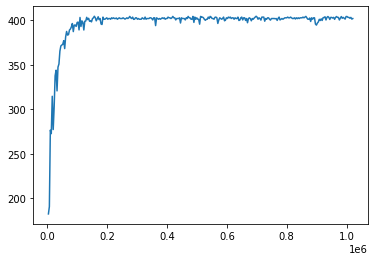

2021-10-20 01:50:30,253	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 01:50:31,410	WARNING worker.py:1115 -- WARNING: 24 PYTHON workers have been started on a node of the id: 70dff8eec69c6f81c26265695753f8c6a13f832731f57fee8c7ed606 and address: 192.168.1.128. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.
2021-10-20 01:51:22,564	INFO trainable.py:104 -- Trainable.setup took 51.881 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 01:51:22,568	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:408.888
Train:446.172
Train:465.954
Train:501.341
Train:469.275
Train:522.479
Train:552.07
Train:546.422
Train:572.109
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000010/checkpoint-10


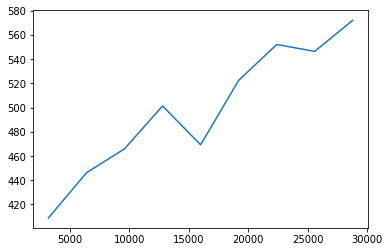

Train:562.307
Train:521.716
Train:581.843
Train:577.984
Train:590.741
Train:587.67
Train:579.447
Train:596.651
Train:594.783
Train:594.563
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000020/checkpoint-20


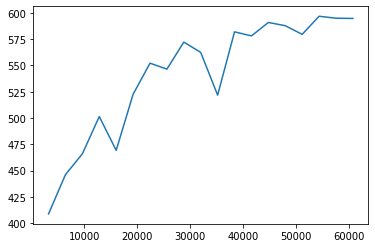

Train:598.003
Train:590.983
Train:588.803
Train:592.178
Train:590.212
Train:598.256
Train:599.353
Train:598.245
Train:603.217
Train:602.946
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000030/checkpoint-30


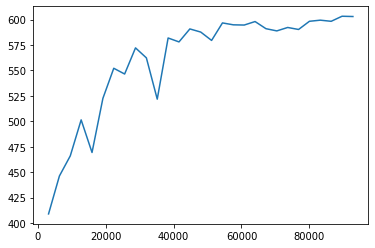

Train:596.048
Train:600.431
Train:599.341
Train:604.697
Train:603.647
Train:601.997
Train:602.471
Train:596.303
Train:603.569
Train:604.724
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000040/checkpoint-40


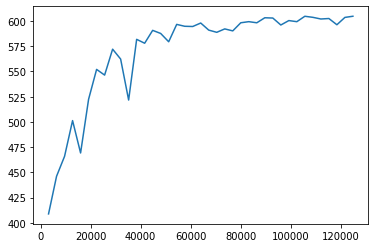

Train:601.015
Train:607.777
Train:599.064
Train:605.283
Train:604.191
Train:606.588
Train:604.094
Train:607.246
Train:604.788
Train:605.607
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000050/checkpoint-50


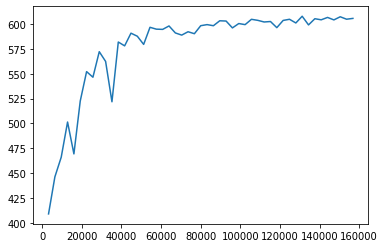

Train:605.891
Train:606.506
Train:608.188
Train:607.528
Train:607.922
Train:606.735
Train:605.714
Train:608.003
Train:608.428
Train:605.801
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000060/checkpoint-60


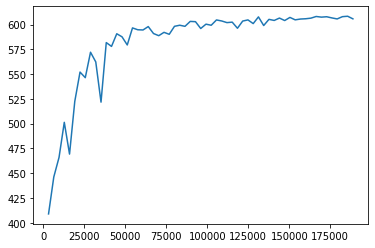

Train:603.194
Train:606.954
Train:607.082
Train:602.95
Train:607.189
Train:607.218
Train:608.022
Train:608.692
Train:608.615
Train:607.63
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000070/checkpoint-70


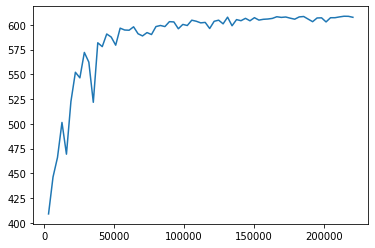

Train:608.692
Train:608.841
Train:609.138
Train:608.7
Train:607.944
Train:607.016
Train:608.841
Train:608.543
Train:609.125
Train:609.158
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000080/checkpoint-80


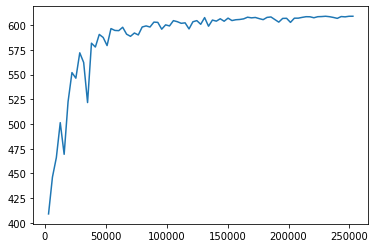

Train:608.543
Train:608.841
Train:608.39
Train:608.842
Train:608.698
Train:608.692
Train:608.841
Train:608.859
Train:608.692
Train:609.138
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000090/checkpoint-90


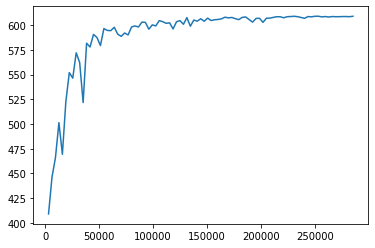

Train:608.841
Train:590.219
Train:609.274
Train:607.368
Train:609.472
Train:609.299
Train:609.306
Train:608.348
Train:609.324
Train:608.806
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000100/checkpoint-100


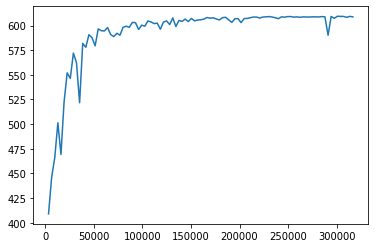

Train:609.343
Train:609.808
Train:607.892
Train:609.156
Train:609.014
Train:609.442
Train:609.274
Train:609.913
Train:609.163
Train:609.442
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000110/checkpoint-110


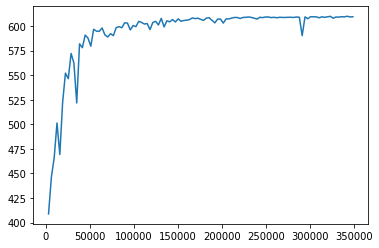

Train:609.442
Train:608.949
Train:609.442
Train:609.473
Train:601.375
Train:609.473
Train:609.776
Train:609.41
Train:609.306
Train:609.473
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000120/checkpoint-120


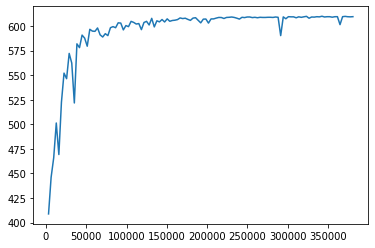

Train:609.609
Train:609.331
Train:605.715
Train:608.726
Train:609.442
Train:609.745
Train:609.641
Train:609.609
Train:609.976
Train:609.913
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000130/checkpoint-130


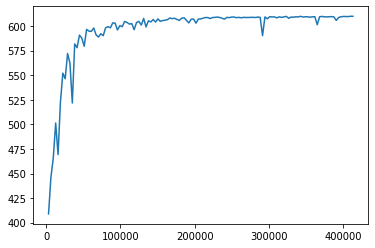

Train:608.775
Train:609.64
Train:609.641
Train:609.629
Train:609.111
Train:609.473
Train:609.745
Train:609.976
Train:609.64
Train:609.498
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000140/checkpoint-140


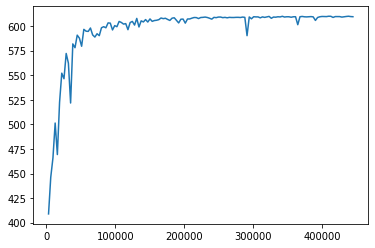

Train:609.307
Train:609.641
Train:609.975
Train:609.609
Train:608.744
Train:607.268
Train:609.641
Train:609.641
Train:609.777
Train:609.714
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000150/checkpoint-150


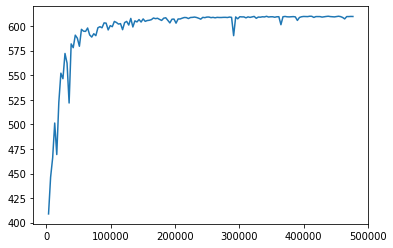

Train:609.808
Train:609.882
Train:609.975
Train:609.306
Train:607.938
Train:609.274
Train:609.881
Train:609.546
Train:608.49
Train:609.351
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000160/checkpoint-160


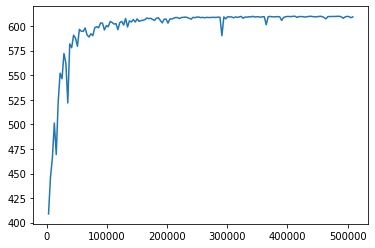

Train:609.473
Train:609.745
Train:609.776
Train:609.577
Train:609.578
Train:609.609
Train:609.913
Train:609.975
Train:609.473
Train:609.641
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000170/checkpoint-170


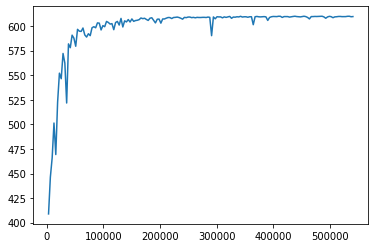

Train:609.745
Train:609.913
Train:609.944
Train:609.441
Train:609.546
Train:609.577
Train:609.943
Train:609.912
Train:609.943
Train:606.964
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000180/checkpoint-180


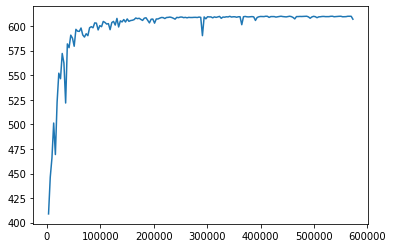

Train:609.911
Train:609.64
Train:609.677
Train:609.974
Train:609.671
Train:609.869
Train:608.989
Train:609.529
Train:609.64
Train:609.608
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000190/checkpoint-190


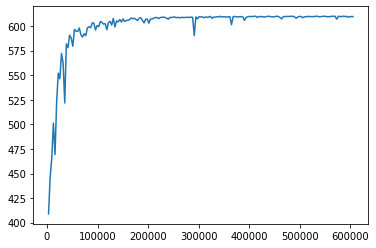

Train:609.713
Train:607.332
Train:609.41
Train:609.85
Train:609.514
Train:609.393
Train:609.633
Train:609.88
Train:609.216
Train:608.149
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000200/checkpoint-200


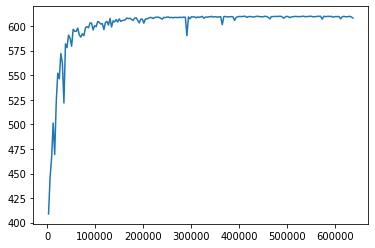

Train:609.911
Train:609.942
Train:609.64
Train:609.808
Train:609.911
Train:609.809
Train:609.808
Train:609.85
Train:609.819
Train:609.88
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000210/checkpoint-210


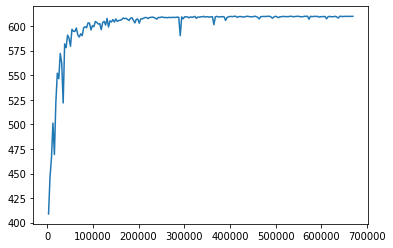

Train:609.942
Train:610.253
Train:609.85
Train:609.974
Train:609.724
Train:609.304
Train:609.693
Train:610.222
Train:609.777
Train:609.911
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000220/checkpoint-220


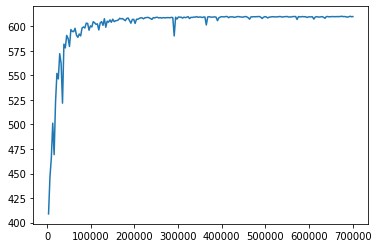

Train:610.253
Train:609.85
Train:609.88
Train:609.942
Train:609.974
Train:610.253
Train:609.943
Train:610.284
Train:609.88
Train:609.974
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000230/checkpoint-230


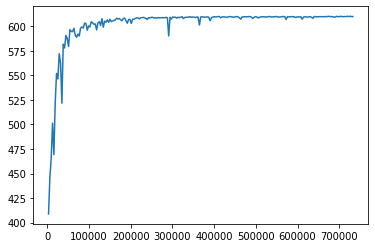

Train:610.065
Train:609.881
Train:605.956
Train:605.299
Train:609.911
Train:605.304
Train:610.18
Train:610.595
Train:609.913
Train:609.911
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000240/checkpoint-240


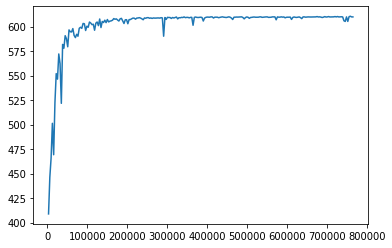

Train:609.925
Train:610.254
Train:610.254
Train:610.626
Train:607.885
Train:610.626
Train:610.315
Train:610.34
Train:610.285
Train:611.34
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000250/checkpoint-250


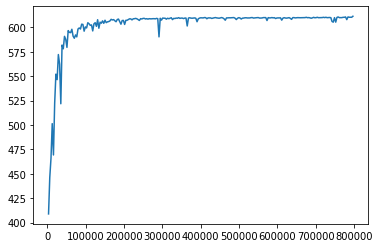

Train:610.315
Train:611.34
Train:610.657
Train:610.968
Train:611.34
Train:609.911
Train:611.681
Train:610.285
Train:610.998
Train:610.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000260/checkpoint-260


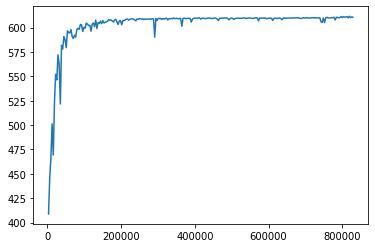

Train:610.657
Train:610.656
Train:610.316
Train:611.34
Train:610.999
Train:610.315
Train:610.657
Train:610.315
Train:610.657
Train:610.554
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000270/checkpoint-270


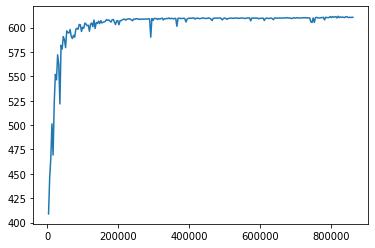

Train:610.999
Train:610.657
Train:610.999
Train:610.998
Train:610.657
Train:610.316
Train:610.998
Train:611.34
Train:610.999
Train:610.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000280/checkpoint-280


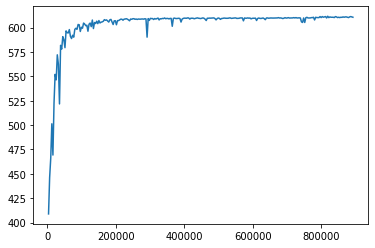

Train:611.34
Train:610.316
Train:610.999
Train:610.999
Train:611.34
Train:610.657
Train:610.657
Train:610.999
Train:610.316
Train:609.974
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000290/checkpoint-290


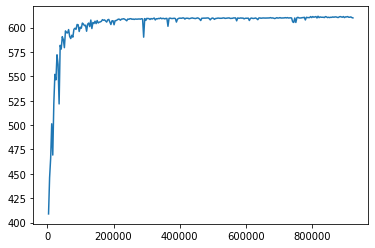

Train:611.009
Train:607.838
Train:611.35
Train:609.698
Train:610.658
Train:601.681
Train:611.34
Train:609.71
Train:610.657
Train:611.009
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000300/checkpoint-300


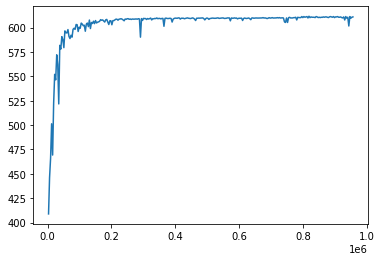

Train:611.34
Train:611.34
Train:610.316
Train:610.658
Train:611.34
Train:611.34
Train:610.999
Train:611.681
Train:610.667
Train:610.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000310/checkpoint-310


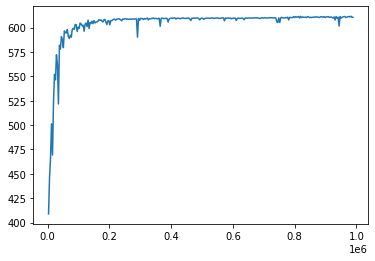

Train:611.34
Train:610.657
Train:610.658
Train:611.34
Train:611.34
Train:601.626
Train:610.317
Train:610.658
Train:610.943
Train:610.998
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_01-50-3018ezwmzr/checkpoint_000320/checkpoint-320


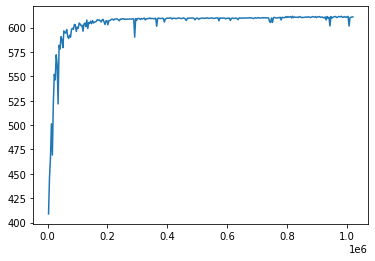

2021-10-20 02:24:19,310	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 02:25:11,809	INFO trainable.py:104 -- Trainable.setup took 52.067 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 02:25:11,812	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:437.349
Train:429.309
Train:499.759
Train:518.636
Train:536.937
Train:556.034
Train:588.898
Train:574.398
Train:623.232
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000010/checkpoint-10


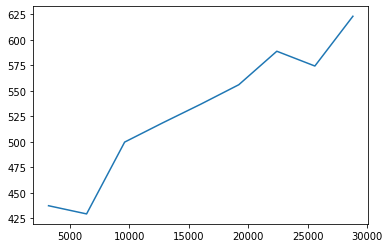

Train:626.101
Train:644.604
Train:650.937
Train:655.434
Train:644.948
Train:633.598
Train:681.623
Train:657.774
Train:661.831
Train:670.573
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000020/checkpoint-20


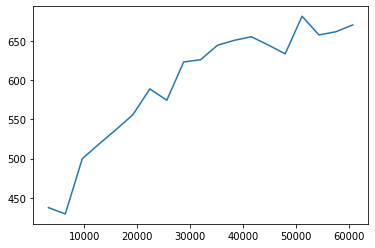

Train:653.988
Train:672.891
Train:678.086
Train:681.948
Train:688.688
Train:681.407
Train:684.13
Train:683.332
Train:681.9
Train:684.318
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000030/checkpoint-30


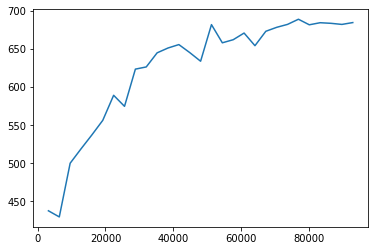

Train:686.66
Train:690.732
Train:683.272
Train:693.218
Train:687.452
Train:695.761
Train:693.111
Train:687.092
Train:687.643
Train:686.995
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000040/checkpoint-40


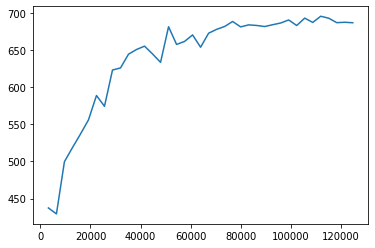

Train:693.584
Train:697.899
Train:696.757
Train:691.232
Train:695.824
Train:696.393
Train:693.263
Train:691.589
Train:699.345
Train:699.052
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000050/checkpoint-50


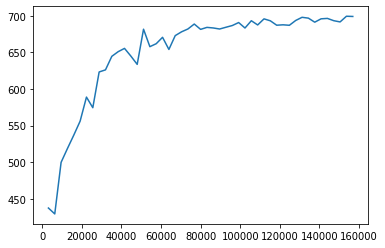

Train:699.516
Train:698.377
Train:694.001
Train:698.147
Train:698.508
Train:702.563
Train:700.972
Train:701.087
Train:690.885
Train:701.671
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000060/checkpoint-60


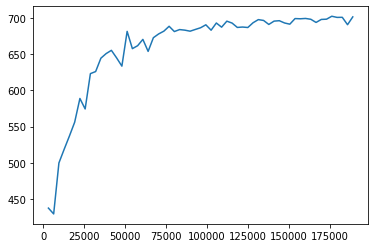

Train:699.028
Train:692.544
Train:697.56
Train:701.864
Train:701.741
Train:705.444
Train:703.593
Train:698.027
Train:697.12
Train:701.506
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000070/checkpoint-70


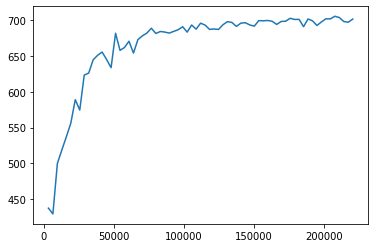

Train:701.403
Train:701.466
Train:699.763
Train:698.784
Train:698.502
Train:708.061
Train:703.348
Train:702.385
Train:703.516
Train:698.343
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000080/checkpoint-80


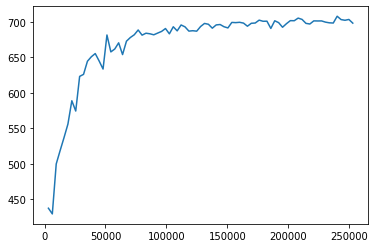

Train:700.135
Train:702.507
Train:701.542
Train:700.533
Train:705.844
Train:698.588
Train:702.347
Train:702.162
Train:706.378
Train:697.689
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000090/checkpoint-90


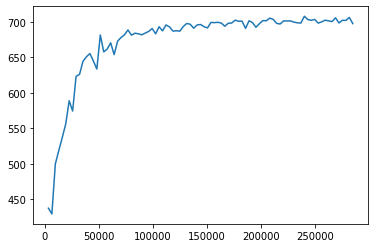

Train:702.507
Train:703.516
Train:699.068
Train:699.552
Train:701.682
Train:705.2
Train:705.478
Train:704.526
Train:697.16
Train:697.932
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000100/checkpoint-100


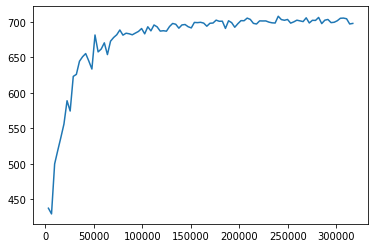

Train:702.982
Train:703.516
Train:705.536
Train:705.002
Train:701.506
Train:705.536
Train:703.516
Train:704.468
Train:702.507
Train:703.992
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000110/checkpoint-110


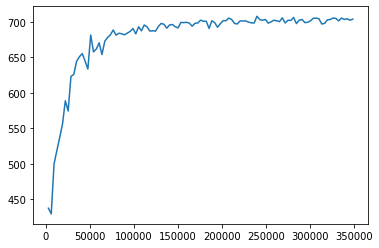

Train:705.954
Train:703.992
Train:707.44
Train:705.478
Train:702.923
Train:699.04
Train:702.982
Train:702.982
Train:708.45
Train:702.982
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000120/checkpoint-120


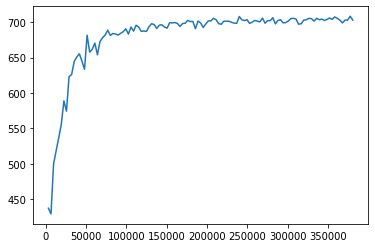

Train:705.002
Train:707.44
Train:705.954
Train:699.38
Train:704.468
Train:704.468
Train:700.138
Train:702.982
Train:705.954
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000130/checkpoint-130


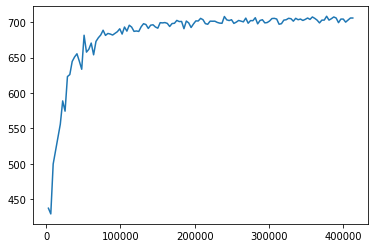

Train:702.982
Train:700.207
Train:705.954
Train:702.982
Train:707.44
Train:702.982
Train:700.319
Train:702.056
Train:702.982
Train:703.119
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000140/checkpoint-140


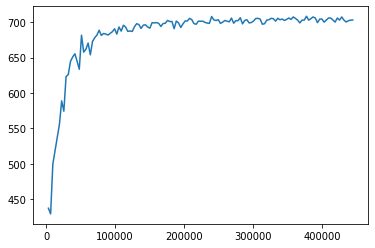

Train:705.954
Train:707.44
Train:705.954
Train:704.468
Train:707.44
Train:699.507
Train:700.234
Train:698.748
Train:701.249
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000150/checkpoint-150


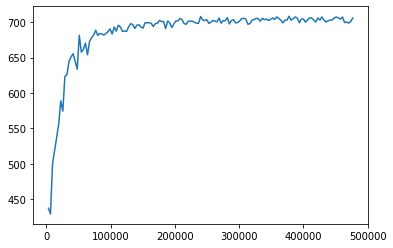

Train:706.514
Train:702.982
Train:705.954
Train:704.468
Train:704.468
Train:705.954
Train:704.468
Train:702.982
Train:704.468
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000160/checkpoint-160


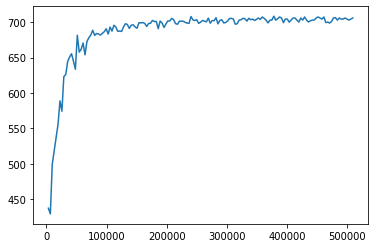

Train:706.514
Train:702.982
Train:708.926
Train:695.146
Train:704.468
Train:698.021
Train:699.507
Train:705.478
Train:694.472
Train:708.926
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000170/checkpoint-170


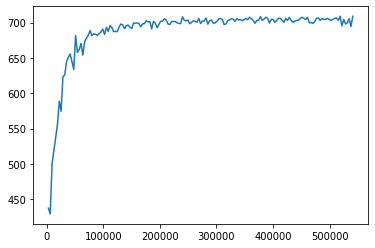

Train:704.468
Train:704.468
Train:700.865
Train:704.468
Train:705.954
Train:702.921
Train:700.22
Train:704.468
Train:704.468
Train:704.468
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000180/checkpoint-180


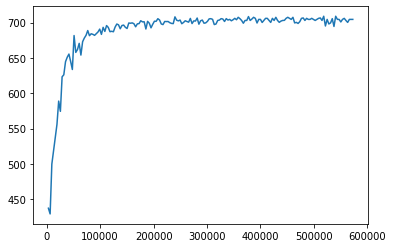

Train:705.954
Train:702.982
Train:702.982
Train:704.468
Train:704.468
Train:704.468
Train:704.468
Train:702.982
Train:704.468
Train:701.497
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000190/checkpoint-190


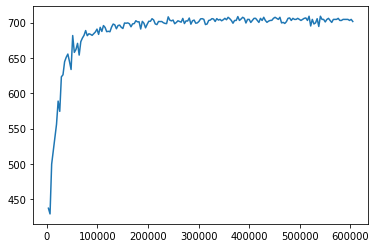

Train:686.723
Train:687.171
Train:692.359
Train:685.561
Train:699.208
Train:691.343
Train:693.55
Train:698.648
Train:701.257
Train:703.837
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000200/checkpoint-200


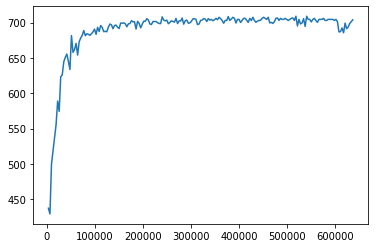

Train:705.954
Train:707.44
Train:704.468
Train:699.221
Train:705.028
Train:705.954
Train:704.468
Train:702.982
Train:696.798
Train:704.468
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000210/checkpoint-210


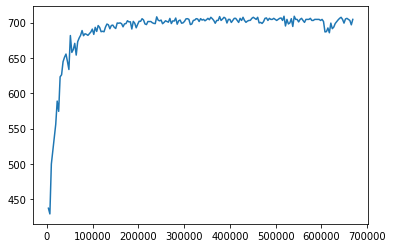

Train:705.954
Train:707.44
Train:707.44
Train:703.877
Train:702.982
Train:702.982
Train:702.982
Train:704.468
Train:702.982
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000220/checkpoint-220


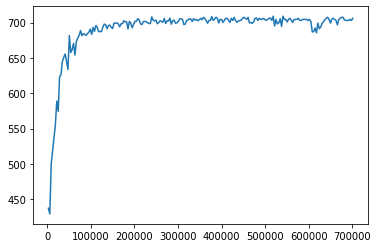

Train:705.954
Train:702.982
Train:704.468
Train:704.468
Train:702.982
Train:705.954
Train:702.982
Train:703.11
Train:702.982
Train:702.982
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000230/checkpoint-230


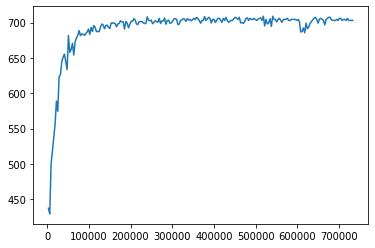

Train:705.954
Train:707.44
Train:708.926
Train:705.954
Train:704.468
Train:708.926
Train:704.468
Train:705.954
Train:704.468
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000240/checkpoint-240


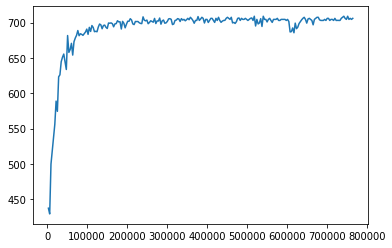

Train:705.954
Train:704.468
Train:702.351
Train:704.468
Train:704.468
Train:705.954
Train:705.954
Train:705.954
Train:705.954
Train:704.468
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000250/checkpoint-250


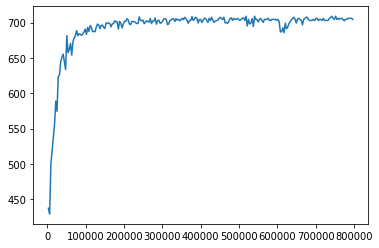

Train:707.44
Train:699.208
Train:700.706
Train:690.118
Train:701.425
Train:705.954
Train:702.982
Train:707.44
Train:706.514
Train:701.497
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000260/checkpoint-260


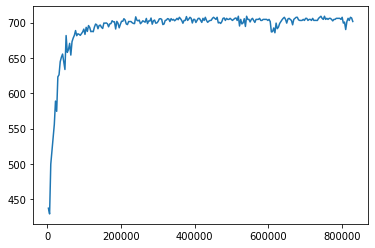

Train:704.468
Train:702.982
Train:705.954
Train:704.468
Train:707.44
Train:703.542
Train:704.468
Train:707.44
Train:708.926
Train:703.767
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000270/checkpoint-270


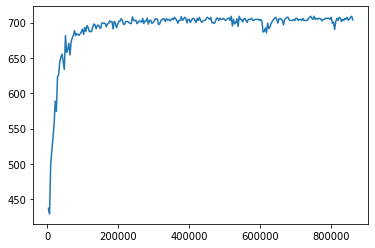

Train:704.468
Train:702.982
Train:706.514
Train:705.028
Train:702.982
Train:704.468
Train:704.468
Train:704.468
Train:699.763
Train:707.44
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000280/checkpoint-280


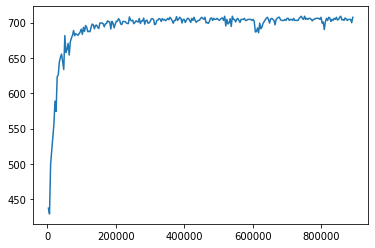

Train:702.41
Train:698.721
Train:704.468
Train:702.982
Train:704.468
Train:704.468
Train:702.982
Train:705.954
Train:692.476
Train:707.44
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000290/checkpoint-290


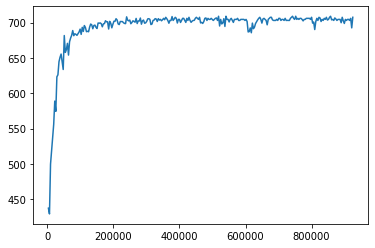

Train:704.468
Train:703.542
Train:705.954
Train:704.468
Train:705.954
Train:708.926
Train:707.44
Train:701.497
Train:705.954
Train:697.871
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000300/checkpoint-300


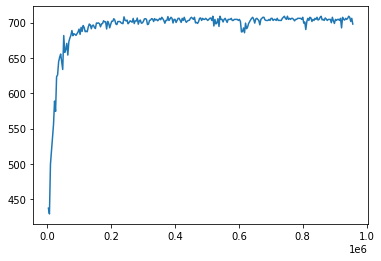

Train:694.327
Train:703.678
Train:695.826
Train:700.147
Train:704.935
Train:701.934
Train:707.44
Train:704.468
Train:708.926
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000310/checkpoint-310


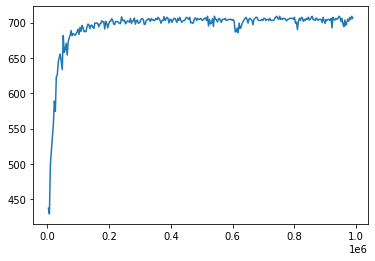

Train:702.982
Train:705.954
Train:702.982
Train:707.44
Train:701.624
Train:704.468
Train:704.468
Train:704.468
Train:704.468
Train:705.954
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-24-19gn9zktea/checkpoint_000320/checkpoint-320


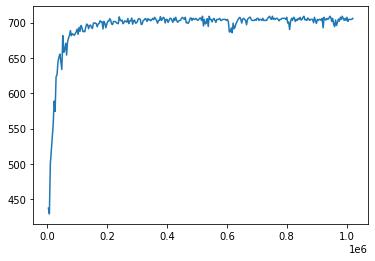

2021-10-20 02:58:06,906	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 02:58:59,377	INFO trainable.py:104 -- Trainable.setup took 52.024 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 02:58:59,382	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:477.289
Train:475.219
Train:550.888
Train:525.102
Train:625.785
Train:598.745
Train:623.333
Train:634.581
Train:666.222
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000010/checkpoint-10


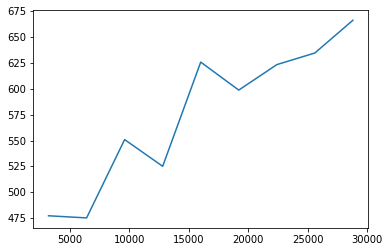

Train:642.081
Train:662.72
Train:668.189
Train:665.57
Train:668.753
Train:676.538
Train:675.127
Train:667.82
Train:674.724
Train:678.904
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000020/checkpoint-20


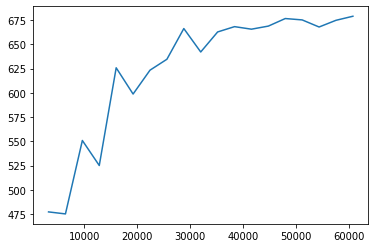

Train:670.785
Train:672.342
Train:684.727
Train:686.506
Train:684.856
Train:687.346
Train:679.404
Train:681.605
Train:675.8
Train:687.276
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000030/checkpoint-30


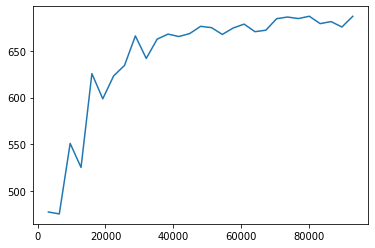

Train:684.913
Train:686.458
Train:689.486
Train:685.76
Train:684.401
Train:687.567
Train:689.486
Train:688.947
Train:689.486
Train:688.404
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000040/checkpoint-40


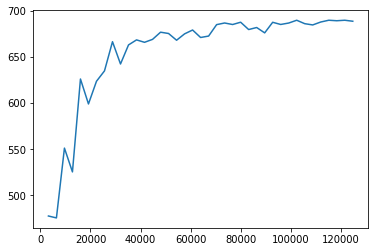

Train:688.404
Train:690.025
Train:690.564
Train:689.233
Train:688.947
Train:689.233
Train:688.408
Train:688.947
Train:690.058
Train:690.311
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000050/checkpoint-50


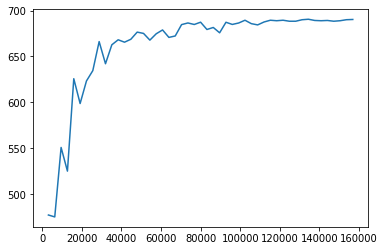

Train:690.85
Train:688.459
Train:690.85
Train:691.708
Train:690.597
Train:691.422
Train:691.136
Train:691.708
Train:691.422
Train:691.136
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000060/checkpoint-60


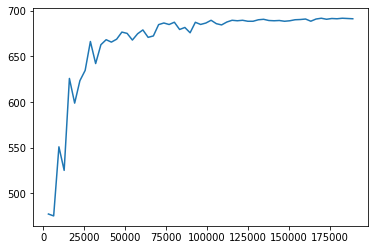

Train:691.708
Train:691.136
Train:691.136
Train:691.136
Train:690.85
Train:691.994
Train:691.994
Train:691.708
Train:690.564
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000070/checkpoint-70


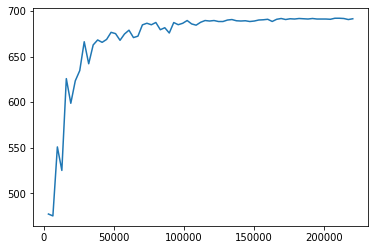

Train:691.422
Train:691.136
Train:691.422
Train:691.422
Train:691.422
Train:691.422
Train:691.136
Train:691.422
Train:686.096
Train:690.85
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000080/checkpoint-80


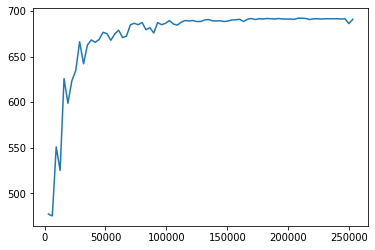

Train:691.422
Train:691.422
Train:691.422
Train:688.848
Train:691.422
Train:690.591
Train:691.136
Train:690.305
Train:691.422
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000090/checkpoint-90


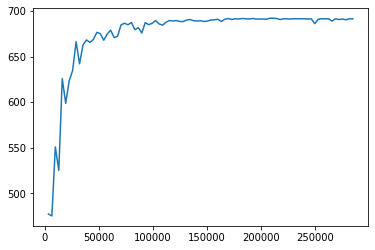

Train:691.708
Train:685.522
Train:691.136
Train:690.85
Train:691.422
Train:691.994
Train:691.136
Train:691.708
Train:691.136
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000100/checkpoint-100


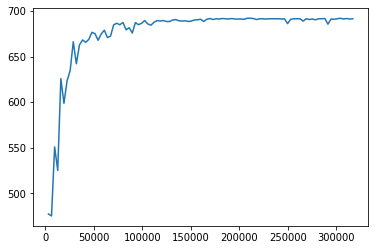

Train:691.136
Train:691.136
Train:691.708
Train:688.9
Train:690.85
Train:691.136
Train:691.708
Train:690.85
Train:691.136
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000110/checkpoint-110


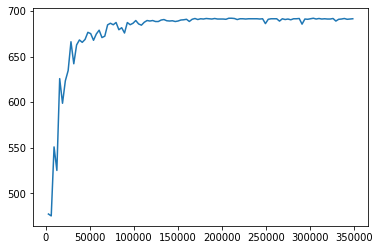

Train:685.81
Train:691.708
Train:691.708
Train:691.136
Train:691.136
Train:691.136
Train:691.708
Train:691.136
Train:689.49
Train:689.784
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000120/checkpoint-120


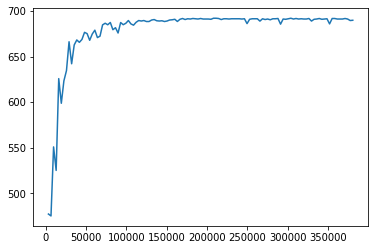

Train:691.422
Train:691.994
Train:691.422
Train:689.553
Train:691.136
Train:691.422
Train:691.708
Train:691.136
Train:690.85
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000130/checkpoint-130


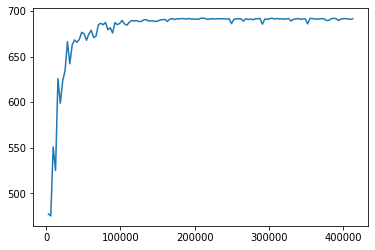

Train:691.136
Train:691.422
Train:691.136
Train:690.564
Train:691.422
Train:691.708
Train:690.85
Train:690.85
Train:691.422
Train:677.768
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000140/checkpoint-140


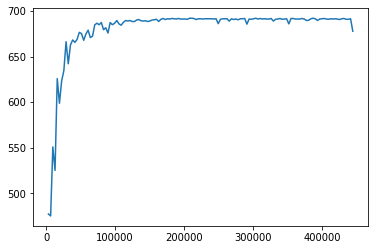

Train:691.136
Train:691.136
Train:690.85
Train:691.422
Train:691.422
Train:691.136
Train:691.994
Train:691.994
Train:691.422
Train:691.136
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000150/checkpoint-150


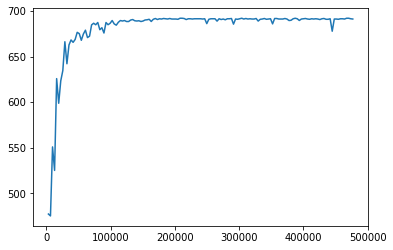

Train:691.136
Train:691.422
Train:691.422
Train:691.422
Train:687.083
Train:691.422
Train:691.422
Train:689.498
Train:691.708
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000160/checkpoint-160


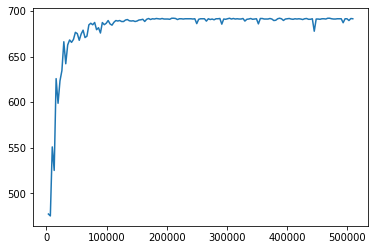

Train:688.477
Train:691.422
Train:691.136
Train:691.708
Train:691.708
Train:691.136
Train:691.708
Train:691.708
Train:690.564
Train:690.85
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000170/checkpoint-170


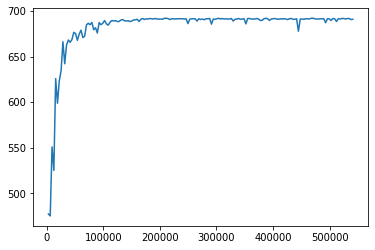

Train:691.708
Train:691.422
Train:691.136
Train:691.136
Train:690.85
Train:691.422
Train:691.136
Train:691.422
Train:691.136
Train:691.708
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000180/checkpoint-180


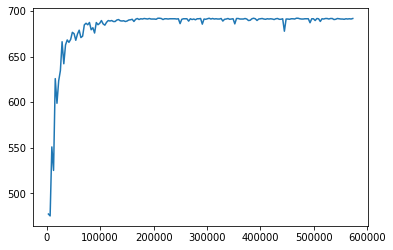

Train:690.85
Train:690.85
Train:690.85
Train:691.708
Train:691.708
Train:690.85
Train:691.136
Train:691.136
Train:691.422
Train:691.136
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000190/checkpoint-190


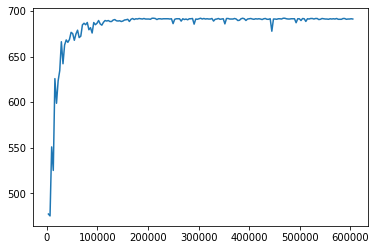

Train:691.422
Train:689.776
Train:681.972
Train:683.856
Train:688.328
Train:679.478
Train:684.291
Train:686.664
Train:684.142
Train:690.564
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000200/checkpoint-200


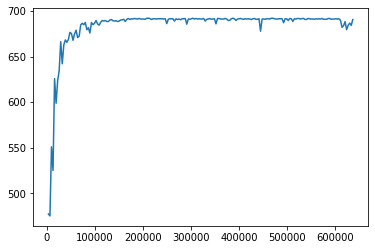

Train:691.136
Train:691.422
Train:690.564
Train:691.422
Train:691.708
Train:691.223
Train:691.136
Train:686.136
Train:691.107
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000210/checkpoint-210


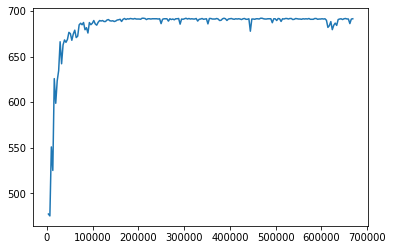

Train:691.422
Train:689.568
Train:691.422
Train:686.467
Train:691.136
Train:687.962
Train:685.877
Train:691.136
Train:691.708
Train:691.708
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000220/checkpoint-220


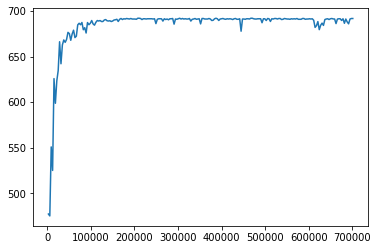

Train:690.85
Train:691.422
Train:691.422
Train:691.136
Train:691.136
Train:691.136
Train:691.422
Train:690.564
Train:691.136
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000230/checkpoint-230


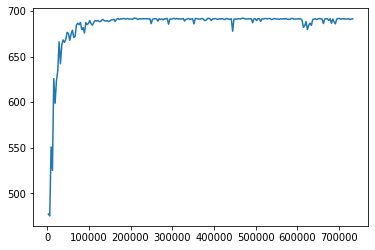

Train:687.737
Train:691.422
Train:691.422
Train:690.85
Train:680.564
Train:691.422
Train:690.85
Train:691.422
Train:691.136
Train:691.994
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000240/checkpoint-240


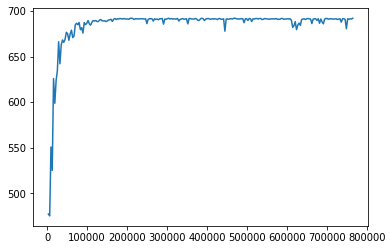

Train:690.85
Train:691.136
Train:691.136
Train:691.136
Train:691.422
Train:691.136
Train:690.193
Train:691.136
Train:691.136
Train:690.85
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000250/checkpoint-250


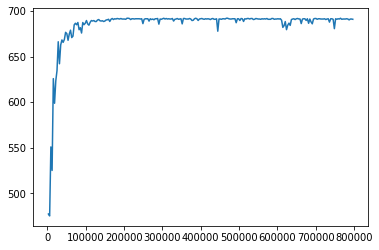

Train:689.924
Train:691.994
Train:691.422
Train:691.136
Train:685.808
Train:691.708
Train:691.136
Train:689.784
Train:691.136
Train:691.708
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000260/checkpoint-260


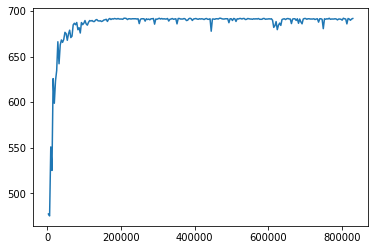

Train:691.005
Train:690.85
Train:691.708
Train:690.217
Train:688.13
Train:691.708
Train:691.422
Train:691.422
Train:691.136
Train:689.496
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000270/checkpoint-270


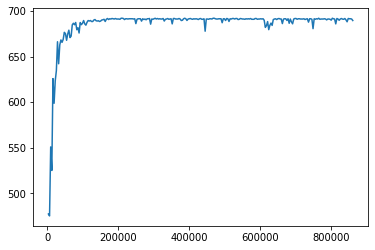

Train:691.422
Train:691.422
Train:691.422
Train:691.708
Train:691.708
Train:691.136
Train:690.85
Train:690.85
Train:691.136
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000280/checkpoint-280


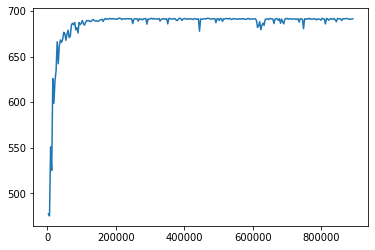

Train:689.733
Train:689.549
Train:691.422
Train:690.85
Train:690.564
Train:691.136
Train:691.422
Train:690.564
Train:691.136
Train:691.422
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000290/checkpoint-290


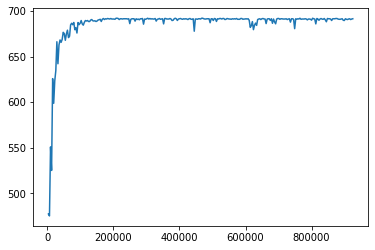

Train:691.136
Train:691.708
Train:691.708
Train:691.136
Train:690.85
Train:691.136
Train:691.136
Train:690.85
Train:691.422
Train:690.85
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000300/checkpoint-300


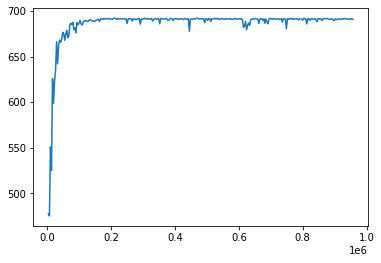

Train:691.708
Train:690.85
Train:691.422
Train:691.136
Train:691.422
Train:691.136
Train:690.85
Train:690.85
Train:691.136
Train:691.136
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000310/checkpoint-310


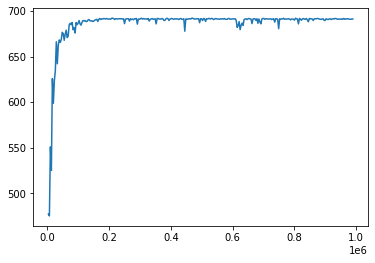

Train:691.136
Train:691.136
Train:688.507
Train:691.136
Train:691.422
Train:691.136
Train:691.136
Train:691.708
Train:691.136
Train:691.708
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_02-58-07ol_db8me/checkpoint_000320/checkpoint-320


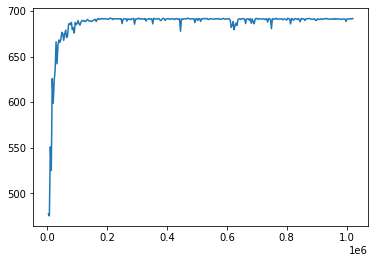

2021-10-20 03:31:57,064	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 03:32:49,298	INFO trainable.py:104 -- Trainable.setup took 51.800 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 03:32:49,303	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:360.957
Train:389.743
Train:464.122
Train:467.933
Train:495.643
Train:504.676
Train:488.017
Train:559.1
Train:567.206
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000010/checkpoint-10


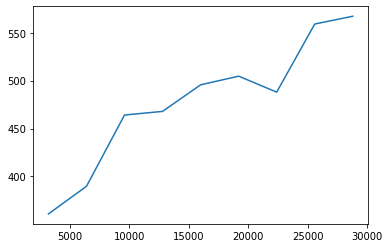

Train:565.856
Train:565.435
Train:571.552
Train:579.111
Train:567.446
Train:573.48
Train:585.578
Train:575.41
Train:581.088
Train:581.205
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000020/checkpoint-20


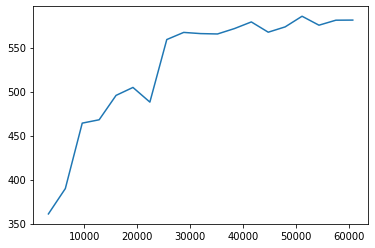

Train:582.13
Train:580.217
Train:576.866
Train:583.359
Train:582.377
Train:589.775
Train:584.464
Train:586.18
Train:587.307
Train:590.415
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000030/checkpoint-30


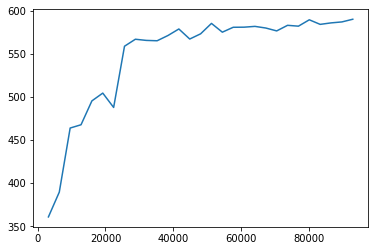

Train:587.807
Train:591.457
Train:584.318
Train:592.27
Train:587.855
Train:596.76
Train:587.559
Train:584.287
Train:594.697
Train:591.637
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000040/checkpoint-40


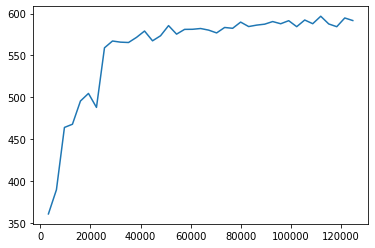

Train:595.007
Train:590.433
Train:592.289
Train:591.182
Train:596.342
Train:594.924
Train:595.387
Train:592.18
Train:594.054
Train:598.31
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000050/checkpoint-50


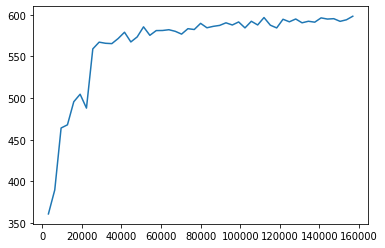

Train:592.526
Train:597.755
Train:593.747
Train:594.345
Train:594.761
Train:590.06
Train:592.635
Train:595.487
Train:589.028
Train:592.714
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000060/checkpoint-60


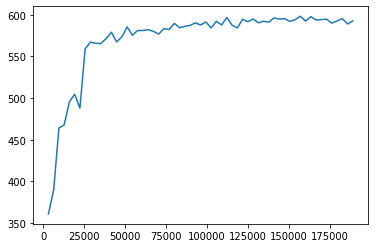

Train:596.768
Train:593.754
Train:590.889
Train:596.674
Train:599.063
Train:599.119
Train:590.721
Train:597.76
Train:597.514
Train:599.062
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000070/checkpoint-70


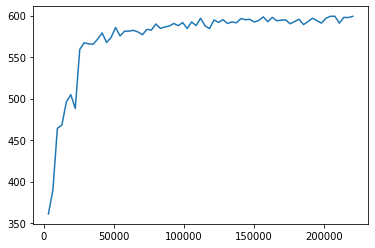

Train:590.058
Train:596.013
Train:592.502
Train:600.611
Train:599.12
Train:599.062
Train:596.021
Train:593.83
Train:599.062
Train:595.964
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000080/checkpoint-80


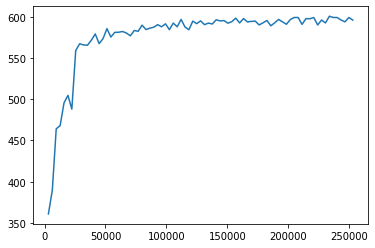

Train:597.514
Train:595.957
Train:599.063
Train:596.822
Train:594.407
Train:595.9
Train:595.679
Train:591.608
Train:595.26
Train:594.401
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000090/checkpoint-90


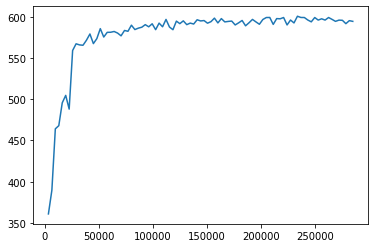

Train:591.83
Train:597.512
Train:593.732
Train:577.538
Train:594.079
Train:589.124
Train:597.513
Train:596.022
Train:597.618
Train:597.506
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000100/checkpoint-100


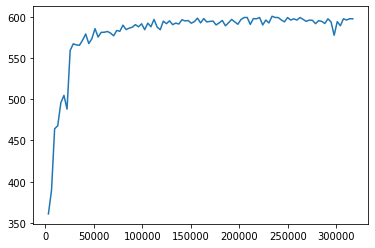

Train:595.95
Train:597.513
Train:592.872
Train:591.399
Train:596.021
Train:592.071
Train:594.632
Train:597.674
Train:596.162
Train:599.062
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000110/checkpoint-110


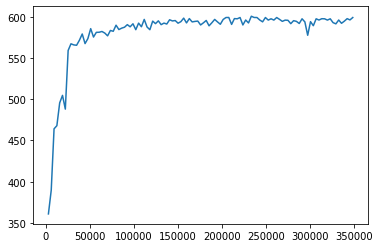

Train:599.12
Train:599.062
Train:596.013
Train:597.625
Train:594.315
Train:599.062
Train:594.414
Train:597.512
Train:595.851
Train:594.463
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000120/checkpoint-120


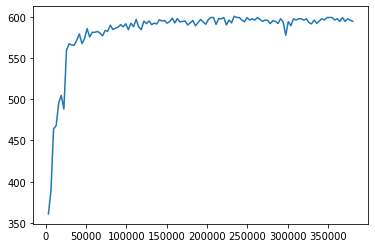

Train:597.674
Train:597.625
Train:597.57
Train:595.963
Train:597.562
Train:594.471
Train:592.97
Train:600.611
Train:596.069
Train:594.471
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000130/checkpoint-130


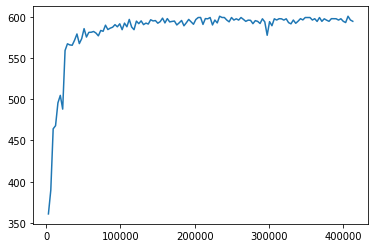

Train:589.153
Train:591.569
Train:588.565
Train:599.062
Train:597.562
Train:592.407
Train:592.564
Train:593.665
Train:594.415
Train:596.277
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000140/checkpoint-140


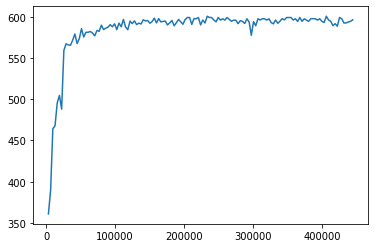

Train:597.625
Train:596.019
Train:594.526
Train:597.562
Train:597.506
Train:595.963
Train:597.513
Train:597.512
Train:595.393
Train:597.569
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000150/checkpoint-150


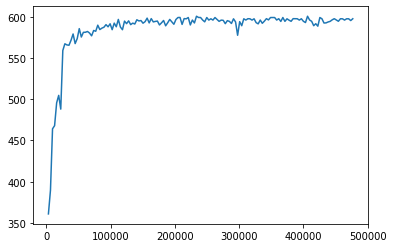

Train:596.943
Train:595.963
Train:597.512
Train:594.414
Train:594.463
Train:597.512
Train:591.036
Train:595.963
Train:599.062
Train:597.512
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000160/checkpoint-160


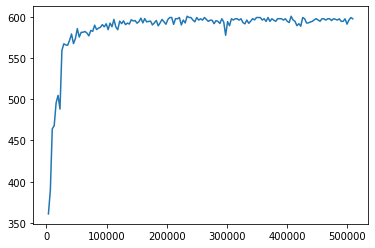

Train:599.062
Train:595.963
Train:599.062
Train:595.95
Train:595.268
Train:594.415
Train:595.963
Train:599.062
Train:594.47
Train:597.513
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000170/checkpoint-170


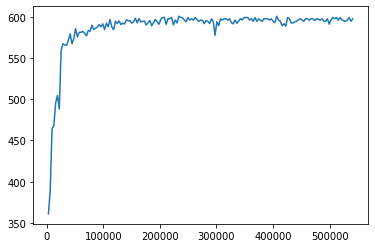

Train:597.513
Train:594.407
Train:594.401
Train:592.922
Train:597.506
Train:597.512
Train:597.512
Train:594.471
Train:596.014
Train:595.963
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000180/checkpoint-180


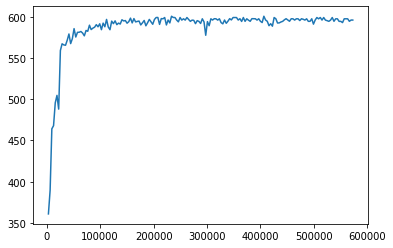

Train:596.013
Train:597.499
Train:594.636
Train:596.075
Train:596.118
Train:597.506
Train:597.569
Train:594.414
Train:597.512
Train:594.185
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000190/checkpoint-190


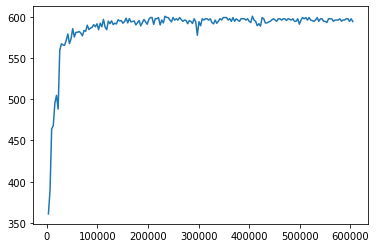

Train:596.019
Train:594.47
Train:591.608
Train:592.864
Train:599.12
Train:596.019
Train:597.512
Train:595.963
Train:599.055
Train:599.062
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000200/checkpoint-200


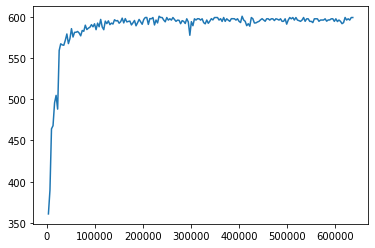

Train:599.062
Train:591.26
Train:599.062
Train:597.569
Train:599.118
Train:597.625
Train:594.513
Train:596.006
Train:600.611
Train:592.979
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000210/checkpoint-210


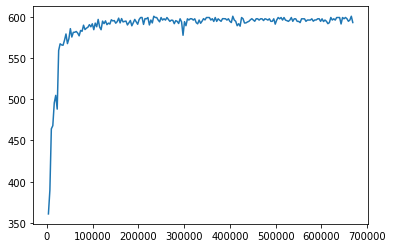

Train:594.569
Train:597.618
Train:597.512
Train:597.562
Train:597.513
Train:595.963
Train:596.07
Train:595.963
Train:599.111
Train:597.569
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000220/checkpoint-220


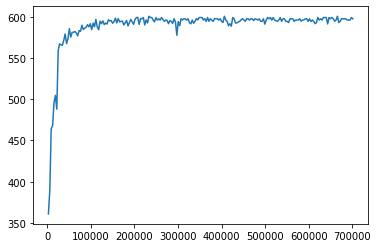

Train:596.013
Train:599.118
Train:597.571
Train:594.529
Train:597.507
Train:596.022
Train:597.512
Train:597.679
Train:597.626
Train:599.118
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000230/checkpoint-230


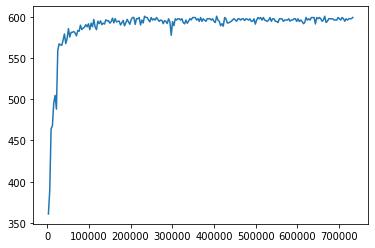

Train:594.527
Train:599.062
Train:596.013
Train:597.512
Train:597.562
Train:597.513
Train:597.625
Train:597.625
Train:594.632
Train:596.235
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000240/checkpoint-240


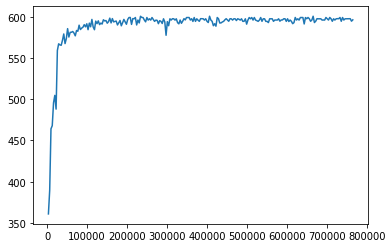

Train:594.35
Train:597.569
Train:599.111
Train:594.563
Train:594.638
Train:594.638
Train:596.063
Train:600.611
Train:593.145
Train:596.387
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000250/checkpoint-250


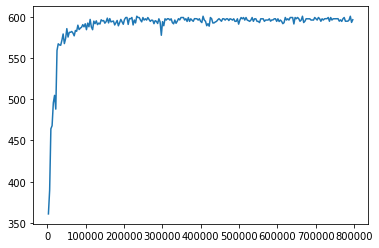

Train:596.075
Train:597.625
Train:596.125
Train:596.019
Train:596.132
Train:597.625
Train:599.118
Train:596.132
Train:596.132
Train:599.062
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000260/checkpoint-260


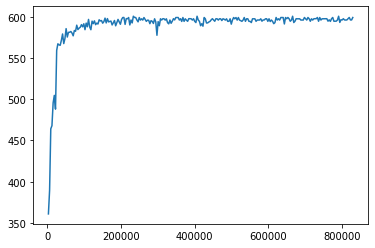

Train:596.132
Train:593.058
Train:596.132
Train:597.625
Train:594.52
Train:597.625
Train:594.569
Train:596.075
Train:595.957
Train:597.562
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000270/checkpoint-270


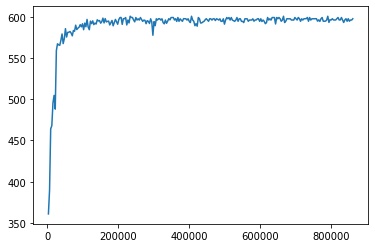

Train:597.625
Train:596.02
Train:596.126
Train:596.062
Train:596.118
Train:597.625
Train:597.625
Train:594.582
Train:597.569
Train:596.132
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000280/checkpoint-280


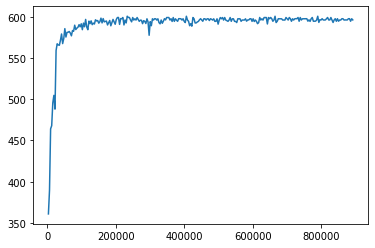

Train:599.118
Train:597.569
Train:596.125
Train:596.075
Train:588.678
Train:596.075
Train:596.132
Train:597.625
Train:596.125
Train:596.132
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000290/checkpoint-290


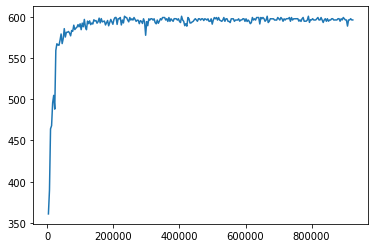

Train:594.582
Train:594.638
Train:594.564
Train:594.638
Train:597.625
Train:599.062
Train:596.132
Train:596.132
Train:597.625
Train:599.118
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000300/checkpoint-300


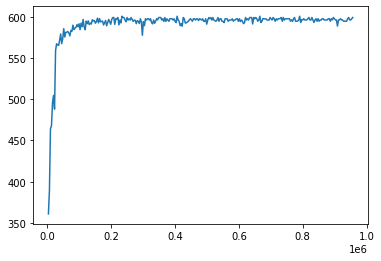

Train:591.515
Train:597.625
Train:593.021
Train:593.002
Train:596.132
Train:596.438
Train:599.118
Train:597.569
Train:597.625
Train:578.665
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000310/checkpoint-310


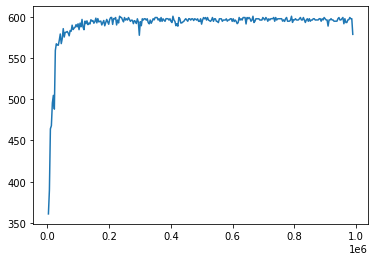

Train:597.625
Train:587.876
Train:599.812
Train:595.792
Train:597.343
Train:593.089
Train:597.625
Train:597.625
Train:596.211
Train:597.625
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_03-31-57pf5n2bvi/checkpoint_000320/checkpoint-320


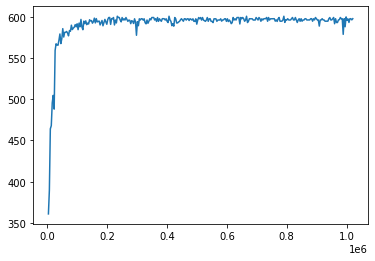

2021-10-20 04:05:46,073	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 04:06:39,330	INFO trainable.py:104 -- Trainable.setup took 52.814 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 04:06:39,334	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:435.522
Train:528.688
Train:568.686
Train:627.106
Train:659.708
Train:627.586
Train:673.295
Train:694.202
Train:697.806
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000010/checkpoint-10


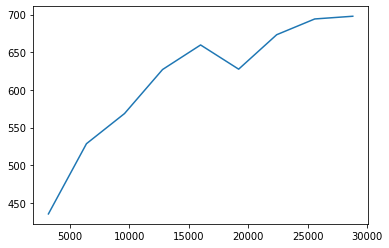

Train:655.976
Train:715.027
Train:712.146
Train:715.99
Train:727.491
Train:702.593
Train:730.327
Train:727.809
Train:717.004
Train:712.759
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000020/checkpoint-20


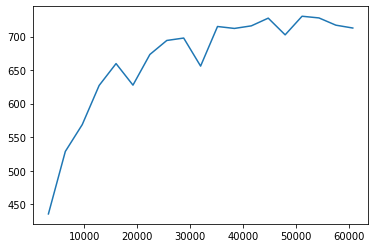

Train:730.627
Train:723.856
Train:733.244
Train:732.657
Train:733.577
Train:728.048
Train:735.953
Train:739.227
Train:736.027
Train:736.399
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000030/checkpoint-30


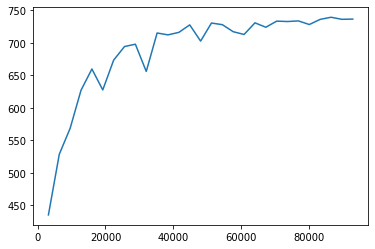

Train:741.989
Train:743.4
Train:740.017
Train:734.376
Train:740.336
Train:738.157
Train:743.582
Train:737.631
Train:744.936
Train:742.979
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000040/checkpoint-40


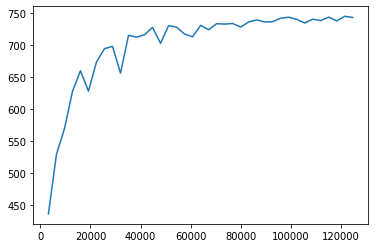

Train:749.112
Train:742.533
Train:747.89
Train:740.656
Train:749.289
Train:741.644
Train:748.19
Train:751.977
Train:750.945
Train:746.718
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000050/checkpoint-50


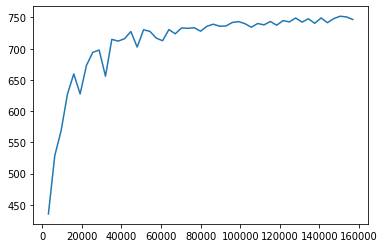

Train:750.559
Train:743.871
Train:746.126
Train:748.039
Train:747.522
Train:749.874
Train:748.734
Train:749.243
Train:745.579
Train:750.938
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000060/checkpoint-60


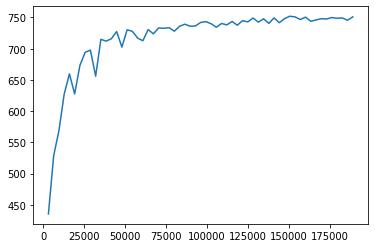

Train:746.122
Train:752.341
Train:752.345
Train:752.371
Train:752.319
Train:752.345
Train:752.323
Train:749.243
Train:751.911
Train:752.297
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000070/checkpoint-70


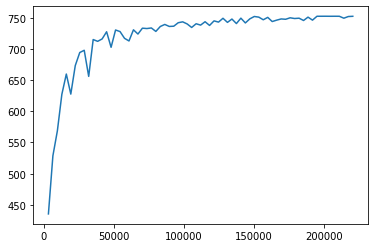

Train:752.319
Train:752.319
Train:752.319
Train:752.319
Train:752.319
Train:752.319
Train:752.367
Train:752.297
Train:752.275
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000080/checkpoint-80


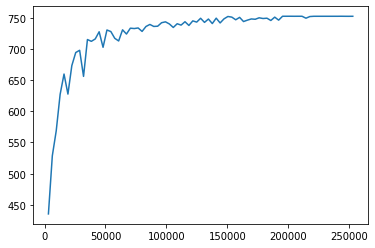

Train:752.297
Train:752.319
Train:752.319
Train:752.297
Train:752.345
Train:750.228
Train:751.782
Train:752.341
Train:750.462
Train:752.367
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000090/checkpoint-90


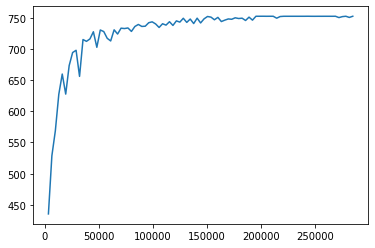

Train:752.345
Train:752.319
Train:752.345
Train:752.349
Train:749.774
Train:752.323
Train:749.21
Train:752.345
Train:752.164
Train:752.297
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000100/checkpoint-100


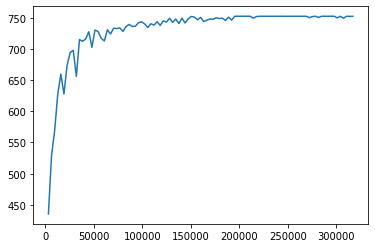

Train:752.349
Train:752.345
Train:752.355
Train:749.043
Train:752.275
Train:752.319
Train:752.319
Train:743.937
Train:752.301
Train:752.301
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000110/checkpoint-110


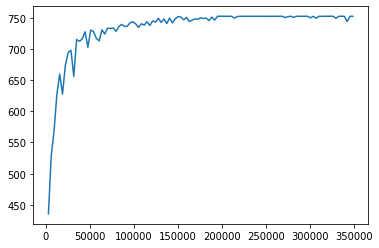

Train:752.301
Train:752.319
Train:752.323
Train:750.945
Train:752.319
Train:748.96
Train:752.275
Train:752.345
Train:752.319
Train:752.323
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000120/checkpoint-120


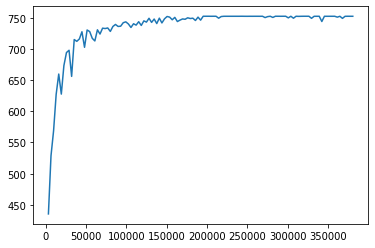

Train:752.275
Train:752.371
Train:752.319
Train:752.319
Train:752.275
Train:752.297
Train:752.319
Train:750.678
Train:752.345
Train:752.327
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000130/checkpoint-130


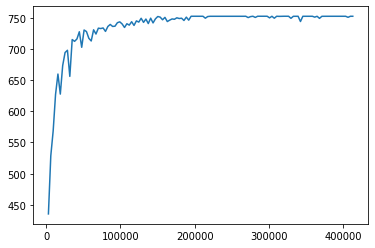

Train:752.304
Train:752.319
Train:752.319
Train:749.105
Train:752.319
Train:752.319
Train:752.297
Train:752.297
Train:752.297
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000140/checkpoint-140


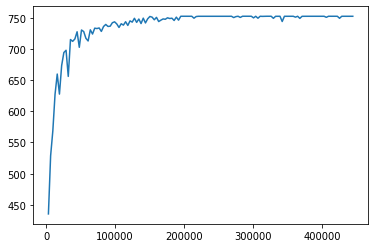

Train:752.341
Train:752.319
Train:752.341
Train:752.363
Train:752.297
Train:752.253
Train:752.297
Train:752.319
Train:752.297
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000150/checkpoint-150


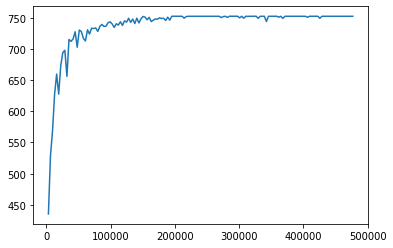

Train:752.319
Train:752.275
Train:752.297
Train:752.297
Train:746.504
Train:752.319
Train:744.25
Train:752.363
Train:752.341
Train:752.345
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000160/checkpoint-160


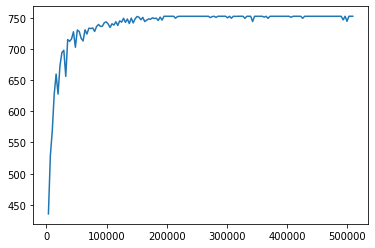

Train:752.319
Train:752.297
Train:752.297
Train:752.33
Train:752.297
Train:752.297
Train:752.341
Train:752.319
Train:752.297
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000170/checkpoint-170


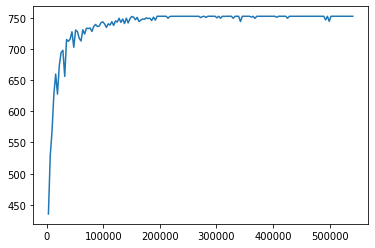

Train:752.297
Train:752.319
Train:752.341
Train:752.319
Train:752.297
Train:752.341
Train:750.309
Train:749.22
Train:752.319
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000180/checkpoint-180


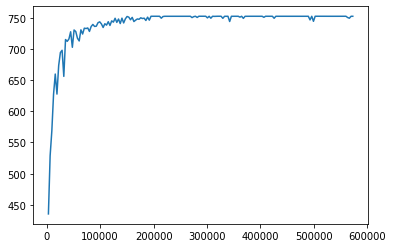

Train:752.275
Train:752.297
Train:752.319
Train:752.119
Train:752.345
Train:752.297
Train:752.363
Train:750.774
Train:752.327
Train:752.345
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000190/checkpoint-190


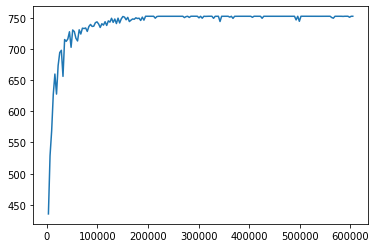

Train:752.319
Train:752.319
Train:752.297
Train:752.319
Train:752.297
Train:752.319
Train:752.341
Train:752.253
Train:752.319
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000200/checkpoint-200


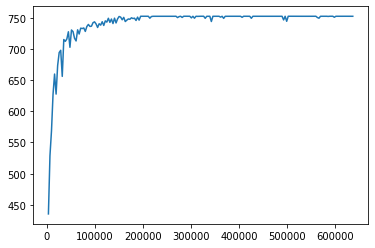

Train:752.374
Train:752.297
Train:752.275
Train:752.352
Train:752.345
Train:752.323
Train:748.982
Train:752.323
Train:752.275
Train:746.304
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000210/checkpoint-210


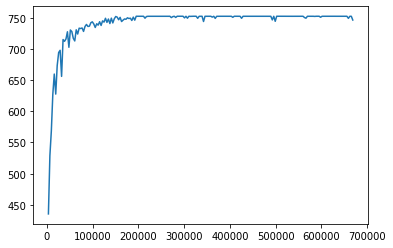

Train:752.275
Train:752.363
Train:752.301
Train:749.394
Train:749.775
Train:752.371
Train:752.349
Train:752.301
Train:752.345
Train:752.275
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000220/checkpoint-220


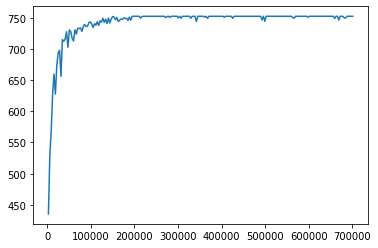

Train:752.323
Train:752.345
Train:752.319
Train:752.363
Train:752.327
Train:752.341
Train:752.297
Train:752.356
Train:752.297
Train:752.349
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000230/checkpoint-230


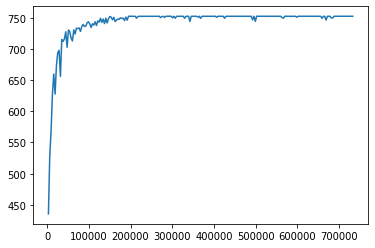

Train:752.319
Train:752.327
Train:752.345
Train:752.367
Train:752.301
Train:752.345
Train:752.323
Train:752.345
Train:750.938
Train:752.323
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000240/checkpoint-240


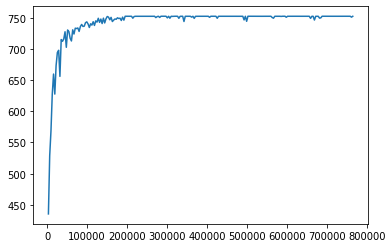

Train:752.319
Train:752.279
Train:752.297
Train:752.297
Train:752.275
Train:752.323
Train:752.323
Train:752.341
Train:752.319
Train:752.349
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000250/checkpoint-250


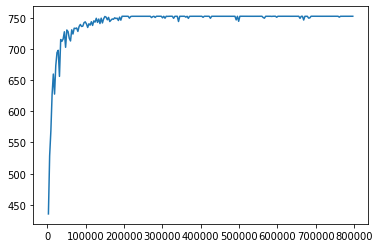

Train:752.323
Train:752.301
Train:752.341
Train:752.275
Train:752.297
Train:752.297
Train:752.341
Train:752.297
Train:752.297
Train:745.19
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000260/checkpoint-260


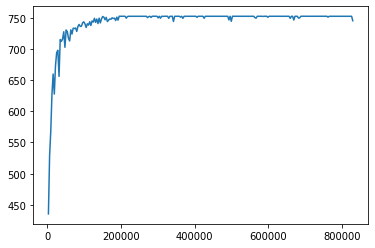

Train:752.341
Train:752.275
Train:752.319
Train:746.401
Train:751.166
Train:750.61
Train:752.349
Train:752.319
Train:752.345
Train:752.345
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000270/checkpoint-270


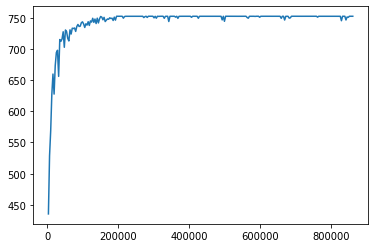

Train:752.374
Train:750.908
Train:752.345
Train:752.345
Train:752.323
Train:752.319
Train:752.341
Train:752.323
Train:752.345
Train:752.349
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000280/checkpoint-280


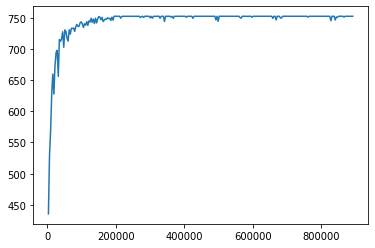

Train:752.319
Train:752.341
Train:752.323
Train:752.297
Train:752.297
Train:752.363
Train:752.319
Train:752.367
Train:752.275
Train:752.341
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000290/checkpoint-290


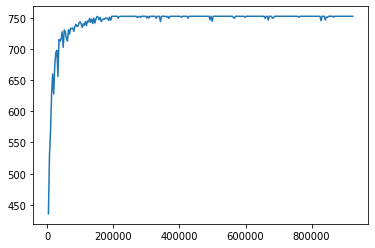

Train:752.341
Train:752.297
Train:752.297
Train:752.297
Train:752.319
Train:752.275
Train:752.345
Train:752.319
Train:752.323
Train:752.323
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000300/checkpoint-300


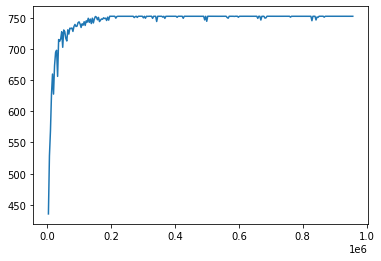

Train:752.297
Train:752.374
Train:752.319
Train:752.253
Train:752.341
Train:752.319
Train:752.275
Train:748.451
Train:752.363
Train:752.319
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000310/checkpoint-310


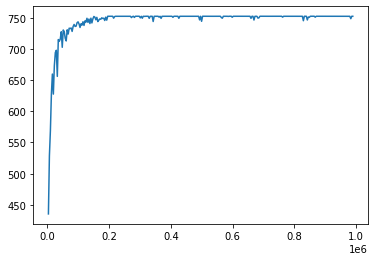

Train:752.323
Train:752.345
Train:752.275
Train:752.297
Train:752.319
Train:752.345
Train:748.259
Train:752.253
Train:752.341
Train:752.345
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-05-46302hr4uc/checkpoint_000320/checkpoint-320


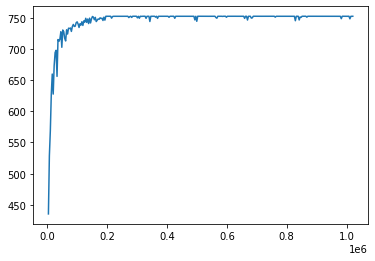

2021-10-20 04:39:35,855	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 04:40:27,599	INFO trainable.py:104 -- Trainable.setup took 51.297 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 04:40:27,602	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:256.432
Train:284.277
Train:335.722
Train:333.124
Train:337.787
Train:341.862
Train:378.615
Train:392.64
Train:370.174
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000010/checkpoint-10


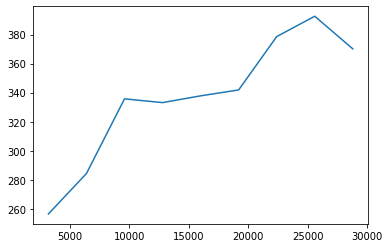

Train:389.49
Train:414.42
Train:419.129
Train:421.661
Train:420.593
Train:430.882
Train:433.086
Train:436.425
Train:438.954
Train:433.081
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000020/checkpoint-20


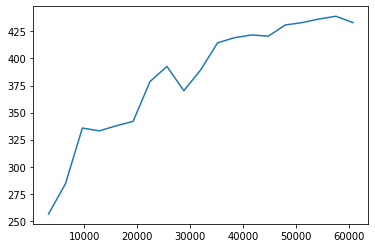

Train:436.762
Train:447.25
Train:442.005
Train:452.656
Train:444.33
Train:443.731
Train:443.017
Train:442.881
Train:442.822
Train:443.807
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000030/checkpoint-30


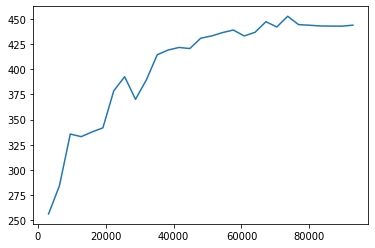

Train:446.628
Train:451.291
Train:450.125
Train:449.641
Train:454.65
Train:455.445
Train:449.806
Train:453.749
Train:451.603
Train:453.797
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000040/checkpoint-40


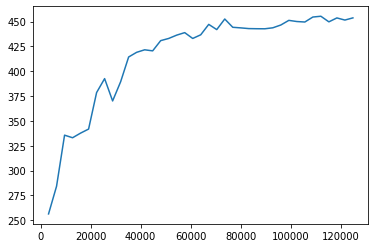

Train:455.665
Train:455.565
Train:454.657
Train:452.841
Train:453.139
Train:455.565
Train:453.749
Train:454.552
Train:452.119
Train:453.749
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000050/checkpoint-50


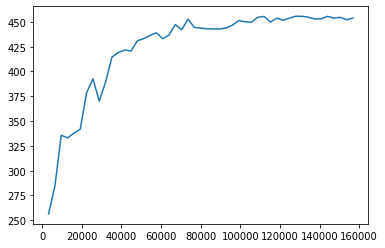

Train:454.657
Train:449.27
Train:453.64
Train:453.749
Train:453.911
Train:453.749
Train:454.657
Train:454.657
Train:453.749
Train:454.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000060/checkpoint-60


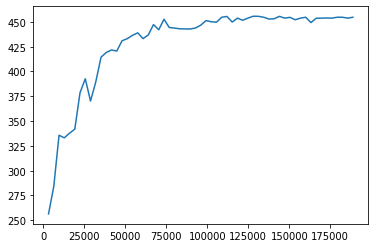

Train:444.129
Train:449.593
Train:448.57
Train:450.418
Train:453.889
Train:452.981
Train:451.071
Train:450.722
Train:452.841
Train:452.981
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000070/checkpoint-70


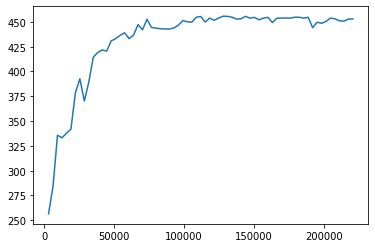

Train:452.993
Train:452.841
Train:449.108
Train:455.18
Train:456.473
Train:451.934
Train:454.657
Train:454.816
Train:455.042
Train:453.142
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000080/checkpoint-80


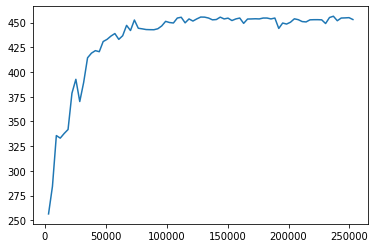

Train:454.548
Train:453.749
Train:452.793
Train:454.657
Train:452.841
Train:454.657
Train:454.657
Train:453.907
Train:456.473
Train:453.749
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000090/checkpoint-90


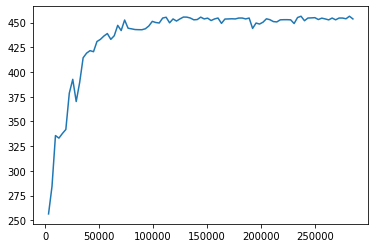

Train:455.565
Train:455.565
Train:453.749
Train:456.473
Train:455.727
Train:452.841
Train:451.182
Train:455.018
Train:453.749
Train:450.485
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000100/checkpoint-100


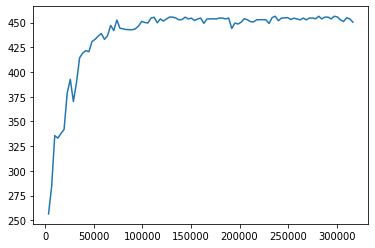

Train:456.473
Train:452.295
Train:454.657
Train:453.749
Train:452.841
Train:453.749
Train:452.841
Train:453.749
Train:452.841
Train:455.727
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000110/checkpoint-110


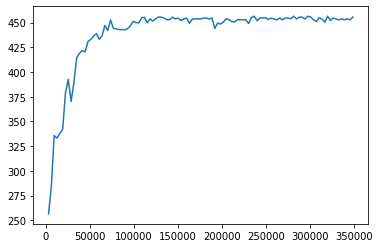

Train:452.841
Train:454.657
Train:453.749
Train:454.099
Train:453.749
Train:455.565
Train:453.749
Train:452.841
Train:453.76
Train:454.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000120/checkpoint-120


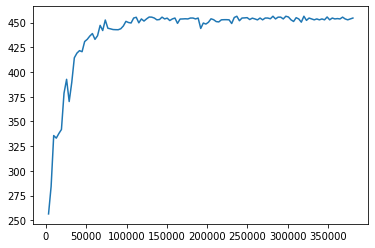

Train:453.749
Train:450.947
Train:452.184
Train:456.473
Train:455.926
Train:453.749
Train:453.749
Train:454.819
Train:451.944
Train:455.565
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000130/checkpoint-130


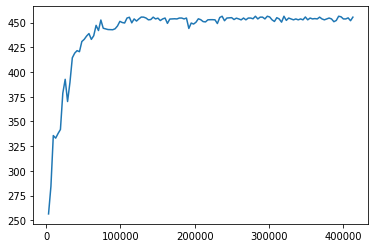

Train:452.841
Train:455.018
Train:454.11
Train:455.565
Train:455.565
Train:454.657
Train:454.819
Train:455.565
Train:456.635
Train:453.749
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000140/checkpoint-140


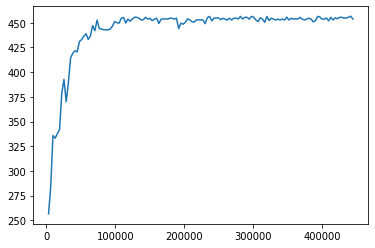

Train:448.812
Train:454.819
Train:453.749
Train:455.565
Train:453.749
Train:454.657
Train:452.841
Train:452.841
Train:455.926
Train:450.737
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000150/checkpoint-150


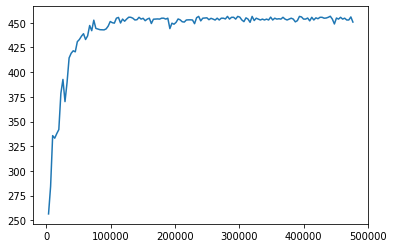

Train:450.97
Train:451.883
Train:452.841
Train:456.473
Train:454.657
Train:455.722
Train:454.657
Train:453.749
Train:454.657
Train:452.841
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000160/checkpoint-160


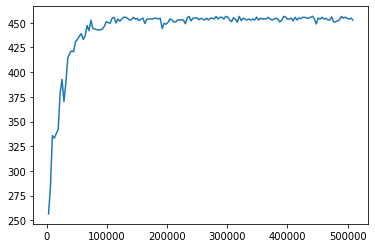

Train:454.657
Train:453.749
Train:453.749
Train:451.068
Train:454.657
Train:452.852
Train:447.419
Train:452.841
Train:453.749
Train:452.841
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000170/checkpoint-170


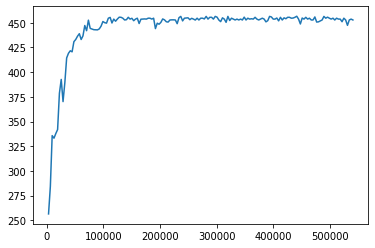

Train:451.734
Train:454.657
Train:452.841
Train:453.749
Train:453.749
Train:454.819
Train:454.919
Train:435.01
Train:452.491
Train:453.202
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000180/checkpoint-180


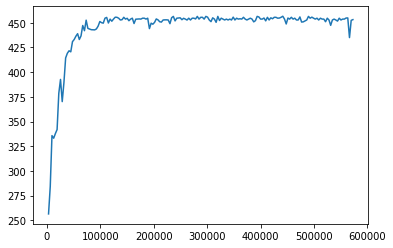

Train:455.565
Train:452.841
Train:452.841
Train:454.657
Train:452.841
Train:453.749
Train:450.251
Train:453.749
Train:455.827
Train:453.749
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000190/checkpoint-190


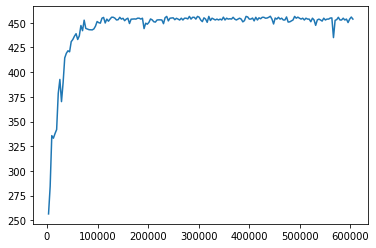

Train:454.657
Train:453.749
Train:456.473
Train:454.657
Train:454.657
Train:453.749
Train:453.749
Train:451.934
Train:455.565
Train:452.841
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000200/checkpoint-200


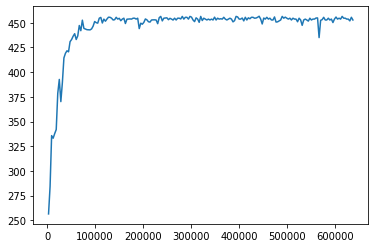

Train:452.841
Train:453.749
Train:453.749
Train:454.657
Train:454.11
Train:453.749
Train:454.657
Train:452.841
Train:454.657
Train:454.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000210/checkpoint-210


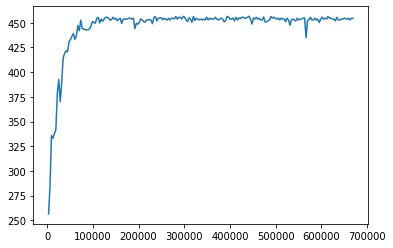

Train:455.565
Train:454.657
Train:454.011
Train:453.76
Train:454.657
Train:452.841
Train:455.565
Train:450.323
Train:454.657
Train:454.657
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000220/checkpoint-220


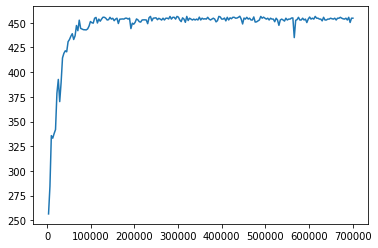

Train:454.657
Train:454.657
Train:455.565
Train:453.202
Train:454.657
Train:455.565
Train:454.471
Train:453.749
Train:455.565
Train:454.11
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000230/checkpoint-230


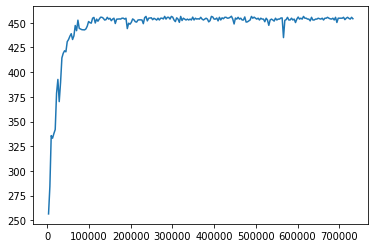

Train:454.11
Train:455.565
Train:454.657
Train:453.749
Train:455.926
Train:455.565
Train:453.749
Train:455.565
Train:448.598
Train:455.565
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000240/checkpoint-240


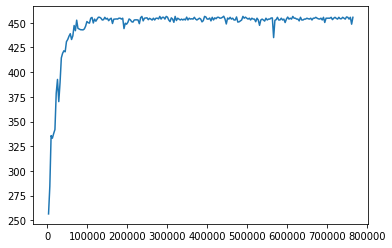

Train:453.749
Train:453.202
Train:454.657
Train:451.966
Train:454.603
Train:452.841
Train:452.295
Train:454.657
Train:453.749
Train:452.962
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000250/checkpoint-250


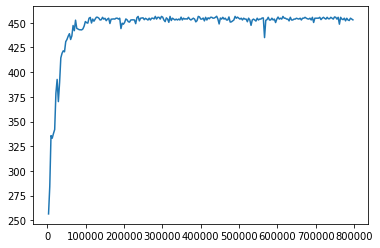

Train:455.28
Train:453.555
Train:454.11
Train:453.017
Train:455.565
Train:455.379
Train:453.563
Train:455.018
Train:455.926
Train:455.053
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000260/checkpoint-260


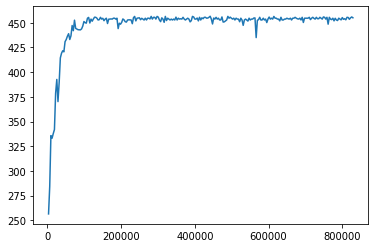

Train:456.473
Train:455.018
Train:453.234
Train:452.141
Train:454.832
Train:454.285
Train:454.285
Train:454.832
Train:454.832
Train:455.379
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000270/checkpoint-270


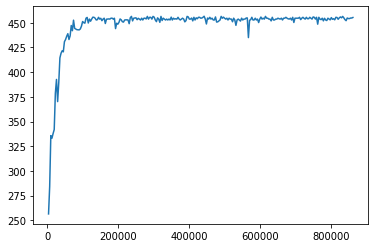

Train:454.341
Train:454.285
Train:452.704
Train:455.379
Train:452.73
Train:453.962
Train:454.598
Train:455.926
Train:454.832
Train:451.217
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000280/checkpoint-280


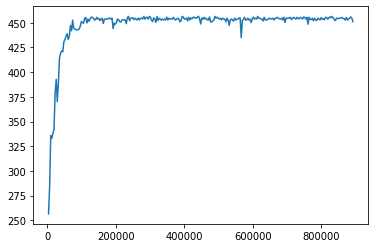

Train:453.924
Train:454.284
Train:455.379
Train:455.379
Train:455.379
Train:452.087
Train:455.926
Train:454.471
Train:455.379
Train:447.344
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000290/checkpoint-290


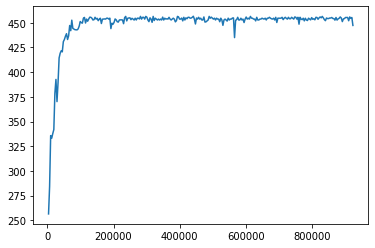

Train:454.471
Train:455.926
Train:454.471
Train:454.832
Train:453.924
Train:454.471
Train:454.285
Train:454.285
Train:454.832
Train:454.832
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000300/checkpoint-300


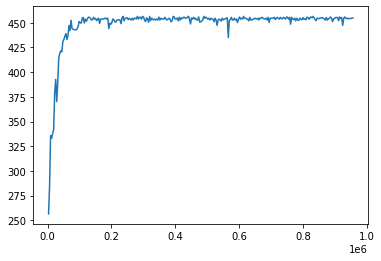

Train:454.832
Train:455.379
Train:454.832
Train:455.379
Train:455.926
Train:454.832
Train:455.379
Train:454.832
Train:454.63
Train:453.924
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000310/checkpoint-310


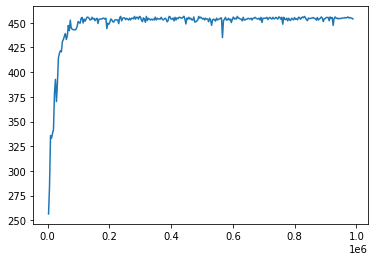

Train:455.379
Train:455.926
Train:455.379
Train:454.285
Train:454.832
Train:455.379
Train:454.285
Train:454.832
Train:454.832
Train:454.832
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_04-39-36m_q45cpy/checkpoint_000320/checkpoint-320


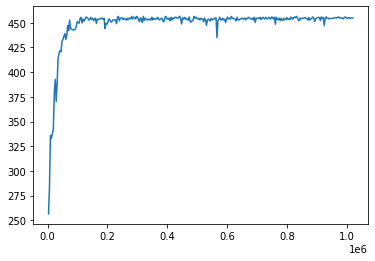

2021-10-20 05:13:32,205	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 05:14:24,496	INFO trainable.py:104 -- Trainable.setup took 51.841 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 05:14:24,504	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:431.388
Train:529.492
Train:495.191
Train:522.378
Train:568.032
Train:537.744
Train:576.616
Train:597.023
Train:593.708
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000010/checkpoint-10


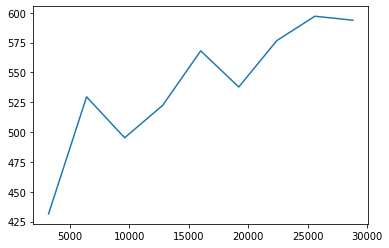

Train:613.749
Train:601.898
Train:620.85
Train:616.195
Train:610.607
Train:613.849
Train:631.042
Train:627.383
Train:630.5
Train:623.506
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000020/checkpoint-20


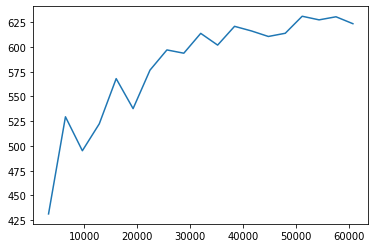

Train:633.626
Train:640.882
Train:631.644
Train:630.535
Train:635.538
Train:639.802
Train:643.277
Train:640.261
Train:639.738
Train:643.288
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000030/checkpoint-30


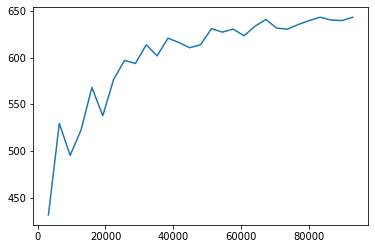

Train:643.41
Train:643.115
Train:636.658
Train:642.949
Train:642.988
Train:638.382
Train:643.229
Train:643.199
Train:643.182
Train:642.959
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000040/checkpoint-40


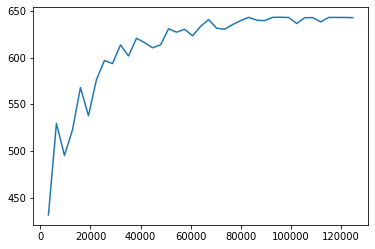

Train:643.748
Train:645.404
Train:643.146
Train:643.212
Train:643.554
Train:643.399
Train:641.433
Train:643.259
Train:643.458
Train:643.36
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000050/checkpoint-50


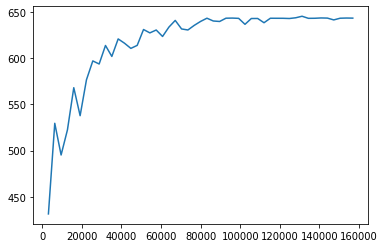

Train:643.476
Train:643.289
Train:643.439
Train:644.329
Train:643.458
Train:641.846
Train:643.445
Train:638.556
Train:643.41
Train:642.219
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000060/checkpoint-60


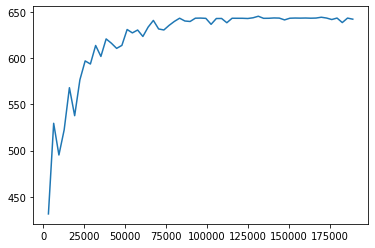

Train:645.487
Train:643.458
Train:643.439
Train:644.477
Train:647.207
Train:645.498
Train:643.344
Train:645.45
Train:643.344
Train:642.78
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000070/checkpoint-70


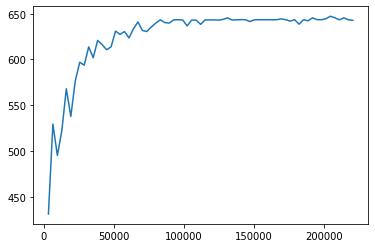

Train:645.052
Train:643.344
Train:644.67
Train:645.849
Train:645.45
Train:647.981
Train:644.14
Train:646.731
Train:646.76
Train:647.174
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000080/checkpoint-80


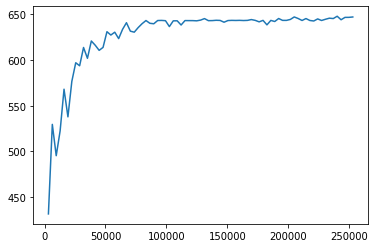

Train:648.469
Train:645.45
Train:646.967
Train:650.384
Train:647.174
Train:645.624
Train:645.052
Train:645.259
Train:645.259
Train:643.662
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000090/checkpoint-90


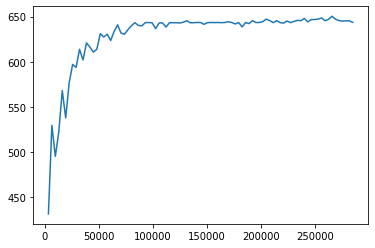

Train:645.976
Train:648.883
Train:645.259
Train:645.052
Train:645.748
Train:634.543
Train:646.454
Train:643.344
Train:647.264
Train:646.967
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000100/checkpoint-100


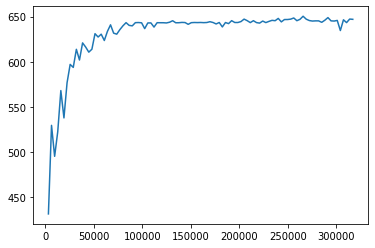

Train:646.056
Train:650.798
Train:647.971
Train:645.259
Train:647.174
Train:642.208
Train:649.09
Train:647.953
Train:629.112
Train:644.123
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000110/checkpoint-110


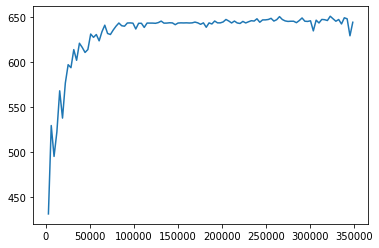

Train:648.883
Train:641.072
Train:651.005
Train:644.123
Train:647.174
Train:649.152
Train:649.09
Train:649.09
Train:650.798
Train:649.09
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000120/checkpoint-120


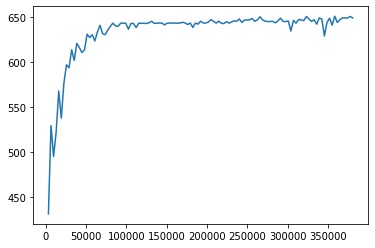

Train:649.09
Train:651.005
Train:649.09
Train:638.316
Train:643.847
Train:650.798
Train:650.798
Train:646.967
Train:651.144
Train:646.76
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000130/checkpoint-130


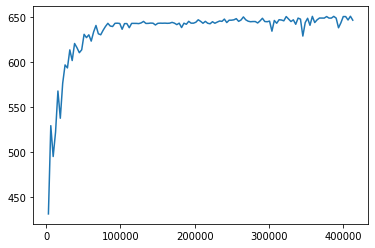

Train:647.174
Train:649.09
Train:646.581
Train:647.75
Train:642.519
Train:647.174
Train:645.259
Train:645.259
Train:645.259
Train:647.174
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000140/checkpoint-140


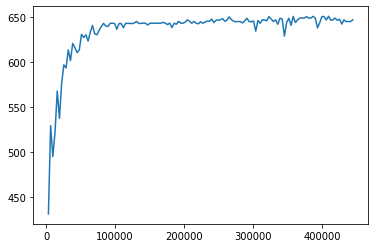

Train:649.09
Train:647.174
Train:648.883
Train:646.967
Train:643.742
Train:646.289
Train:645.259
Train:649.09
Train:647.174
Train:648.883
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000150/checkpoint-150


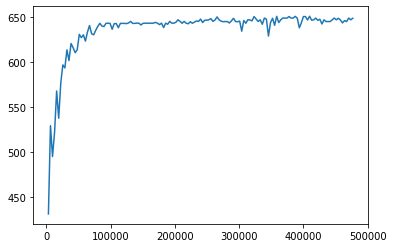

Train:647.174
Train:647.138
Train:649.09
Train:651.005
Train:646.289
Train:649.09
Train:647.174
Train:640.997
Train:648.883
Train:641.854
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000160/checkpoint-160


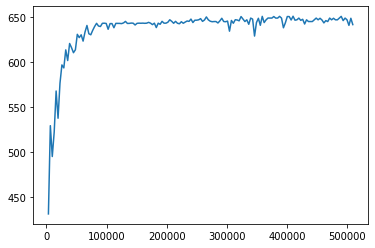

Train:645.976
Train:646.145
Train:642.661
Train:646.89
Train:643.76
Train:645.867
Train:646.647
Train:647.229
Train:647.211
Train:645.746
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000170/checkpoint-170


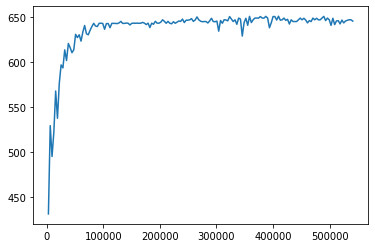

Train:641.633
Train:643.49
Train:645.23
Train:649.06
Train:645.23
Train:647.193
Train:640.439
Train:643.34
Train:647.193
Train:649.09
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000180/checkpoint-180


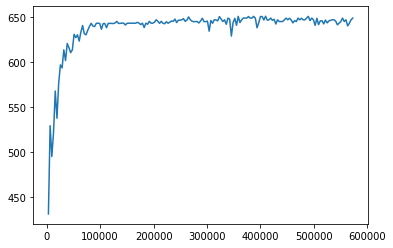

Train:651.112
Train:646.55
Train:647.17
Train:645.052
Train:649.09
Train:647.174
Train:649.09
Train:647.174
Train:649.197
Train:645.04
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000190/checkpoint-190


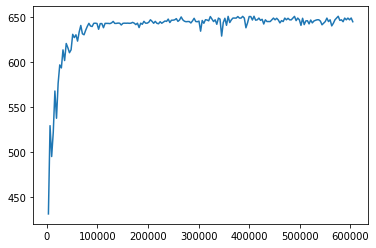

Train:651.005
Train:649.09
Train:647.174
Train:643.417
Train:645.296
Train:645.314
Train:649.108
Train:651.023
Train:649.108
Train:645.296
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000200/checkpoint-200


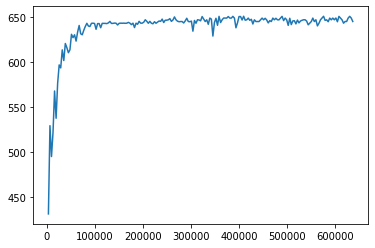

Train:645.694
Train:651.023
Train:648.883
Train:651.005
Train:647.849
Train:651.005
Train:647.211
Train:649.126
Train:645.314
Train:647.229
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000210/checkpoint-210


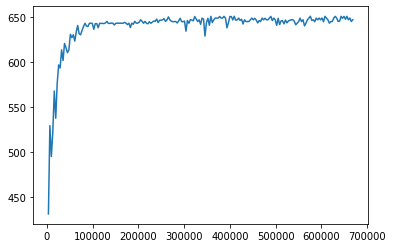

Train:647.702
Train:645.314
Train:645.314
Train:649.108
Train:647.211
Train:651.085
Train:646.244
Train:643.38
Train:647.273
Train:647.211
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000220/checkpoint-220


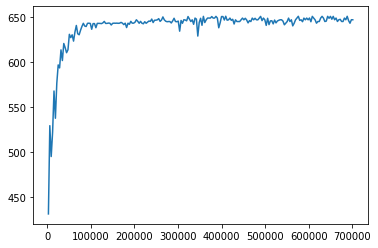

Train:647.229
Train:645.332
Train:649.635
Train:652.92
Train:649.126
Train:639.546
Train:649.108
Train:649.126
Train:651.023
Train:647.211
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000230/checkpoint-230


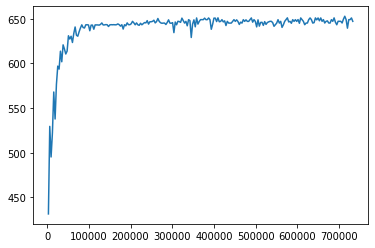

Train:649.108
Train:648.901
Train:647.193
Train:649.09
Train:649.126
Train:651.005
Train:643.38
Train:647.229
Train:649.108
Train:648.919
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000240/checkpoint-240


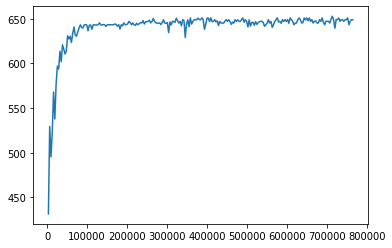

Train:647.229
Train:651.005
Train:645.314
Train:647.229
Train:644.141
Train:651.023
Train:652.92
Train:650.816
Train:649.126
Train:648.901
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000250/checkpoint-250


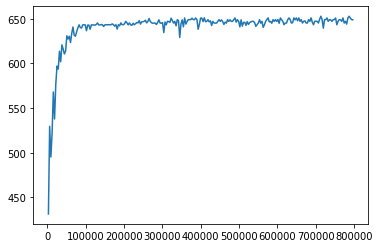

Train:645.314
Train:649.506
Train:649.126
Train:648.919
Train:647.174
Train:645.296
Train:647.193
Train:647.193
Train:649.108
Train:647.193
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000260/checkpoint-260


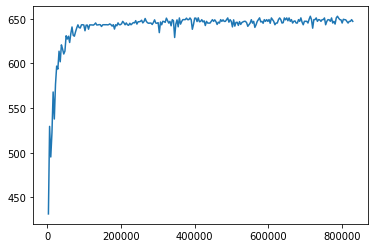

Train:647.174
Train:651.023
Train:647.211
Train:647.211
Train:647.229
Train:647.229
Train:647.211
Train:647.211
Train:651.005
Train:647.211
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000270/checkpoint-270


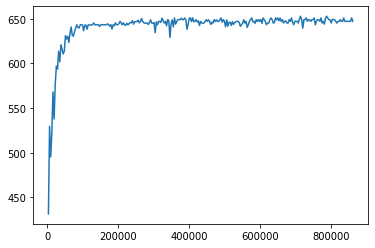

Train:636.004
Train:641.004
Train:650.798
Train:649.108
Train:647.193
Train:649.126
Train:649.126
Train:649.126
Train:641.832
Train:647.211
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000280/checkpoint-280


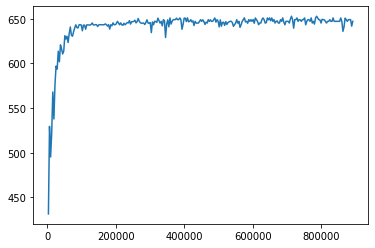

Train:647.229
Train:647.229
Train:647.211
Train:649.126
Train:645.332
Train:643.454
Train:649.126
Train:644.98
Train:649.126
Train:649.126
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000290/checkpoint-290


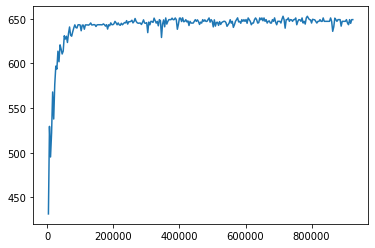

Train:644.436
Train:649.126
Train:652.92
Train:645.314
Train:649.126
Train:649.126
Train:649.126
Train:647.229
Train:651.023
Train:647.229
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000300/checkpoint-300


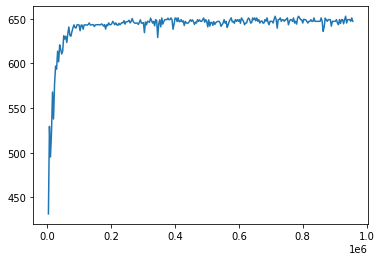

Train:647.229
Train:649.108
Train:639.726
Train:645.332
Train:647.022
Train:643.417
Train:645.314
Train:645.314
Train:652.92
Train:648.53
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000310/checkpoint-310


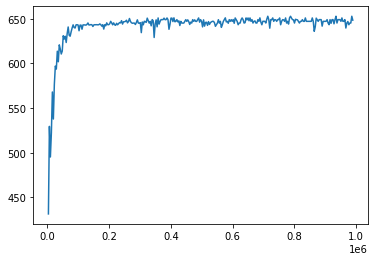

Train:644.178
Train:647.229
Train:645.314
Train:643.434
Train:643.434
Train:649.126
Train:647.229
Train:647.229
Train:645.332
Train:649.09
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-13-32ksm4tijl/checkpoint_000320/checkpoint-320


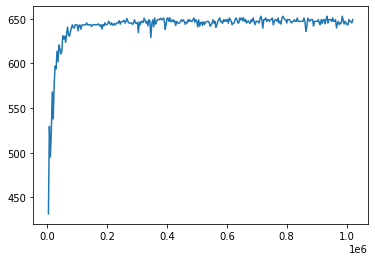

2021-10-20 05:47:26,323	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 05:48:19,135	INFO trainable.py:104 -- Trainable.setup took 52.354 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 05:48:19,145	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:421.261
Train:468.725
Train:462.578
Train:460.687
Train:501.685
Train:550.553
Train:580.646
Train:569.638
Train:582.848
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000010/checkpoint-10


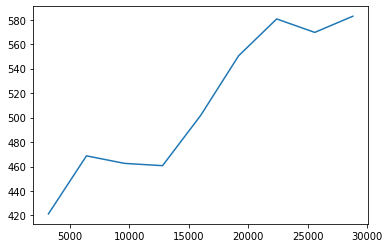

Train:571.969
Train:598.237
Train:595.382
Train:607.971
Train:607.447
Train:629.583
Train:590.847
Train:624.427
Train:632.82
Train:617.553
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000020/checkpoint-20


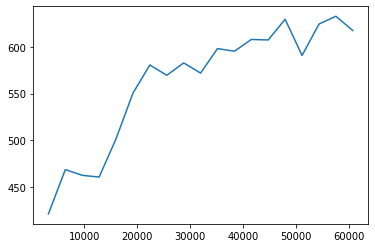

Train:624.775
Train:634.736
Train:642.985
Train:632.246
Train:634.849
Train:644.443
Train:643.728
Train:643.824
Train:644.817
Train:649.967
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000030/checkpoint-30


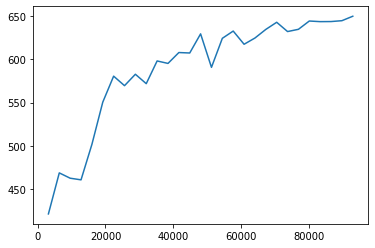

Train:646.606
Train:648.518
Train:650.12
Train:648.128
Train:649.699
Train:647.867
Train:649.146
Train:650.027
Train:648.059
Train:649.002
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000040/checkpoint-40


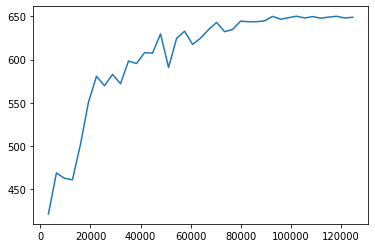

Train:643.754
Train:650.138
Train:650.525
Train:650.994
Train:651.854
Train:652.617
Train:650.812
Train:652.975
Train:653.012
Train:653.048
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000050/checkpoint-50


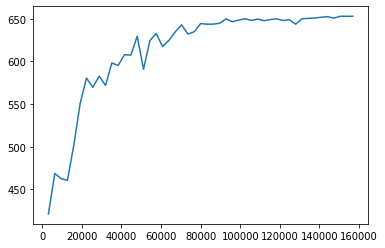

Train:648.863
Train:651.817
Train:652.017
Train:653.121
Train:650.445
Train:654.984
Train:654.968
Train:649.247
Train:653.082
Train:652.675
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000060/checkpoint-60


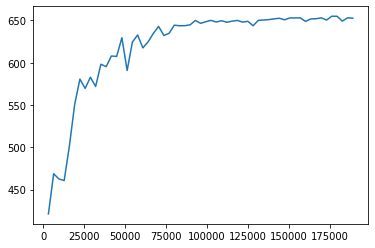

Train:648.385
Train:651.617
Train:656.415
Train:652.633
Train:657.389
Train:655.261
Train:652.893
Train:654.704
Train:653.724
Train:655.043
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000070/checkpoint-70


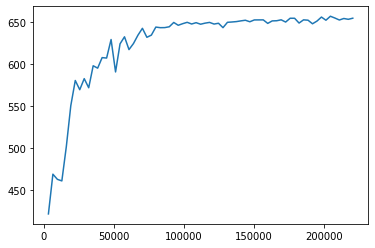

Train:654.314
Train:655.417
Train:658.091
Train:655.94
Train:654.706
Train:658.46
Train:657.635
Train:657.568
Train:657.476
Train:658.614
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000080/checkpoint-80


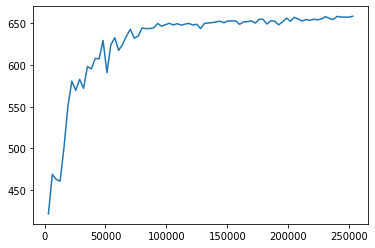

Train:656.973
Train:658.159
Train:655.951
Train:655.959
Train:654.865
Train:658.678
Train:658.156
Train:658.159
Train:658.678
Train:658.678
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000090/checkpoint-90


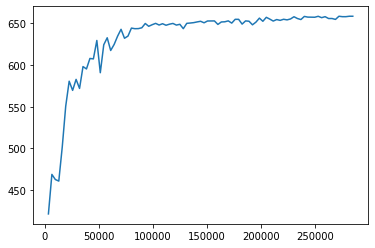

Train:657.371
Train:656.848
Train:657.476
Train:658.68
Train:657.915
Train:658.158
Train:659.203
Train:657.11
Train:649.824
Train:658.156
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000100/checkpoint-100


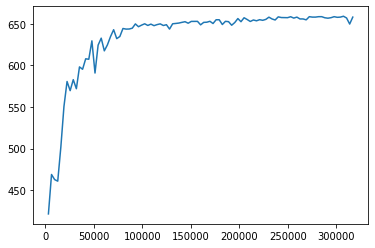

Train:656.588
Train:657.633
Train:657.11
Train:657.633
Train:658.679
Train:657.633
Train:657.635
Train:657.565
Train:658.155
Train:657.633
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000110/checkpoint-110


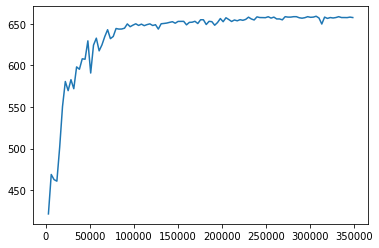

Train:658.159
Train:657.112
Train:657.634
Train:657.113
Train:657.112
Train:659.203
Train:657.11
Train:657.635
Train:658.155
Train:657.635
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000120/checkpoint-120


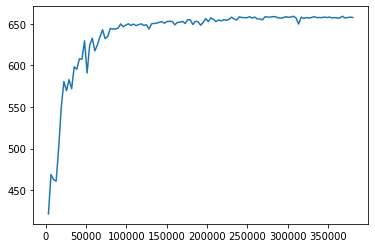

Train:657.633
Train:658.157
Train:658.158
Train:658.158
Train:657.633
Train:658.158
Train:653.166
Train:658.158
Train:655.933
Train:657.111
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000130/checkpoint-130


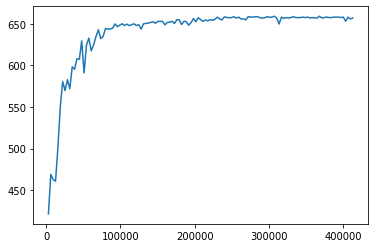

Train:657.633
Train:657.111
Train:657.111
Train:657.634
Train:658.156
Train:657.635
Train:657.634
Train:656.589
Train:659.201
Train:657.371
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000140/checkpoint-140


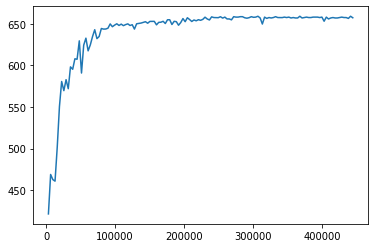

Train:658.157
Train:658.437
Train:650.064
Train:658.155
Train:657.633
Train:658.156
Train:658.158
Train:656.588
Train:657.634
Train:657.93
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000150/checkpoint-150


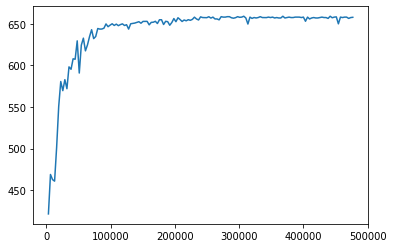

Train:657.112
Train:658.156
Train:658.156
Train:657.564
Train:657.633
Train:658.612
Train:657.633
Train:657.633
Train:657.042
Train:658.678
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000160/checkpoint-160


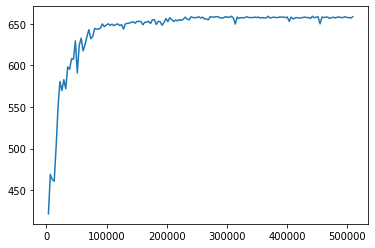

Train:657.566
Train:656.523
Train:658.678
Train:658.678
Train:658.414
Train:654.441
Train:658.161
Train:658.68
Train:658.158
Train:658.089
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000170/checkpoint-170


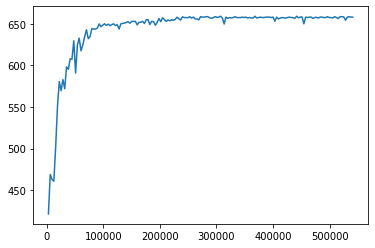

Train:657.37
Train:658.156
Train:656.542
Train:658.155
Train:655.123
Train:656.46
Train:653.703
Train:657.633
Train:654.803
Train:653.585
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000180/checkpoint-180


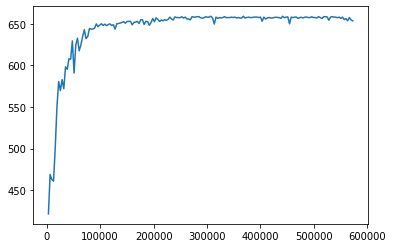

Train:654.619
Train:655.628
Train:658.001
Train:658.089
Train:654.387
Train:656.973
Train:657.498
Train:657.565
Train:657.633
Train:658.159
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000190/checkpoint-190


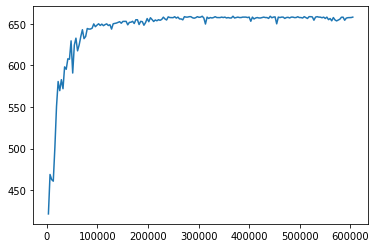

Train:657.633
Train:658.61
Train:657.371
Train:655.907
Train:659.203
Train:657.634
Train:657.633
Train:657.11
Train:658.679
Train:657.633
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000200/checkpoint-200


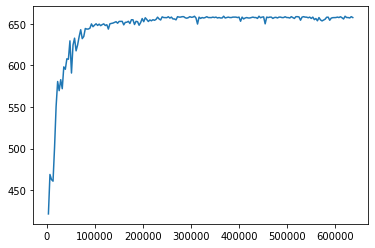

Train:656.429
Train:658.158
Train:657.892
Train:658.682
Train:657.635
Train:656.429
Train:658.156
Train:657.112
Train:657.11
Train:657.633
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000210/checkpoint-210


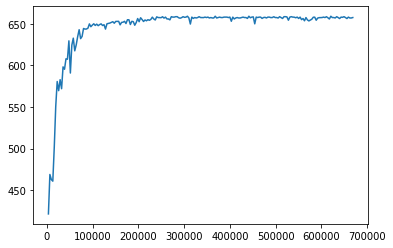

Train:658.156
Train:657.635
Train:655.328
Train:657.633
Train:657.635
Train:658.158
Train:654.867
Train:657.069
Train:657.635
Train:657.112
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000220/checkpoint-220


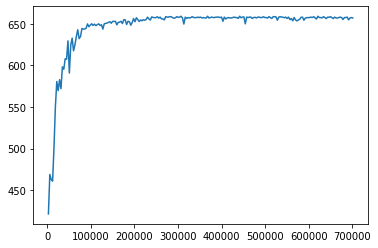

Train:655.759
Train:659.208
Train:657.113
Train:657.635
Train:658.091
Train:656.975
Train:655.479
Train:658.156
Train:658.161
Train:656.854
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000230/checkpoint-230


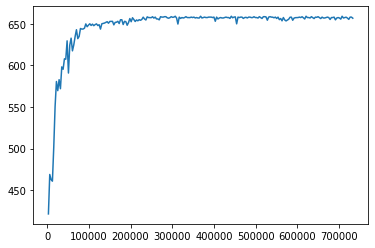

Train:654.699
Train:658.155
Train:657.635
Train:657.111
Train:657.635
Train:658.158
Train:657.475
Train:656.956
Train:658.159
Train:658.157
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000240/checkpoint-240


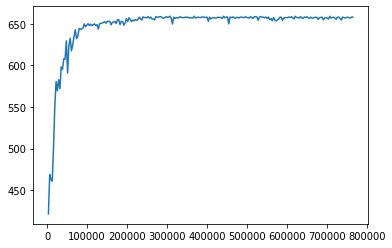

Train:656.954
Train:657.633
Train:658.159
Train:657.634
Train:654.888
Train:657.633
Train:657.635
Train:656.602
Train:654.613
Train:658.161
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000250/checkpoint-250


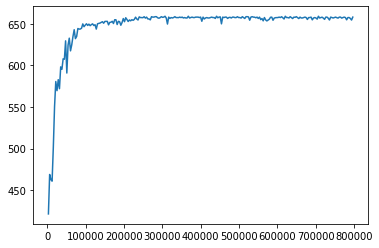

Train:657.635
Train:657.637
Train:657.636
Train:657.636
Train:658.118
Train:658.161
Train:658.682
Train:658.158
Train:657.113
Train:654.845
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000260/checkpoint-260


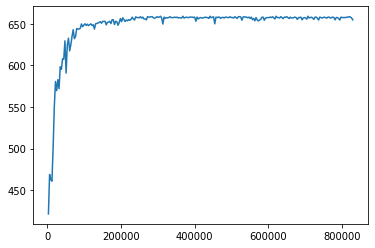

Train:658.158
Train:659.208
Train:657.634
Train:657.113
Train:656.589
Train:657.116
Train:657.636
Train:658.161
Train:657.635
Train:657.111
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000270/checkpoint-270


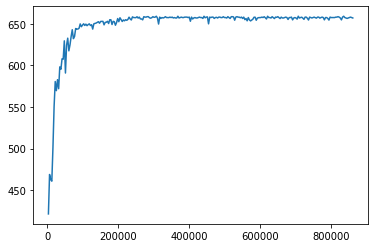

Train:657.637
Train:657.634
Train:654.952
Train:657.112
Train:657.634
Train:654.726
Train:658.157
Train:658.684
Train:657.636
Train:658.684
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000280/checkpoint-280


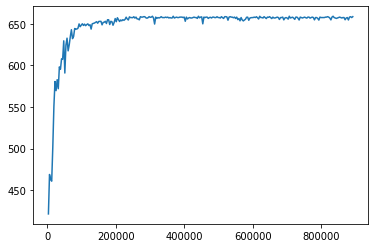

Train:658.159
Train:657.113
Train:656.331
Train:658.155
Train:657.044
Train:658.161
Train:658.161
Train:658.002
Train:657.044
Train:657.411
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000290/checkpoint-290


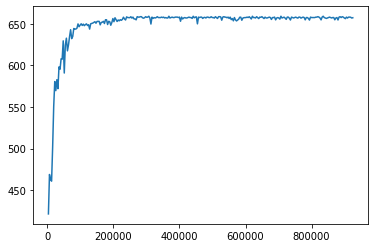

Train:657.568
Train:657.937
Train:658.617
Train:657.481
Train:657.5
Train:658.093
Train:657.432
Train:656.451
Train:658.024
Train:657.14
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000300/checkpoint-300


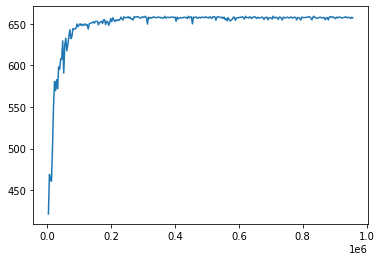

Train:657.549
Train:658.091
Train:658.685
Train:658.005
Train:658.161
Train:657.637
Train:657.568
Train:654.471
Train:657.635
Train:656.698
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000310/checkpoint-310


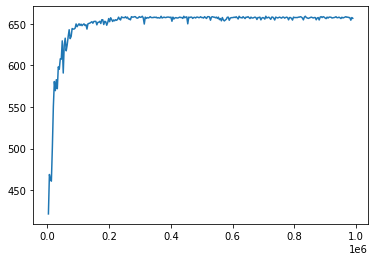

Train:657.615
Train:657.547
Train:657.633
Train:657.566
Train:655.417
Train:658.159
Train:657.633
Train:656.462
Train:658.089
Train:656.509
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_05-47-26i8z1ycqs/checkpoint_000320/checkpoint-320


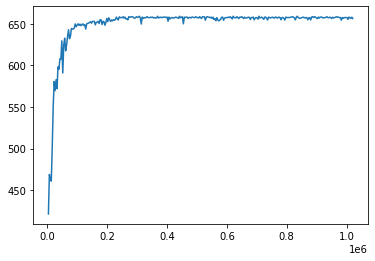

2021-10-20 06:21:24,363	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 06:22:16,745	INFO trainable.py:104 -- Trainable.setup took 51.937 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 06:22:16,748	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:302.059
Train:391.868
Train:345.961
Train:390.845
Train:395.215
Train:446.144
Train:419.069
Train:485.683
Train:497.207
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000010/checkpoint-10


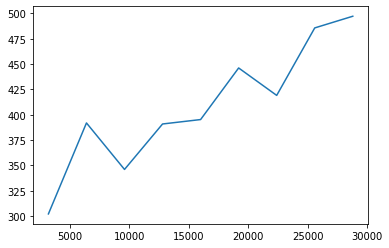

Train:491.837
Train:504.251
Train:499.299
Train:514.3
Train:507.314
Train:518.463
Train:511.404
Train:509.193
Train:504.126
Train:520.235
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000020/checkpoint-20


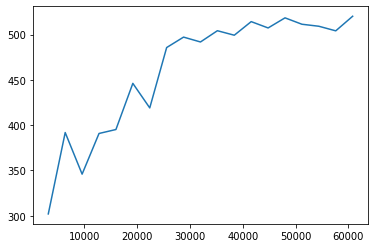

Train:521.12
Train:524.226
Train:520.899
Train:523.964
Train:522.972
Train:526.179
Train:521.166
Train:528.796
Train:526.582
Train:523.966
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000030/checkpoint-30


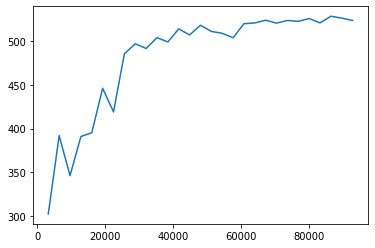

Train:529.518
Train:528.027
Train:525.967
Train:530.632
Train:527.831
Train:526.238
Train:525.101
Train:529.251
Train:522.588
Train:529.574
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000040/checkpoint-40


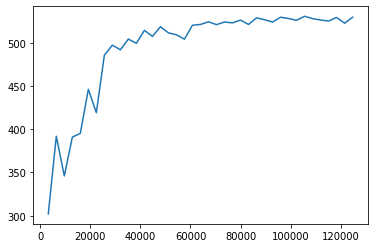

Train:533.325
Train:530.052
Train:531.863
Train:532.532
Train:532.79
Train:528.593
Train:532.639
Train:530.512
Train:530.859
Train:530.42
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000050/checkpoint-50


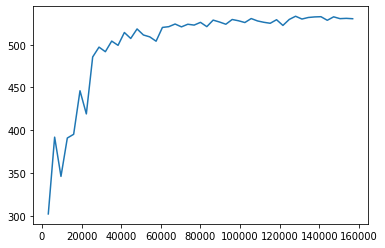

Train:531.5
Train:532.639
Train:533.029
Train:531.126
Train:523.041
Train:528.323
Train:533.029
Train:529.29
Train:534.06
Train:529.967
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000060/checkpoint-60


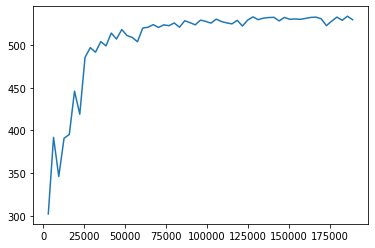

Train:533.029
Train:533.354
Train:536.123
Train:531.998
Train:534.06
Train:533.013
Train:534.06
Train:533.456
Train:531.998
Train:535.092
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000070/checkpoint-70


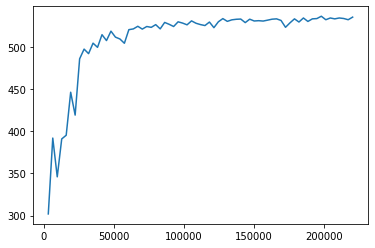

Train:533.04
Train:534.231
Train:532.96
Train:531.929
Train:531.998
Train:531.268
Train:532.384
Train:535.092
Train:530.712
Train:531.998
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000080/checkpoint-80


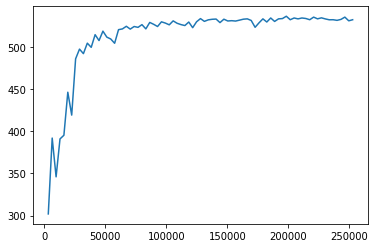

Train:529.991
Train:530.966
Train:533.029
Train:530.966
Train:533.029
Train:533.029
Train:533.029
Train:532.904
Train:533.029
Train:532.891
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000090/checkpoint-90


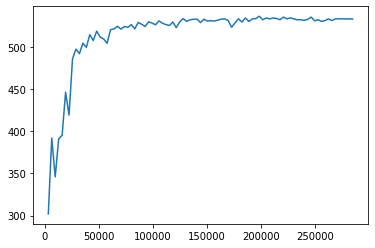

Train:534.06
Train:529.937
Train:530.741
Train:534.06
Train:531.998
Train:534.331
Train:533.029
Train:530.966
Train:535.092
Train:533.029
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000100/checkpoint-100


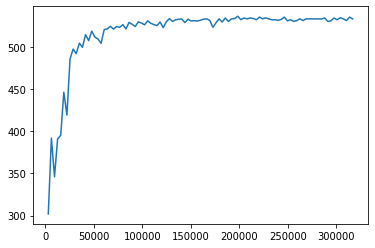

Train:521.274
Train:533.789
Train:535.035
Train:535.092
Train:535.092
Train:534.06
Train:531.998
Train:533.029
Train:532.323
Train:533.029
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000110/checkpoint-110


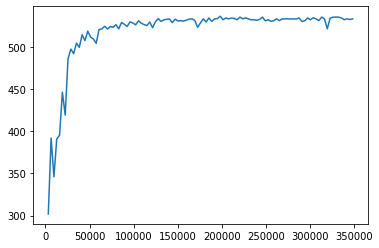

Train:535.092
Train:532.096
Train:535.092
Train:536.123
Train:532.447
Train:532.096
Train:533.029
Train:534.06
Train:533.029
Train:533.029
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000120/checkpoint-120


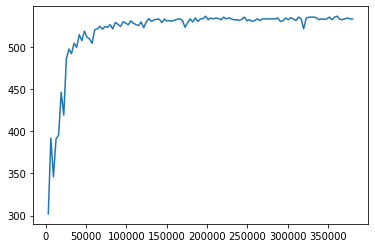

Train:532.096
Train:533.029
Train:534.06
Train:533.029
Train:534.145
Train:535.176
Train:530.966
Train:529.608
Train:526.274
Train:531.814
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000130/checkpoint-130


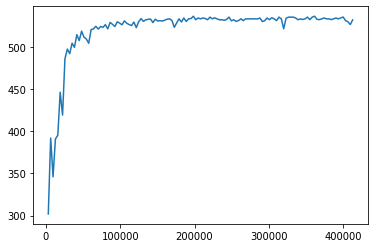

Train:534.06
Train:531.998
Train:534.06
Train:533.029
Train:535.176
Train:534.229
Train:534.06
Train:535.092
Train:535.092
Train:535.592
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000140/checkpoint-140


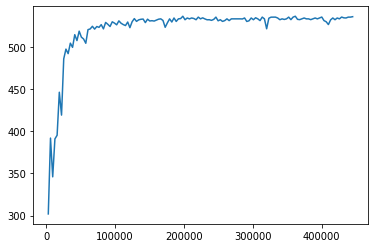

Train:531.998
Train:531.826
Train:534.06
Train:533.029
Train:531.998
Train:531.352
Train:534.06
Train:533.113
Train:533.029
Train:530.828
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000150/checkpoint-150


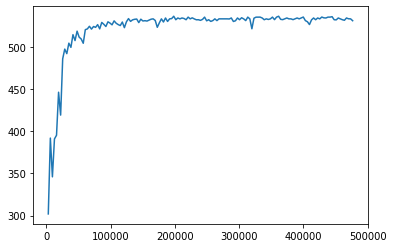

Train:531.998
Train:534.06
Train:534.06
Train:536.207
Train:531.998
Train:531.125
Train:531.998
Train:523.973
Train:533.029
Train:533.029
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000160/checkpoint-160


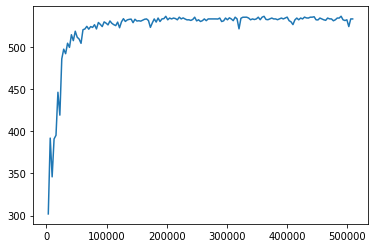

Train:533.029
Train:535.092
Train:534.06
Train:533.127
Train:534.145
Train:534.06
Train:534.207
Train:534.06
Train:532.639
Train:536.123
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000170/checkpoint-170


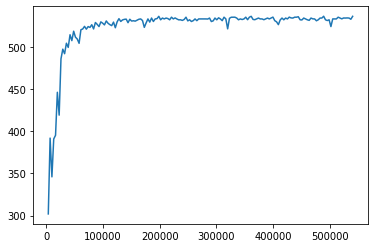

Train:535.103
Train:534.06
Train:531.998
Train:535.092
Train:530.865
Train:533.029
Train:533.029
Train:531.644
Train:534.06
Train:530.966
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000180/checkpoint-180


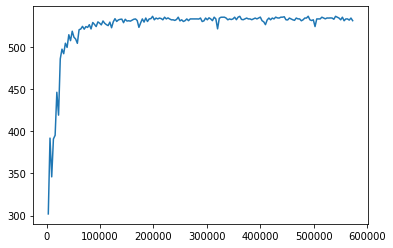

Train:534.667
Train:532.004
Train:530.966
Train:535.092
Train:535.092
Train:535.092
Train:532.675
Train:533.029
Train:533.113
Train:533.029
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000190/checkpoint-190


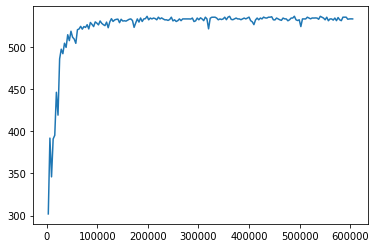

Train:533.113
Train:534.06
Train:531.998
Train:533.029
Train:534.22
Train:521.009
Train:532.141
Train:533.029
Train:527.062
Train:533.029
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000200/checkpoint-200


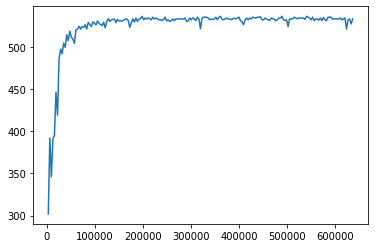

Train:535.176
Train:534.145
Train:530.966
Train:533.113
Train:535.26
Train:533.198
Train:534.145
Train:533.198
Train:535.176
Train:533.113
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000210/checkpoint-210


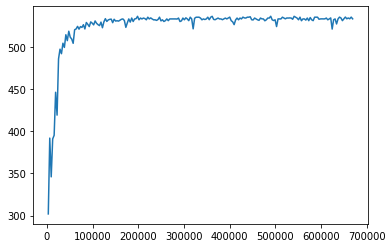

Train:533.198
Train:533.113
Train:531.751
Train:534.229
Train:535.26
Train:534.229
Train:534.145
Train:517.82
Train:535.429
Train:536.544
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000220/checkpoint-220


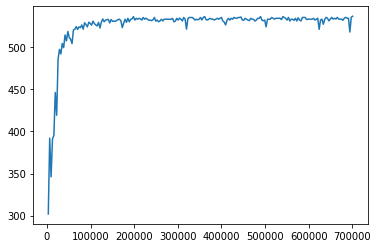

Train:534.313
Train:534.313
Train:536.46
Train:513.465
Train:527.035
Train:533.198
Train:534.313
Train:529.235
Train:527.456
Train:535.345
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000230/checkpoint-230


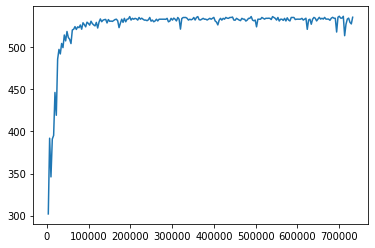

Train:532.296
Train:533.198
Train:532.082
Train:533.198
Train:535.429
Train:533.198
Train:530.966
Train:533.198
Train:536.544
Train:534.56
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000240/checkpoint-240


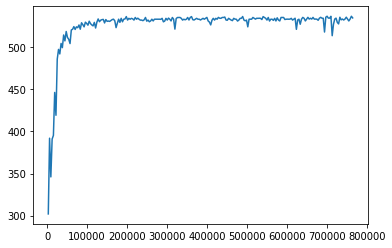

Train:533.198
Train:529.563
Train:534.313
Train:534.313
Train:534.313
Train:534.313
Train:534.313
Train:533.198
Train:534.313
Train:532.082
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000250/checkpoint-250


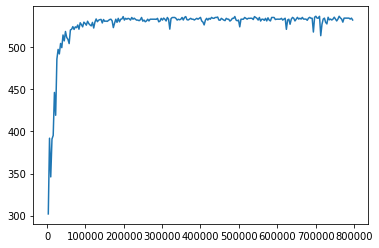

Train:531.394
Train:535.429
Train:533.94
Train:533.198
Train:534.313
Train:534.59
Train:534.313
Train:533.198
Train:532.082
Train:527.913
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000260/checkpoint-260


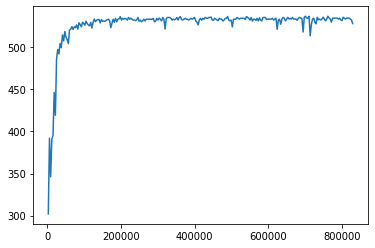

Train:529.65
Train:535.429
Train:532.082
Train:532.423
Train:534.313
Train:535.429
Train:533.198
Train:533.198
Train:534.313
Train:534.313
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000270/checkpoint-270


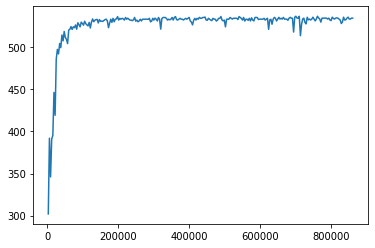

Train:534.313
Train:530.607
Train:531.699
Train:534.313
Train:533.198
Train:535.429
Train:529.699
Train:532.416
Train:536.544
Train:536.544
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000280/checkpoint-280


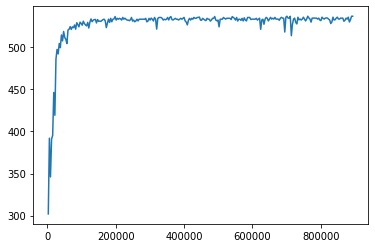

Train:532.082
Train:533.198
Train:534.313
Train:532.082
Train:534.313
Train:534.313
Train:534.313
Train:533.198
Train:534.313
Train:533.198
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000290/checkpoint-290


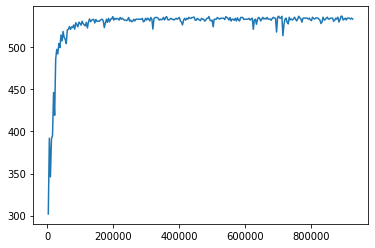

Train:529.163
Train:534.313
Train:533.198
Train:534.313
Train:533.198
Train:532.082
Train:532.366
Train:532.329
Train:531.81
Train:533.198
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000300/checkpoint-300


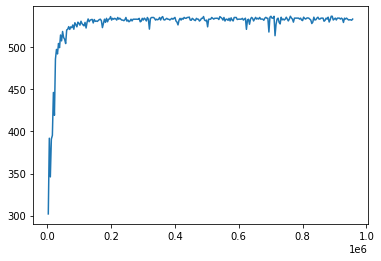

Train:532.082
Train:530.966
Train:534.313
Train:533.198
Train:535.676
Train:533.198
Train:534.313
Train:532.466
Train:532.265
Train:533.198
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000310/checkpoint-310


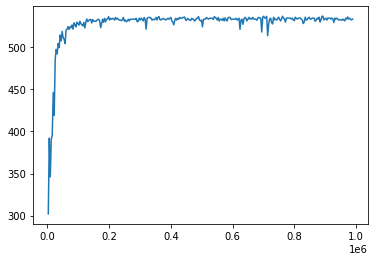

Train:534.313
Train:532.265
Train:533.198
Train:533.198
Train:534.313
Train:532.082
Train:533.198
Train:533.198
Train:534.313
Train:533.198
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-21-24rd7phzg5/checkpoint_000320/checkpoint-320


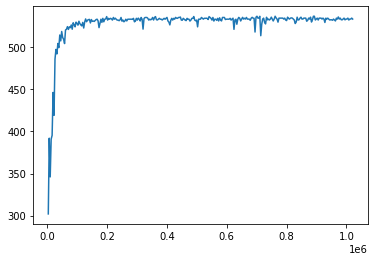

2021-10-20 06:55:16,591	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-10-20 06:56:08,940	INFO trainable.py:104 -- Trainable.setup took 51.914 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2021-10-20 06:56:08,944	WARNING util.py:53 -- Install gputil for GPU system monitoring.


Train:215.075
Train:340.559
Train:318.939
Train:373.594
Train:390.47
Train:377.03
Train:400.381
Train:412.141
Train:442.056
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000010/checkpoint-10


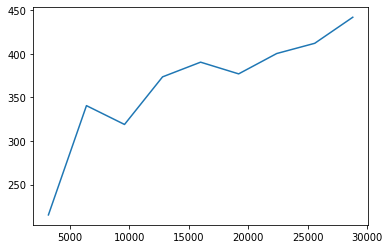

Train:425.23
Train:442.886
Train:444.378
Train:462.429
Train:456.789
Train:457.632
Train:460.261
Train:469.619
Train:472.408
Train:460.34
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000020/checkpoint-20


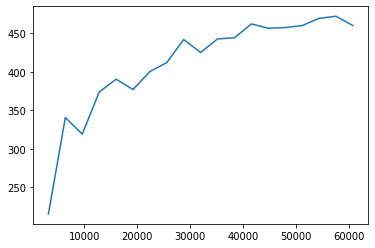

Train:469.032
Train:476.307
Train:466.953
Train:474.437
Train:476.817
Train:461.555
Train:476.028
Train:471.266
Train:479.479
Train:481.456
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000030/checkpoint-30


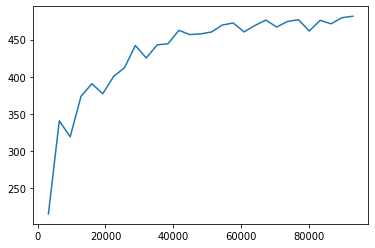

Train:473.385
Train:476.094
Train:478.358
Train:476.284
Train:477.563
Train:476.321
Train:478.493
Train:475.258
Train:479.456
Train:472.413
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000040/checkpoint-40


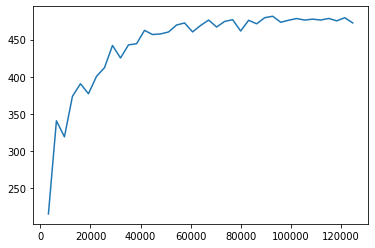

Train:479.906
Train:480.138
Train:477.104
Train:480.059
Train:473.014
Train:479.385
Train:480.128
Train:481.731
Train:480.579
Train:480.892
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000050/checkpoint-50


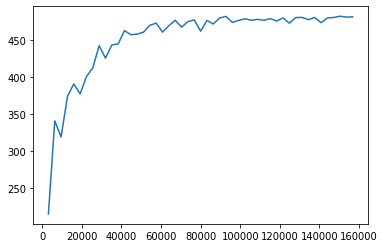

Train:480.739
Train:479.906
Train:480.739
Train:481.24
Train:480.224
Train:478.558
Train:479.391
Train:481.412
Train:480.665
Train:482.405
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000060/checkpoint-60


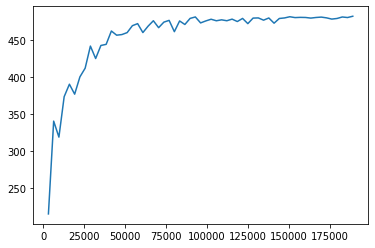

Train:480.046
Train:480.059
Train:480.465
Train:480.468
Train:480.49
Train:481.412
Train:481.927
Train:480.739
Train:480.372
Train:480.358
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000070/checkpoint-70


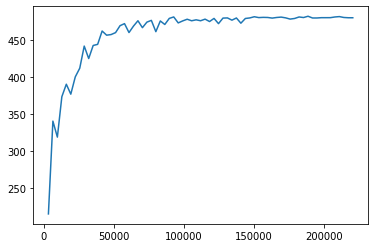

Train:479.352
Train:480.059
Train:480.705
Train:479.544
Train:477.717
Train:481.712
Train:480.733
Train:479.477
Train:481.399
Train:480.065
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000080/checkpoint-80


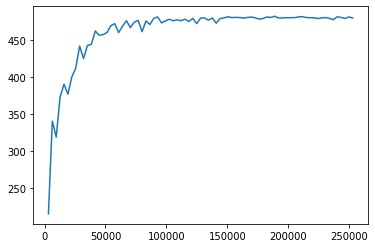

Train:480.012
Train:482.245
Train:478.67
Train:480.377
Train:480.185
Train:479.385
Train:481.032
Train:480.353
Train:480.213
Train:481.731
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000090/checkpoint-90


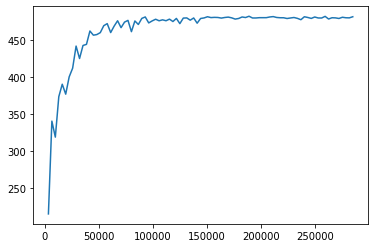

Train:479.963
Train:480.344
Train:481.475
Train:479.922
Train:480.372
Train:480.123
Train:481.384
Train:479.645
Train:480.344
Train:481.205
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000100/checkpoint-100


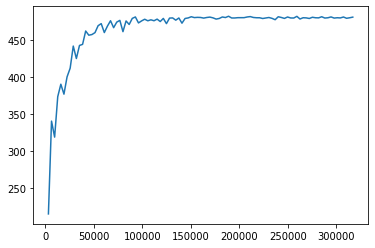

Train:480.531
Train:476.762
Train:480.497
Train:482.723
Train:480.497
Train:479.818
Train:480.017
Train:478.764
Train:471.384
Train:482.043
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000110/checkpoint-110


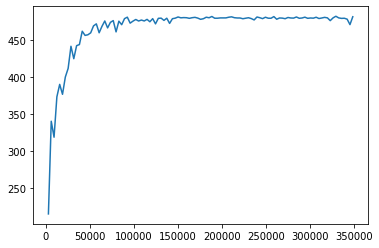

Train:480.526
Train:479.948
Train:480.385
Train:482.043
Train:481.364
Train:481.051
Train:481.205
Train:479.852
Train:480.531
Train:480.449
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000120/checkpoint-120


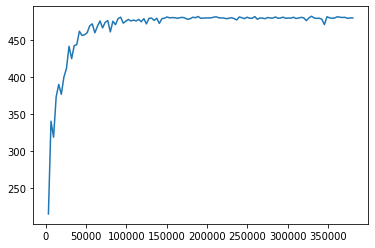

Train:480.497
Train:481.177
Train:481.697
Train:479.596
Train:481.884
Train:481.364
Train:480.314
Train:481.205
Train:481.177
Train:481.372
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000130/checkpoint-130


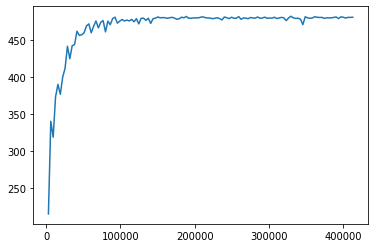

Train:480.36
Train:481.205
Train:480.949
Train:481.046
Train:480.018
Train:479.818
Train:480.005
Train:480.497
Train:481.364
Train:478.058
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000140/checkpoint-140


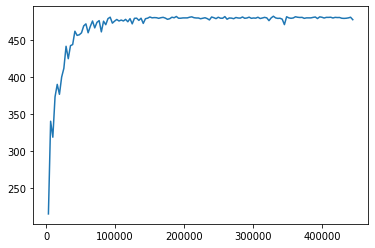

Train:481.364
Train:479.326
Train:479.269
Train:481.182
Train:482.043
Train:482.043
Train:480.695
Train:481.182
Train:480.127
Train:481.932
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000150/checkpoint-150


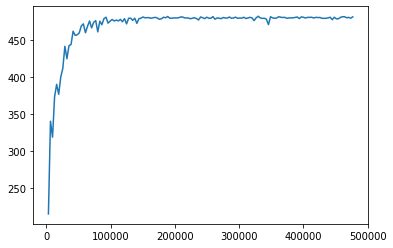

Train:481.364
Train:481.126
Train:479.281
Train:481.317
Train:480.636
Train:480.704
Train:481.522
Train:480.261
Train:480.633
Train:481.496
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000160/checkpoint-160


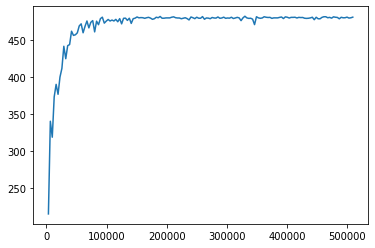

Train:482.413
Train:481.355
Train:481.994
Train:480.965
Train:480.704
Train:486.399
Train:481.532
Train:482.243
Train:483.51
Train:483.794
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000170/checkpoint-170


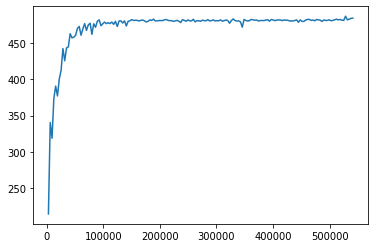

Train:483.682
Train:484.728
Train:481.802
Train:483.891
Train:484.044
Train:485.288
Train:484.709
Train:486.532
Train:485.953
Train:484.391
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000180/checkpoint-180


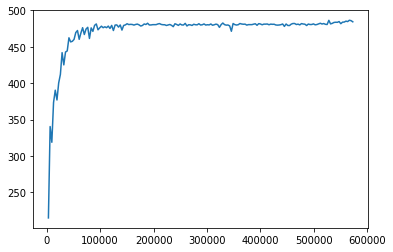

Train:486.532
Train:483.1
Train:487.197
Train:487.24
Train:485.91
Train:487.197
Train:487.24
Train:487.197
Train:487.24
Train:487.24
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000190/checkpoint-190


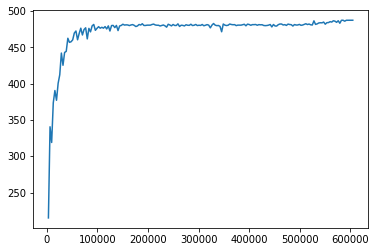

Train:487.327
Train:486.618
Train:487.283
Train:487.327
Train:487.283
Train:487.24
Train:485.144
Train:487.283
Train:487.283
Train:487.283
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000200/checkpoint-200


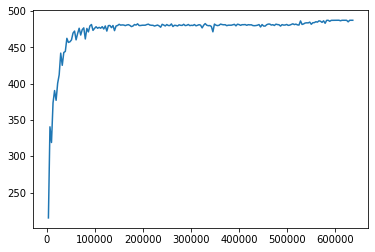

Train:487.283
Train:487.283
Train:487.154
Train:487.283
Train:487.154
Train:487.197
Train:487.197
Train:487.24
Train:487.197
Train:487.327
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000210/checkpoint-210


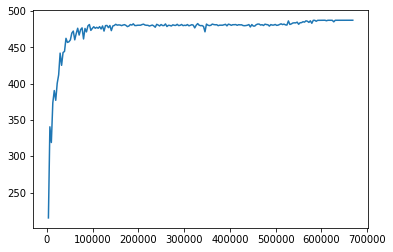

Train:487.24
Train:487.197
Train:487.327
Train:487.283
Train:487.154
Train:487.327
Train:487.197
Train:487.197
Train:487.24
Train:487.283
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000220/checkpoint-220


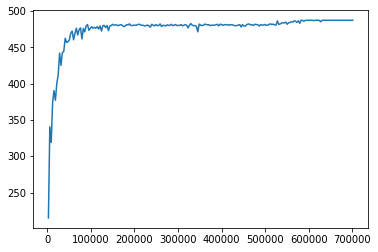

Train:487.283
Train:487.327
Train:487.283
Train:487.283
Train:487.197
Train:484.832
Train:487.24
Train:487.24
Train:487.283
Train:487.327
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000230/checkpoint-230


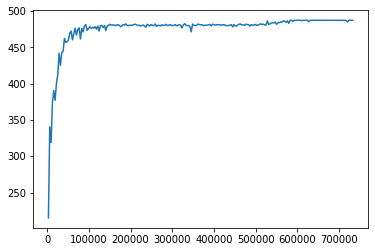

Train:487.24
Train:487.197
Train:487.426
Train:487.197
Train:487.24
Train:487.197
Train:479.309
Train:487.327
Train:487.24
Train:487.327
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000240/checkpoint-240


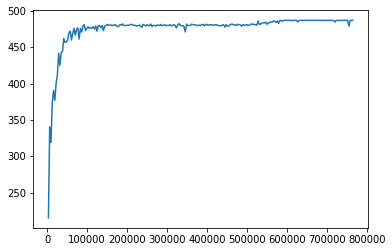

Train:487.24
Train:487.327
Train:487.283
Train:487.24
Train:487.327
Train:487.154
Train:487.24
Train:487.24
Train:487.24
Train:487.24
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000250/checkpoint-250


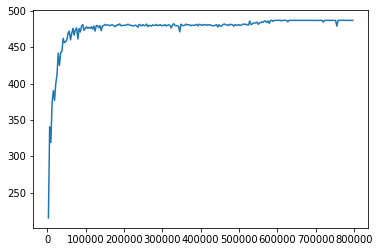

Train:487.383
Train:479.266
Train:484.121
Train:487.24
Train:487.283
Train:487.327
Train:487.283
Train:487.37
Train:487.283
Train:487.197
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000260/checkpoint-260


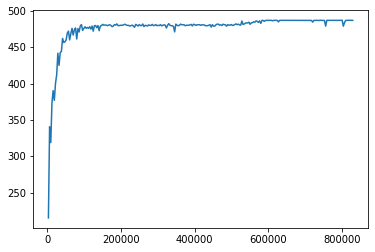

Train:487.327
Train:487.24
Train:487.24
Train:487.327
Train:487.24
Train:487.24
Train:486.4
Train:486.086
Train:476.63
Train:487.283
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000270/checkpoint-270


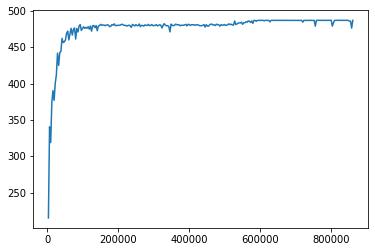

Train:487.327
Train:483.869
Train:487.24
Train:484.555
Train:484.703
Train:487.197
Train:487.197
Train:487.24
Train:487.37
Train:483.649
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000280/checkpoint-280


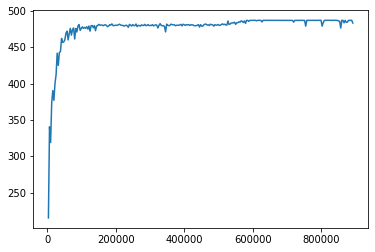

Train:487.197
Train:487.327
Train:487.24
Train:487.24
Train:487.283
Train:487.37
Train:487.24
Train:487.197
Train:483.317
Train:487.197
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000290/checkpoint-290


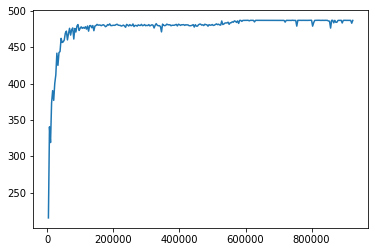

Train:487.197
Train:487.283
Train:487.197
Train:487.24
Train:487.24
Train:487.283
Train:485.534
Train:487.24
Train:487.24
Train:487.24
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000300/checkpoint-300


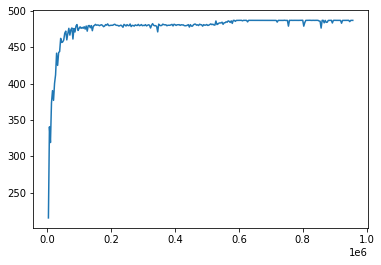

Train:487.24
Train:487.102
Train:487.283
Train:483.156
Train:481.304
Train:487.327
Train:481.986
Train:486.486
Train:487.283
Train:487.24
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000310/checkpoint-310


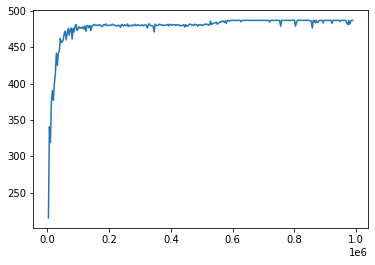

Train:487.24
Train:487.102
Train:487.24
Train:487.283
Train:483.452
Train:487.283
Train:487.24
Train:487.327
Train:487.197
Train:487.283
/home/mbyx3tk2/ray_results/PPO_CropEnv_2021-10-20_06-55-17n6cgeko9/checkpoint_000320/checkpoint-320


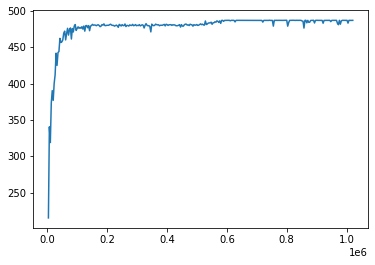

In [14]:

for tom in range(71,101):
    ray.init(num_cpus=8, ignore_reinit_error=True, log_to_driver=False)    
    proftrain=[]
    timesteps=[]
    agent = PPOTrainer(config, return_cropenv(tom))

    for i in range(1,50001):
        
#         class SingleCropEnv(CropEnv):
 
#             def __init__(self,chosen_year=tom):
#                 super(CropEnv, self).__init__()    # Define action and observation space
#                 self.chosen_year=chosen_year


        result = agent.train()

        #print(pretty_print(result))

        if i%10==0:
            checkpoint_path = agent.save()
            print(checkpoint_path)
            # trained_config = config.copy()
            # test_agent =ppo PPOTrainer(trained_config, CropEnv)
            # test_agent.restore(checkpoint_path)
            result_df = pd.DataFrame([timesteps,proftrain]).T
            result_df.to_csv(f'potential_results/ppo70_{tom}_day7_smt_dayshift_noforecast.csv')
            plt.plot(timesteps,proftrain)
            plt.show()
            if timesteps[-1]>=1_000_000:
                ray.shutdown()
                break

        evaluate_crop_single(agent,result['timesteps_total'],tom)

In [ ]:
# for i in range(1,50001):
#     result = agent.train()

#     #print(pretty_print(result))

#     if i%10==0:
#         checkpoint_path = agent.save()
#         print(checkpoint_path)
#         # trained_config = config.copy()
#         # test_agent =ppo PPOTrainer(trained_config, CropEnv)
#         # test_agent.restore(checkpoint_path)
#         result_df = pd.DataFrame([timesteps,proftrain,proftest]).T
#         result_df.to_csv('ppo70lstm_rllib_day3_4layer_smt_dayshift_noforecast_continue.csv')
#         plt.plot(timesteps,proftrain)
#         plt.plot(timesteps,proftest)
#         plt.show()
#         if timesteps[-1]>=20_000_000:
#             break

#     evaluate_crop(agent,result['timesteps_total'])